# Evaluating the Impact of Undersampling Techniques on Imbalanced Healthcare Data: A Case Study on Stroke Prediction


##1.Problem Definition

In healthcare, predictive models can significantly improve patient outcomes by enabling early intervention and personalized treatment plans. However, many healthcare datasets, such as those predicting stroke occurrences, suffer from class imbalance. This study evaluates the effectiveness of various undersampling techniques on an imbalanced healthcare dataset related to stroke prediction.

Many healthcare datasets are imbalanced, leading to biased models that perform poorly in identifying the minority class. This study aims to:

## Objectives

1. **Assess Model Performance on Imbalanced Data:**
   Understand model performance when trained on imbalanced data without adjustments.

2. **Implement Undersampling Techniques:**
   Apply various undersampling methods to balance the dataset.

### Undersampling Techniques

#### 1. Prototype Generation
- **Cluster Centroids:** Reduces the dataset by synthesizing centroids from clusters using K-means, rather than selecting individual samples.

#### 2. Prototype Selection

##### Controlled Undersampling Techniques
- **Random Undersampling:** Randomly selects a subset of data from the targeted classes.
- **NearMiss:** Uses three different rules based on nearest neighbors to select samples:
  - **NearMiss-1:** Chooses samples with the smallest average distance to the closest samples of the minority class.
  - **NearMiss-2:** Chooses samples with the smallest average distance to the farthest samples of the minority class.
  - **NearMiss-3:** Keeps samples based on a two-step nearest-neighbor selection process.

##### Cleaning Undersampling Techniques
- **Tomek Links:** Removes pairs of samples from different classes that are each other's closest neighbors.
- **Edited Nearest Neighbors (ENN):** Removes majority samples if any or most neighbors belong to a different class.
- **Repeated Edited Nearest Neighbors (RENN):** Extends ENN by repeating the process multiple times.
- **All KNN:** Increases the neighborhood size in each iteration of ENN to progressively clean the dataset.
- **Condensed Nearest Neighbor (CNN):** Adds samples that are difficult to classify based on a 1-nearest neighbor rule.
- **One-Sided Selection (OSS):** Combines CNN and Tomek Links to remove noisy or difficult-to-classify majority samples.
- **Neighborhood Cleaning Rule (NCR):** Uses a combination of ENN and nearest-neighbor classification to remove noisy samples.

#### 3. Additional Undersampling Techniques
- **Instance Hardness Threshold:** Retains samples that are easier to classify by removing instances classified with low probability, based on a specified classifier.

3. **Comparative Analysis:**
   Compare model performance on original vs. undersampled datasets using metrics such as accuracy, precision, recall, F1-score, and AUC-ROC.

4. **Insights and Recommendations:**
   Identify which undersampling techniques yield the most significant improvements and provide recommendations for handling class imbalance in similar datasets.

---

By addressing class imbalance through these techniques, this study aims to enhance model accuracy and reliability, particularly in identifying minority class instances in healthcare prediction tasks.


##2.Dataset

The dataset used in this project contains information necessary to predict the occurrence of a stroke. Each row in the dataset represents a patient, and the dataset includes the following attributes:

- **id:** Unique identifier
- **gender:** "Male", "Female", or "Other"
- **age:** Age of the patient
- **hypertension:** 0 if the patient doesn't have hypertension, 1 if the patient has hypertension
- **heart_disease:** 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease
- **ever_married:** "No" or "Yes"
- **work_type:** "Children", "Govt_job", "Never_worked", "Private", or "Self-employed"
- **Residence_type:** "Rural" or "Urban"
- **avg_glucose_level:** Average glucose level in the blood
- **bmi:** Body mass index
- **smoking_status:** "Formerly smoked", "Never smoked", "Smokes", or "Unknown"
- **stroke:** 1 if the patient had a stroke, 0 if not

##3.Data Inspecting and Preprocessing

In [2]:
# Install necessary libraries
!pip install -U imbalanced-learn
!pip install -U scikit-learn


In [3]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.0 MB/s eta 0:00:00


In [4]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from imblearn.under_sampling import (
    RandomUnderSampler, ClusterCentroids, NearMiss, TomekLinks,
    EditedNearestNeighbours, RepeatedEditedNearestNeighbours,
    AllKNN, CondensedNearestNeighbour, OneSidedSelection,
    NeighbourhoodCleaningRule, InstanceHardnessThreshold
)
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from collections import Counter

In [5]:
from google.colab import files
uploaded = files.upload()

Saving healthcare-dataset-stroke-data.csv to healthcare-dataset-stroke-data.csv


In [6]:
# Load DefaultCreditCardClients.xls
import pandas as pd
file_path = 'healthcare-dataset-stroke-data.csv'
data = pd.read_csv(file_path)
display(data.head())

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [7]:
# Check the shape of the dataset (#Rows, #Columns)
print("Shape of the dataset:")
print(data.shape)

Shape of the dataset:
(5110, 12)


In [8]:
# Check Dataset Information
print("Dataset Information:")
print(data.info)

Dataset Information:
<bound method DataFrame.info of          id  gender   age  hypertension  heart_disease ever_married  \
0      9046    Male  67.0             0              1          Yes   
1     51676  Female  61.0             0              0          Yes   
2     31112    Male  80.0             0              1          Yes   
3     60182  Female  49.0             0              0          Yes   
4      1665  Female  79.0             1              0          Yes   
...     ...     ...   ...           ...            ...          ...   
5105  18234  Female  80.0             1              0          Yes   
5106  44873  Female  81.0             0              0          Yes   
5107  19723  Female  35.0             0              0          Yes   
5108  37544    Male  51.0             0              0          Yes   
5109  44679  Female  44.0             0              0          Yes   

          work_type Residence_type  avg_glucose_level   bmi   smoking_status  \
0           Pr

In [9]:
print("\nSummary Statistics:")
data.describe().T


Summary Statistics:


,count,mean,std,min,25%,50%,75%,max
id,5110.0,36517.829354,21161.721625,67.00,17741.250,36932.000,54682.00,72940.00
age,5110.0,43.226614,22.612647,0.08,25.000,45.000,61.00,82.00
hypertension,5110.0,0.097456,0.296607,0.00,0.000,0.000,0.00,1.00
heart_disease,5110.0,0.054012,0.226063,0.00,0.000,0.000,0.00,1.00
avg_glucose_level,5110.0,106.147677,45.283560,55.12,77.245,91.885,114.09,271.74
bmi,4909.0,28.893237,7.854067,10.30,23.500,28.100,33.10,97.60
stroke,5110.0,0.048728,0.215320,0.00,0.000,0.000,0.00,1.00


In [10]:
# Check for missing values
print("\nMissing Values:")
print(data.isnull().sum())


Missing Values:
id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64


In [11]:
# Fill missing BMI values with the mean
data['bmi'].fillna(data['bmi'].mean(), inplace=True)

In [12]:
# Check any duplicated values
print("\nDuplicated Values:")
print(data.duplicated().sum())


Duplicated Values:
0


In [13]:
# Analyze the distribution of the target variable
print("\nTarget Variable Distribution (stroke):")
print(data['stroke'].value_counts())


Target Variable Distribution (stroke):
stroke
0    4861
1     249
Name: count, dtype: int64


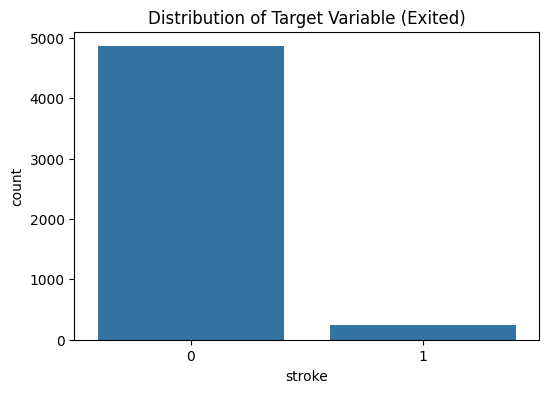

In [14]:
# Visualize the target variable distribution
plt.figure(figsize=(6, 4))
sns.countplot(x='stroke', data=data)
plt.title('Distribution of Target Variable (Exited)')
plt.show()

In [15]:
# Check datatypes
data.dtypes

,0
id,int64
gender,object
age,float64
hypertension,int64
heart_disease,int64
ever_married,object
work_type,object
Residence_type,object
avg_glucose_level,float64
bmi,float64


In [16]:
data['age'].astype(int)

,age
0,67
1,61
2,80
3,49
4,79
...,...
5105,80
5106,81
5107,35
5108,51


In [17]:
print(data['ever_married'].value_counts())

ever_married
Yes    3353
No     1757
Name: count, dtype: int64


In [18]:
print(data['work_type'].value_counts())

work_type
Private          2925
Self-employed     819
children          687
Govt_job          657
Never_worked       22
Name: count, dtype: int64


In [19]:
print(data['gender'].value_counts())

gender
Female    2994
Male      2115
Other        1
Name: count, dtype: int64


In [20]:
print(data['Residence_type'].value_counts())

Residence_type
Urban    2596
Rural    2514
Name: count, dtype: int64


In [21]:
print(data['smoking_status'].value_counts())

smoking_status
never smoked       1892
Unknown            1544
formerly smoked     885
smokes              789
Name: count, dtype: int64


In [22]:
# Encode categorical variables
label_encoder = LabelEncoder()
data['gender'] = label_encoder.fit_transform(data['gender'])
data['ever_married'] = label_encoder.fit_transform(data['ever_married'])
data['work_type'] = label_encoder.fit_transform(data['work_type'])
data['Residence_type'] = label_encoder.fit_transform(data['Residence_type'])
data['smoking_status'] = label_encoder.fit_transform(data['smoking_status'])


##4.Exploratory Data Analysis

###Correlation matrix

In [23]:
# Correlation matrix
print("\nCorrelation matrix:")
data.corr()


Correlation matrix:


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
id,1.000000,0.002511,0.003538,0.003550,-0.001296,0.013690,-0.015757,-0.001403,0.001092,0.002999,0.014074,0.006388
gender,0.002511,1.000000,-0.028202,0.020994,0.085447,-0.031005,0.056422,-0.006738,0.055180,-0.026109,-0.062581,0.008929
age,0.003538,-0.028202,1.000000,0.276398,0.263796,0.679125,-0.361642,0.014180,0.238171,0.325942,0.265199,0.245257
hypertension,0.003550,0.020994,0.276398,1.000000,0.108306,0.164243,-0.051761,-0.007913,0.174474,0.160189,0.111038,0.127904
heart_disease,-0.001296,0.085447,0.263796,0.108306,1.000000,0.114644,-0.028023,0.003092,0.161857,0.038899,0.048460,0.134914
ever_married,0.013690,-0.031005,0.679125,0.164243,0.114644,1.000000,-0.352722,0.006261,0.155068,0.335705,0.259647,0.108340
work_type,-0.015757,0.056422,-0.361642,-0.051761,-0.028023,-0.352722,1.000000,-0.007316,-0.050513,-0.299448,-0.305927,-0.032316
Residence_type,-0.001403,-0.006738,0.014180,-0.007913,0.003092,0.006261,-0.007316,1.000000,-0.004946,-0.000120,0.008237,0.015458
avg_glucose_level,0.001092,0.055180,0.238171,0.174474,0.161857,0.155068,-0.050513,-0.004946,1.000000,0.168751,0.063437,0.131945
bmi,0.002999,-0.026109,0.325942,0.160189,0.038899,0.335705,-0.299448,-0.000120,0.168751,1.000000,0.219148,0.038947


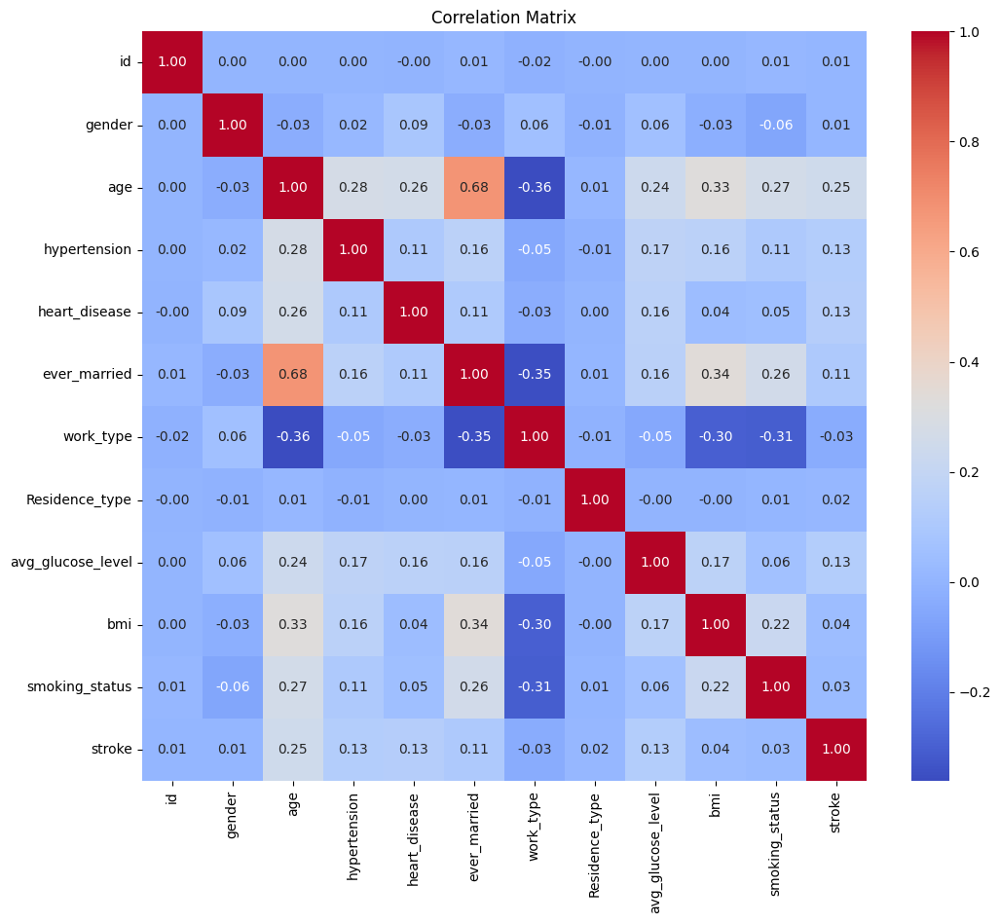

In [24]:
# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

###Distribution of numerical features

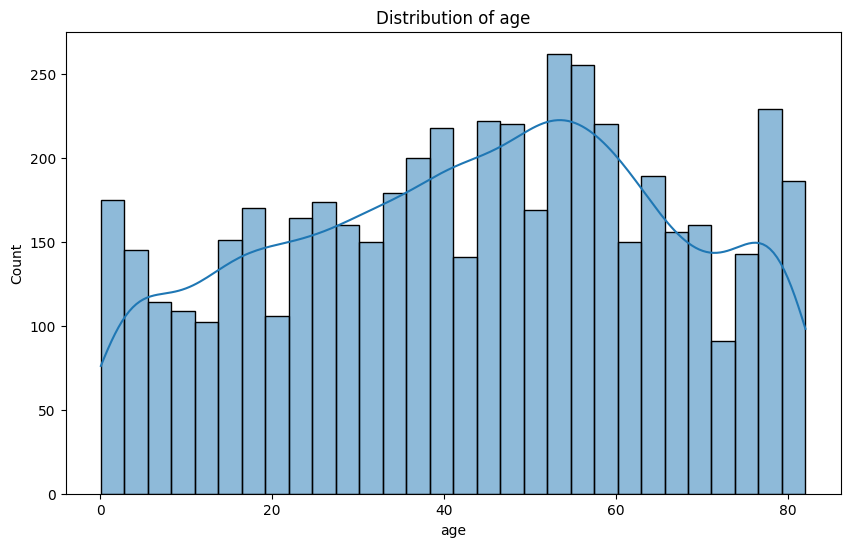

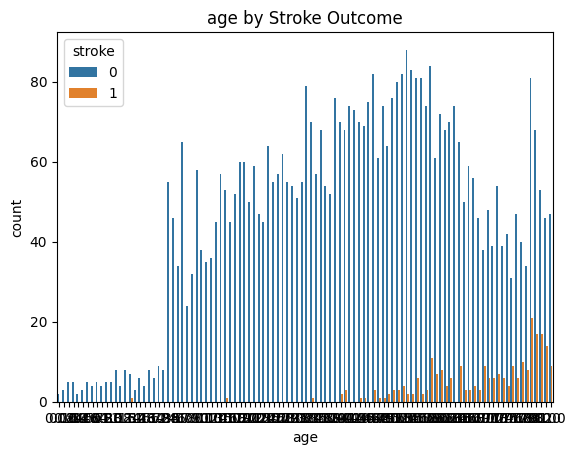

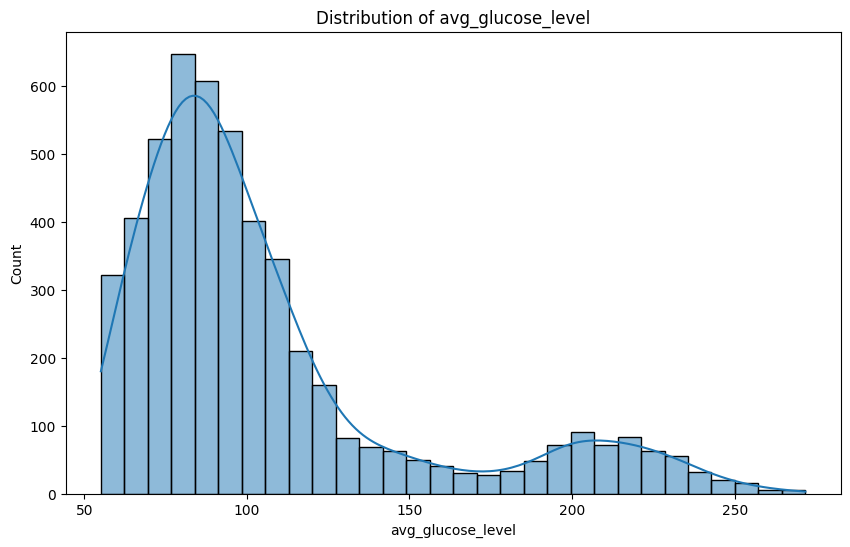

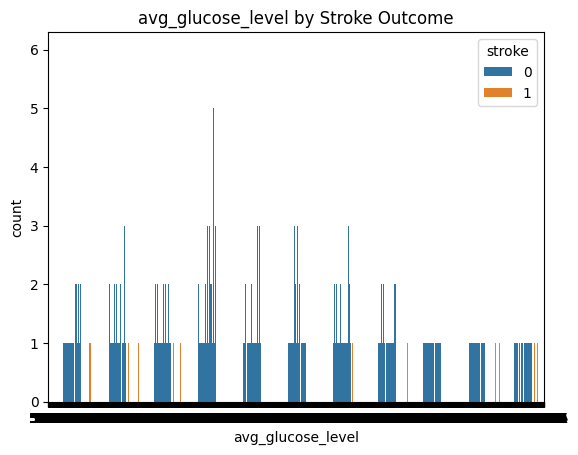

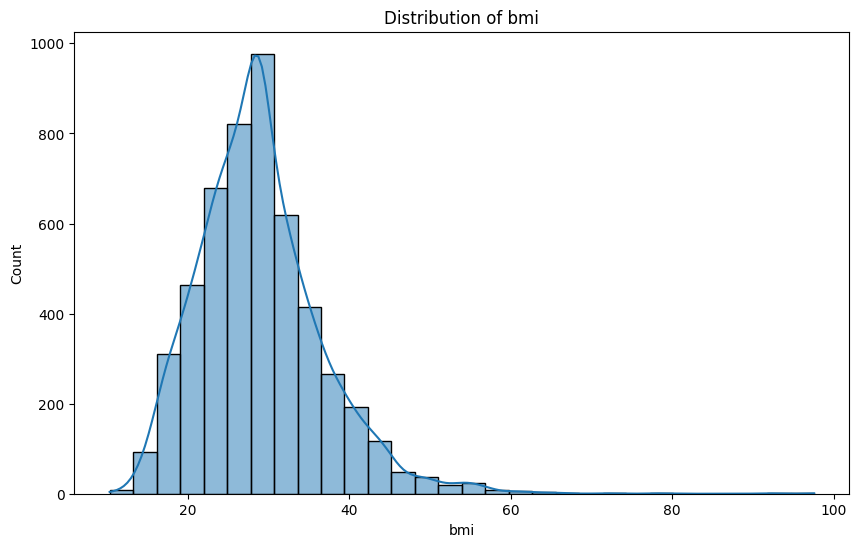

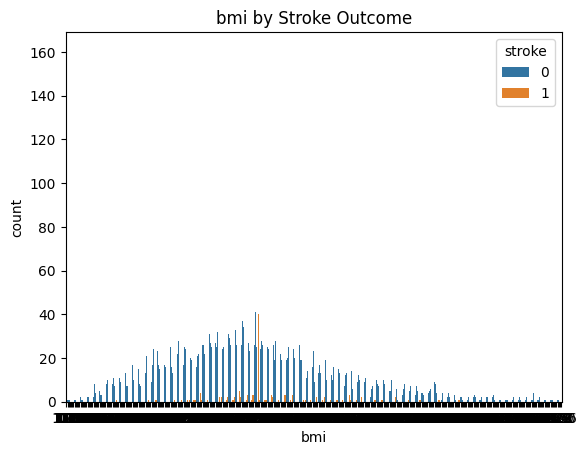

In [25]:
# Distribution of numerical features
numerical_features = ['age', 'avg_glucose_level', 'bmi']
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(data[feature], kde=True, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.show()
    sns.countplot(x=feature, hue='stroke', data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()

### Box plots of numerical features by stroke outcome

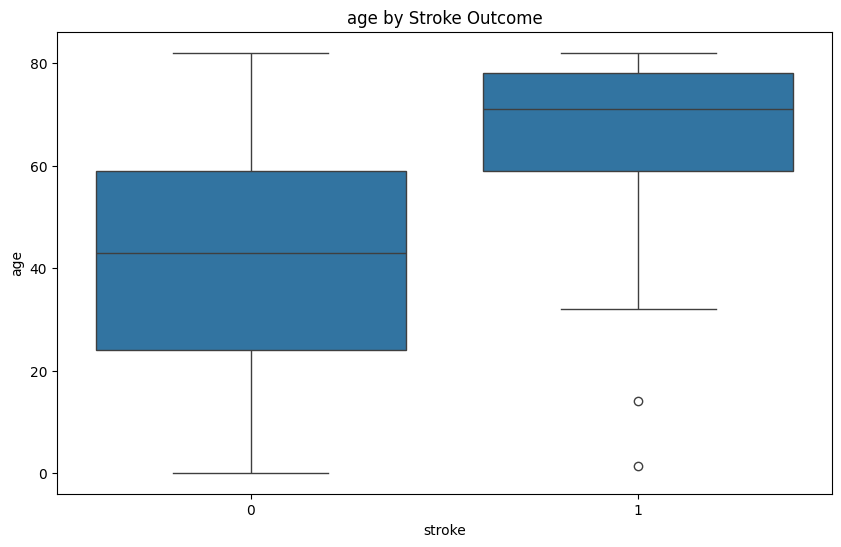

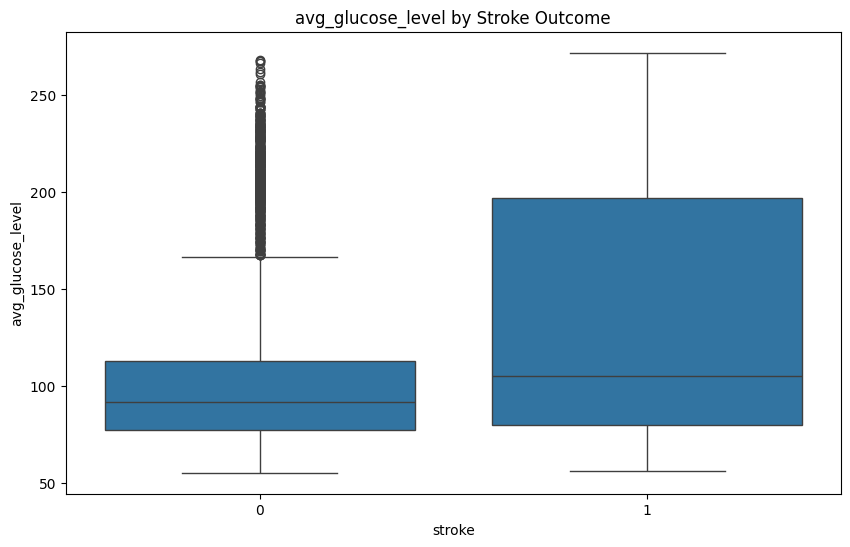

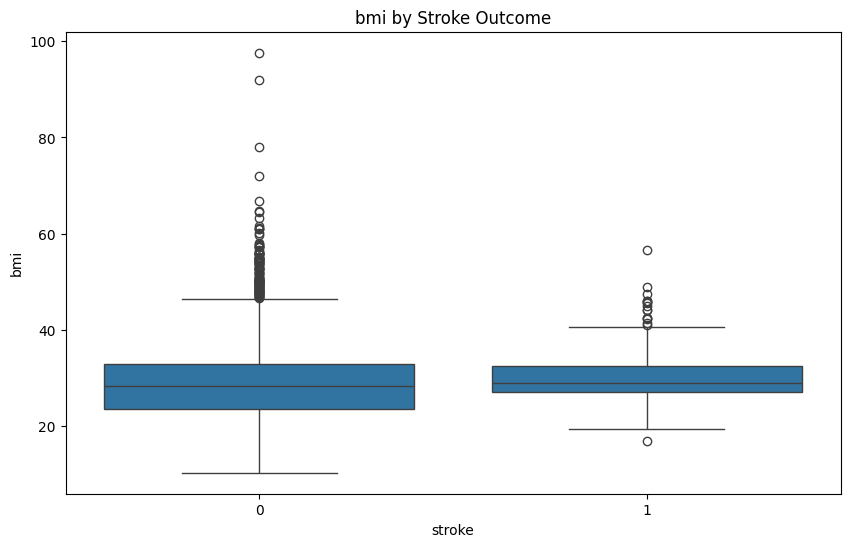

In [26]:
# Box plots of numerical features by stroke outcome
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='stroke', y=feature, data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()

###Count plots of categorical features

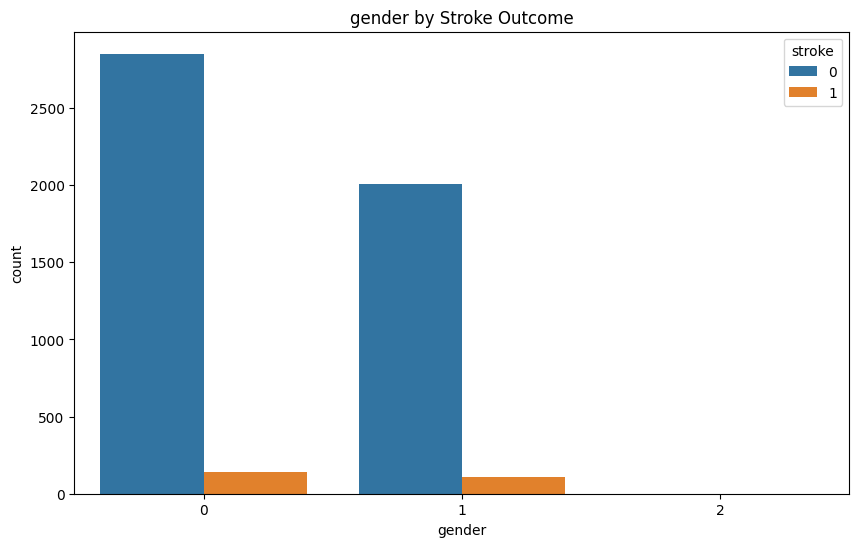

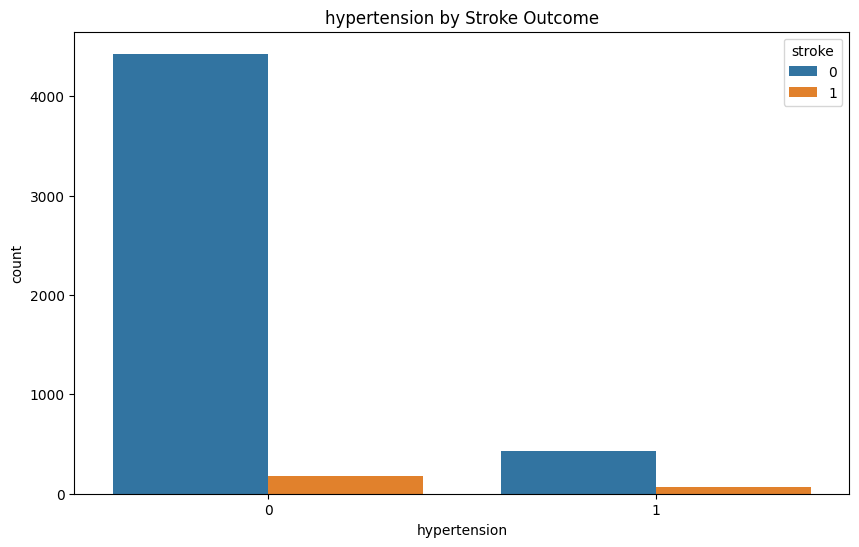

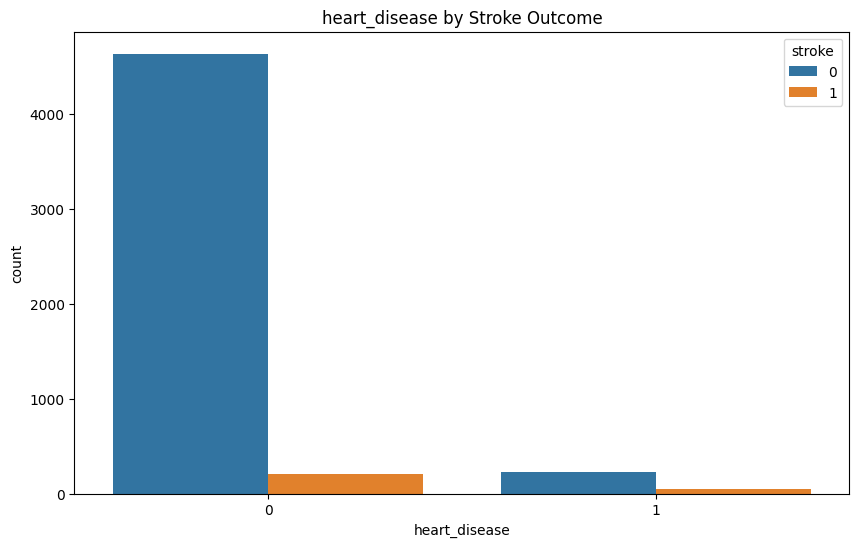

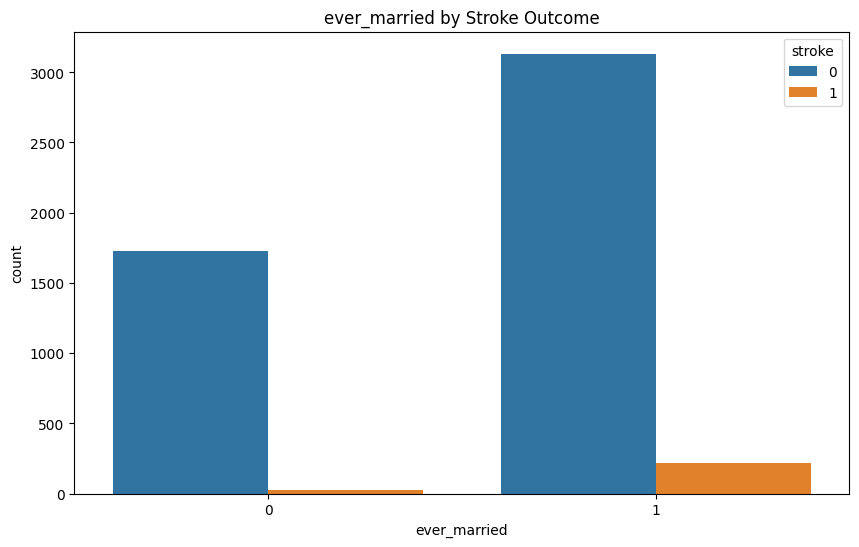

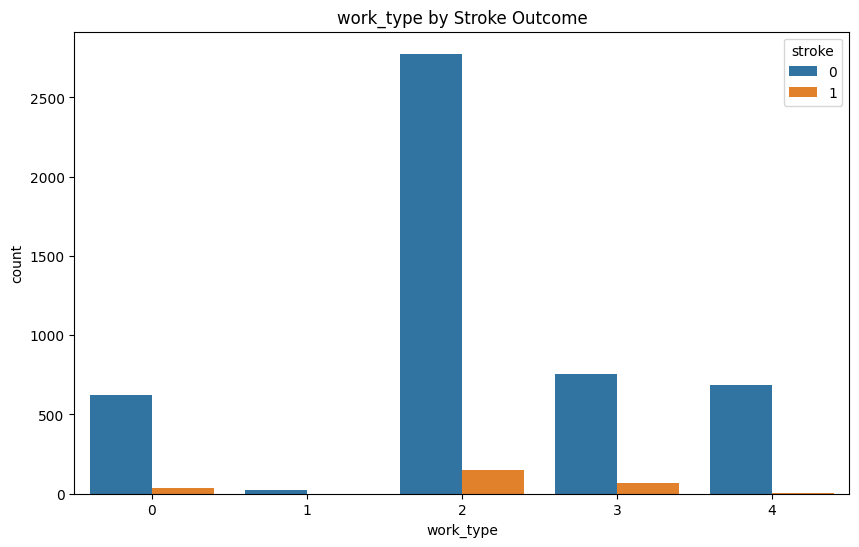

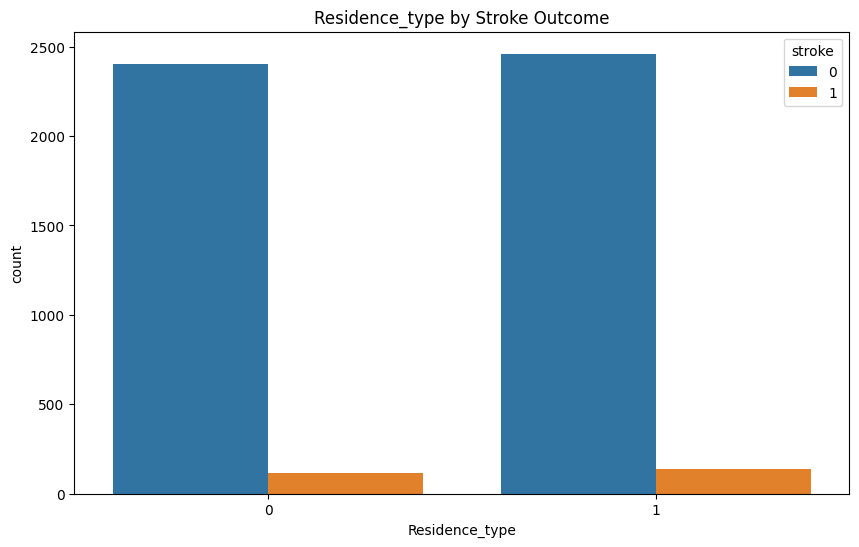

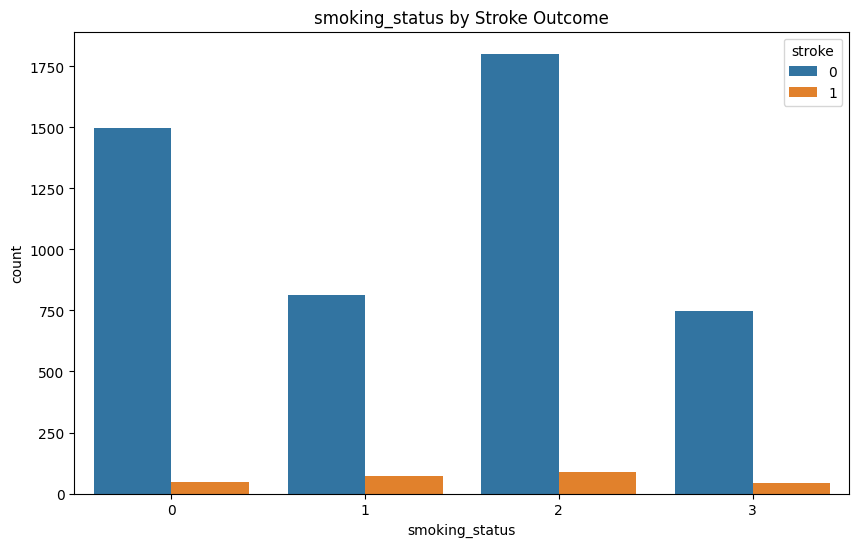

In [27]:
# Count plots of categorical features
categorical_features = ['gender', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=feature, hue='stroke', data=data)
    plt.title(f'{feature} by Stroke Outcome')
    plt.show()


##5.Training the model

In [28]:
# Split the data into features and target variable
X = data.drop(['id', 'stroke'], axis=1)
y = data['stroke']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [29]:
# Define undersampling techniques
undersampling_techniques = {
    "ClusterCentroids": ClusterCentroids(random_state=0),
    "RandomUnderSampler": RandomUnderSampler(random_state=0),
    "NearMiss-1": NearMiss(version=1),
    "NearMiss-2": NearMiss(version=2),
    "NearMiss-3": NearMiss(version=3),
    "TomekLinks": TomekLinks(),
    "EditedNearestNeighbours": EditedNearestNeighbours(),
    "RepeatedEditedNearestNeighbours": RepeatedEditedNearestNeighbours(),
    "AllKNN": AllKNN(),
    "CondensedNearestNeighbour": CondensedNearestNeighbour(random_state=0),
    "OneSidedSelection": OneSidedSelection(random_state=0),
    "NeighbourhoodCleaningRule": NeighbourhoodCleaningRule(),
    "InstanceHardnessThreshold": InstanceHardnessThreshold(random_state=0, estimator=LogisticRegression())
}

# Define models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Random Forest": RandomForestClassifier(random_state=0),
    "SVM": SVC(probability=True, random_state=0),
    "Gradient Boosting": GradientBoostingClassifier(random_state=0),
    "AdaBoost": AdaBoostClassifier(random_state=0),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=0),
    "LightGBM": LGBMClassifier(random_state=0),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=0),
    "k-Nearest Neighbors": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=0),
    "Naive Bayes": GaussianNB(),
    "Linear Discriminant Analysis": LinearDiscriminantAnalysis(),
    "Quadratic Discriminant Analysis": QuadraticDiscriminantAnalysis(),
    "Extra Trees": ExtraTreesClassifier(random_state=0)
}

##6.Evaluating the model



###Models on imbalanced data


Evaluating models on imbalanced data

Model: Logistic Regression on imbalanced data
Accuracy: 0.9393346379647749
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
ROC AUC Score: 0.8513272849462366
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022



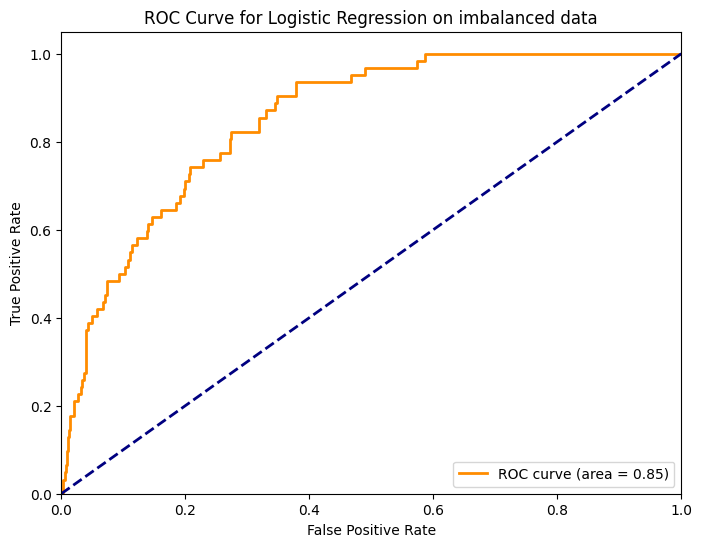

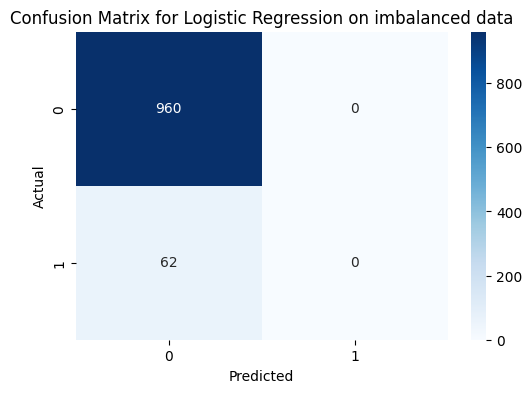


Model: Random Forest on imbalanced data
Accuracy: 0.9383561643835616
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
ROC AUC Score: 0.7796034946236559
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022



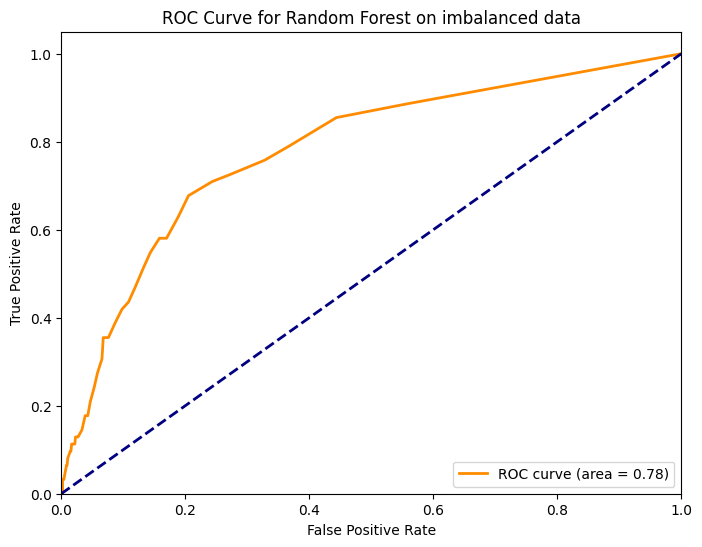

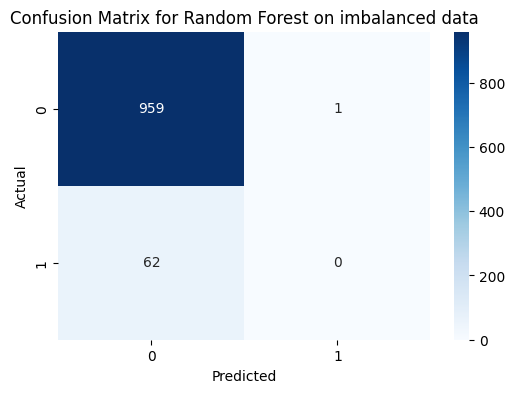


Model: SVM on imbalanced data
Accuracy: 0.9393346379647749
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
ROC AUC Score: 0.6284946236559139
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022



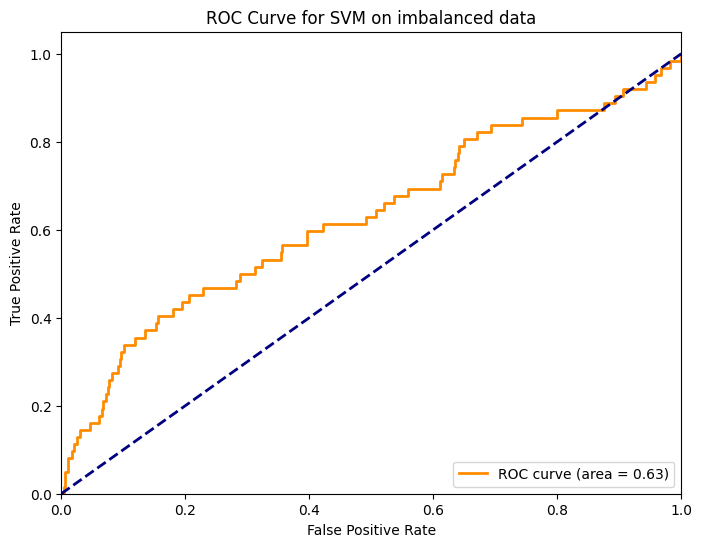

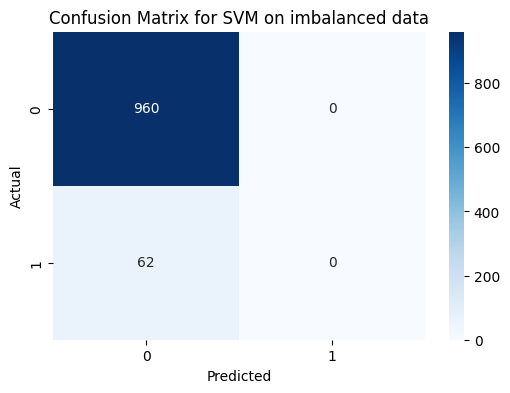


Model: Gradient Boosting on imbalanced data
Accuracy: 0.9393346379647749
Precision: 0.5
Recall: 0.016129032258064516
F1 Score: 0.03125
ROC AUC Score: 0.8357022849462366
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.50      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.72      0.51      0.50      1022
weighted avg       0.91      0.94      0.91      1022



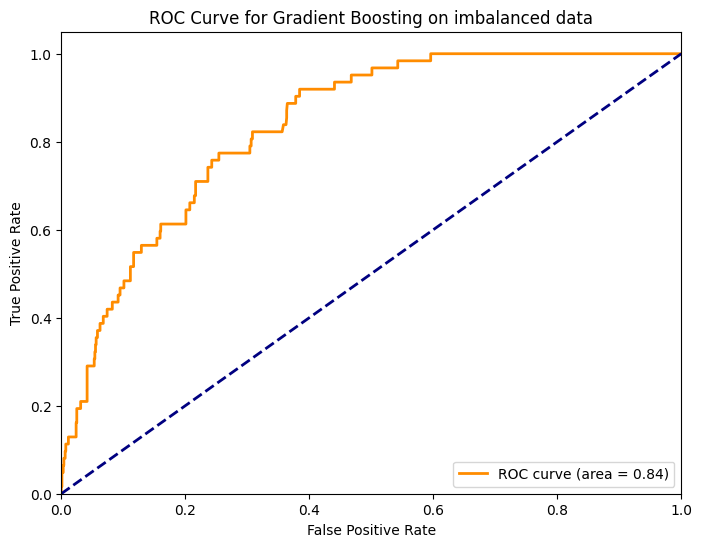

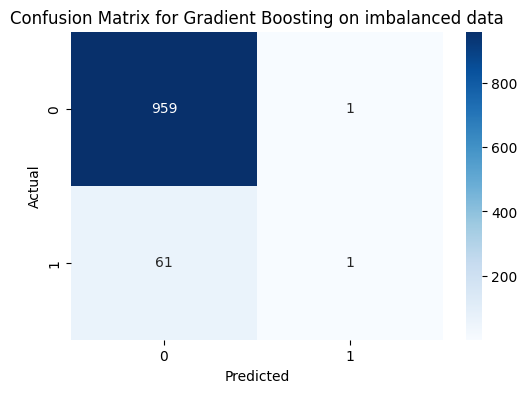


Model: AdaBoost on imbalanced data
Accuracy: 0.9373776908023483
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
ROC AUC Score: 0.7925487231182796
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022



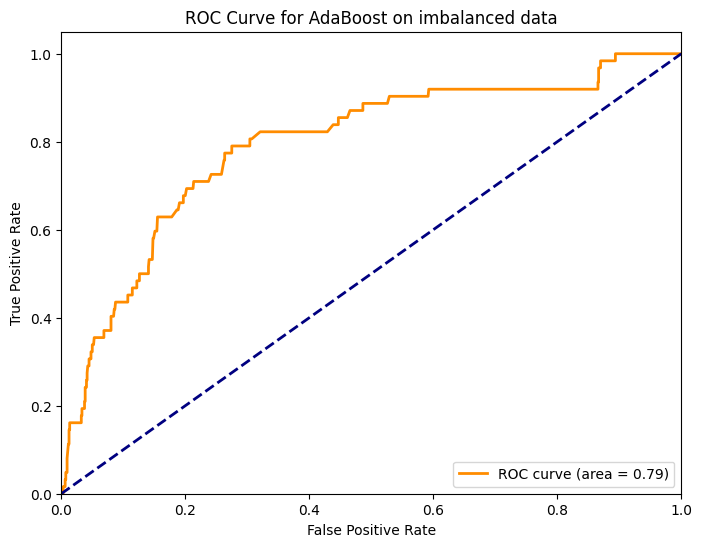

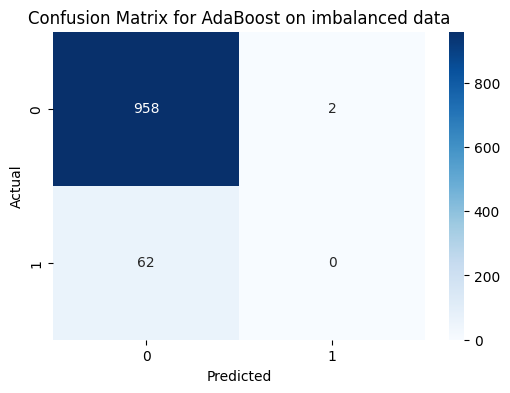


Model: XGBoost on imbalanced data
Accuracy: 0.9393346379647749
Precision: 0.5
Recall: 0.0967741935483871
F1 Score: 0.16216216216216217
ROC AUC Score: 0.796236559139785
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.50      0.10      0.16        62

    accuracy                           0.94      1022
   macro avg       0.72      0.55      0.57      1022
weighted avg       0.92      0.94      0.92      1022



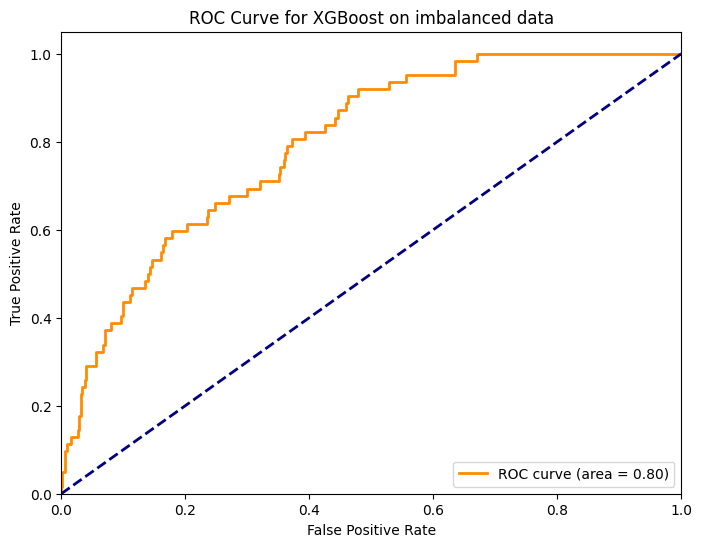

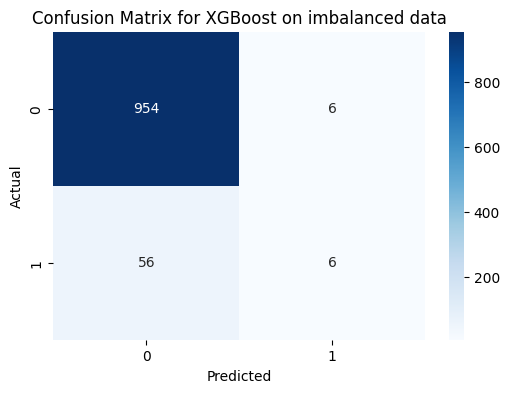

[LightGBM] [Info] Number of positive: 187, number of negative: 3901
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000377 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 4088, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.045744 -> initscore=-3.037880
[LightGBM] [Info] Start training from score -3.037880

Model: LightGBM on imbalanced data
Accuracy: 0.9354207436399217
Precision: 0.3333333333333333
Recall: 0.06451612903225806
F1 Score: 0.10810810810810811
ROC AUC Score: 0.8174395161290323
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.33      0.06      0.11        62

    accuracy                           0.94      1022
   macro avg      

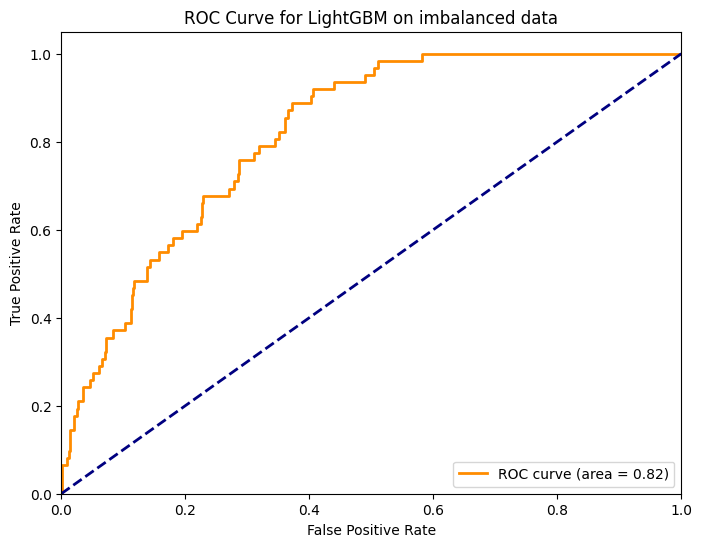

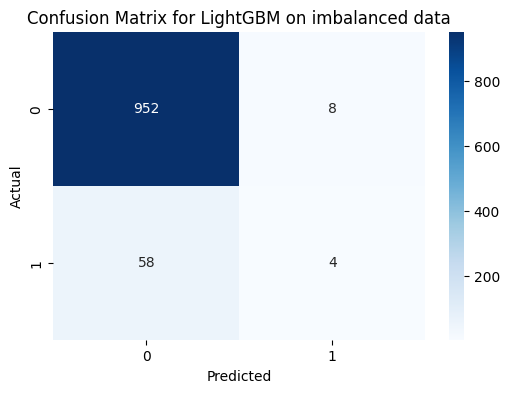


Model: CatBoost on imbalanced data
Accuracy: 0.9403131115459883
Precision: 0.6666666666666666
Recall: 0.03225806451612903
F1 Score: 0.06153846153846154
ROC AUC Score: 0.819388440860215
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.67      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.80      0.52      0.52      1022
weighted avg       0.92      0.94      0.91      1022



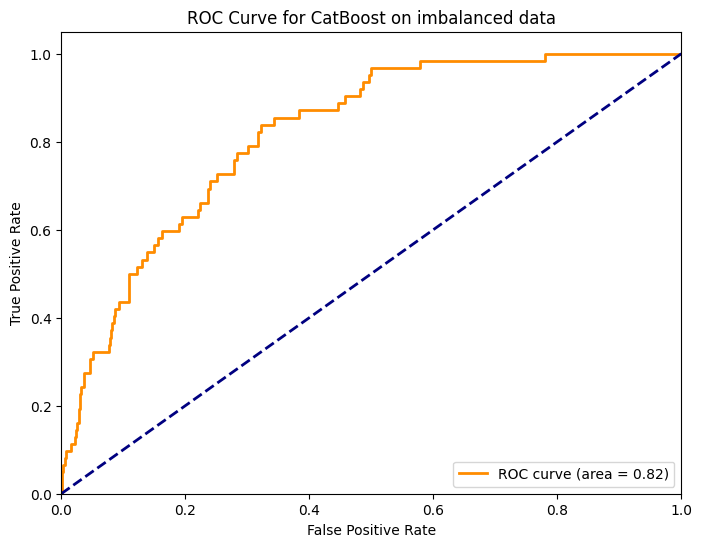

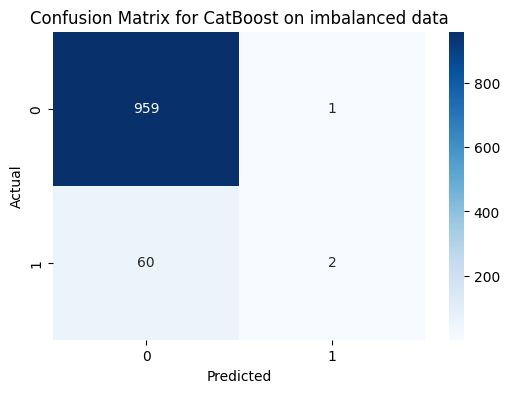


Model: k-Nearest Neighbors on imbalanced data
Accuracy: 0.9393346379647749
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
ROC AUC Score: 0.6474966397849462
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022



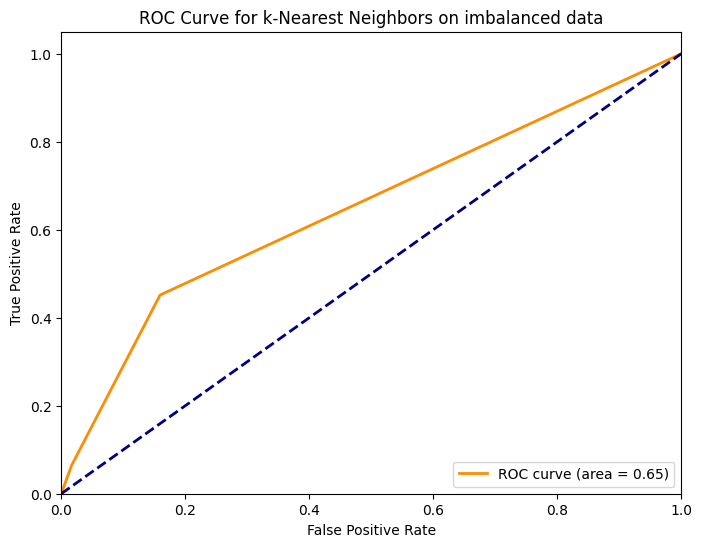

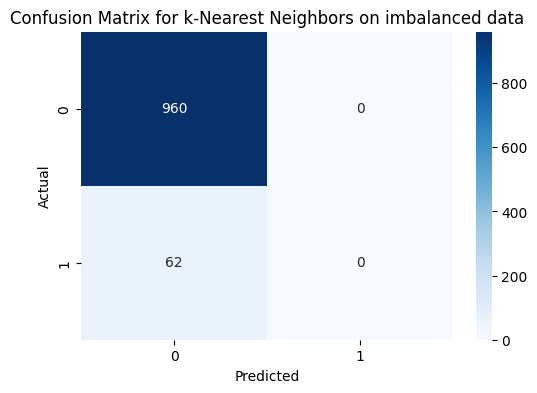


Model: Decision Tree on imbalanced data
Accuracy: 0.9129158512720157
Precision: 0.2127659574468085
Recall: 0.16129032258064516
F1 Score: 0.1834862385321101
ROC AUC Score: 0.5613743279569893
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.95       960
           1       0.21      0.16      0.18        62

    accuracy                           0.91      1022
   macro avg       0.58      0.56      0.57      1022
weighted avg       0.90      0.91      0.91      1022



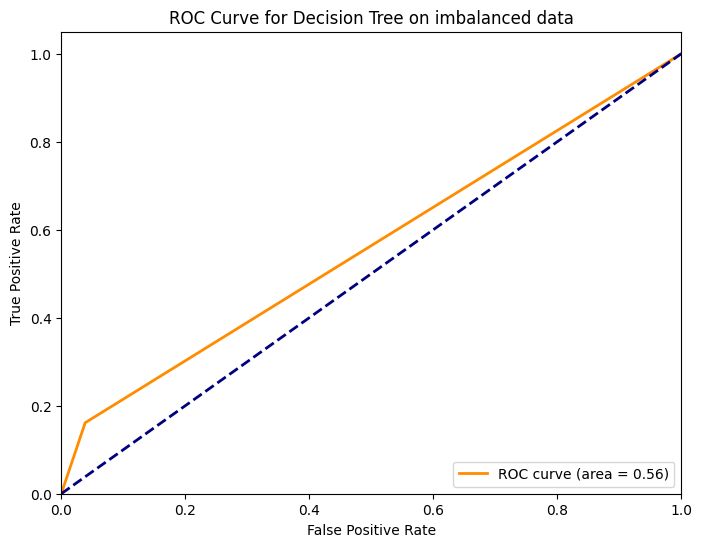

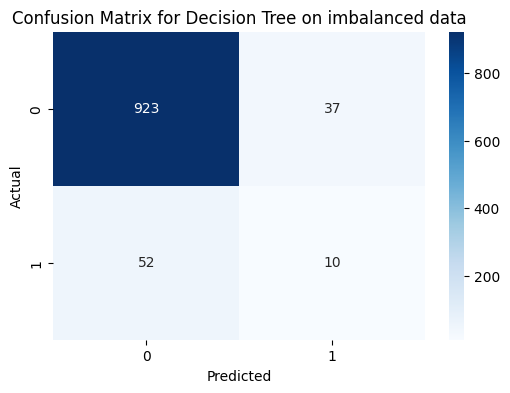


Model: Naive Bayes on imbalanced data
Accuracy: 0.8669275929549902
Precision: 0.2196969696969697
Recall: 0.46774193548387094
F1 Score: 0.29896907216494845
ROC AUC Score: 0.8288978494623656
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.93       960
           1       0.22      0.47      0.30        62

    accuracy                           0.87      1022
   macro avg       0.59      0.68      0.61      1022
weighted avg       0.92      0.87      0.89      1022



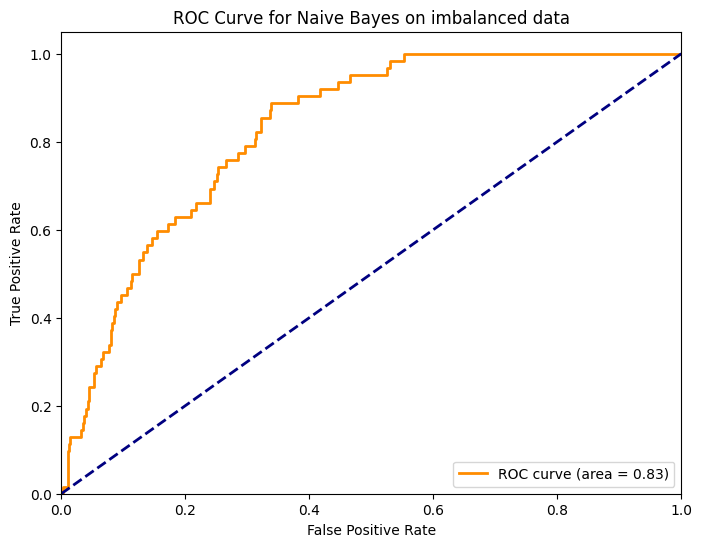

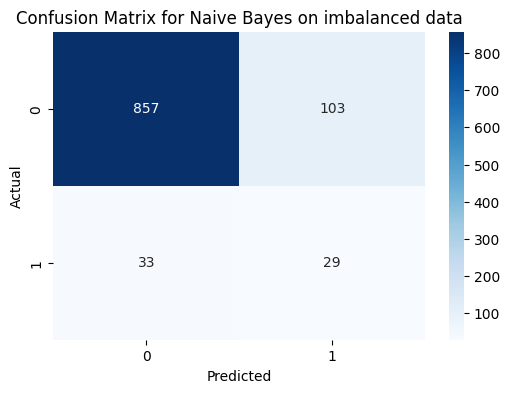


Model: Linear Discriminant Analysis on imbalanced data
Accuracy: 0.9344422700587084
Precision: 0.2727272727272727
Recall: 0.04838709677419355
F1 Score: 0.0821917808219178
ROC AUC Score: 0.8416666666666666
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.27      0.05      0.08        62

    accuracy                           0.93      1022
   macro avg       0.61      0.52      0.52      1022
weighted avg       0.90      0.93      0.91      1022



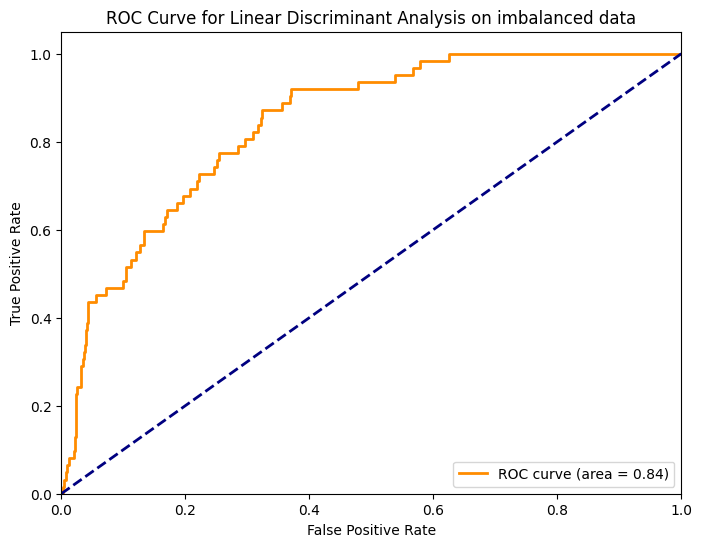

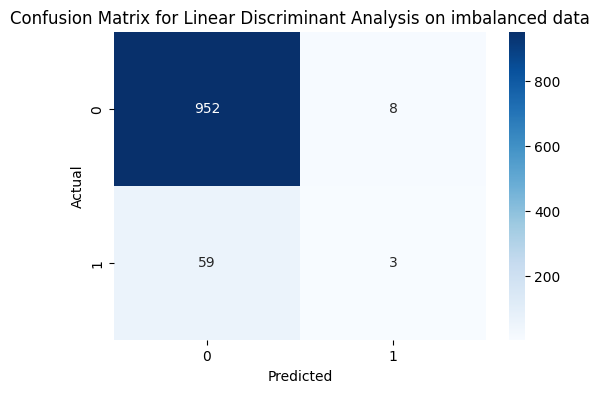


Model: Quadratic Discriminant Analysis on imbalanced data
Accuracy: 0.8796477495107632
Precision: 0.23931623931623933
Recall: 0.45161290322580644
F1 Score: 0.3128491620111732
ROC AUC Score: 0.8301243279569893
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.91      0.93       960
           1       0.24      0.45      0.31        62

    accuracy                           0.88      1022
   macro avg       0.60      0.68      0.62      1022
weighted avg       0.92      0.88      0.90      1022



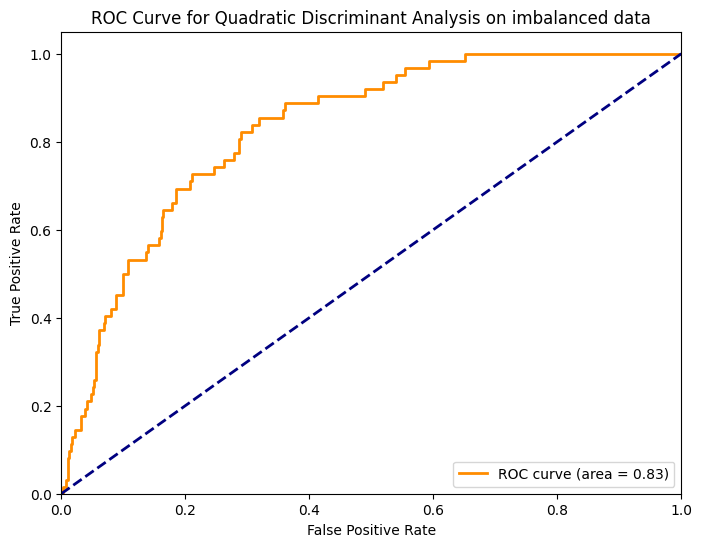

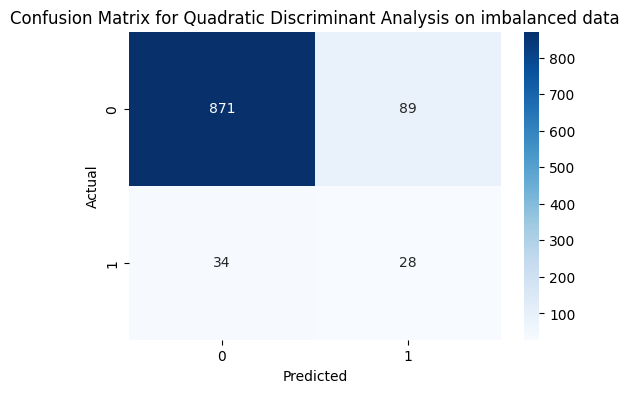


Model: Extra Trees on imbalanced data
Accuracy: 0.9363992172211351
Precision: 0.2857142857142857
Recall: 0.03225806451612903
F1 Score: 0.057971014492753624
ROC AUC Score: 0.7768229166666668
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.29      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.61      0.51      0.51      1022
weighted avg       0.90      0.94      0.91      1022



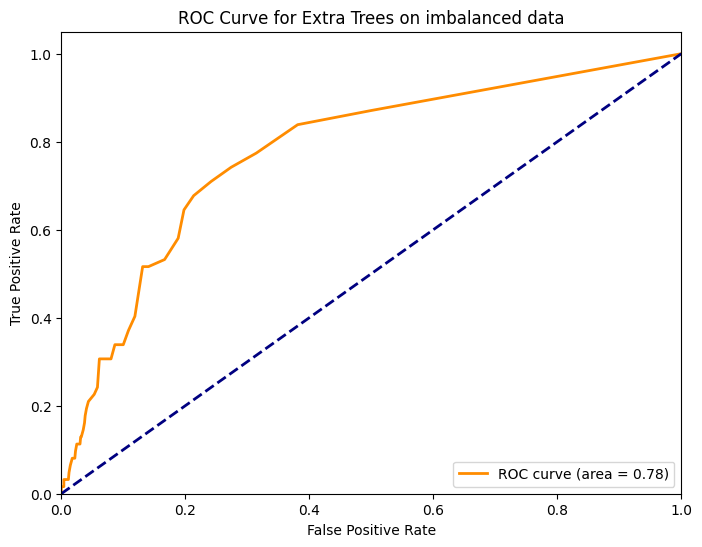

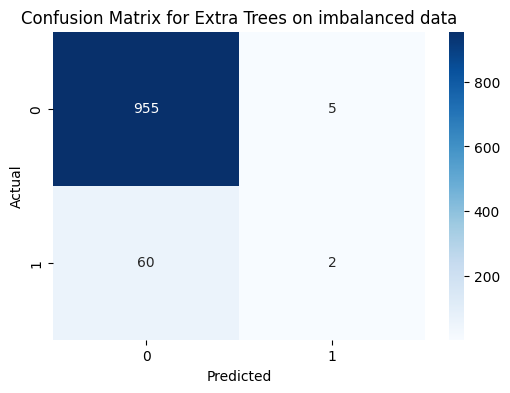

In [37]:
# Import necessary libraries
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve, auc, confusion_matrix

# Dictionary to store summary results
results = []

# Train and evaluate models on imbalanced data
print("\nEvaluating models on imbalanced data")
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    # Store metrics
    accuracy = accuracy_score(y_test, y_pred)
    classification_rep = classification_report(y_test, y_pred, output_dict=True)
    precision = classification_rep['1']['precision']  # Precision for the positive class
    recall = classification_rep['1']['recall']
    f1 = classification_rep['1']['f1-score']

    results.append({
        "Model": model_name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "ROC AUC Score": roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else None
    })

    # Display metrics for each model
    print(f"\nModel: {model_name} on imbalanced data")
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    if y_pred_proba is not None:
        print("ROC AUC Score:", roc_auc_score(y_test, y_pred_proba))

    # Display the full classification report
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Plot ROC Curve
    if y_pred_proba is not None:
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {auc(fpr, tpr):.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {model_name} on imbalanced data')
        plt.legend(loc="lower right")
        plt.show()

    # Plot Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for {model_name} on imbalanced data')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


### Undersampling techniques


Applying ClusterCentroids

Model: Logistic Regression after ClusterCentroids
Accuracy: 0.7436399217221135
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.74      0.85       960
           1       0.16      0.73      0.26        62

    accuracy                           0.74      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.74      0.81      1022

ROC AUC Score: 0.8312331989247312


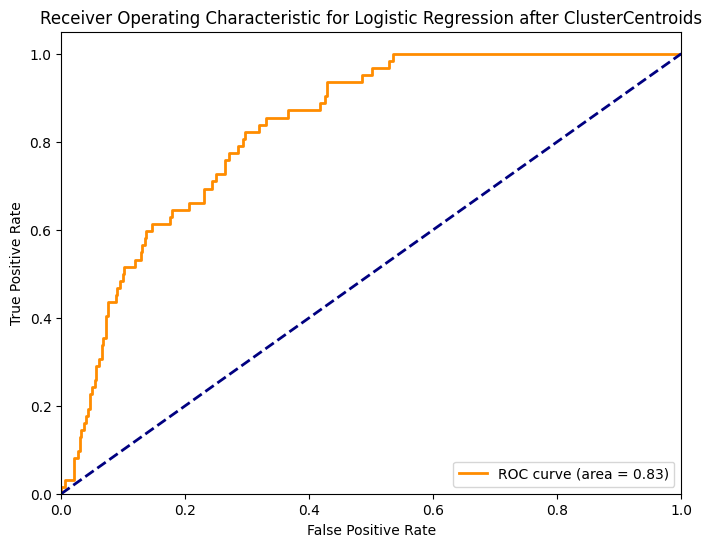

Confusion Matrix:
 [[715 245]
 [ 17  45]]


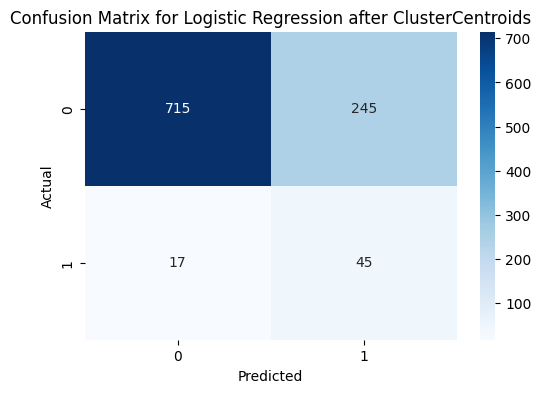


Model: Random Forest after ClusterCentroids
Accuracy: 0.44031311154598823
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.41      0.58       960
           1       0.09      0.95      0.17        62

    accuracy                           0.44      1022
   macro avg       0.54      0.68      0.37      1022
weighted avg       0.94      0.44      0.55      1022

ROC AUC Score: 0.7917506720430108


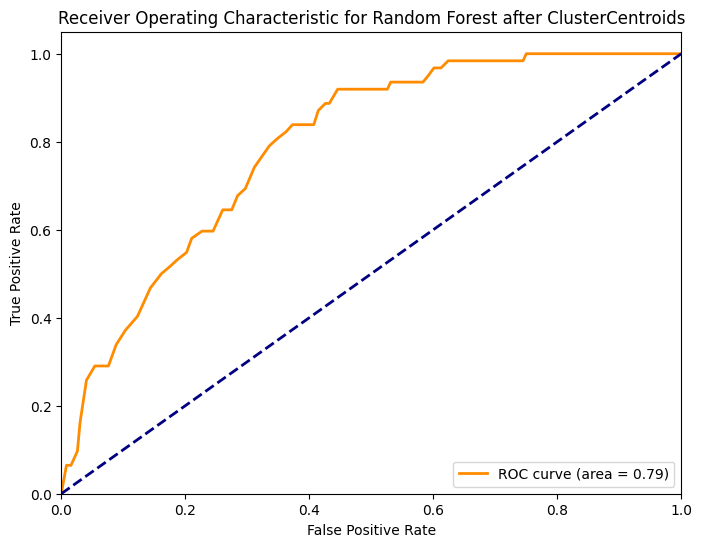

Confusion Matrix:
 [[391 569]
 [  3  59]]


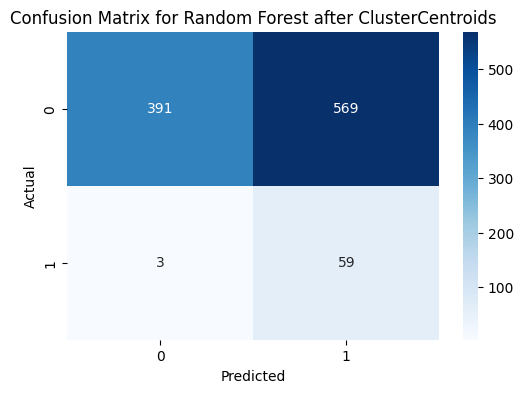


Model: SVM after ClusterCentroids
Accuracy: 0.7328767123287672
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.73      0.84       960
           1       0.15      0.73      0.25        62

    accuracy                           0.73      1022
   macro avg       0.56      0.73      0.54      1022
weighted avg       0.93      0.73      0.80      1022

ROC AUC Score: 0.8151965725806452


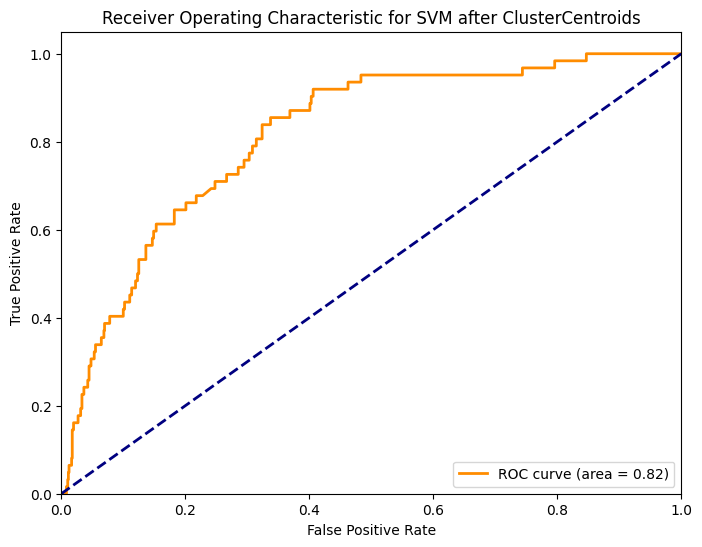

Confusion Matrix:
 [[704 256]
 [ 17  45]]


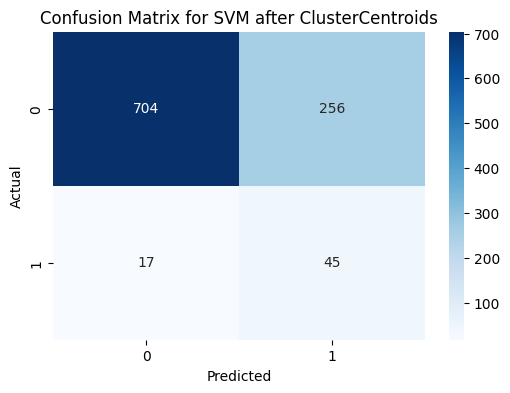


Model: Gradient Boosting after ClusterCentroids
Accuracy: 0.32093933463796476
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.28      0.43       960
           1       0.08      1.00      0.15        62

    accuracy                           0.32      1022
   macro avg       0.54      0.64      0.29      1022
weighted avg       0.94      0.32      0.42      1022

ROC AUC Score: 0.8089801747311829


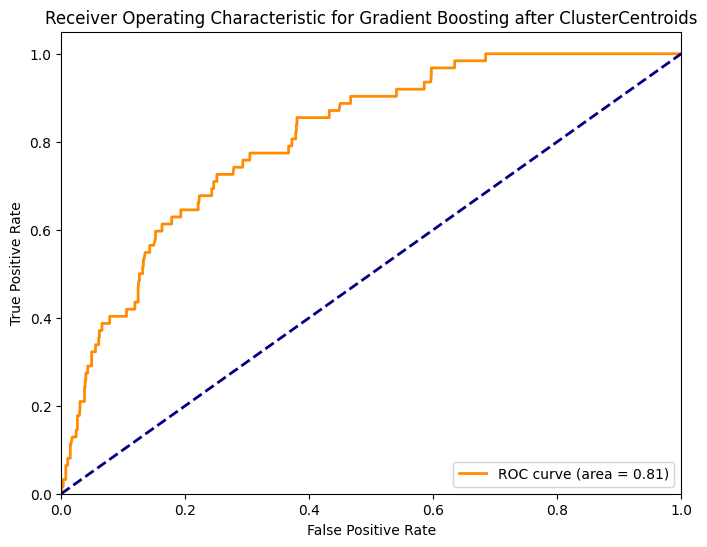

Confusion Matrix:
 [[266 694]
 [  0  62]]


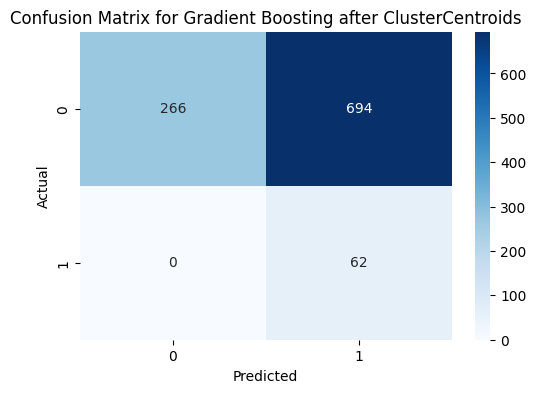


Model: AdaBoost after ClusterCentroids
Accuracy: 0.35518590998043054
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.31      0.48       960
           1       0.09      1.00      0.16        62

    accuracy                           0.36      1022
   macro avg       0.54      0.66      0.32      1022
weighted avg       0.94      0.36      0.46      1022

ROC AUC Score: 0.8154569892473118


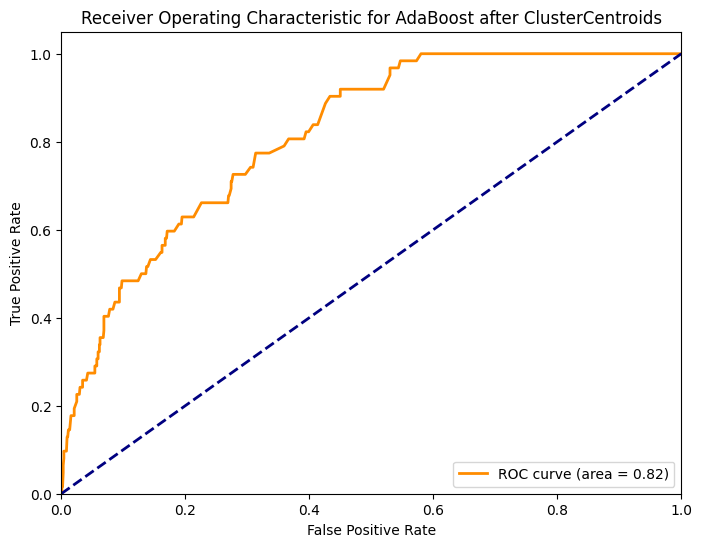

Confusion Matrix:
 [[301 659]
 [  0  62]]


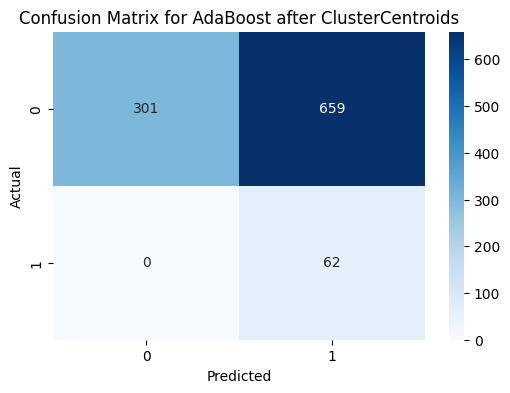


Model: XGBoost after ClusterCentroids
Accuracy: 0.42367906066536204
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.39      0.56       960
           1       0.09      0.98      0.17        62

    accuracy                           0.42      1022
   macro avg       0.55      0.69      0.36      1022
weighted avg       0.94      0.42      0.53      1022

ROC AUC Score: 0.8063256048387096


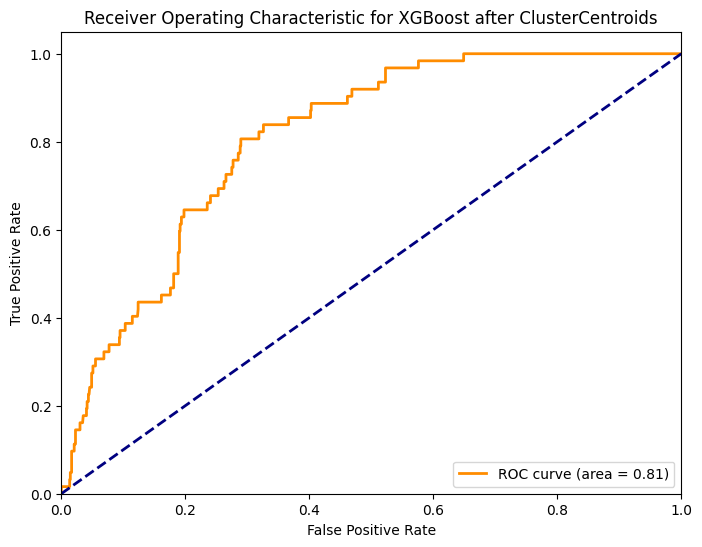

Confusion Matrix:
 [[372 588]
 [  1  61]]


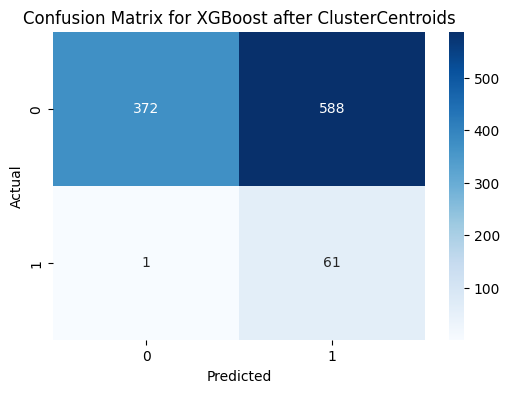

[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 462
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

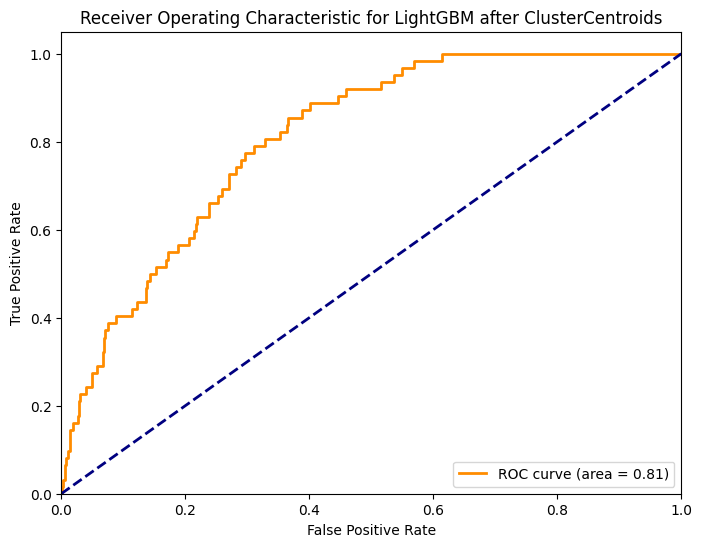

Confusion Matrix:
 [[289 671]
 [  0  62]]


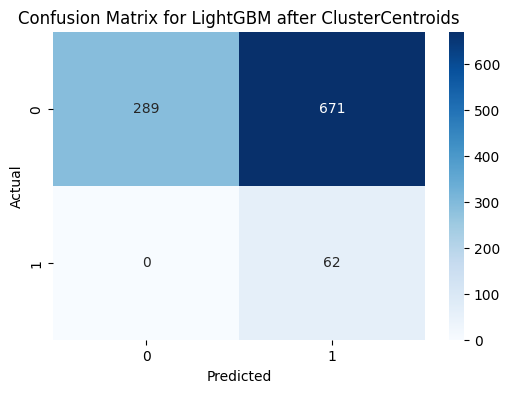


Model: CatBoost after ClusterCentroids
Accuracy: 0.40313111545988256
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.36      0.53       960
           1       0.09      1.00      0.17        62

    accuracy                           0.40      1022
   macro avg       0.55      0.68      0.35      1022
weighted avg       0.94      0.40      0.51      1022

ROC AUC Score: 0.8138608870967742


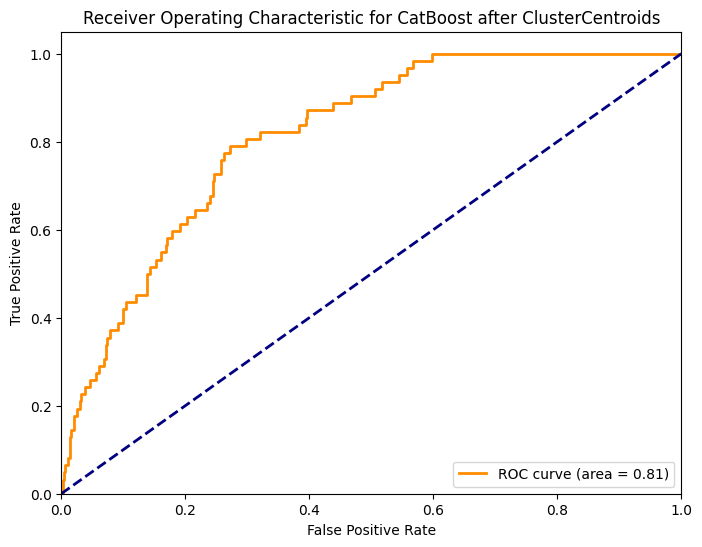

Confusion Matrix:
 [[350 610]
 [  0  62]]


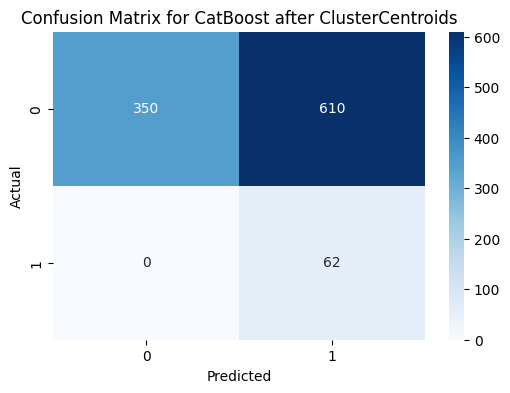


Model: k-Nearest Neighbors after ClusterCentroids
Accuracy: 0.7455968688845401
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.75      0.85       960
           1       0.15      0.68      0.24        62

    accuracy                           0.75      1022
   macro avg       0.56      0.71      0.55      1022
weighted avg       0.92      0.75      0.81      1022

ROC AUC Score: 0.7451360887096774


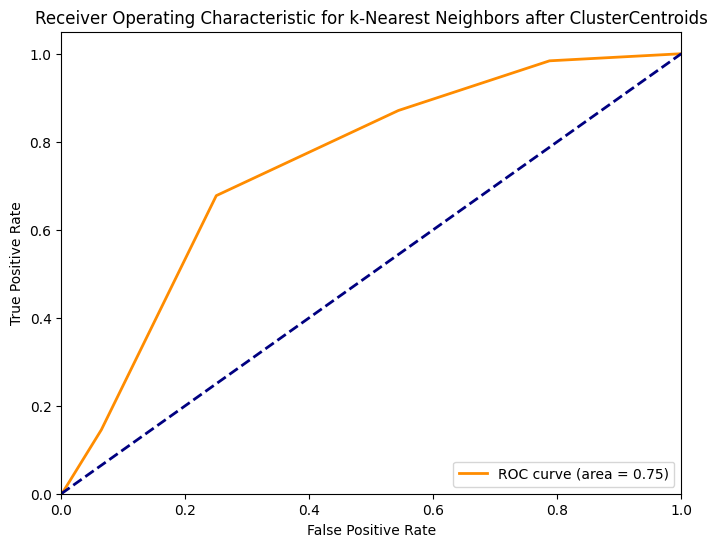

Confusion Matrix:
 [[720 240]
 [ 20  42]]


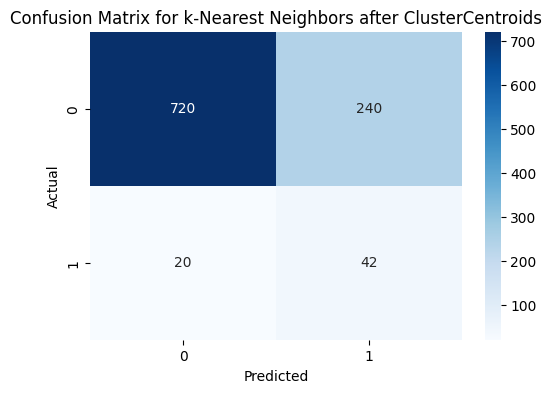


Model: Decision Tree after ClusterCentroids
Accuracy: 0.3923679060665362
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.36      0.53       960
           1       0.08      0.92      0.16        62

    accuracy                           0.39      1022
   macro avg       0.54      0.64      0.34      1022
weighted avg       0.93      0.39      0.50      1022

ROC AUC Score: 0.6388440860215054


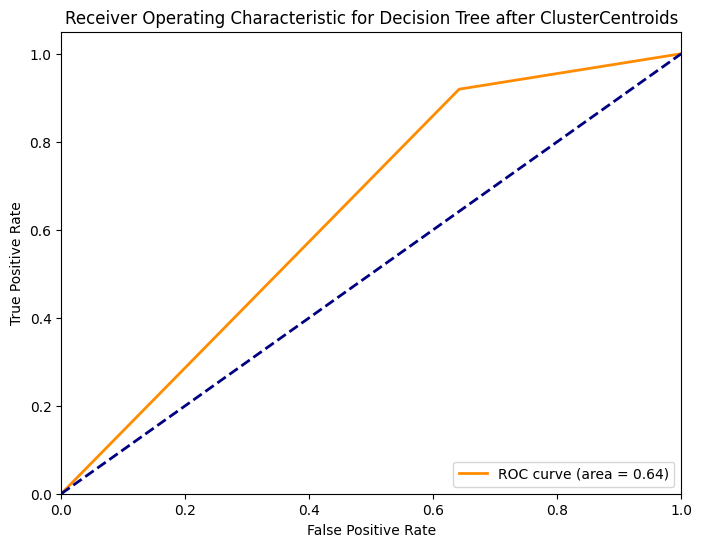

Confusion Matrix:
 [[344 616]
 [  5  57]]


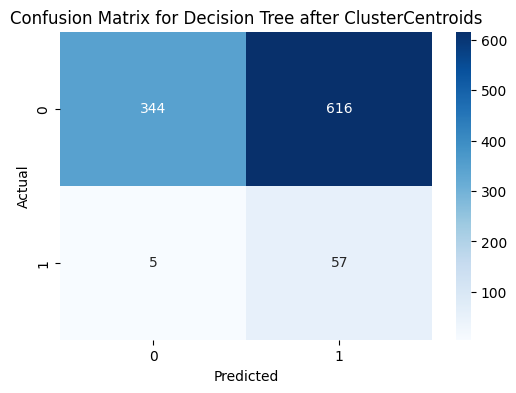


Model: Naive Bayes after ClusterCentroids
Accuracy: 0.6819960861056752
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.67      0.80       960
           1       0.14      0.84      0.24        62

    accuracy                           0.68      1022
   macro avg       0.56      0.76      0.52      1022
weighted avg       0.93      0.68      0.77      1022

ROC AUC Score: 0.8357358870967742


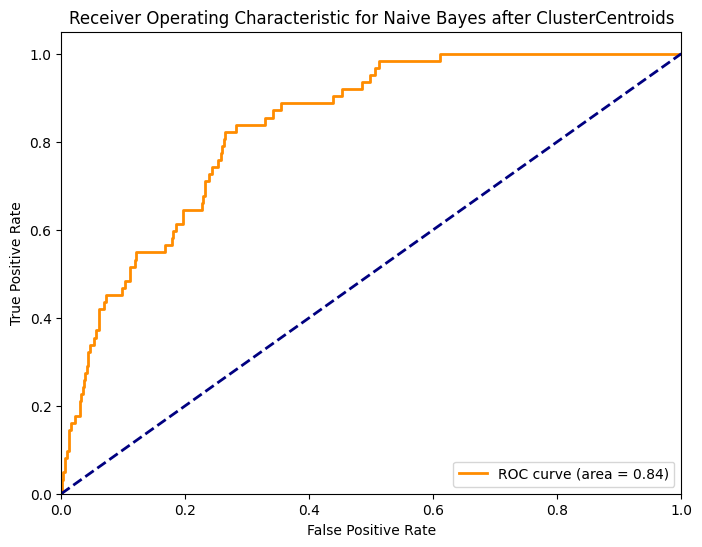

Confusion Matrix:
 [[645 315]
 [ 10  52]]


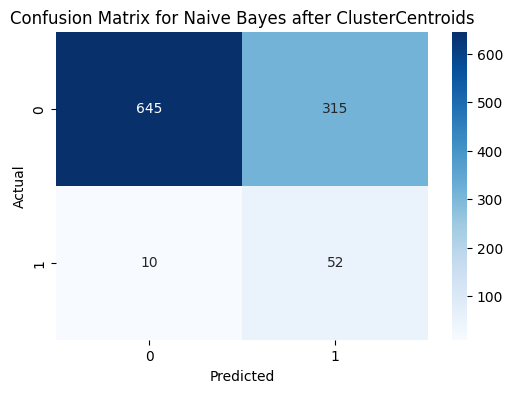


Model: Linear Discriminant Analysis after ClusterCentroids
Accuracy: 0.7318982387475538
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.73      0.84       960
           1       0.15      0.76      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.74      0.55      1022
weighted avg       0.93      0.73      0.80      1022

ROC AUC Score: 0.8295194892473118


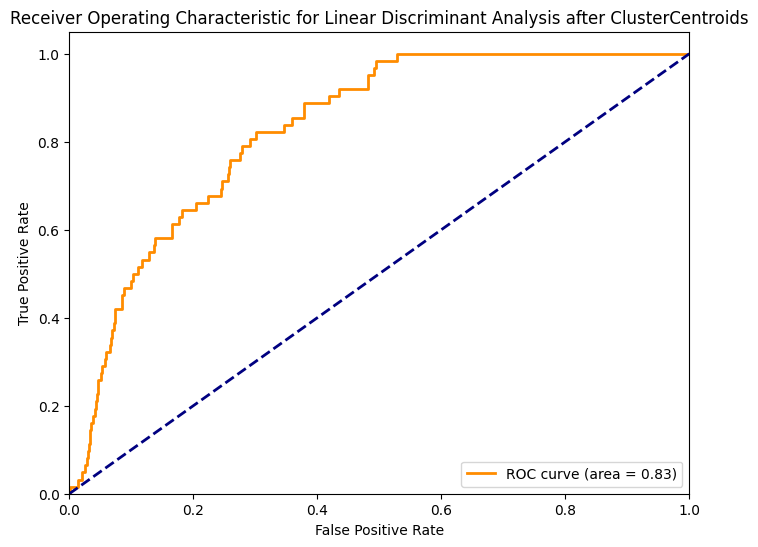

Confusion Matrix:
 [[701 259]
 [ 15  47]]


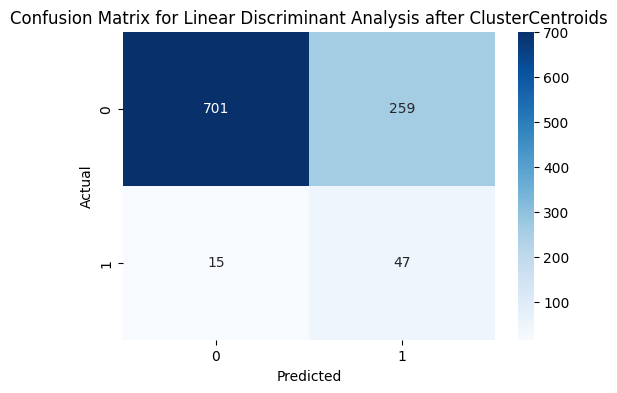


Model: Quadratic Discriminant Analysis after ClusterCentroids
Accuracy: 0.6839530332681018
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.67      0.80       960
           1       0.14      0.85      0.25        62

    accuracy                           0.68      1022
   macro avg       0.57      0.76      0.52      1022
weighted avg       0.94      0.68      0.77      1022

ROC AUC Score: 0.8302587365591397


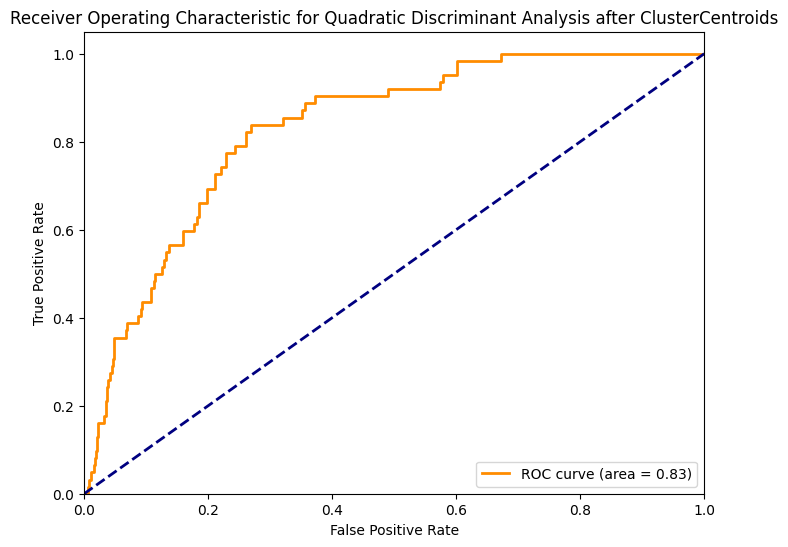

Confusion Matrix:
 [[646 314]
 [  9  53]]


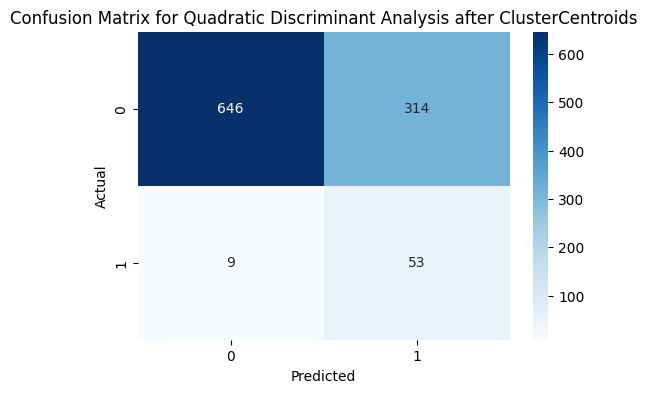


Model: Extra Trees after ClusterCentroids
Accuracy: 0.5450097847358122
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.52      0.68       960
           1       0.11      0.90      0.19        62

    accuracy                           0.55      1022
   macro avg       0.55      0.71      0.44      1022
weighted avg       0.93      0.55      0.65      1022

ROC AUC Score: 0.7961021505376344


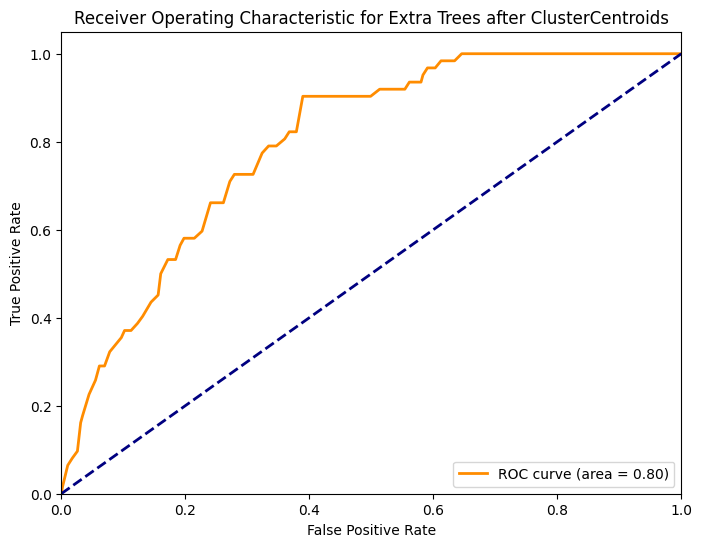

Confusion Matrix:
 [[501 459]
 [  6  56]]


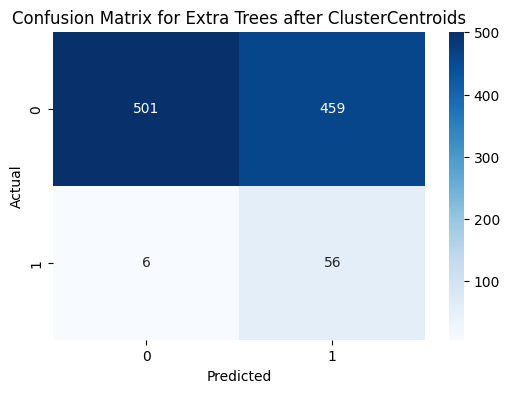


Applying RandomUnderSampler

Model: Logistic Regression after RandomUnderSampler
Accuracy: 0.7279843444227005
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.77      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.73      0.80      1022

ROC AUC Score: 0.8456317204301076


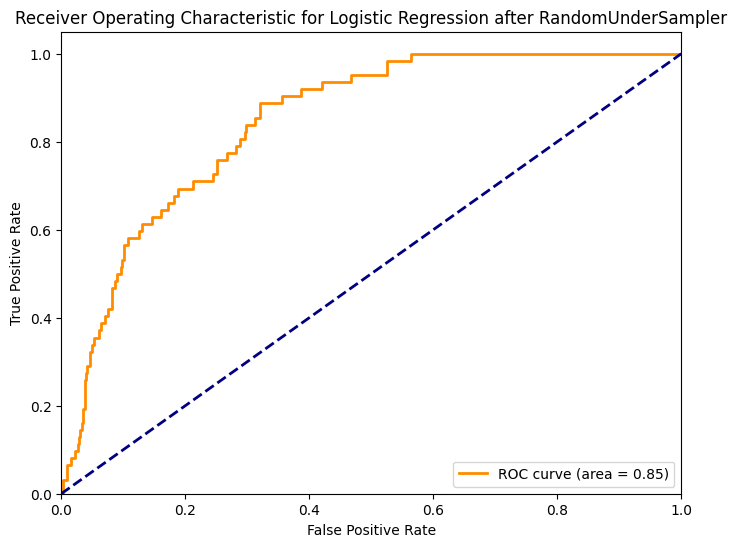

Confusion Matrix:
 [[696 264]
 [ 14  48]]


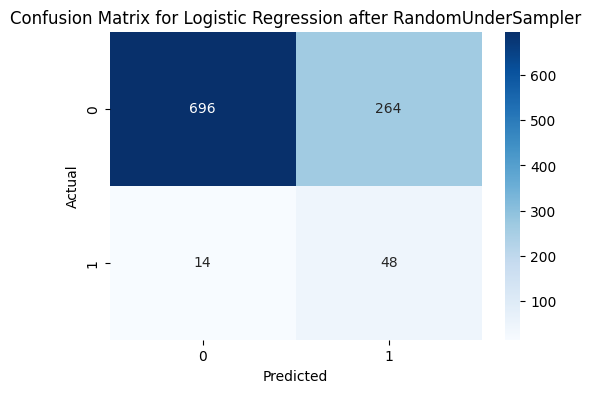


Model: Random Forest after RandomUnderSampler
Accuracy: 0.713307240704501
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.71      0.82       960
           1       0.15      0.79      0.25        62

    accuracy                           0.71      1022
   macro avg       0.57      0.75      0.54      1022
weighted avg       0.93      0.71      0.79      1022

ROC AUC Score: 0.8241935483870968


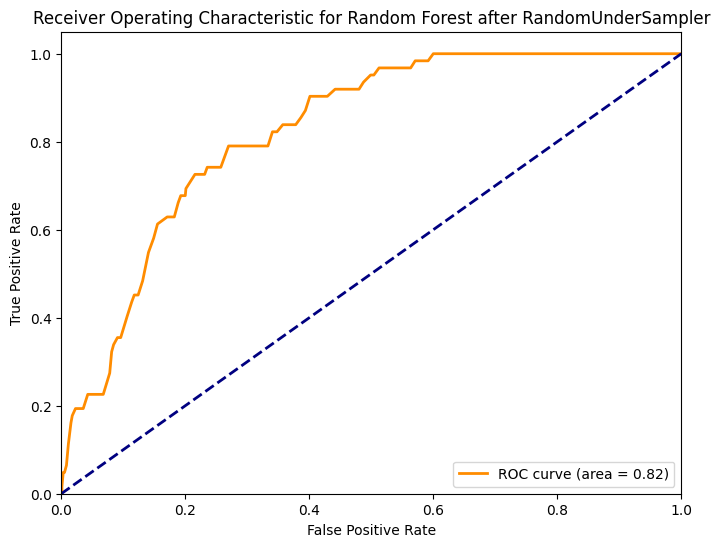

Confusion Matrix:
 [[680 280]
 [ 13  49]]


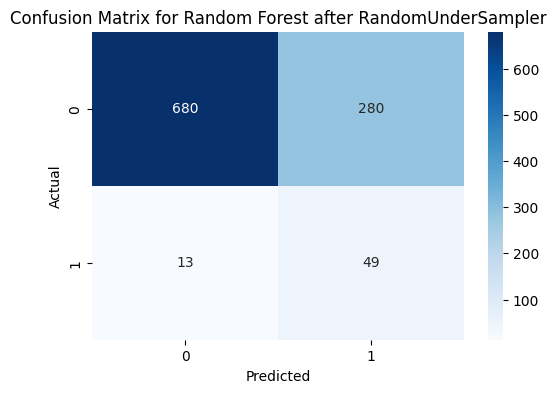


Model: SVM after RandomUnderSampler
Accuracy: 0.6956947162426614
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.69      0.81       960
           1       0.14      0.81      0.24        62

    accuracy                           0.70      1022
   macro avg       0.56      0.75      0.53      1022
weighted avg       0.93      0.70      0.78      1022

ROC AUC Score: 0.8241095430107527


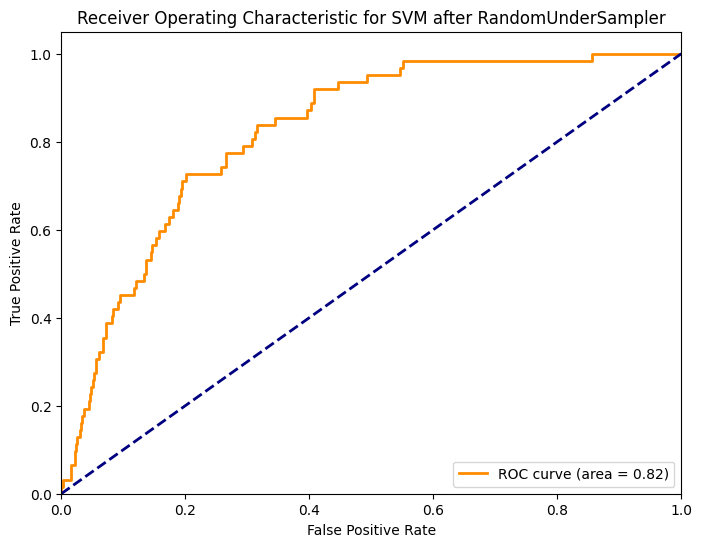

Confusion Matrix:
 [[661 299]
 [ 12  50]]


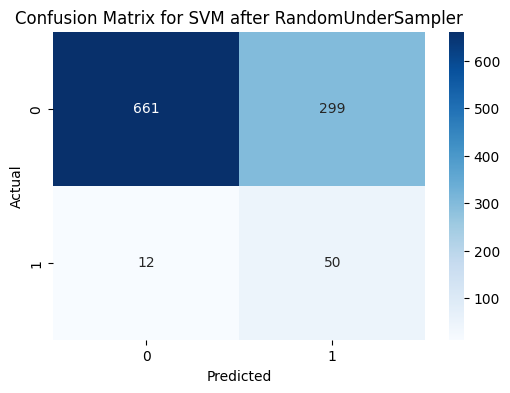


Model: Gradient Boosting after RandomUnderSampler
Accuracy: 0.7025440313111546
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.70      0.82       960
           1       0.13      0.69      0.22        62

    accuracy                           0.70      1022
   macro avg       0.55      0.70      0.52      1022
weighted avg       0.92      0.70      0.78      1022

ROC AUC Score: 0.8125924059139785


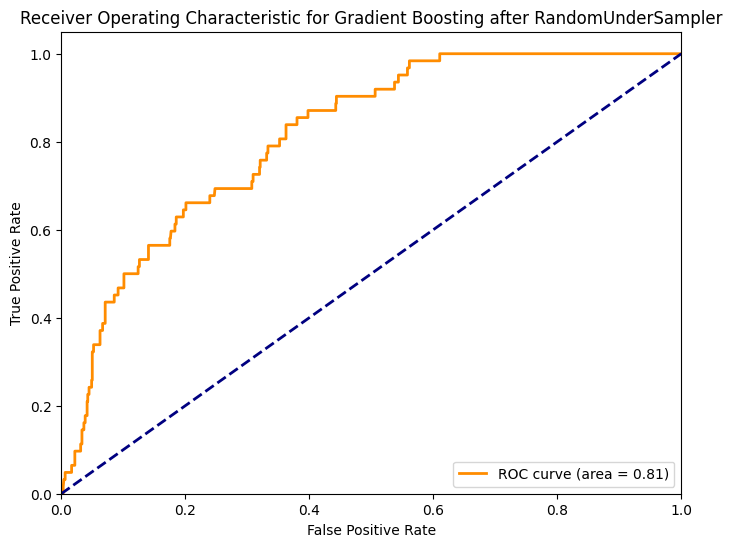

Confusion Matrix:
 [[675 285]
 [ 19  43]]


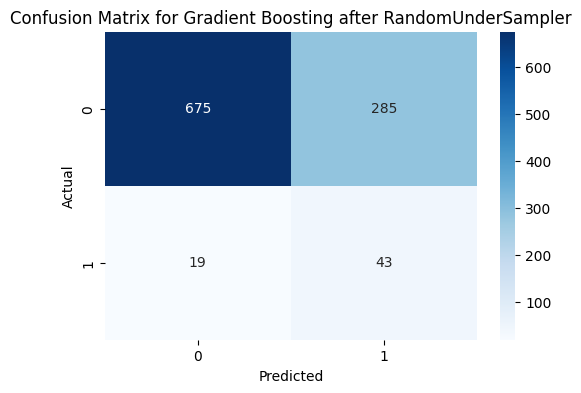


Model: AdaBoost after RandomUnderSampler
Accuracy: 0.713307240704501
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.71      0.82       960
           1       0.14      0.73      0.23        62

    accuracy                           0.71      1022
   macro avg       0.56      0.72      0.53      1022
weighted avg       0.93      0.71      0.79      1022

ROC AUC Score: 0.7643145161290322


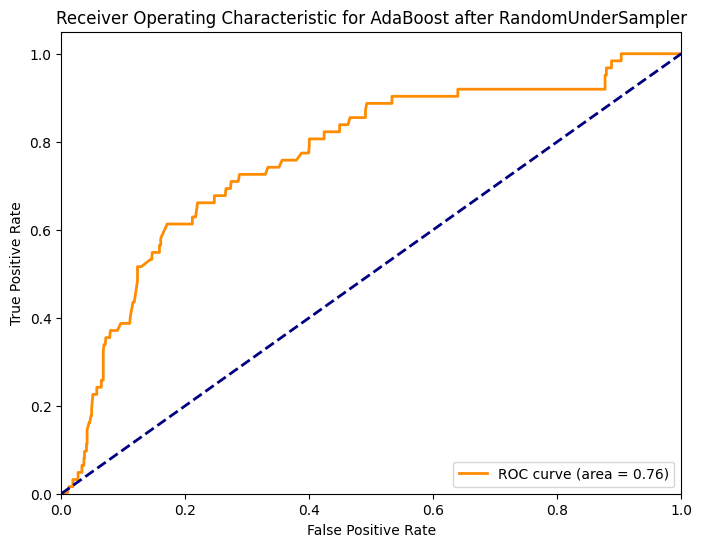

Confusion Matrix:
 [[684 276]
 [ 17  45]]


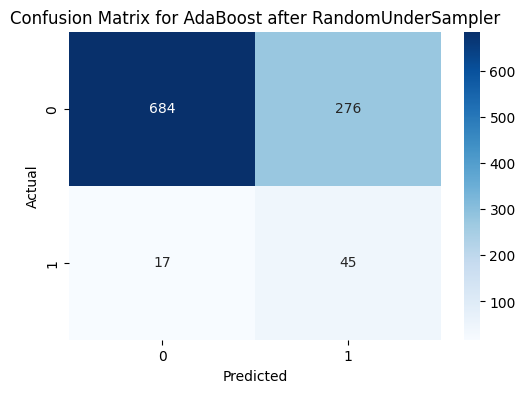


Model: XGBoost after RandomUnderSampler
Accuracy: 0.7103718199608611
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.71      0.82       960
           1       0.15      0.79      0.25        62

    accuracy                           0.71      1022
   macro avg       0.56      0.75      0.53      1022
weighted avg       0.93      0.71      0.79      1022

ROC AUC Score: 0.8158770161290323


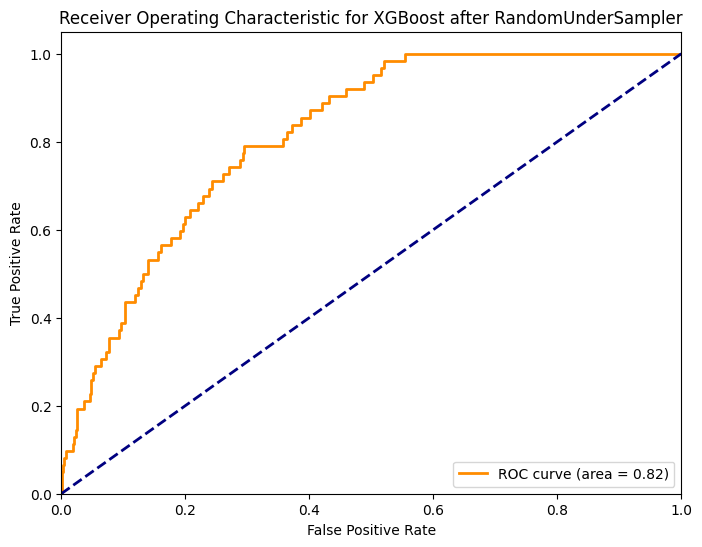

Confusion Matrix:
 [[677 283]
 [ 13  49]]


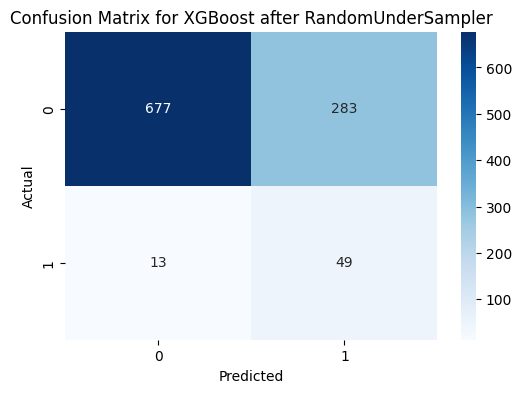

[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 301
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

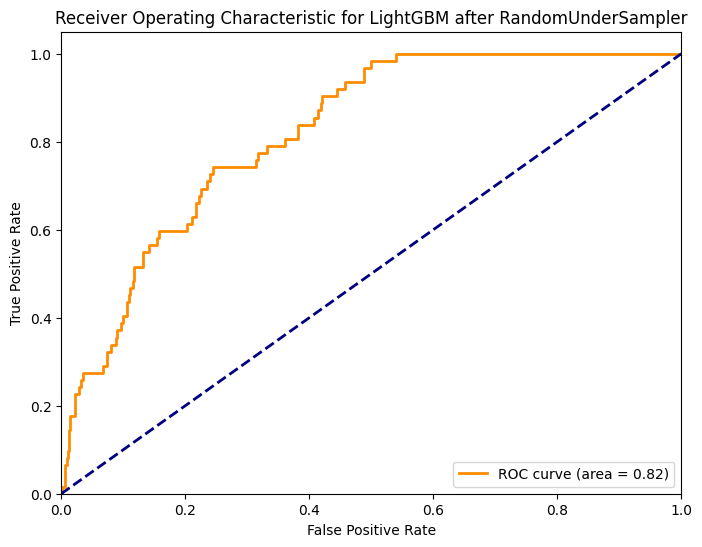

Confusion Matrix:
 [[673 287]
 [ 16  46]]


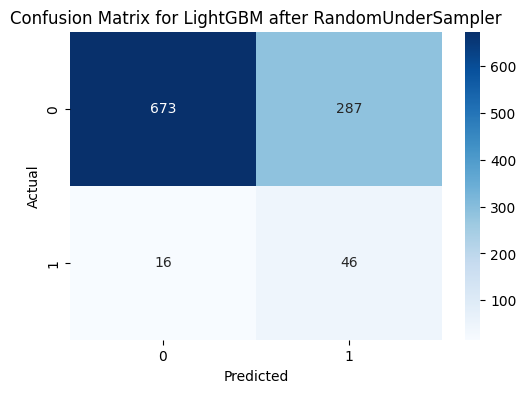


Model: CatBoost after RandomUnderSampler
Accuracy: 0.7250489236790607
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.79      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.76      0.54      1022
weighted avg       0.93      0.73      0.80      1022

ROC AUC Score: 0.8420026881720429


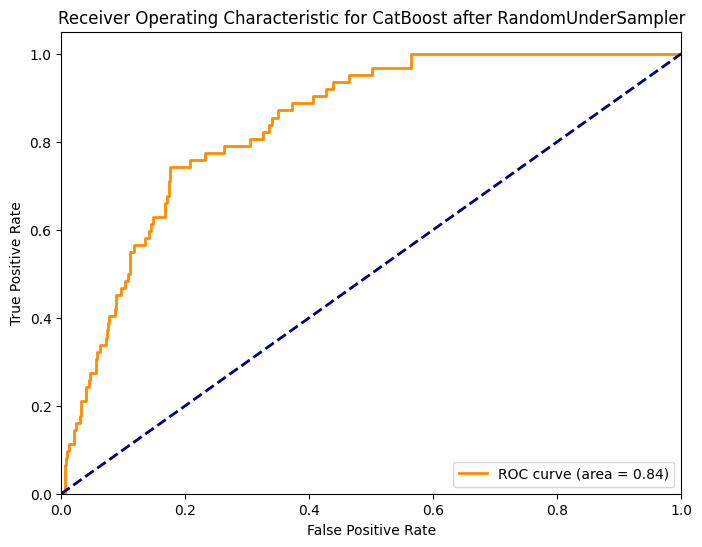

Confusion Matrix:
 [[692 268]
 [ 13  49]]


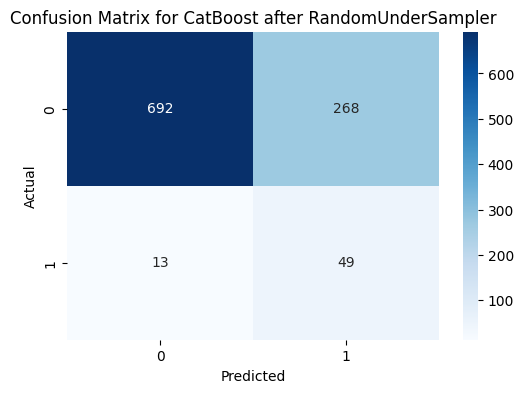


Model: k-Nearest Neighbors after RandomUnderSampler
Accuracy: 0.678082191780822
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.67      0.80       960
           1       0.14      0.81      0.23        62

    accuracy                           0.68      1022
   macro avg       0.56      0.74      0.51      1022
weighted avg       0.93      0.68      0.76      1022

ROC AUC Score: 0.778351814516129


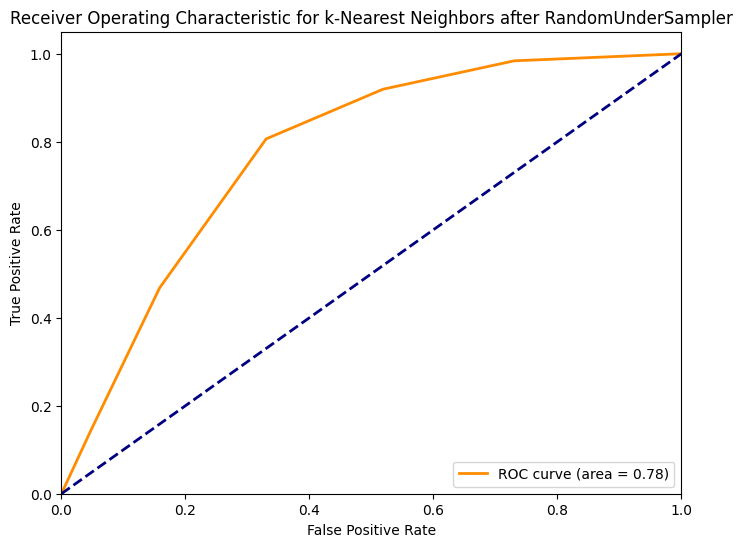

Confusion Matrix:
 [[643 317]
 [ 12  50]]


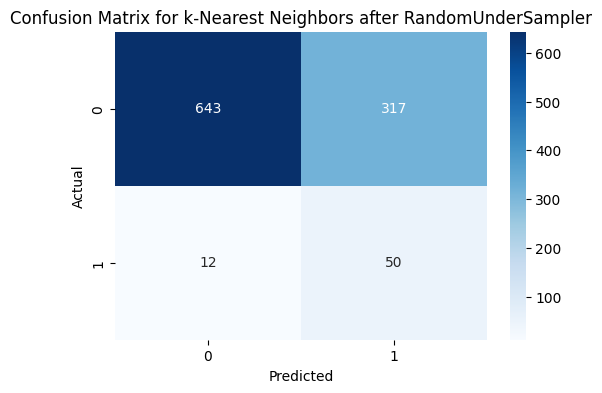


Model: Decision Tree after RandomUnderSampler
Accuracy: 0.6800391389432485
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.68      0.80       960
           1       0.13      0.74      0.22        62

    accuracy                           0.68      1022
   macro avg       0.55      0.71      0.51      1022
weighted avg       0.92      0.68      0.76      1022

ROC AUC Score: 0.7089885752688172


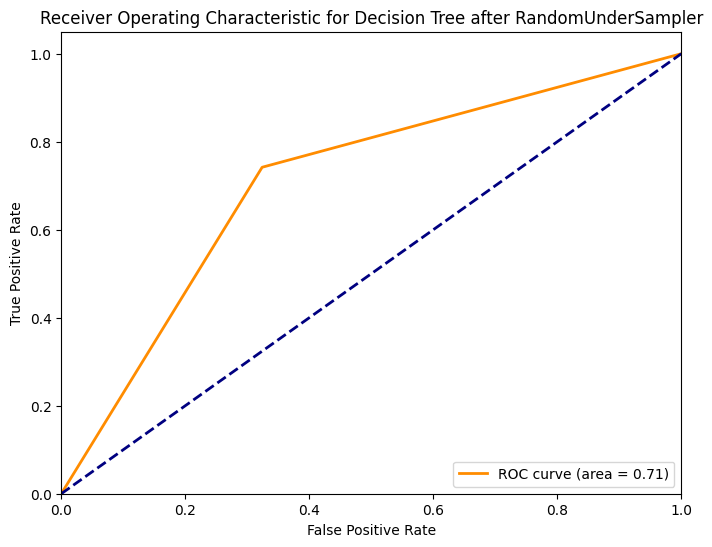

Confusion Matrix:
 [[649 311]
 [ 16  46]]


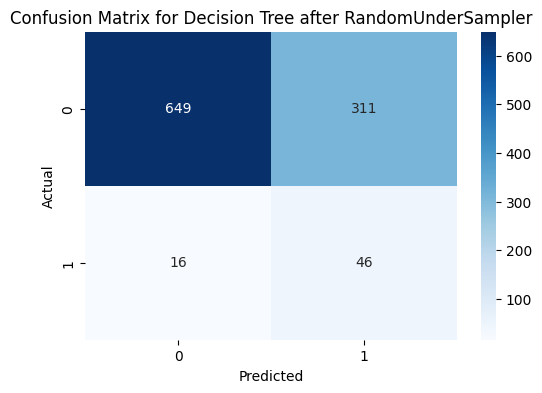


Model: Naive Bayes after RandomUnderSampler
Accuracy: 0.7250489236790607
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.77      0.25        62

    accuracy                           0.73      1022
   macro avg       0.57      0.75      0.54      1022
weighted avg       0.93      0.73      0.80      1022

ROC AUC Score: 0.8318548387096774


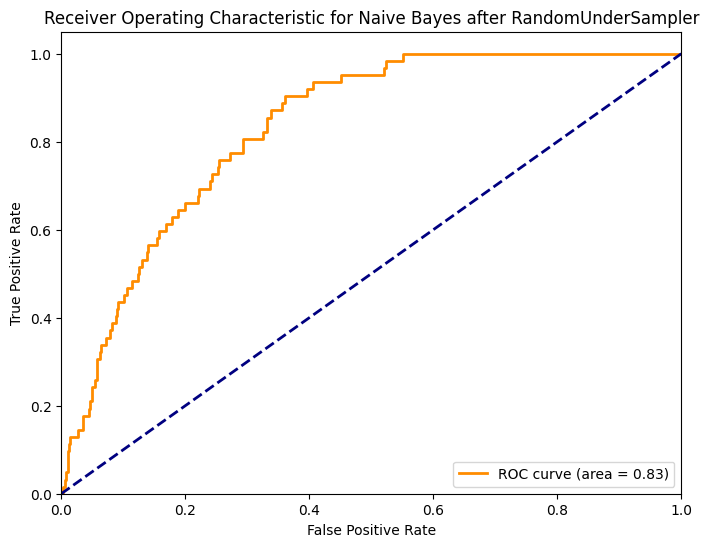

Confusion Matrix:
 [[693 267]
 [ 14  48]]


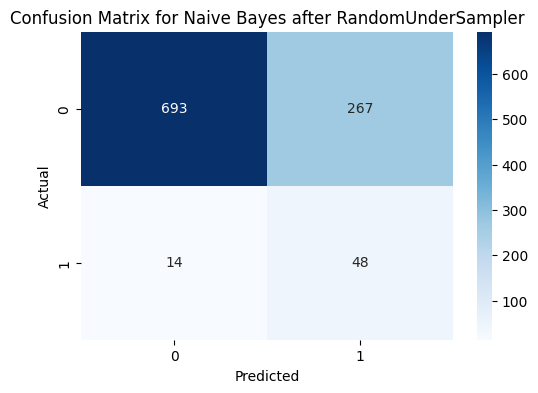


Model: Linear Discriminant Analysis after RandomUnderSampler
Accuracy: 0.7250489236790607
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.72      0.83       960
           1       0.15      0.79      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.76      0.54      1022
weighted avg       0.93      0.73      0.80      1022

ROC AUC Score: 0.8476646505376344


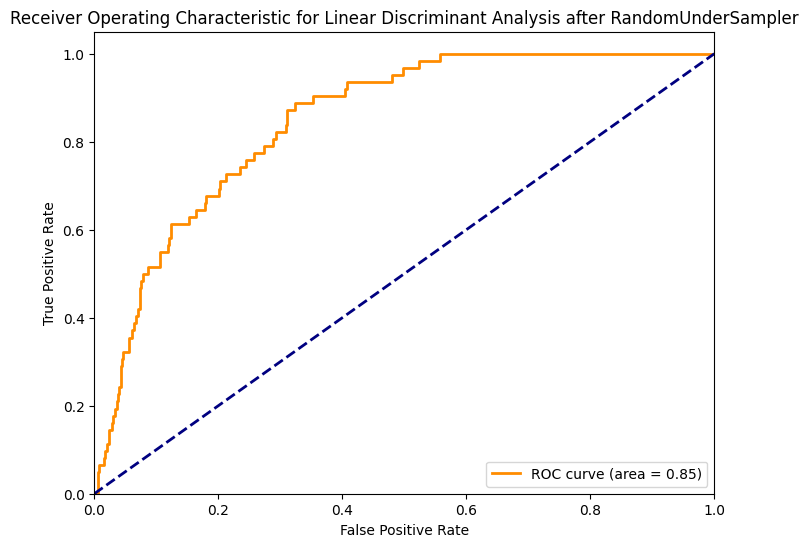

Confusion Matrix:
 [[692 268]
 [ 13  49]]


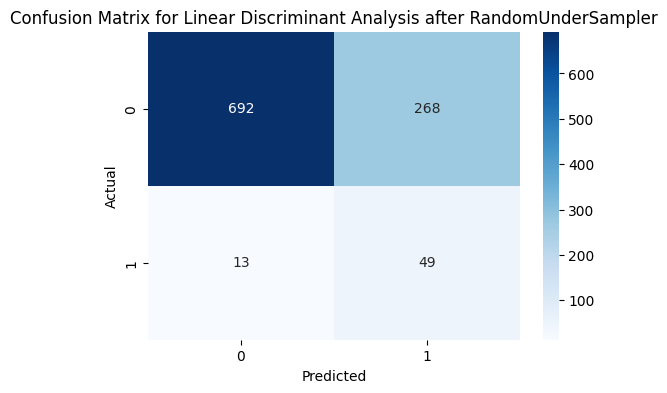


Model: Quadratic Discriminant Analysis after RandomUnderSampler
Accuracy: 0.7289628180039139
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.73      0.83       960
           1       0.15      0.77      0.26        62

    accuracy                           0.73      1022
   macro avg       0.57      0.75      0.55      1022
weighted avg       0.93      0.73      0.80      1022

ROC AUC Score: 0.8329301075268818


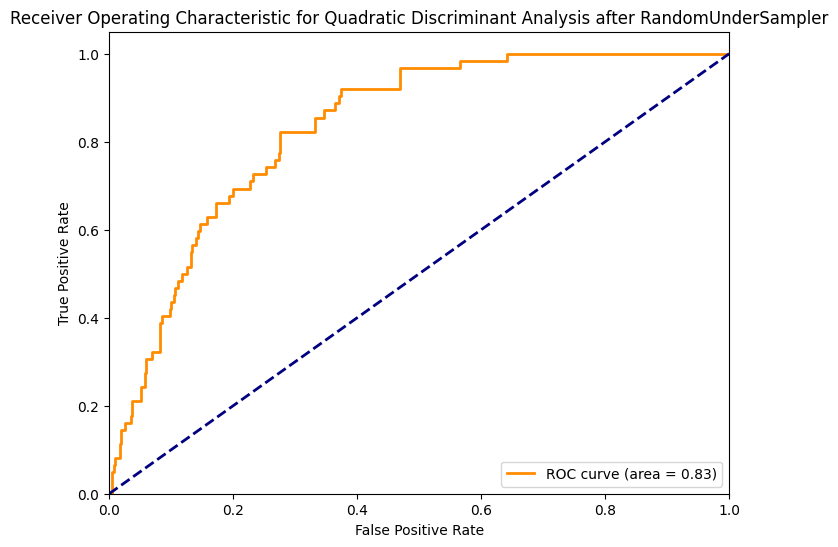

Confusion Matrix:
 [[697 263]
 [ 14  48]]


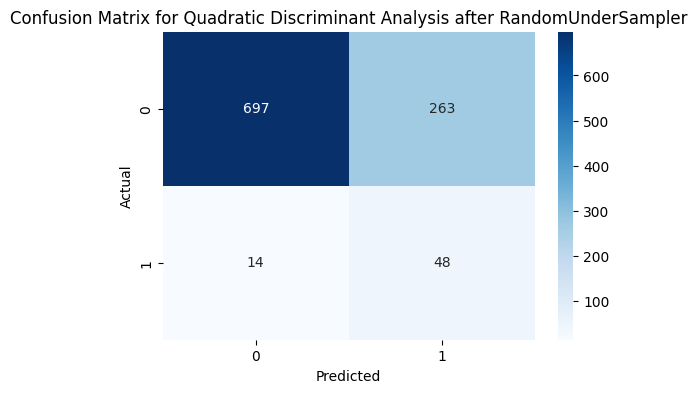


Model: Extra Trees after RandomUnderSampler
Accuracy: 0.6966731898238747
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.69      0.81       960
           1       0.14      0.81      0.24        62

    accuracy                           0.70      1022
   macro avg       0.56      0.75      0.53      1022
weighted avg       0.93      0.70      0.78      1022

ROC AUC Score: 0.8044606854838711


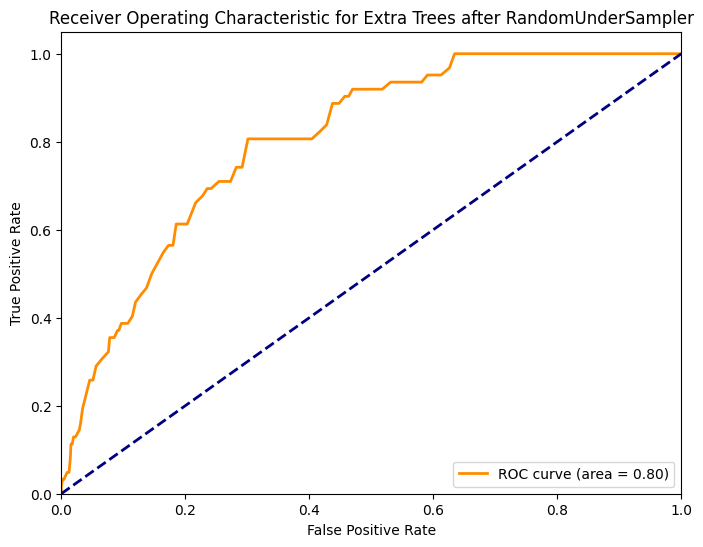

Confusion Matrix:
 [[662 298]
 [ 12  50]]


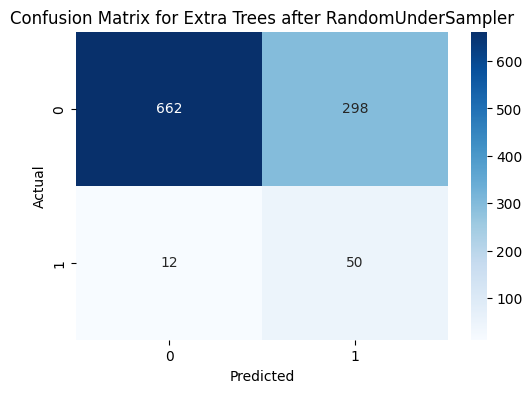


Applying NearMiss-1

Model: Logistic Regression after NearMiss-1
Accuracy: 0.46868884540117417
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.46      0.62       960
           1       0.07      0.63      0.13        62

    accuracy                           0.47      1022
   macro avg       0.51      0.54      0.37      1022
weighted avg       0.90      0.47      0.59      1022

ROC AUC Score: 0.6313172043010753


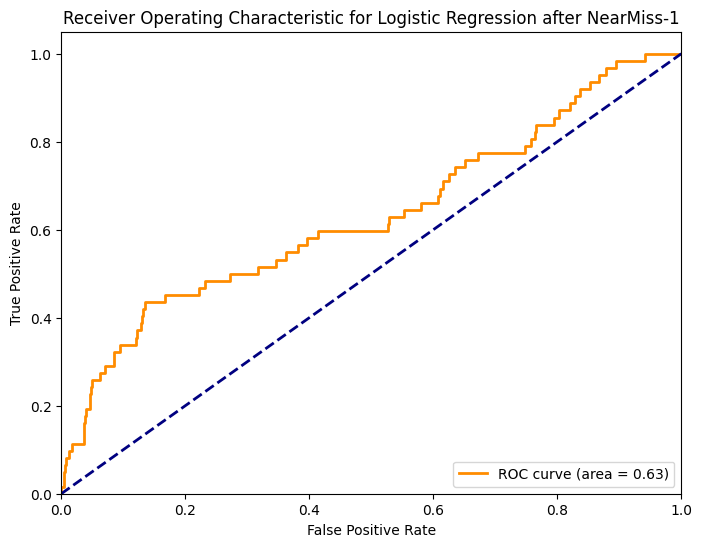

Confusion Matrix:
 [[440 520]
 [ 23  39]]


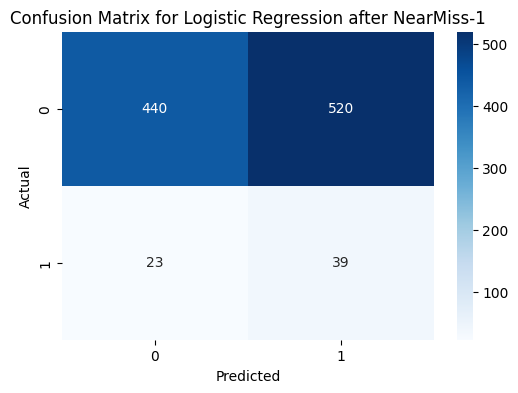


Model: Random Forest after NearMiss-1
Accuracy: 0.25244618395303325
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.22      0.36       960
           1       0.06      0.74      0.11        62

    accuracy                           0.25      1022
   macro avg       0.49      0.48      0.23      1022
weighted avg       0.88      0.25      0.34      1022

ROC AUC Score: 0.5288558467741935


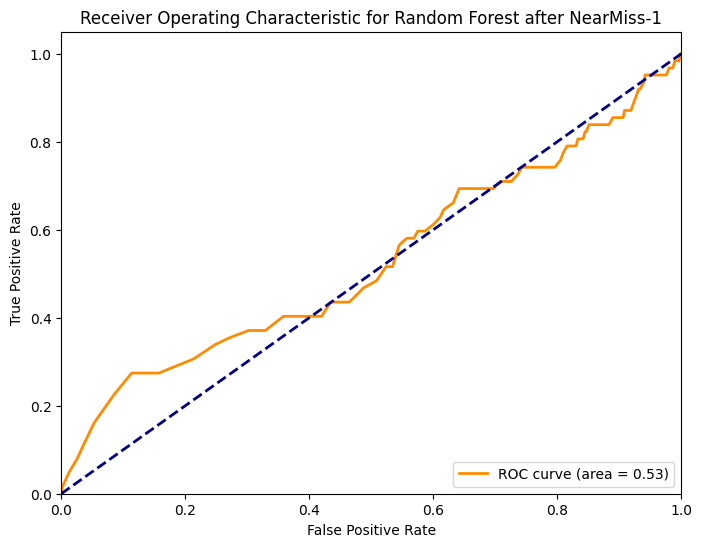

Confusion Matrix:
 [[212 748]
 [ 16  46]]


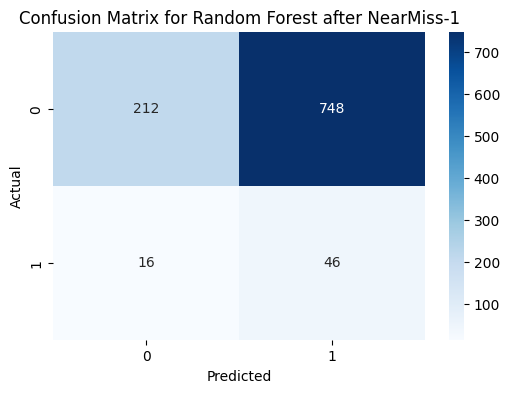


Model: SVM after NearMiss-1
Accuracy: 0.35909980430528377
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.34      0.50       960
           1       0.06      0.66      0.11        62

    accuracy                           0.36      1022
   macro avg       0.50      0.50      0.31      1022
weighted avg       0.89      0.36      0.48      1022

ROC AUC Score: 0.5223286290322581


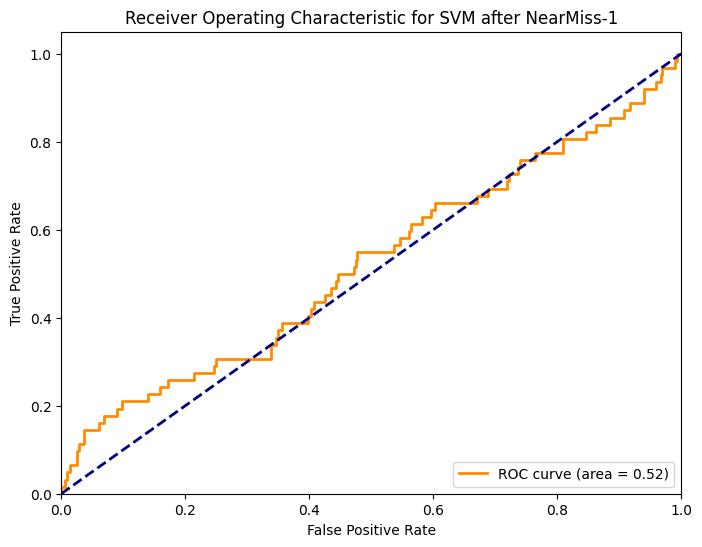

Confusion Matrix:
 [[326 634]
 [ 21  41]]


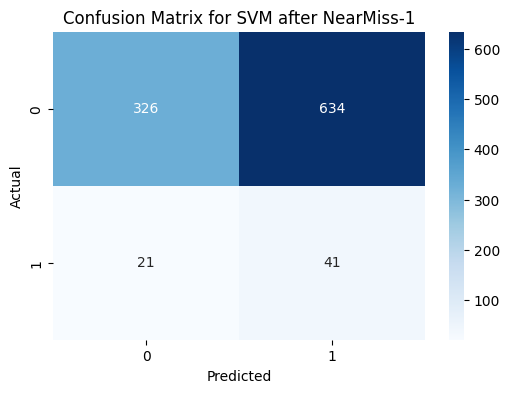


Model: Gradient Boosting after NearMiss-1
Accuracy: 0.2847358121330724
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.25      0.40       960
           1       0.06      0.77      0.12        62

    accuracy                           0.28      1022
   macro avg       0.50      0.51      0.26      1022
weighted avg       0.89      0.28      0.38      1022

ROC AUC Score: 0.4579469086021505


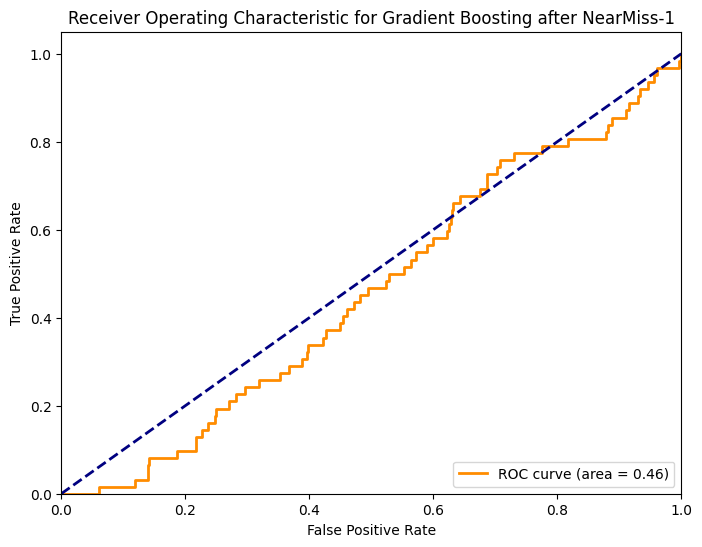

Confusion Matrix:
 [[243 717]
 [ 14  48]]


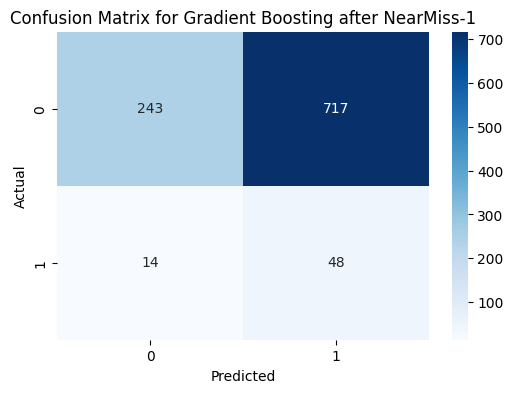


Model: AdaBoost after NearMiss-1
Accuracy: 0.2827788649706458
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.26      0.40       960
           1       0.06      0.71      0.11        62

    accuracy                           0.28      1022
   macro avg       0.49      0.48      0.25      1022
weighted avg       0.88      0.28      0.38      1022

ROC AUC Score: 0.39453125


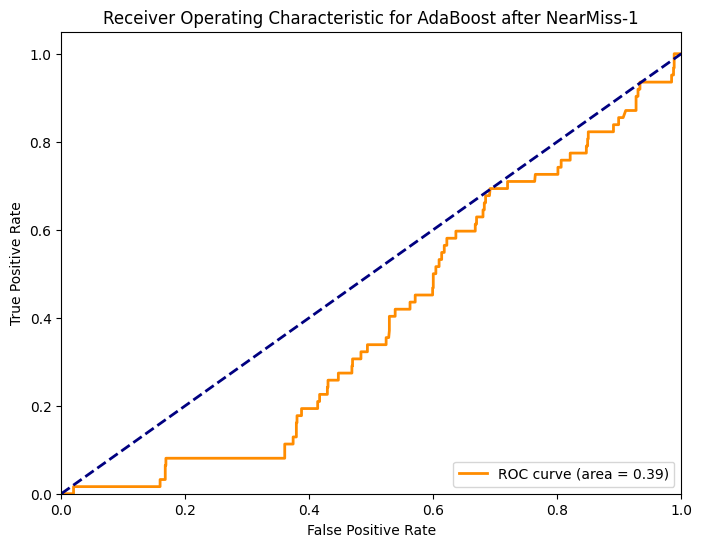

Confusion Matrix:
 [[245 715]
 [ 18  44]]


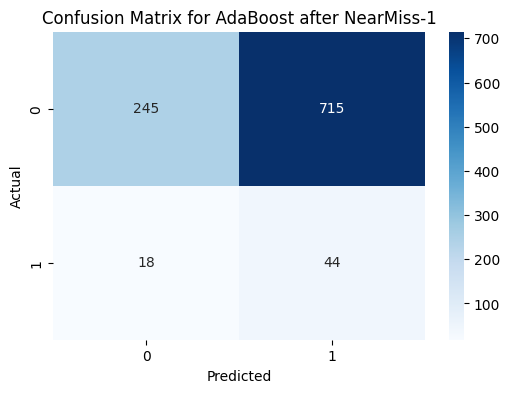


Model: XGBoost after NearMiss-1
Accuracy: 0.3101761252446184
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.28      0.43       960
           1       0.06      0.76      0.12        62

    accuracy                           0.31      1022
   macro avg       0.51      0.52      0.28      1022
weighted avg       0.89      0.31      0.41      1022

ROC AUC Score: 0.5659106182795699


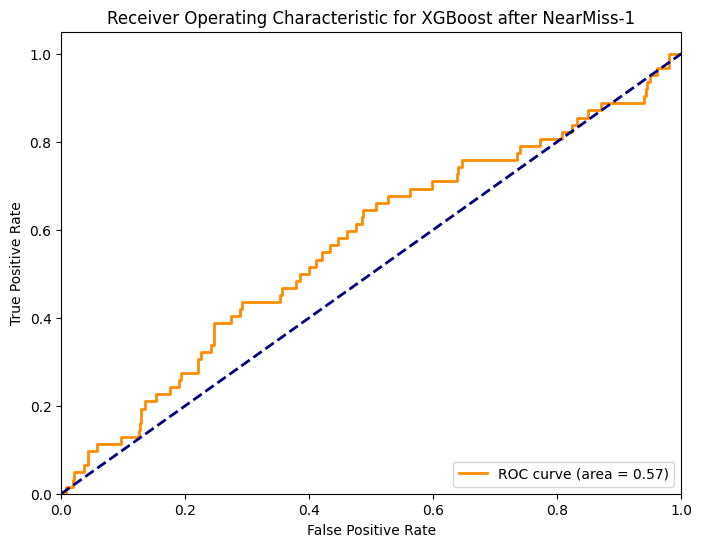

Confusion Matrix:
 [[270 690]
 [ 15  47]]


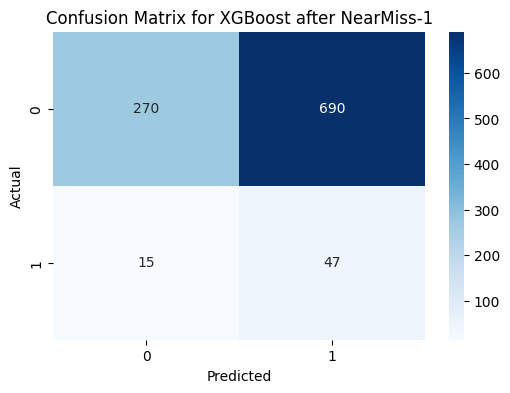

[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

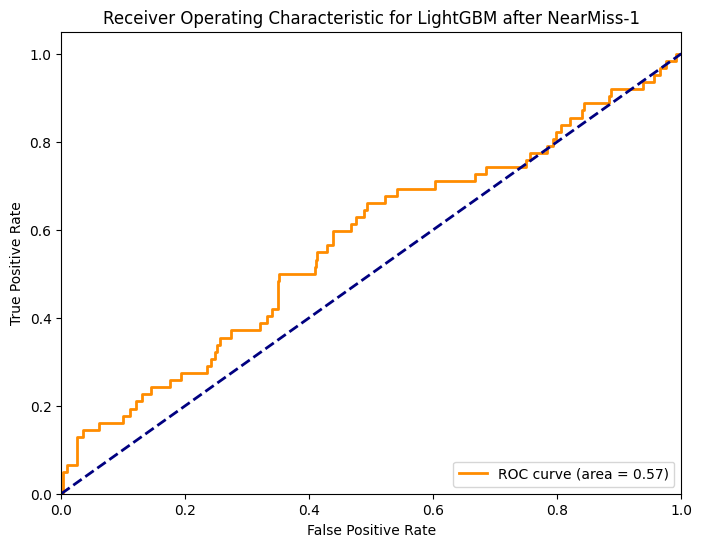

Confusion Matrix:
 [[318 642]
 [ 17  45]]


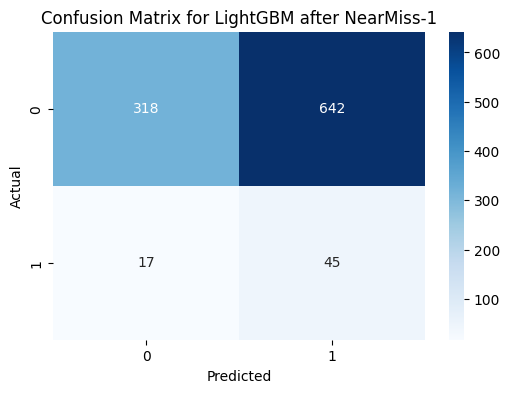


Model: CatBoost after NearMiss-1
Accuracy: 0.28669275929549903
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.26      0.40       960
           1       0.06      0.74      0.11        62

    accuracy                           0.29      1022
   macro avg       0.50      0.50      0.26      1022
weighted avg       0.89      0.29      0.39      1022

ROC AUC Score: 0.5551411290322581


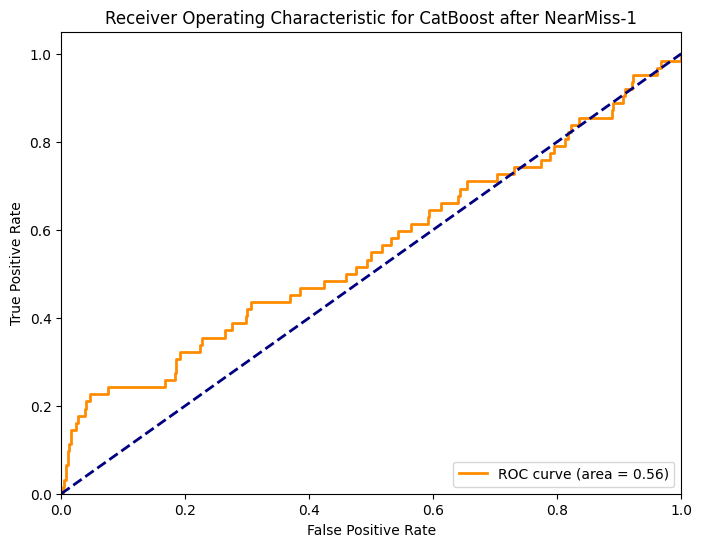

Confusion Matrix:
 [[247 713]
 [ 16  46]]


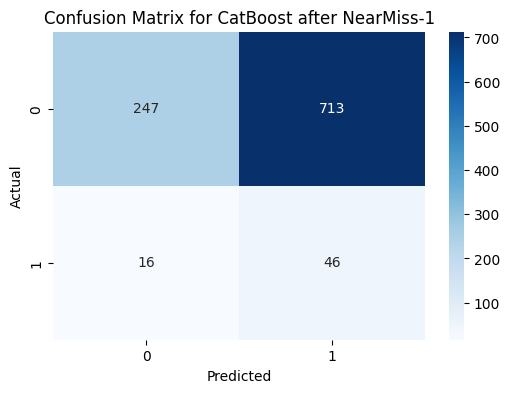


Model: k-Nearest Neighbors after NearMiss-1
Accuracy: 0.48043052837573386
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.47      0.63       960
           1       0.06      0.56      0.12        62

    accuracy                           0.48      1022
   macro avg       0.50      0.52      0.37      1022
weighted avg       0.89      0.48      0.60      1022

ROC AUC Score: 0.5812668010752688


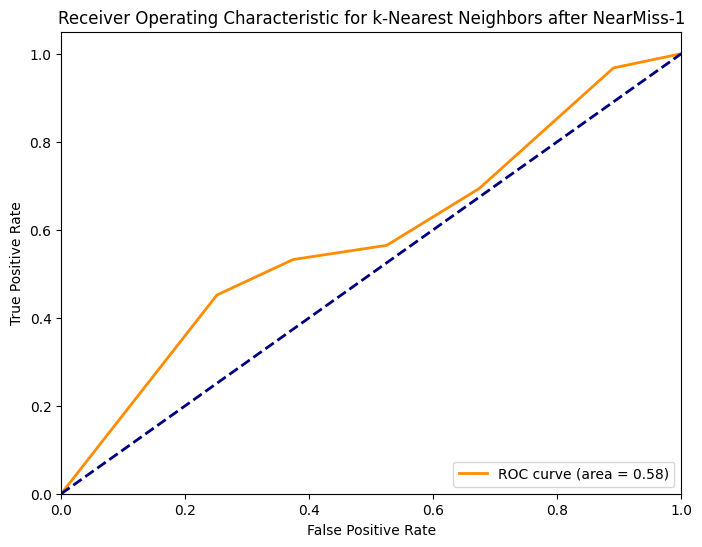

Confusion Matrix:
 [[456 504]
 [ 27  35]]


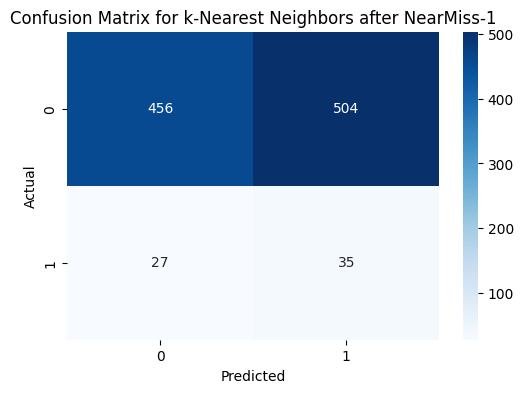


Model: Decision Tree after NearMiss-1
Accuracy: 0.19569471624266144
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.16      0.27       960
           1       0.06      0.76      0.10        62

    accuracy                           0.20      1022
   macro avg       0.48      0.46      0.19      1022
weighted avg       0.86      0.20      0.26      1022

ROC AUC Score: 0.45871975806451615


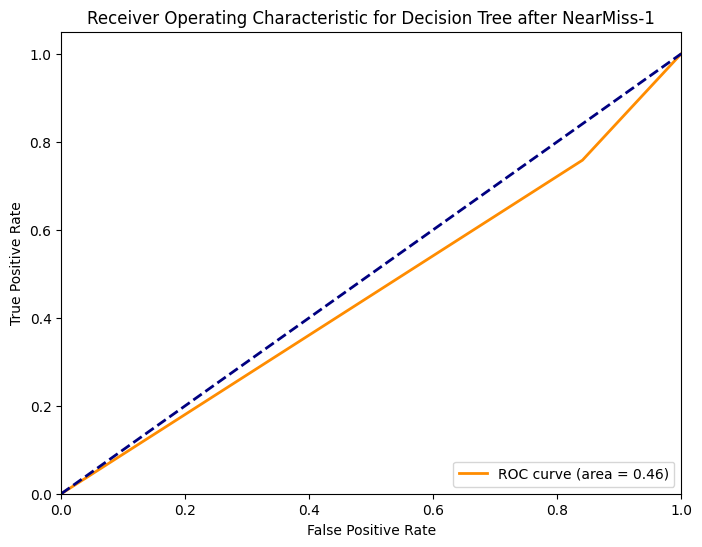

Confusion Matrix:
 [[153 807]
 [ 15  47]]


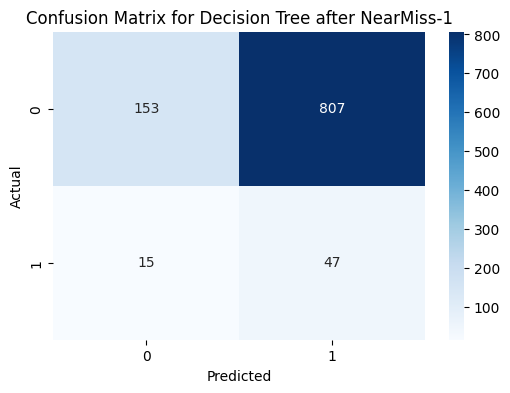


Model: Naive Bayes after NearMiss-1
Accuracy: 0.5039138943248532
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.51      0.66       960
           1       0.06      0.48      0.11        62

    accuracy                           0.50      1022
   macro avg       0.50      0.49      0.38      1022
weighted avg       0.88      0.50      0.62      1022

ROC AUC Score: 0.5097698252688172


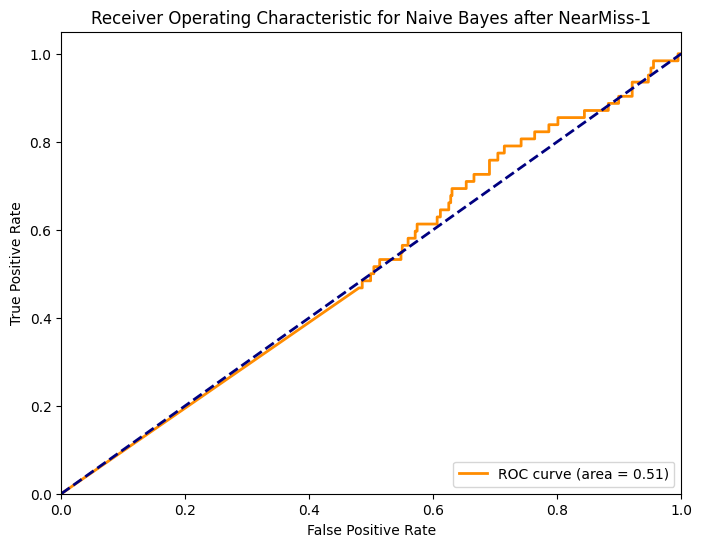

Confusion Matrix:
 [[485 475]
 [ 32  30]]


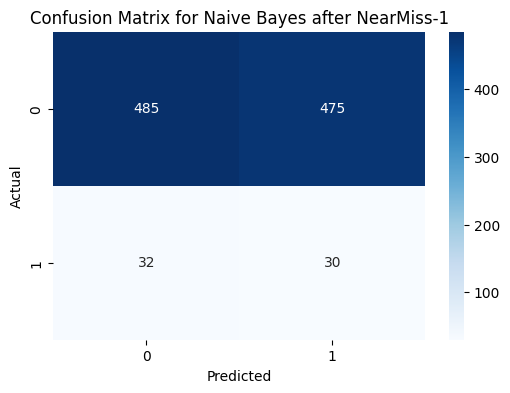


Model: Linear Discriminant Analysis after NearMiss-1
Accuracy: 0.6223091976516634
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.62      0.76       960
           1       0.10      0.61      0.16        62

    accuracy                           0.62      1022
   macro avg       0.53      0.62      0.46      1022
weighted avg       0.91      0.62      0.72      1022

ROC AUC Score: 0.6675067204301076


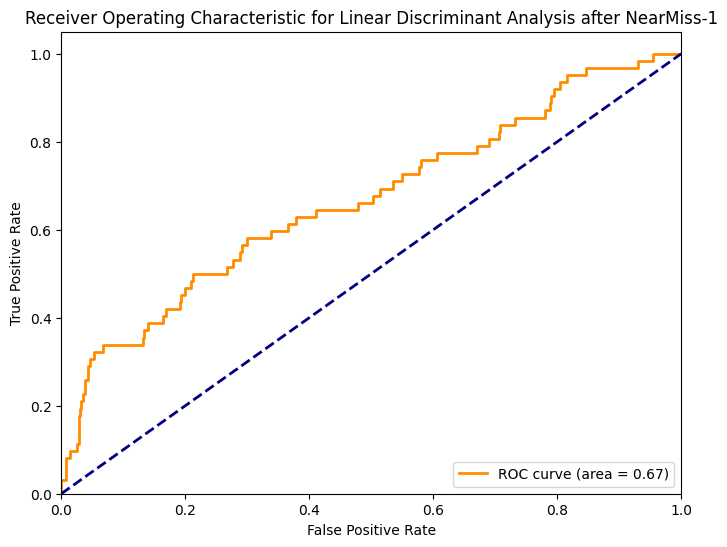

Confusion Matrix:
 [[598 362]
 [ 24  38]]


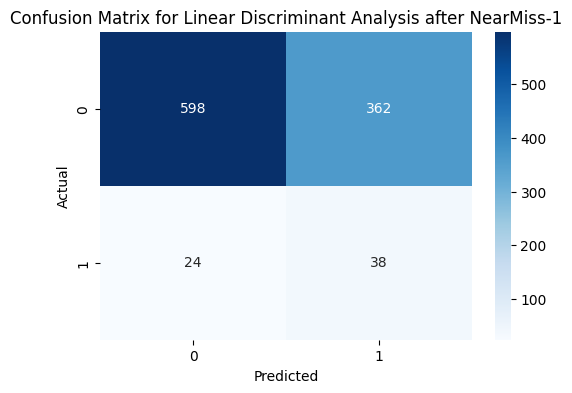


Model: Quadratic Discriminant Analysis after NearMiss-1
Accuracy: 0.5166340508806262
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.52      0.67       960
           1       0.06      0.48      0.11        62

    accuracy                           0.52      1022
   macro avg       0.50      0.50      0.39      1022
weighted avg       0.89      0.52      0.63      1022

ROC AUC Score: 0.4996471774193548


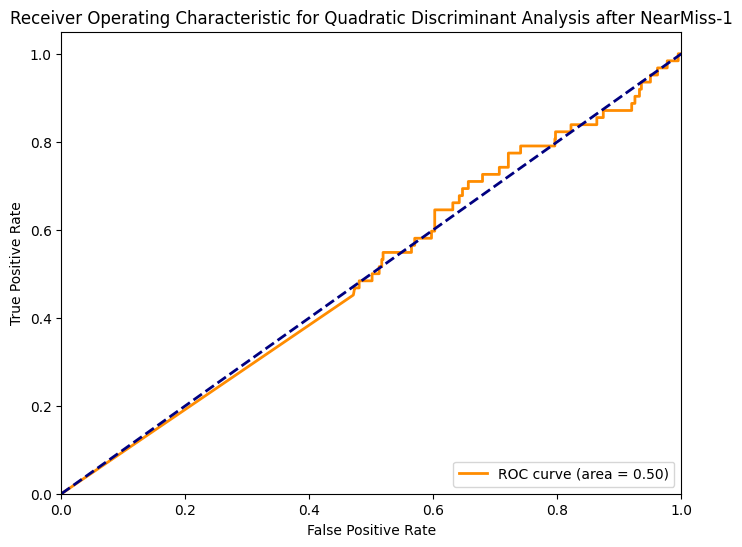

Confusion Matrix:
 [[498 462]
 [ 32  30]]


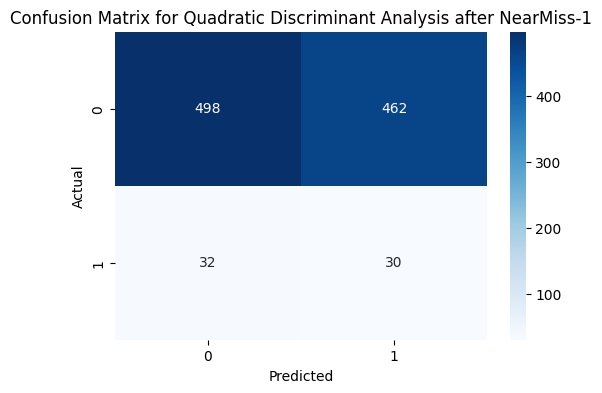


Model: Extra Trees after NearMiss-1
Accuracy: 0.2808219178082192
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.25      0.40       960
           1       0.06      0.74      0.11        62

    accuracy                           0.28      1022
   macro avg       0.50      0.50      0.25      1022
weighted avg       0.88      0.28      0.38      1022

ROC AUC Score: 0.5166750672043012


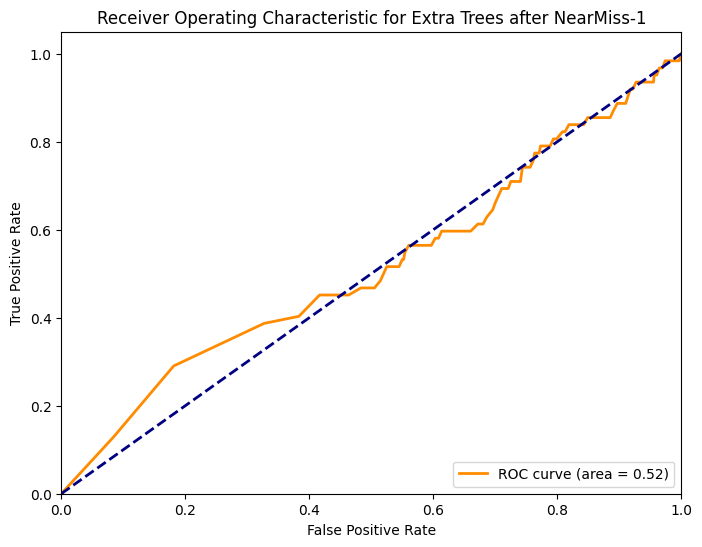

Confusion Matrix:
 [[241 719]
 [ 16  46]]


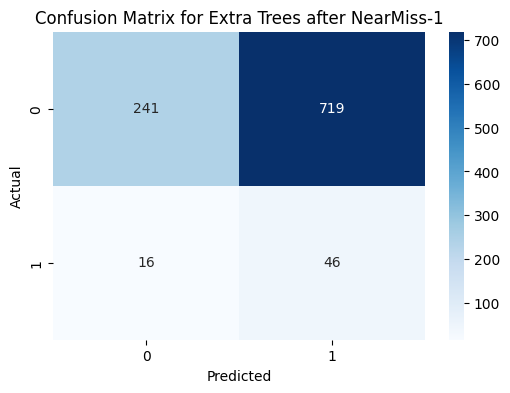


Applying NearMiss-2

Model: Logistic Regression after NearMiss-2
Accuracy: 0.5195694716242661
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.51      0.67       960
           1       0.08      0.65      0.14        62

    accuracy                           0.52      1022
   macro avg       0.52      0.58      0.40      1022
weighted avg       0.90      0.52      0.63      1022

ROC AUC Score: 0.5947244623655913


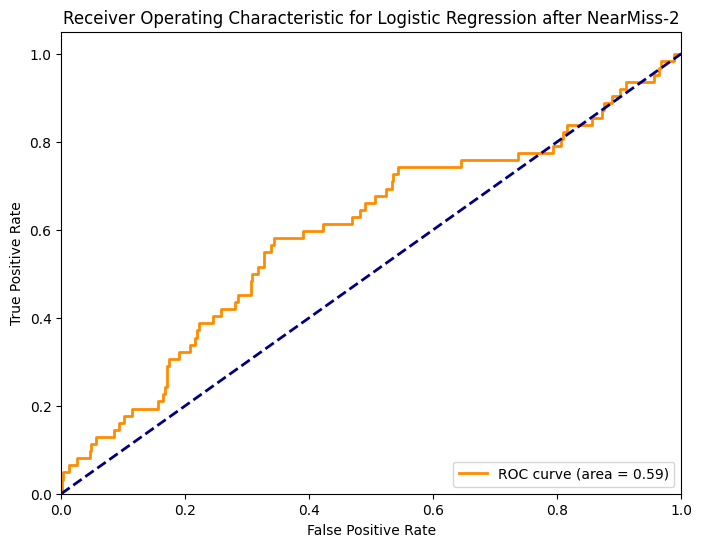

Confusion Matrix:
 [[491 469]
 [ 22  40]]


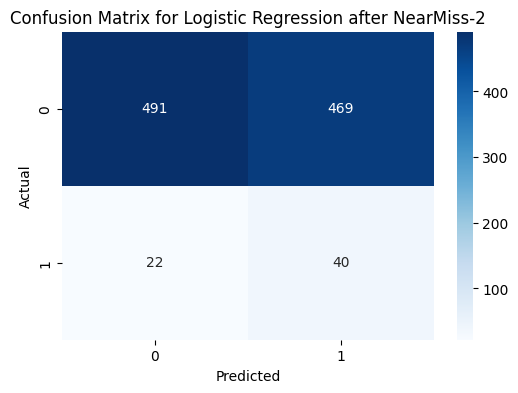


Model: Random Forest after NearMiss-2
Accuracy: 0.21037181996086105
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.17      0.29       960
           1       0.06      0.84      0.11        62

    accuracy                           0.21      1022
   macro avg       0.50      0.50      0.20      1022
weighted avg       0.89      0.21      0.28      1022

ROC AUC Score: 0.4679183467741936


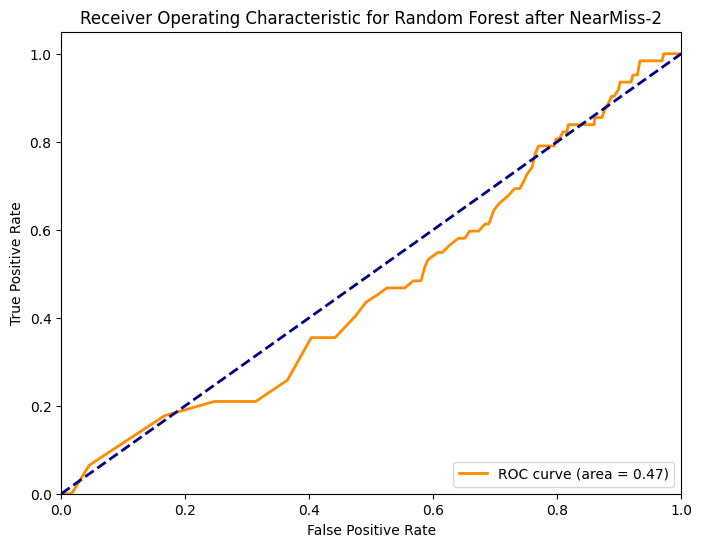

Confusion Matrix:
 [[163 797]
 [ 10  52]]


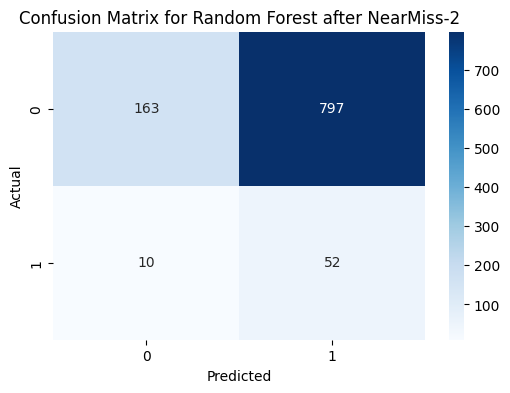


Model: SVM after NearMiss-2
Accuracy: 0.2191780821917808
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.18      0.30       960
           1       0.06      0.85      0.12        62

    accuracy                           0.22      1022
   macro avg       0.51      0.52      0.21      1022
weighted avg       0.90      0.22      0.29      1022

ROC AUC Score: 0.4603326612903226


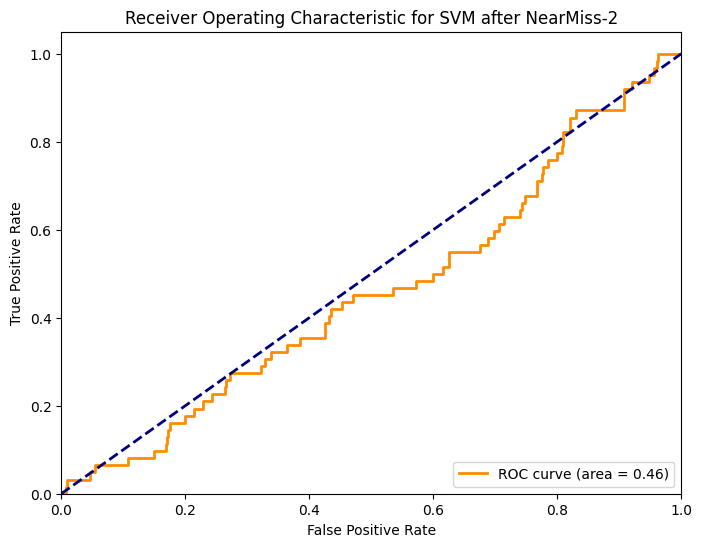

Confusion Matrix:
 [[171 789]
 [  9  53]]


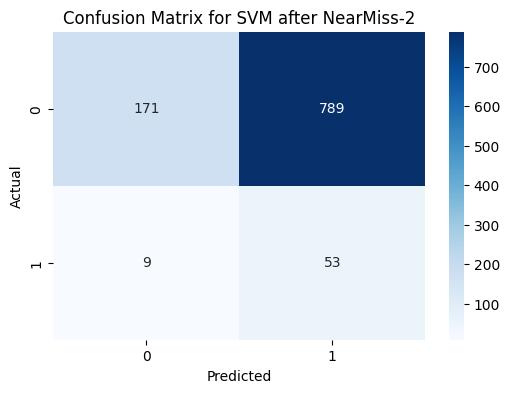


Model: Gradient Boosting after NearMiss-2
Accuracy: 0.22798434442270057
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.19      0.31       960
           1       0.06      0.85      0.12        62

    accuracy                           0.23      1022
   macro avg       0.51      0.52      0.22      1022
weighted avg       0.90      0.23      0.30      1022

ROC AUC Score: 0.46650705645161294


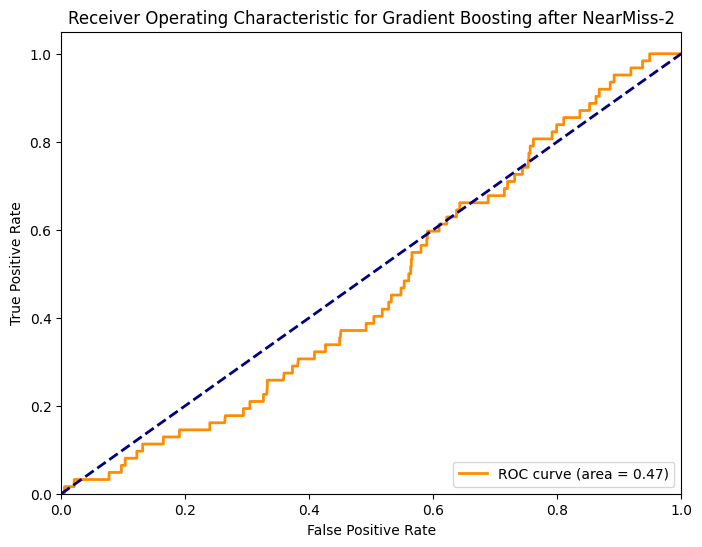

Confusion Matrix:
 [[180 780]
 [  9  53]]


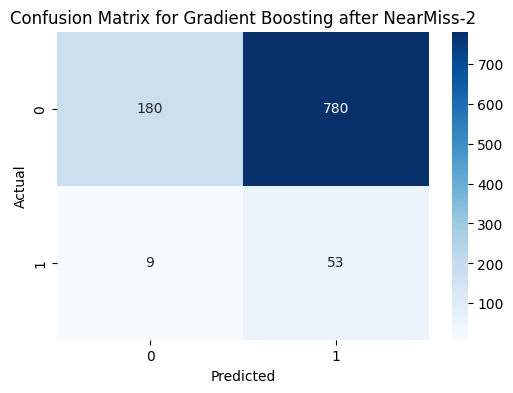


Model: AdaBoost after NearMiss-2
Accuracy: 0.2651663405088063
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.23      0.37       960
           1       0.06      0.76      0.11        62

    accuracy                           0.27      1022
   macro avg       0.50      0.50      0.24      1022
weighted avg       0.88      0.27      0.36      1022

ROC AUC Score: 0.5470850134408602


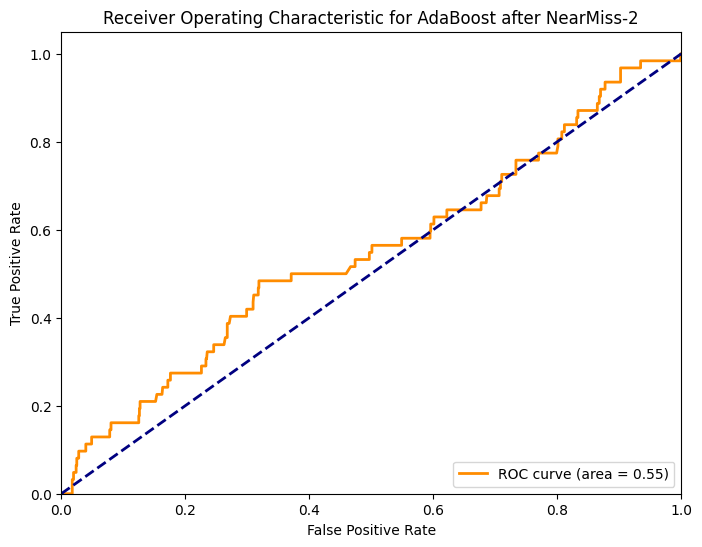

Confusion Matrix:
 [[224 736]
 [ 15  47]]


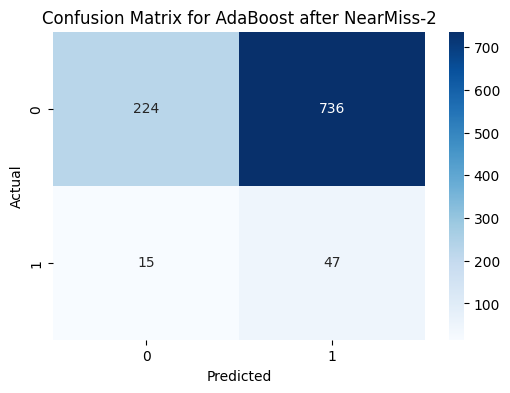


Model: XGBoost after NearMiss-2
Accuracy: 0.22700587084148727
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.19      0.31       960
           1       0.06      0.87      0.12        62

    accuracy                           0.23      1022
   macro avg       0.51      0.53      0.22      1022
weighted avg       0.90      0.23      0.30      1022

ROC AUC Score: 0.4776041666666667


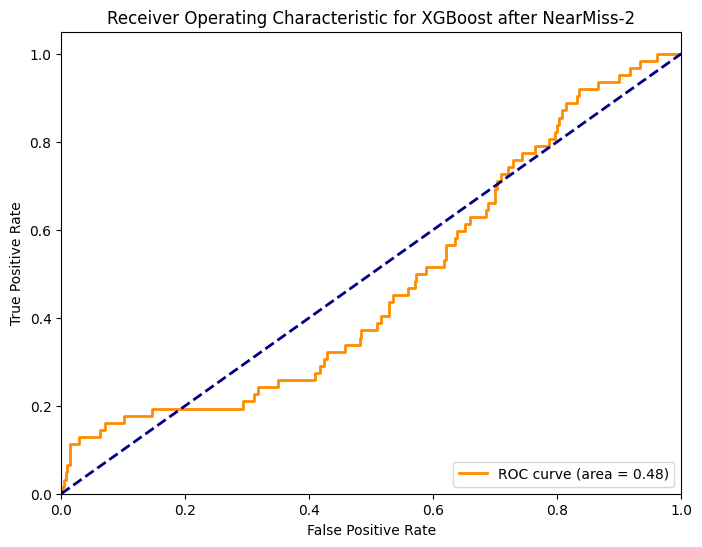

Confusion Matrix:
 [[178 782]
 [  8  54]]


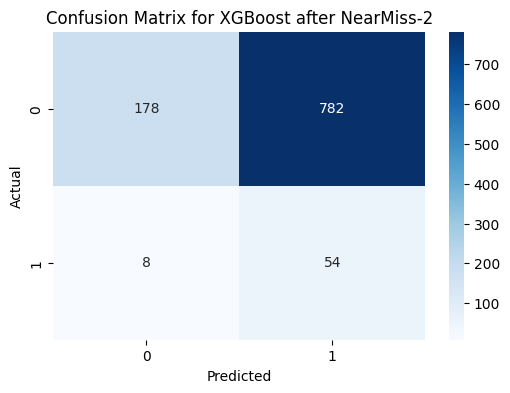

[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 281
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

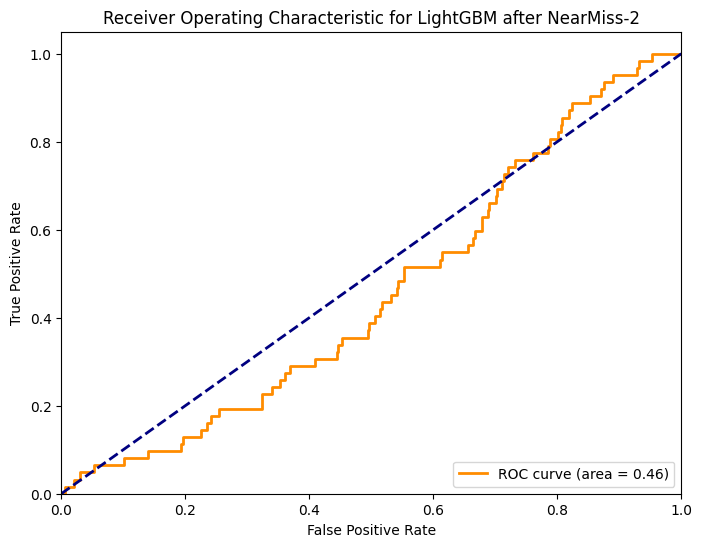

Confusion Matrix:
 [[176 784]
 [  9  53]]


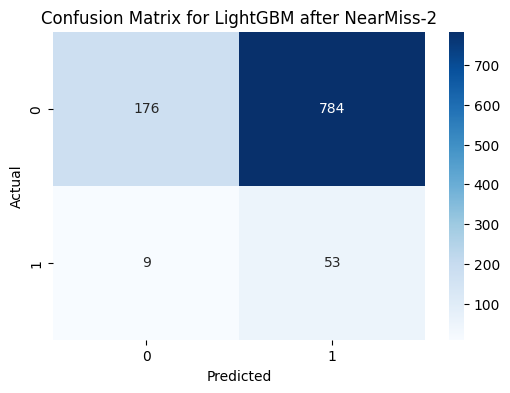


Model: CatBoost after NearMiss-2
Accuracy: 0.22015655577299412
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.18      0.31       960
           1       0.06      0.81      0.11        62

    accuracy                           0.22      1022
   macro avg       0.50      0.49      0.21      1022
weighted avg       0.88      0.22      0.29      1022

ROC AUC Score: 0.4961693548387096


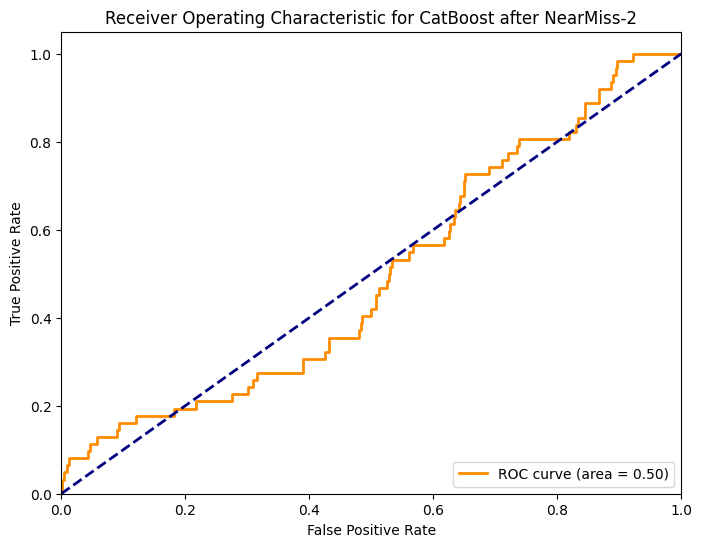

Confusion Matrix:
 [[175 785]
 [ 12  50]]


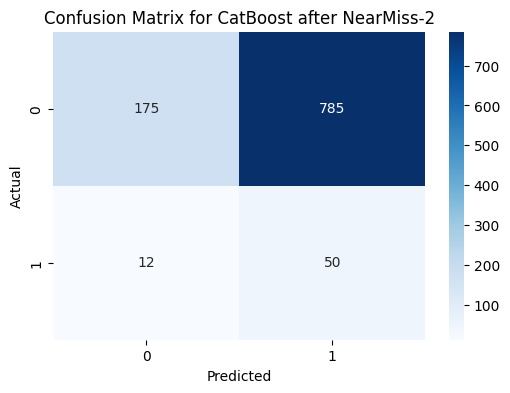


Model: k-Nearest Neighbors after NearMiss-2
Accuracy: 0.3913894324853229
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.38      0.54       960
           1       0.06      0.56      0.10        62

    accuracy                           0.39      1022
   macro avg       0.49      0.47      0.32      1022
weighted avg       0.88      0.39      0.51      1022

ROC AUC Score: 0.45216733870967746


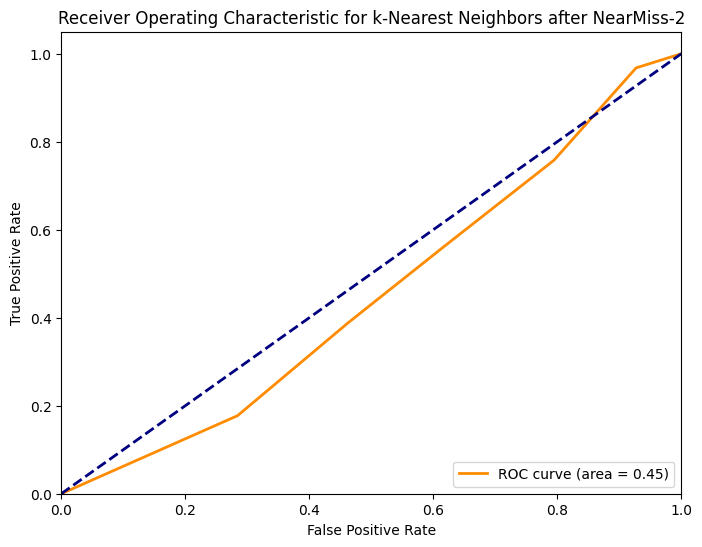

Confusion Matrix:
 [[365 595]
 [ 27  35]]


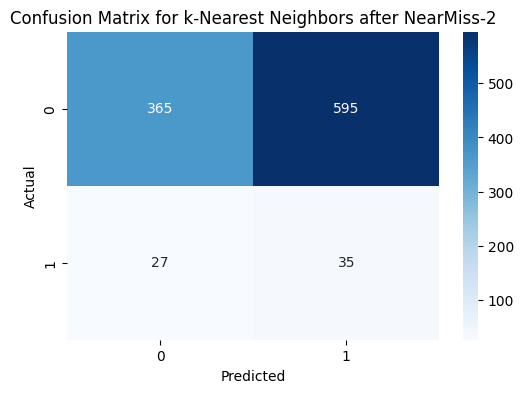


Model: Decision Tree after NearMiss-2
Accuracy: 0.21428571428571427
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.17      0.29       960
           1       0.06      0.84      0.11        62

    accuracy                           0.21      1022
   macro avg       0.50      0.51      0.20      1022
weighted avg       0.89      0.21      0.28      1022

ROC AUC Score: 0.5063340053763441


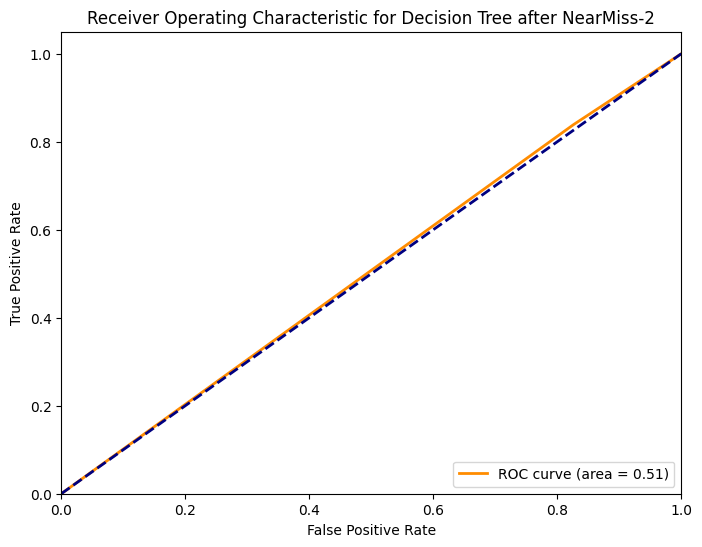

Confusion Matrix:
 [[167 793]
 [ 10  52]]


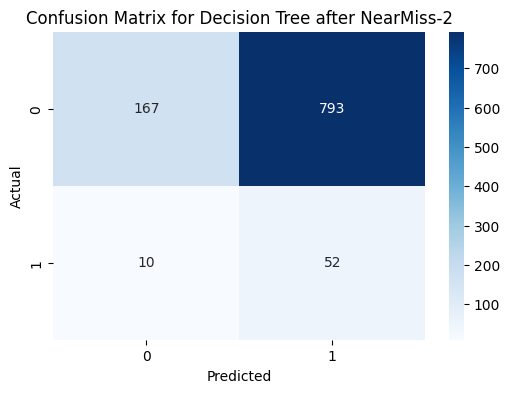


Model: Naive Bayes after NearMiss-2
Accuracy: 0.37377690802348335
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.36      0.52       960
           1       0.05      0.55      0.10        62

    accuracy                           0.37      1022
   macro avg       0.49      0.46      0.31      1022
weighted avg       0.87      0.37      0.50      1022

ROC AUC Score: 0.39193548387096777


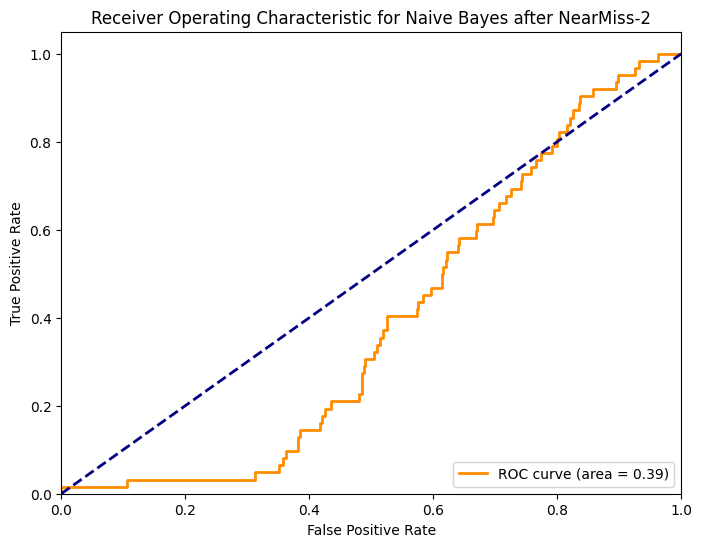

Confusion Matrix:
 [[348 612]
 [ 28  34]]


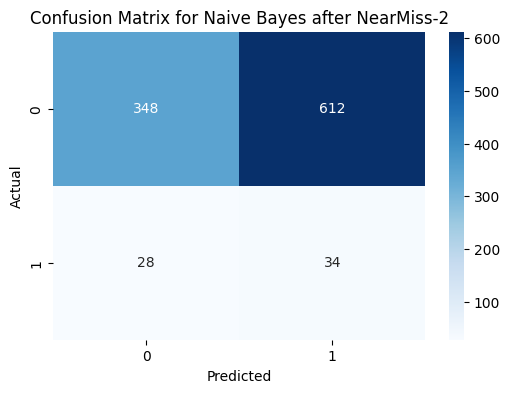


Model: Linear Discriminant Analysis after NearMiss-2
Accuracy: 0.5733855185909981
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.57      0.72       960
           1       0.09      0.63      0.15        62

    accuracy                           0.57      1022
   macro avg       0.52      0.60      0.43      1022
weighted avg       0.91      0.57      0.68      1022

ROC AUC Score: 0.6219254032258065


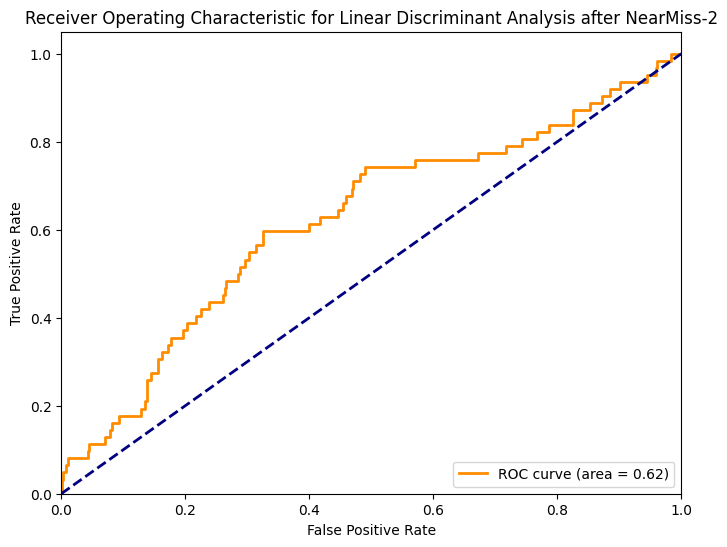

Confusion Matrix:
 [[547 413]
 [ 23  39]]


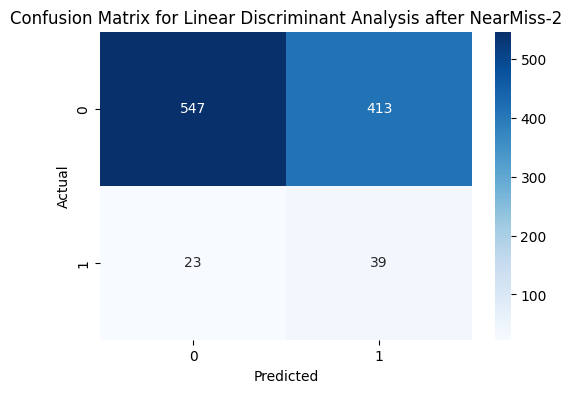


Model: Quadratic Discriminant Analysis after NearMiss-2
Accuracy: 0.2945205479452055
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.27      0.41       960
           1       0.06      0.74      0.11        62

    accuracy                           0.29      1022
   macro avg       0.50      0.50      0.26      1022
weighted avg       0.89      0.29      0.40      1022

ROC AUC Score: 0.4029149865591398


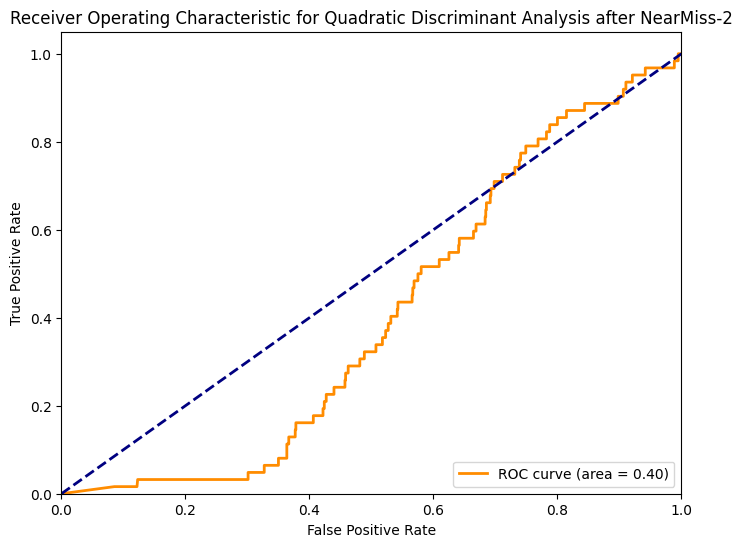

Confusion Matrix:
 [[255 705]
 [ 16  46]]


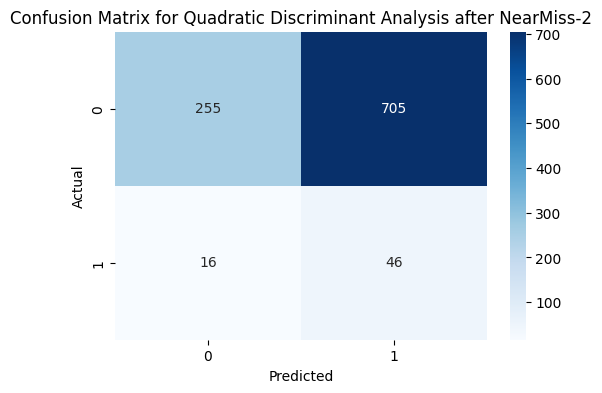


Model: Extra Trees after NearMiss-2
Accuracy: 0.2035225048923679
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.16      0.27       960
           1       0.06      0.89      0.12        62

    accuracy                           0.20      1022
   macro avg       0.51      0.52      0.20      1022
weighted avg       0.90      0.20      0.26      1022

ROC AUC Score: 0.43429939516129035


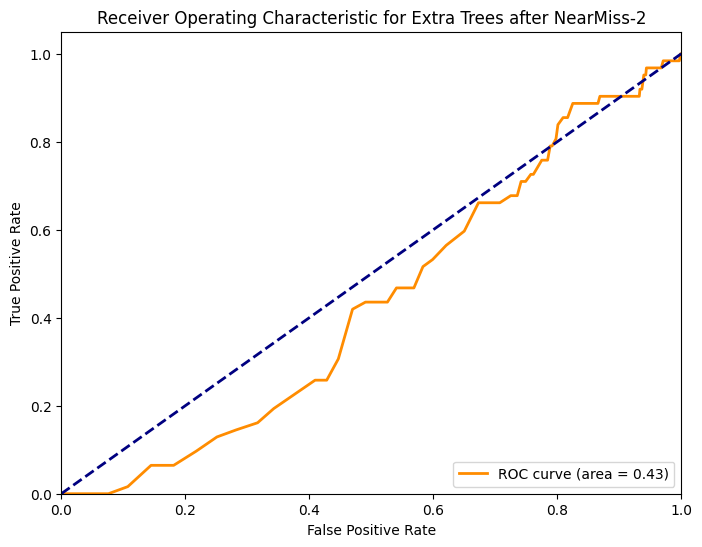

Confusion Matrix:
 [[153 807]
 [  7  55]]


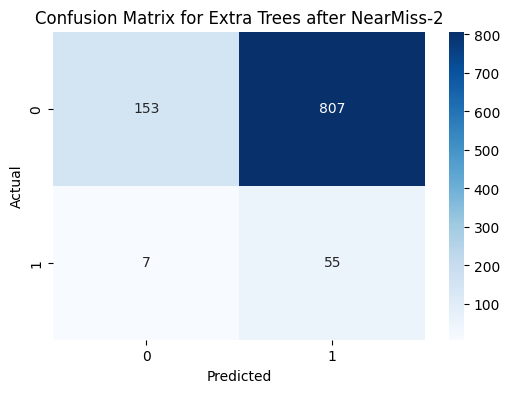


Applying NearMiss-3

Model: Logistic Regression after NearMiss-3
Accuracy: 0.5694716242661448
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.56      0.71       960
           1       0.09      0.71      0.17        62

    accuracy                           0.57      1022
   macro avg       0.53      0.64      0.44      1022
weighted avg       0.91      0.57      0.68      1022

ROC AUC Score: 0.6829637096774194


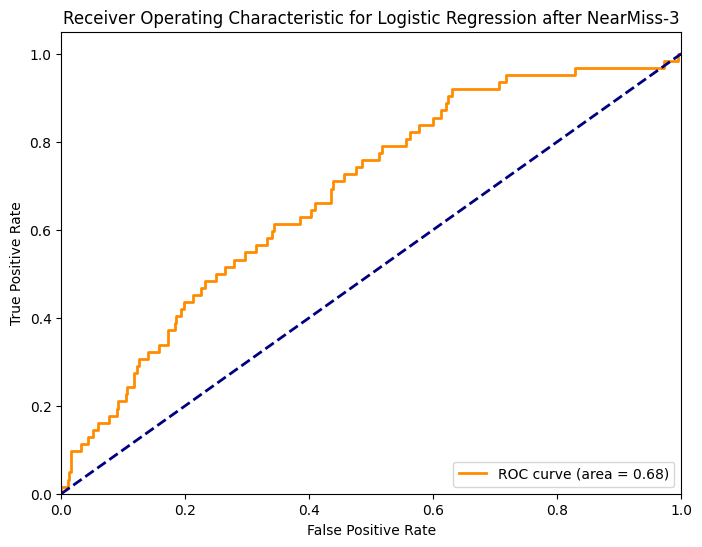

Confusion Matrix:
 [[538 422]
 [ 18  44]]


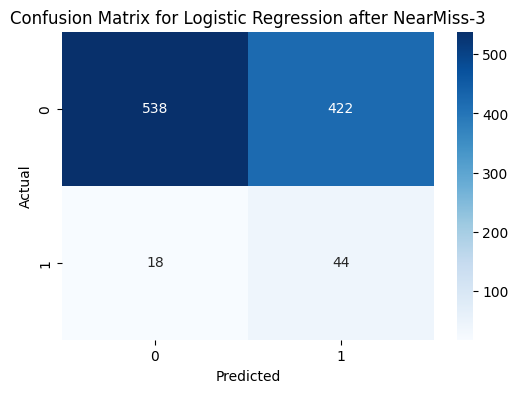


Model: Random Forest after NearMiss-3
Accuracy: 0.5577299412915852
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.55      0.70       960
           1       0.09      0.66      0.15        62

    accuracy                           0.56      1022
   macro avg       0.52      0.61      0.43      1022
weighted avg       0.91      0.56      0.67      1022

ROC AUC Score: 0.6614667338709678


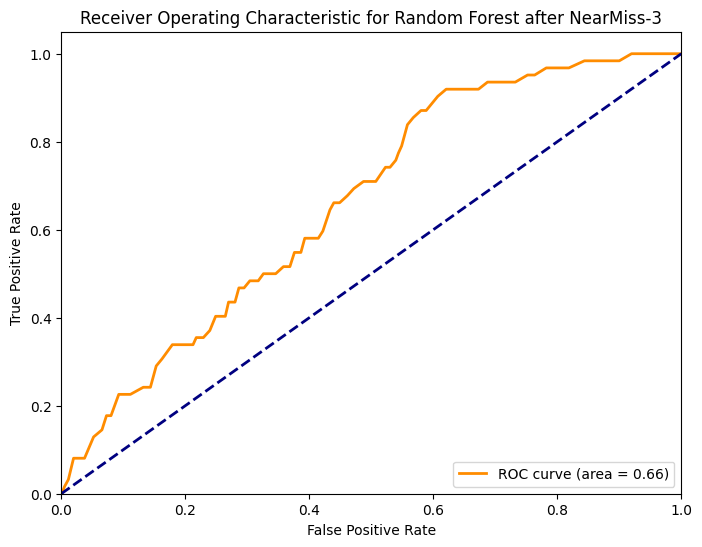

Confusion Matrix:
 [[529 431]
 [ 21  41]]


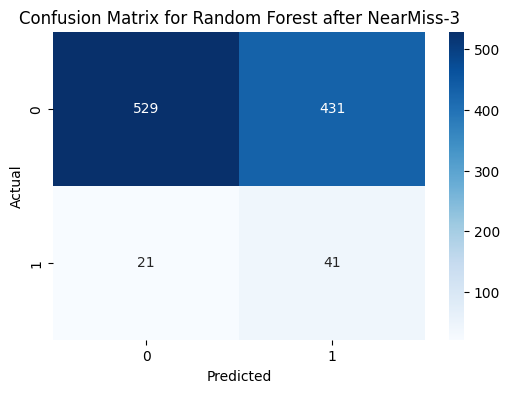


Model: SVM after NearMiss-3
Accuracy: 0.5313111545988258
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.53      0.68       960
           1       0.07      0.58      0.13        62

    accuracy                           0.53      1022
   macro avg       0.51      0.55      0.40      1022
weighted avg       0.90      0.53      0.65      1022

ROC AUC Score: 0.6099966397849462


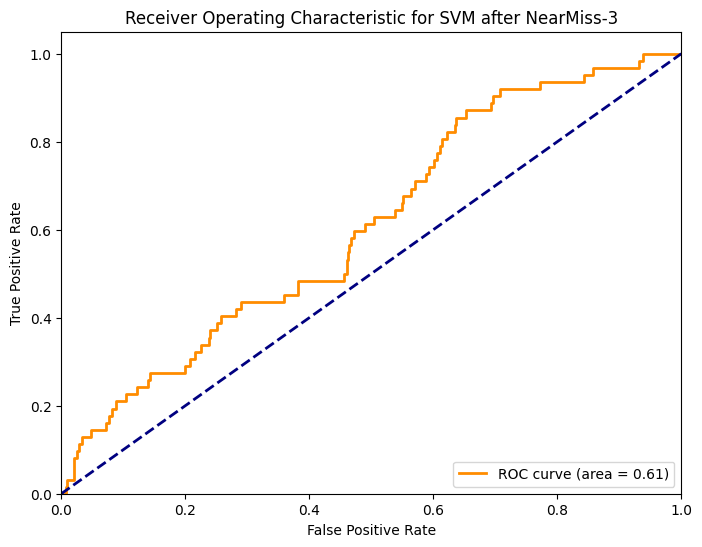

Confusion Matrix:
 [[507 453]
 [ 26  36]]


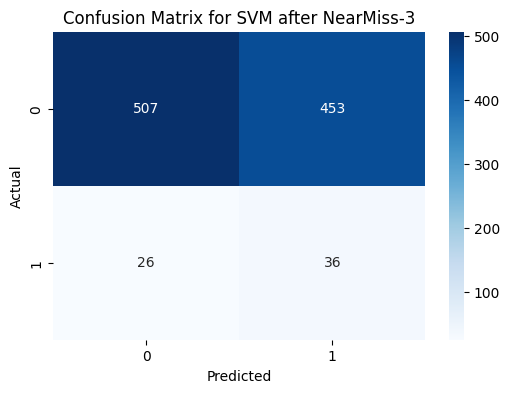


Model: Gradient Boosting after NearMiss-3
Accuracy: 0.5244618395303327
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.51      0.67       960
           1       0.09      0.71      0.15        62

    accuracy                           0.52      1022
   macro avg       0.53      0.61      0.41      1022
weighted avg       0.91      0.52      0.64      1022

ROC AUC Score: 0.6364331317204301


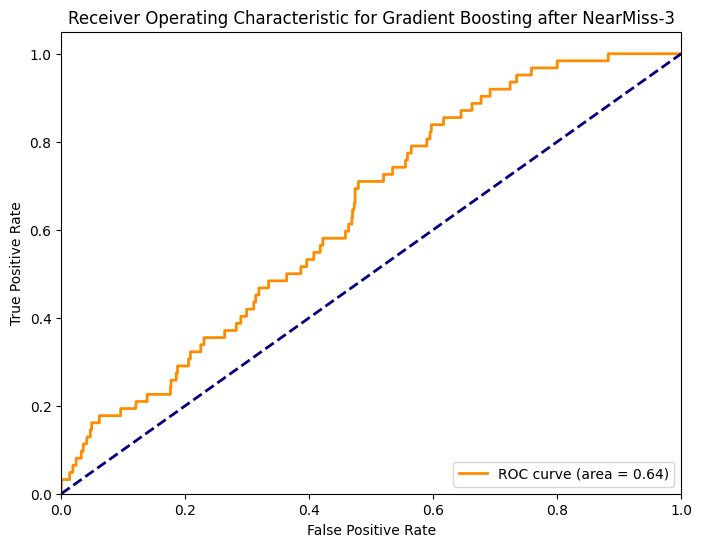

Confusion Matrix:
 [[492 468]
 [ 18  44]]


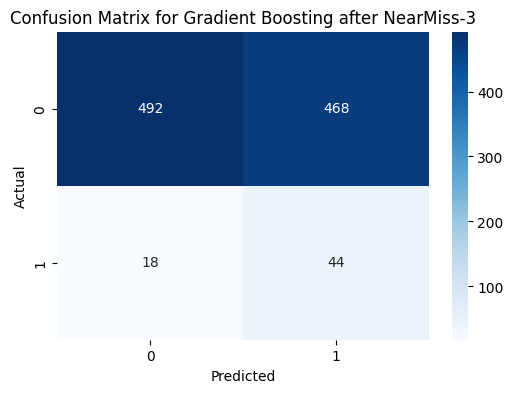


Model: AdaBoost after NearMiss-3
Accuracy: 0.5626223091976517
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.56      0.71       960
           1       0.08      0.55      0.13        62

    accuracy                           0.56      1022
   macro avg       0.51      0.56      0.42      1022
weighted avg       0.90      0.56      0.67      1022

ROC AUC Score: 0.6205645161290323


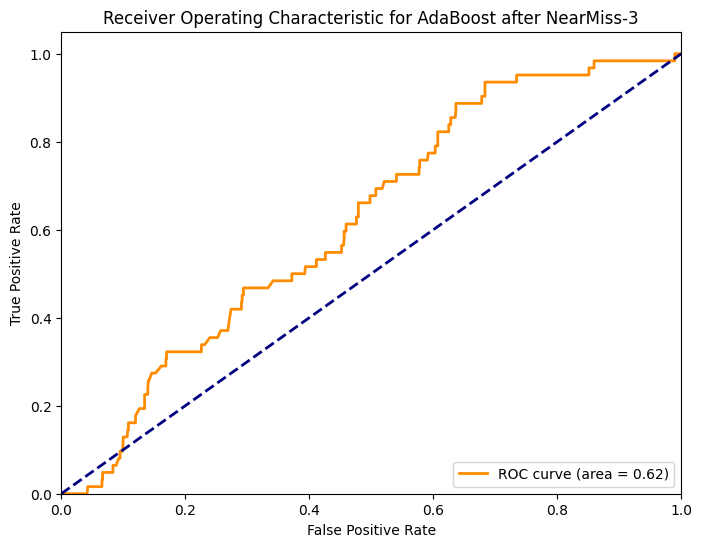

Confusion Matrix:
 [[541 419]
 [ 28  34]]


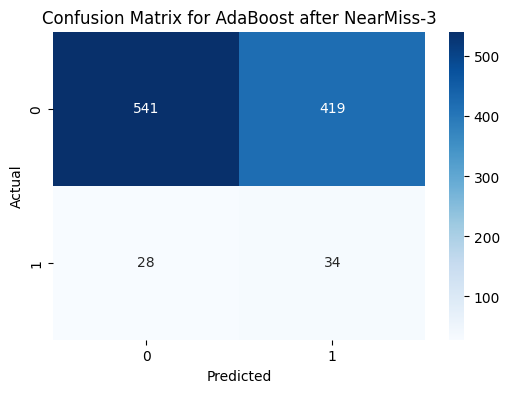


Model: XGBoost after NearMiss-3
Accuracy: 0.547945205479452
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.54      0.69       960
           1       0.09      0.73      0.16        62

    accuracy                           0.55      1022
   macro avg       0.53      0.63      0.43      1022
weighted avg       0.91      0.55      0.66      1022

ROC AUC Score: 0.655241935483871


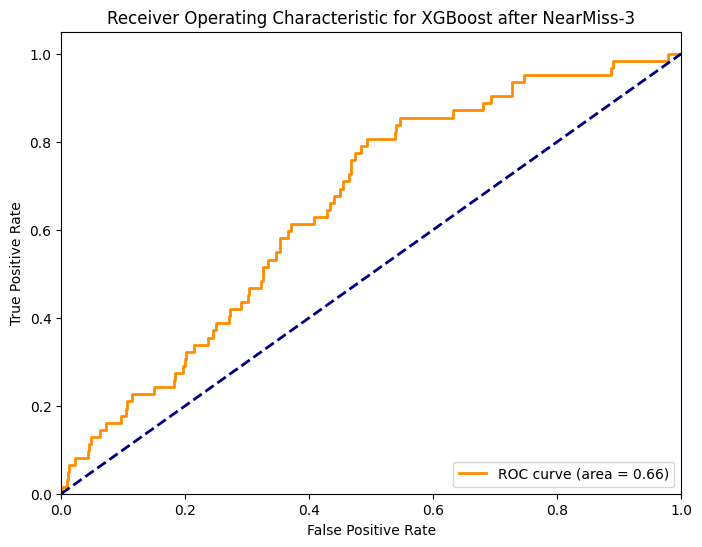

Confusion Matrix:
 [[515 445]
 [ 17  45]]


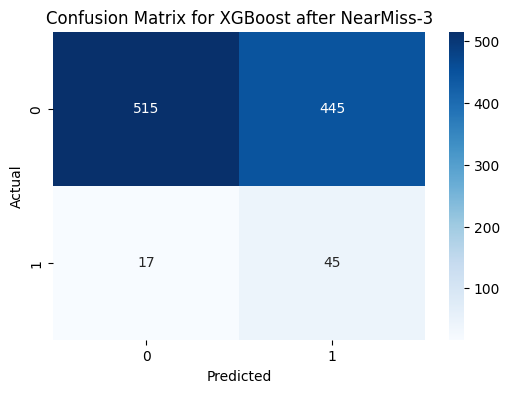

[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 291
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with

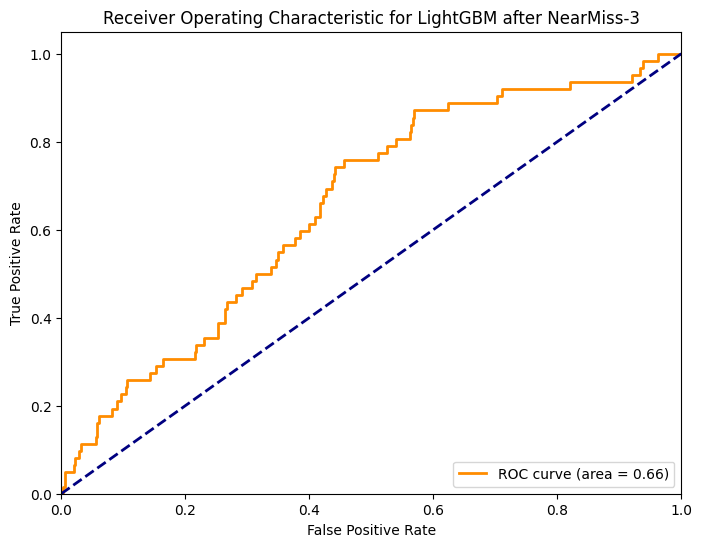

Confusion Matrix:
 [[538 422]
 [ 18  44]]


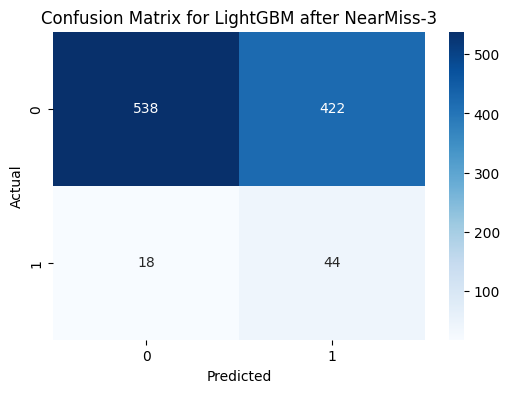


Model: CatBoost after NearMiss-3
Accuracy: 0.541095890410959
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.53      0.69       960
           1       0.08      0.66      0.15        62

    accuracy                           0.54      1022
   macro avg       0.52      0.60      0.42      1022
weighted avg       0.91      0.54      0.65      1022

ROC AUC Score: 0.6787130376344086


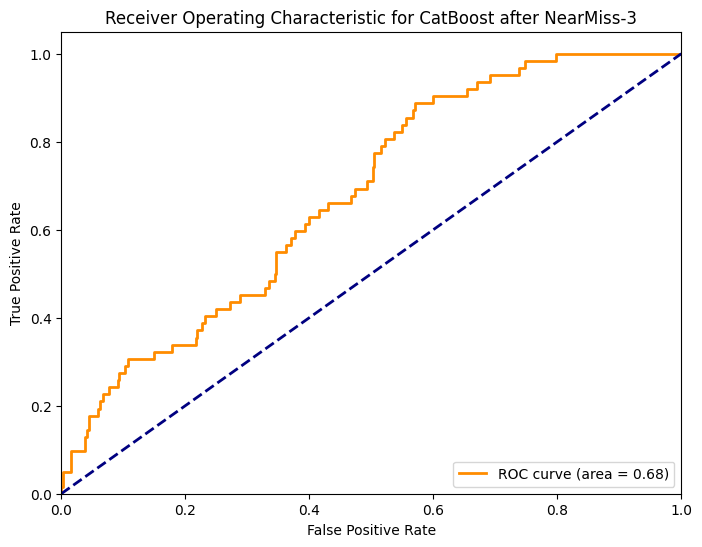

Confusion Matrix:
 [[512 448]
 [ 21  41]]


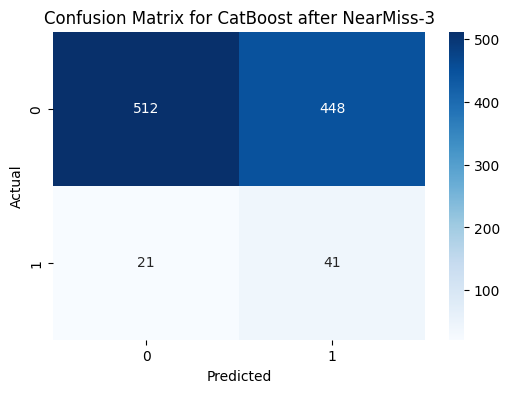


Model: k-Nearest Neighbors after NearMiss-3
Accuracy: 0.4911937377690802
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.48      0.64       960
           1       0.08      0.66      0.14        62

    accuracy                           0.49      1022
   macro avg       0.52      0.57      0.39      1022
weighted avg       0.90      0.49      0.61      1022

ROC AUC Score: 0.5636844758064516


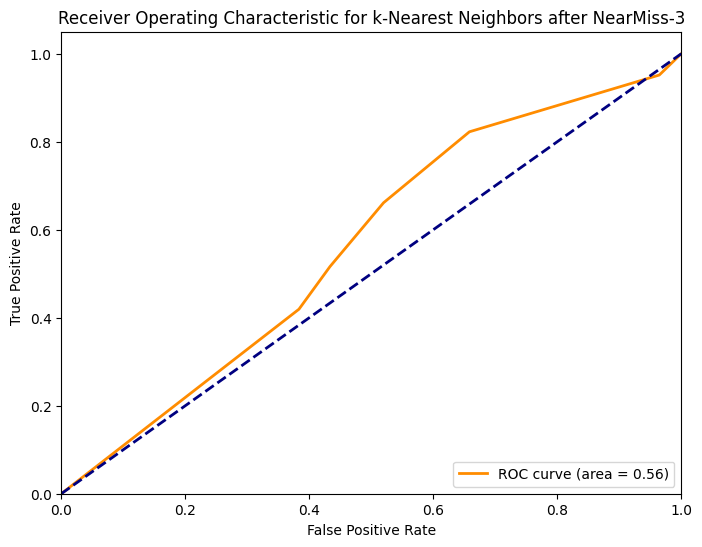

Confusion Matrix:
 [[461 499]
 [ 21  41]]


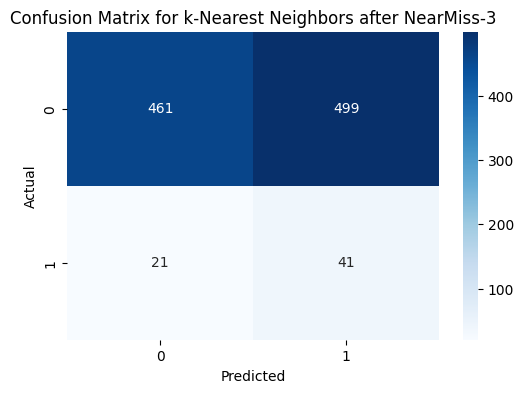


Model: Decision Tree after NearMiss-3
Accuracy: 0.3679060665362035
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.35      0.51       960
           1       0.06      0.66      0.11        62

    accuracy                           0.37      1022
   macro avg       0.50      0.51      0.31      1022
weighted avg       0.89      0.37      0.49      1022

ROC AUC Score: 0.5051243279569892


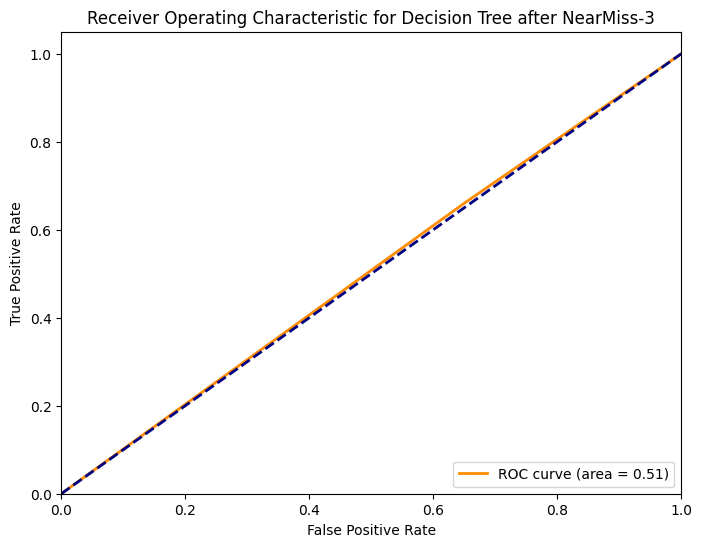

Confusion Matrix:
 [[335 625]
 [ 21  41]]


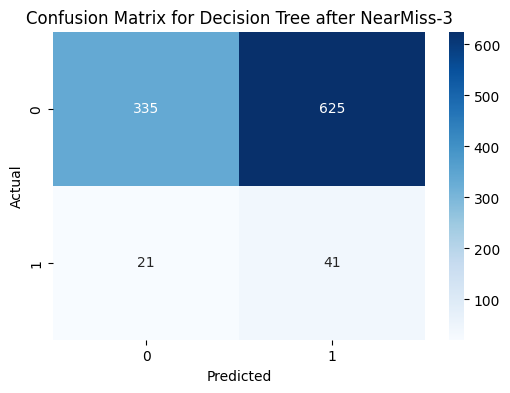


Model: Naive Bayes after NearMiss-3
Accuracy: 0.5782778864970646
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.57      0.72       960
           1       0.10      0.73      0.17        62

    accuracy                           0.58      1022
   macro avg       0.53      0.65      0.44      1022
weighted avg       0.92      0.58      0.68      1022

ROC AUC Score: 0.7062836021505376


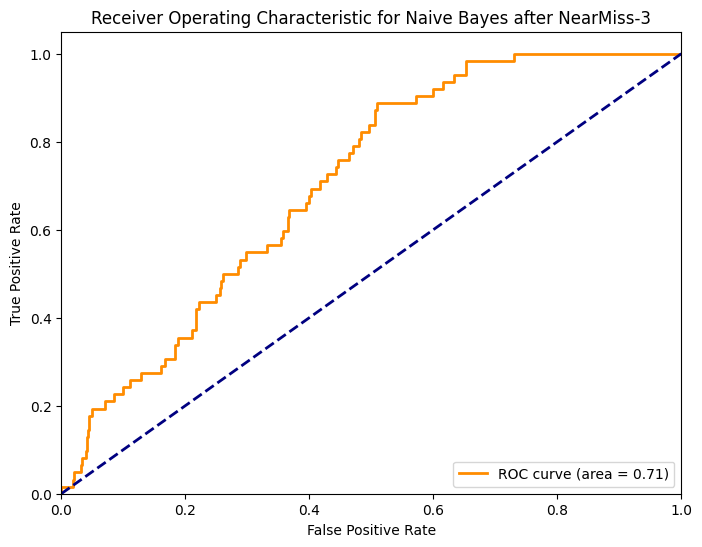

Confusion Matrix:
 [[546 414]
 [ 17  45]]


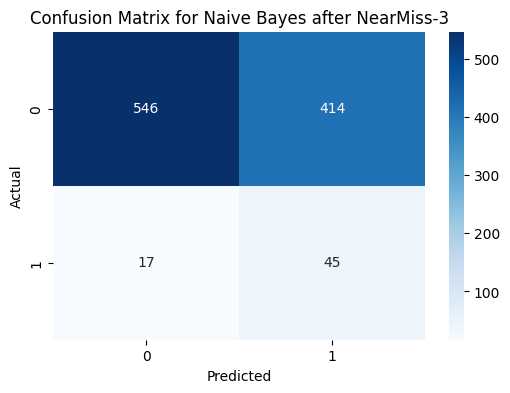


Model: Linear Discriminant Analysis after NearMiss-3
Accuracy: 0.5831702544031311
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.57      0.72       960
           1       0.10      0.71      0.17        62

    accuracy                           0.58      1022
   macro avg       0.53      0.64      0.45      1022
weighted avg       0.92      0.58      0.69      1022

ROC AUC Score: 0.6913474462365592


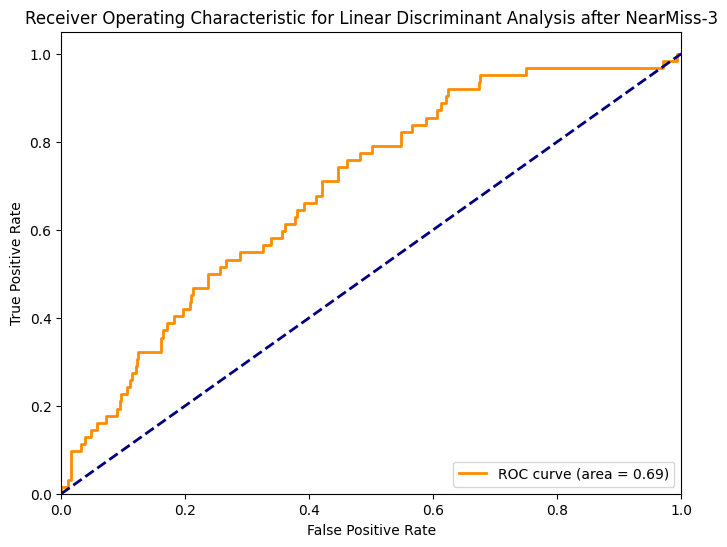

Confusion Matrix:
 [[552 408]
 [ 18  44]]


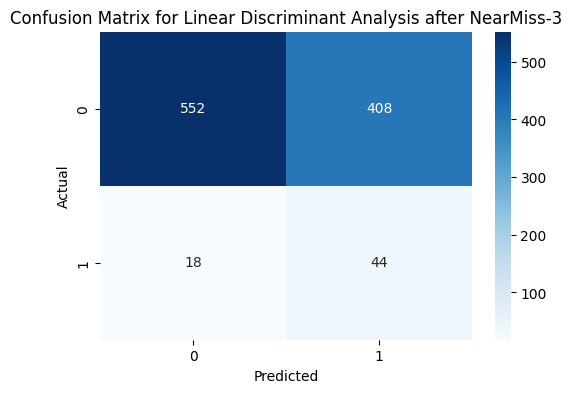


Model: Quadratic Discriminant Analysis after NearMiss-3
Accuracy: 0.5440313111545988
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.53      0.69       960
           1       0.09      0.74      0.16        62

    accuracy                           0.54      1022
   macro avg       0.53      0.64      0.43      1022
weighted avg       0.92      0.54      0.65      1022

ROC AUC Score: 0.6993111559139784


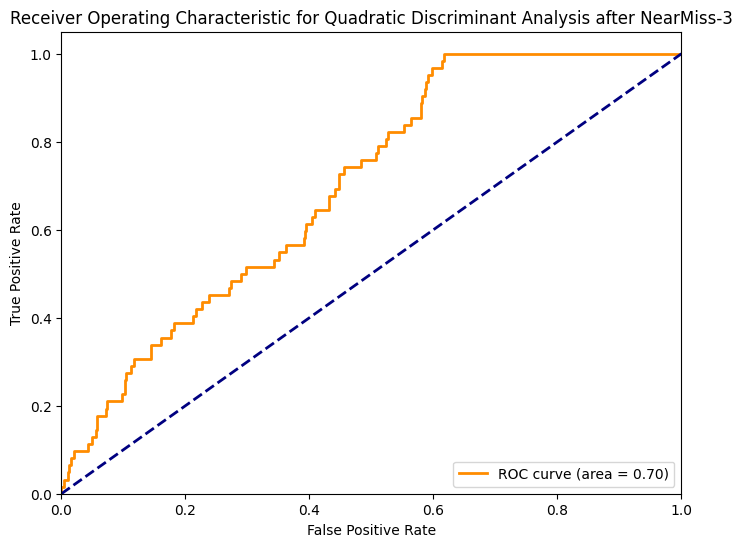

Confusion Matrix:
 [[510 450]
 [ 16  46]]


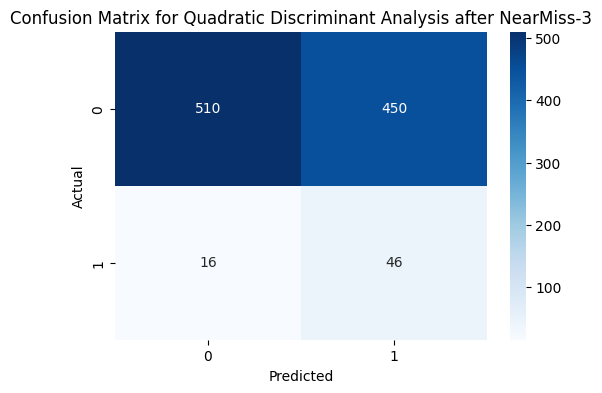


Model: Extra Trees after NearMiss-3
Accuracy: 0.5048923679060665
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.49      0.65       960
           1       0.08      0.73      0.15        62

    accuracy                           0.50      1022
   macro avg       0.52      0.61      0.40      1022
weighted avg       0.91      0.50      0.62      1022

ROC AUC Score: 0.6510836693548387


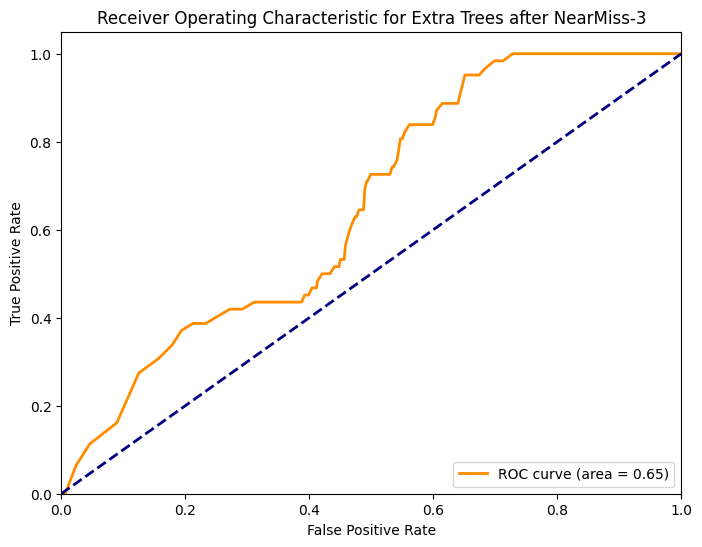

Confusion Matrix:
 [[471 489]
 [ 17  45]]


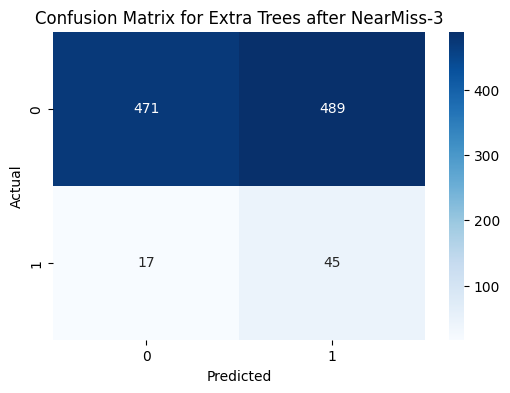


Applying TomekLinks

Model: Logistic Regression after TomekLinks
Accuracy: 0.9393346379647749
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.8512432795698925


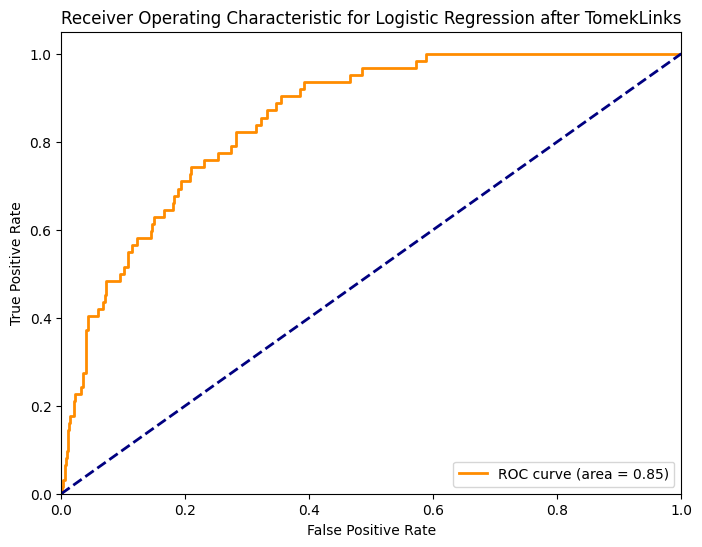

Confusion Matrix:
 [[960   0]
 [ 62   0]]


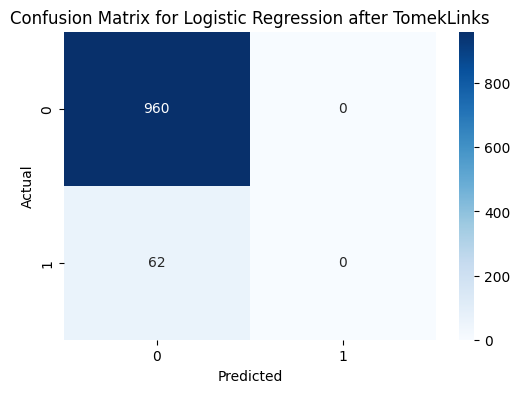


Model: Random Forest after TomekLinks
Accuracy: 0.9403131115459883
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022

ROC AUC Score: 0.815667002688172


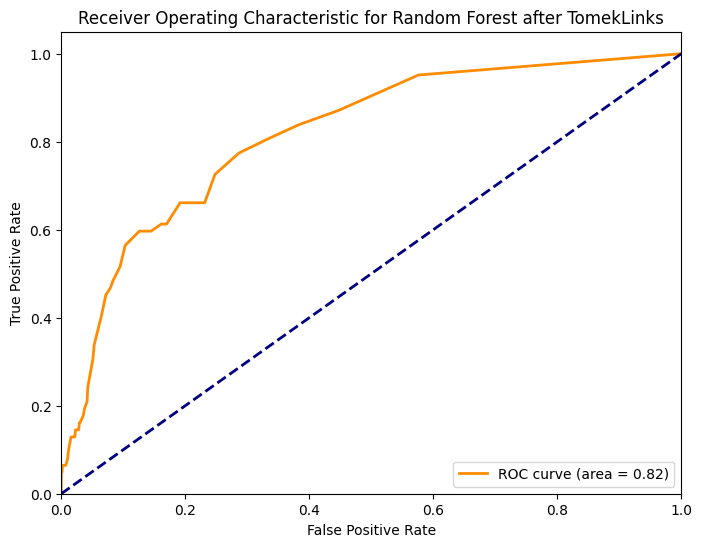

Confusion Matrix:
 [[960   0]
 [ 61   1]]


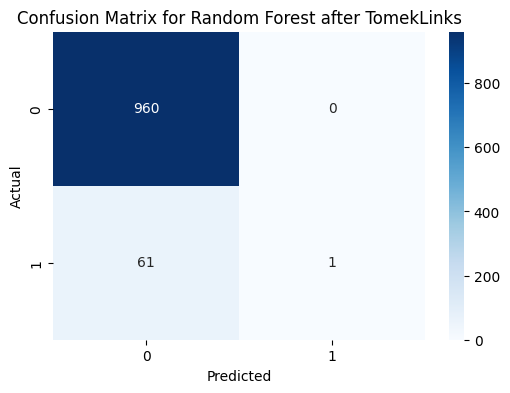


Model: SVM after TomekLinks
Accuracy: 0.9393346379647749
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.6294186827956989


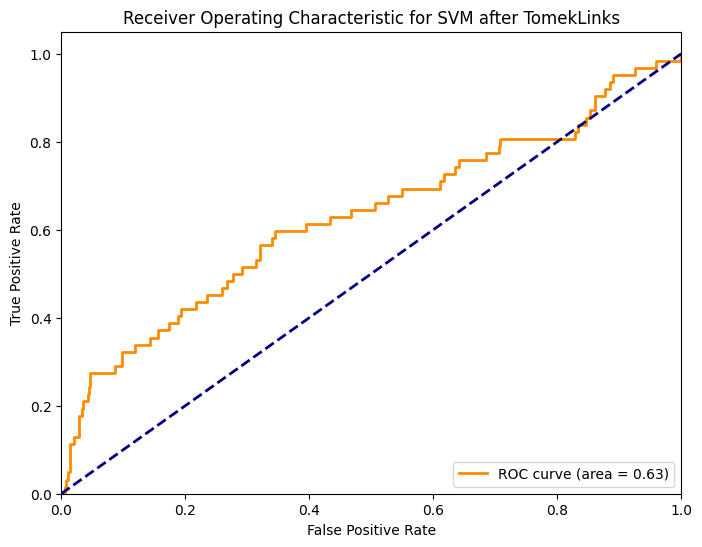

Confusion Matrix:
 [[960   0]
 [ 62   0]]


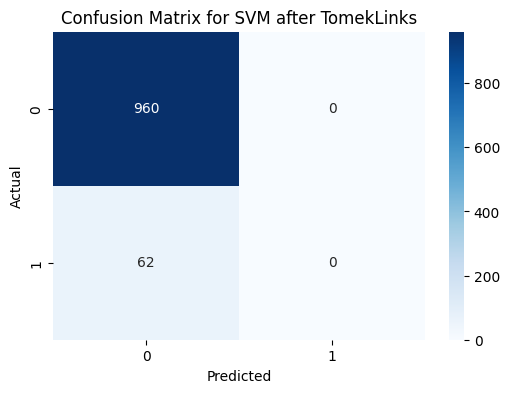


Model: Gradient Boosting after TomekLinks
Accuracy: 0.9403131115459883
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022

ROC AUC Score: 0.8432207661290322


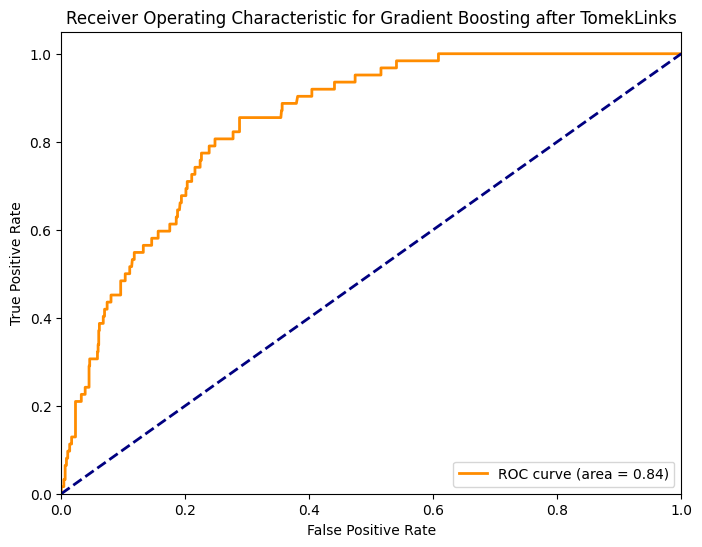

Confusion Matrix:
 [[960   0]
 [ 61   1]]


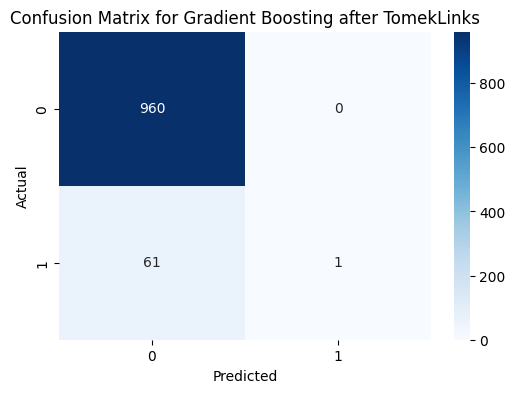


Model: AdaBoost after TomekLinks
Accuracy: 0.9403131115459883
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.67      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.80      0.52      0.52      1022
weighted avg       0.92      0.94      0.91      1022

ROC AUC Score: 0.7918262768817204


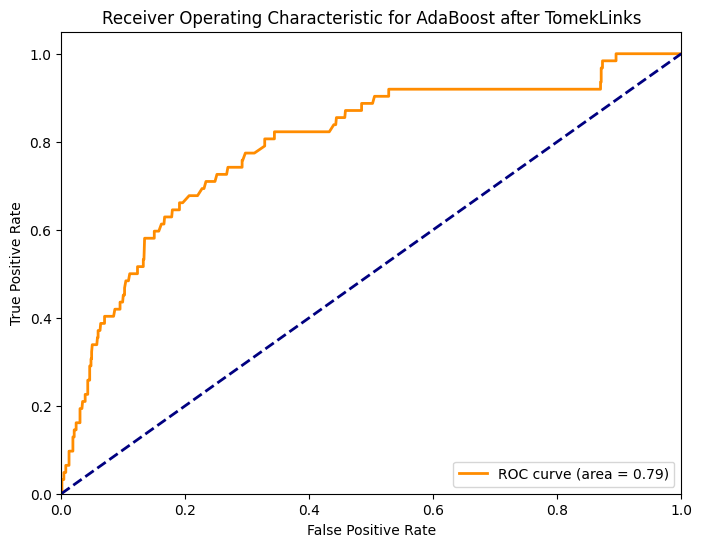

Confusion Matrix:
 [[959   1]
 [ 60   2]]


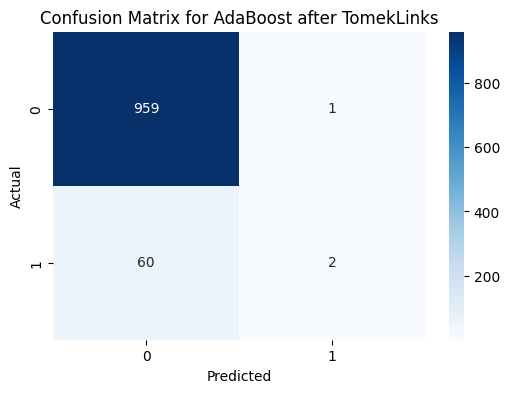


Model: XGBoost after TomekLinks
Accuracy: 0.9344422700587084
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.35      0.10      0.15        62

    accuracy                           0.93      1022
   macro avg       0.65      0.54      0.56      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8049899193548388


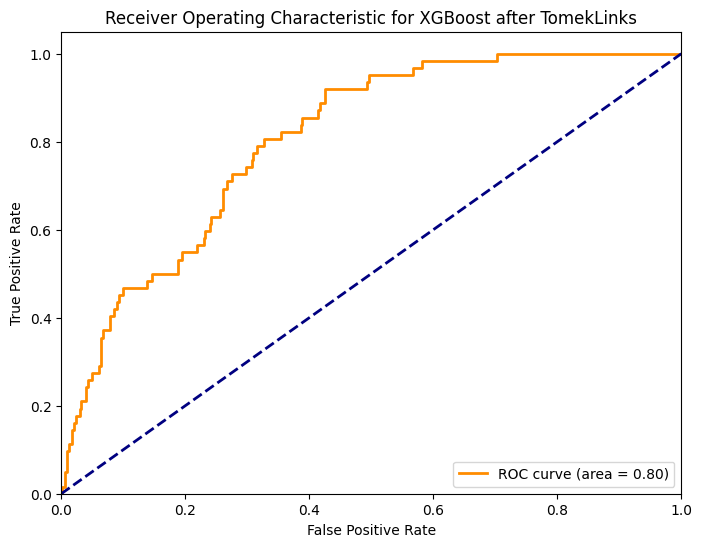

Confusion Matrix:
 [[949  11]
 [ 56   6]]


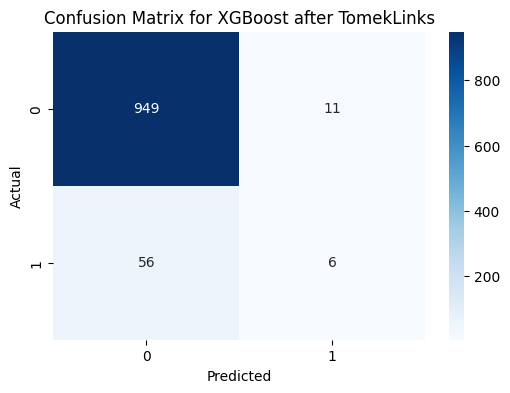

[LightGBM] [Info] Number of positive: 187, number of negative: 3810
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000443 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3997, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.046785 -> initscore=-3.014276
[LightGBM] [Info] Start training from score -3.014276

Model: LightGBM after TomekLinks
Accuracy: 0.9383561643835616
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.46      0.10      0.16        62

    accuracy                           0.94      1022
   macro avg       0.70      0.54      0.56      1022
weighted avg       0.92      0.94      0.92      1022

ROC AUC Score: 0.822328629032258


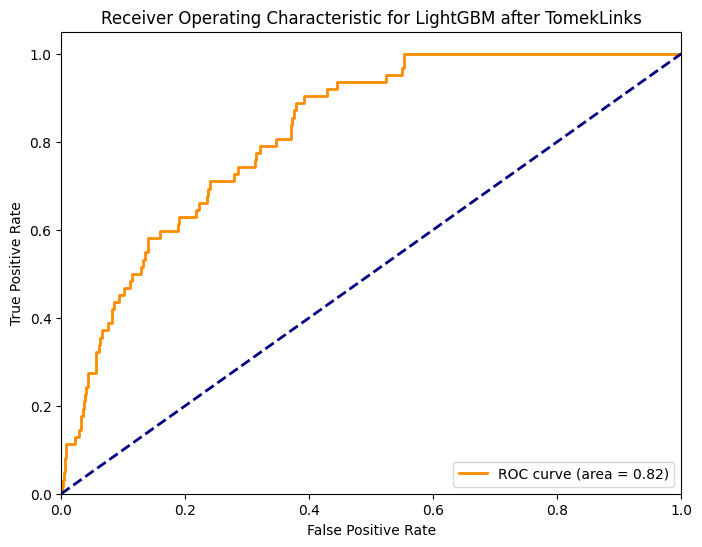

Confusion Matrix:
 [[953   7]
 [ 56   6]]


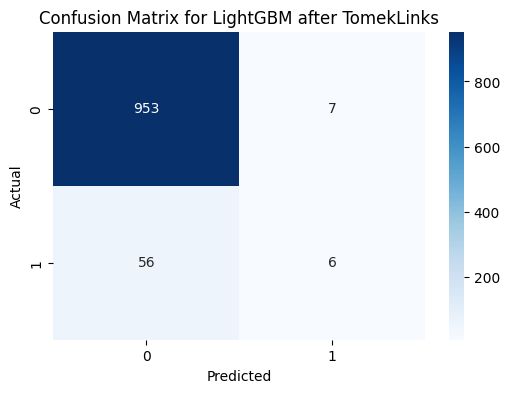


Model: CatBoost after TomekLinks
Accuracy: 0.9383561643835616
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.40      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.67      0.51      0.51      1022
weighted avg       0.91      0.94      0.91      1022

ROC AUC Score: 0.8179939516129033


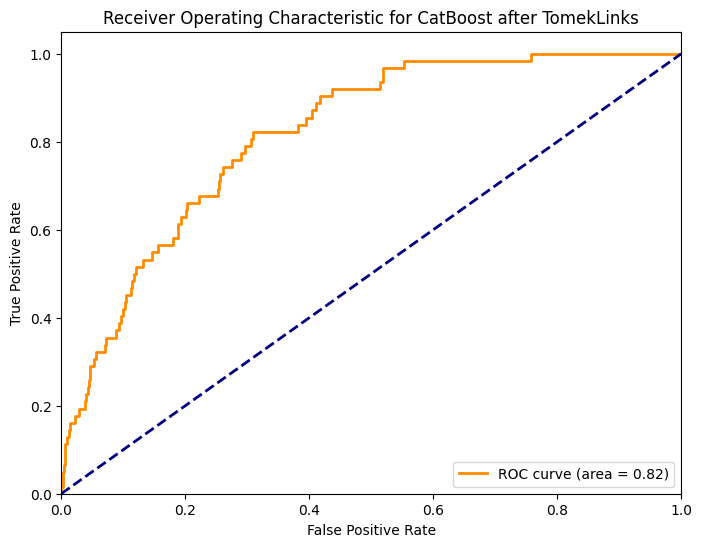

Confusion Matrix:
 [[957   3]
 [ 60   2]]


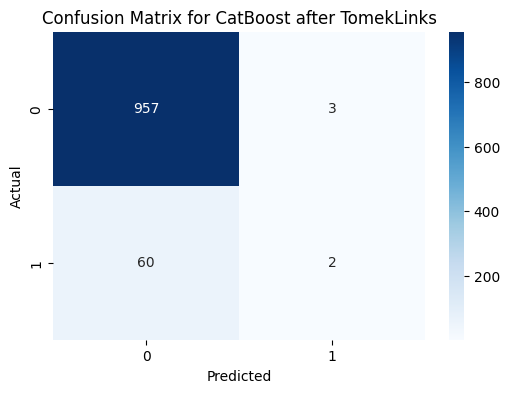


Model: k-Nearest Neighbors after TomekLinks
Accuracy: 0.9403131115459883
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022

ROC AUC Score: 0.6585181451612904


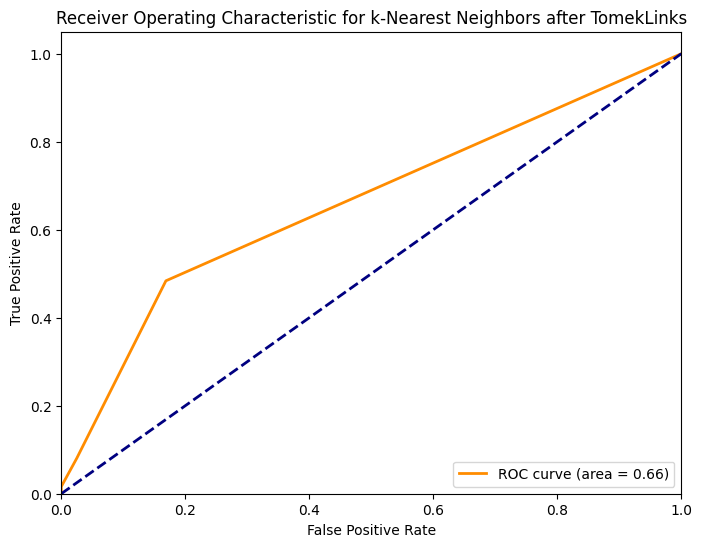

Confusion Matrix:
 [[960   0]
 [ 61   1]]


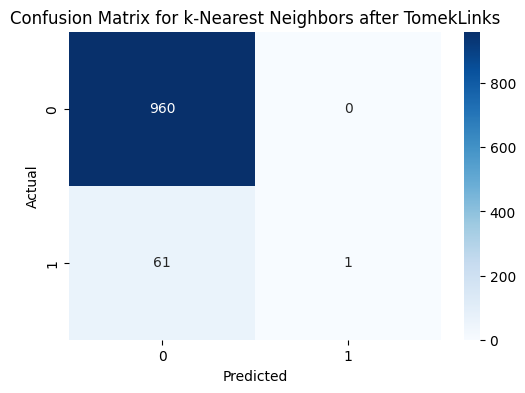


Model: Decision Tree after TomekLinks
Accuracy: 0.9031311154598826
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95       960
           1       0.16      0.15      0.15        62

    accuracy                           0.90      1022
   macro avg       0.55      0.55      0.55      1022
weighted avg       0.90      0.90      0.90      1022

ROC AUC Score: 0.548622311827957


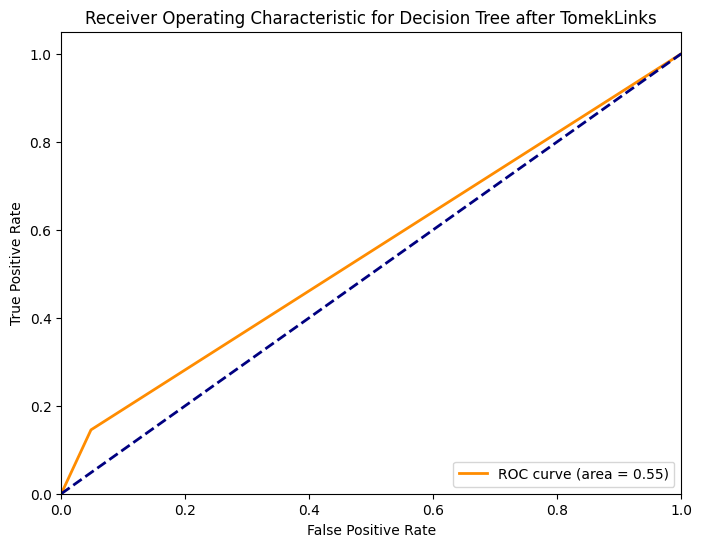

Confusion Matrix:
 [[914  46]
 [ 53   9]]


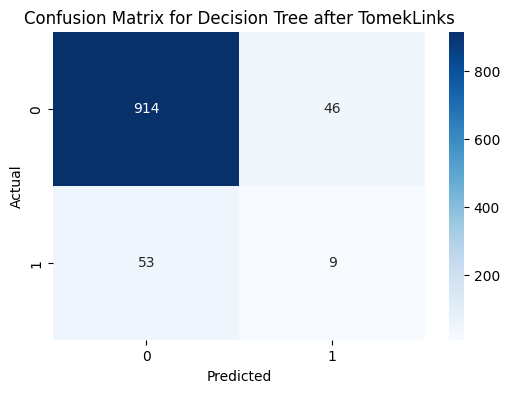


Model: Naive Bayes after TomekLinks
Accuracy: 0.8639921722113503
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.92       960
           1       0.21      0.47      0.29        62

    accuracy                           0.86      1022
   macro avg       0.59      0.68      0.61      1022
weighted avg       0.92      0.86      0.89      1022

ROC AUC Score: 0.8284610215053763


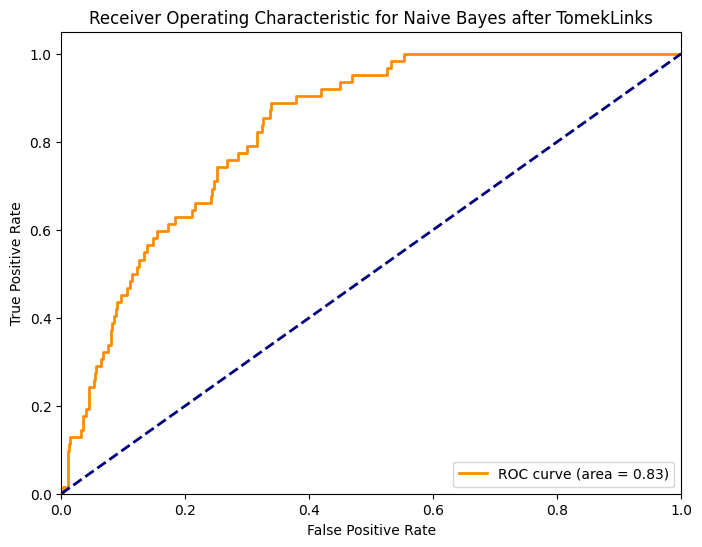

Confusion Matrix:
 [[854 106]
 [ 33  29]]


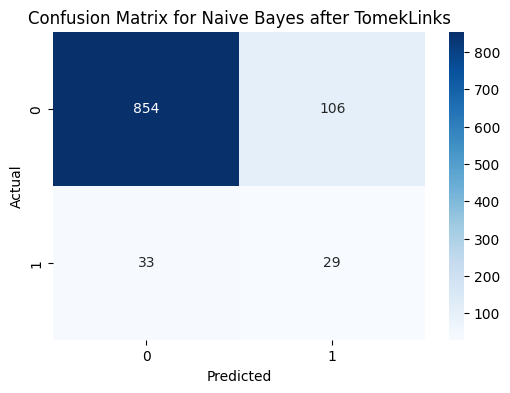


Model: Linear Discriminant Analysis after TomekLinks
Accuracy: 0.9305283757338552
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.24      0.06      0.10        62

    accuracy                           0.93      1022
   macro avg       0.59      0.53      0.53      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.8406754032258064


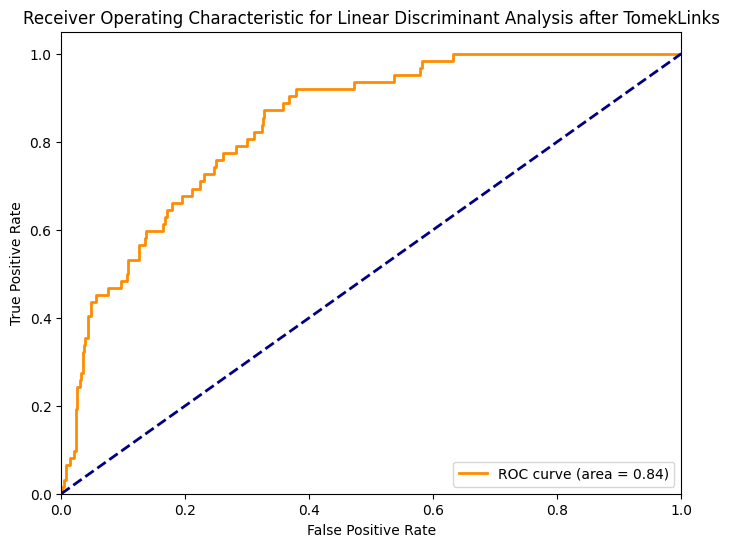

Confusion Matrix:
 [[947  13]
 [ 58   4]]


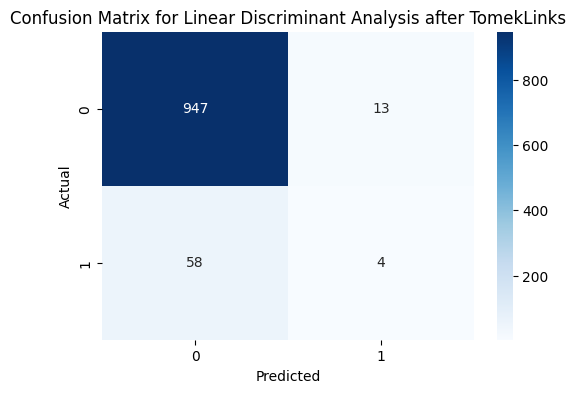


Model: Quadratic Discriminant Analysis after TomekLinks
Accuracy: 0.8767123287671232
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.90      0.93       960
           1       0.25      0.50      0.33        62

    accuracy                           0.88      1022
   macro avg       0.61      0.70      0.63      1022
weighted avg       0.92      0.88      0.90      1022

ROC AUC Score: 0.8300235215053764


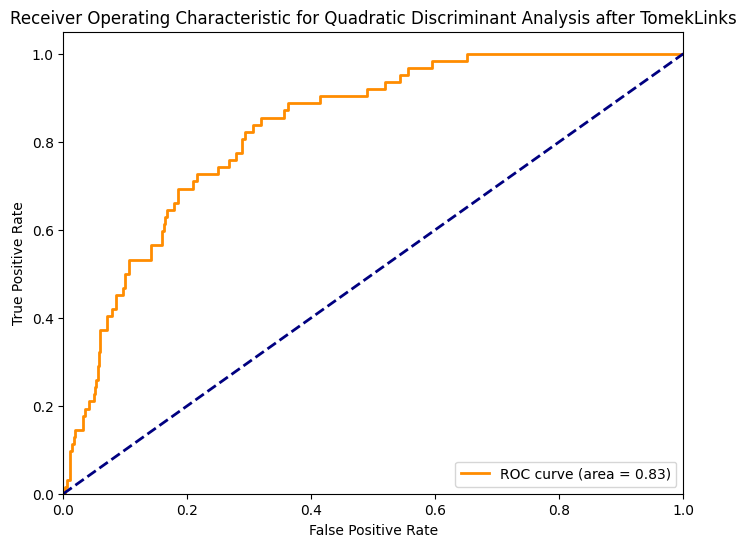

Confusion Matrix:
 [[865  95]
 [ 31  31]]


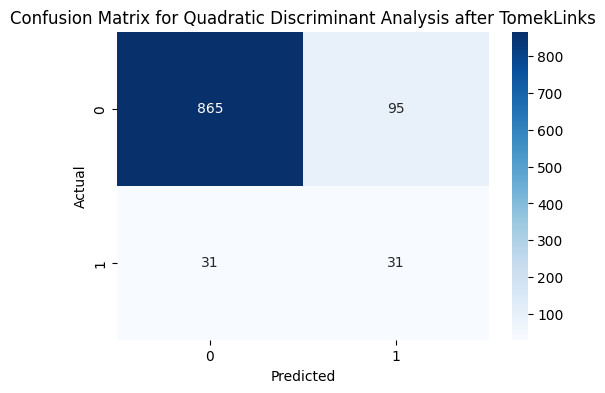


Model: Extra Trees after TomekLinks
Accuracy: 0.9324853228962818
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.11      0.02      0.03        62

    accuracy                           0.93      1022
   macro avg       0.53      0.50      0.50      1022
weighted avg       0.89      0.93      0.91      1022

ROC AUC Score: 0.7646421370967742


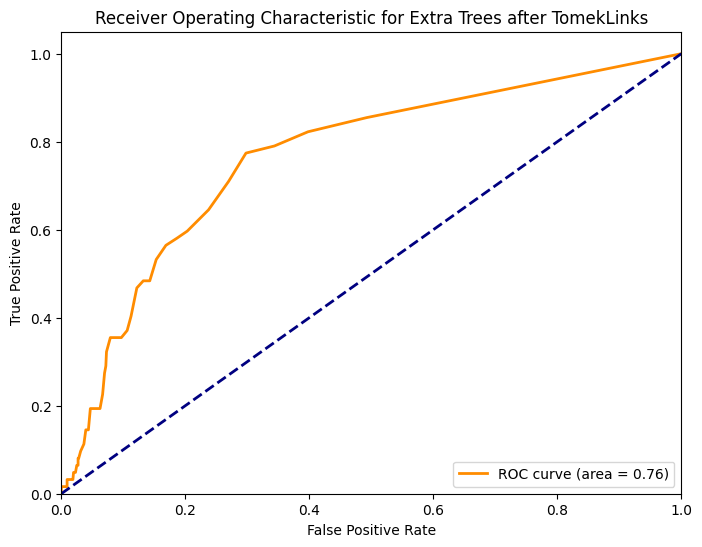

Confusion Matrix:
 [[952   8]
 [ 61   1]]


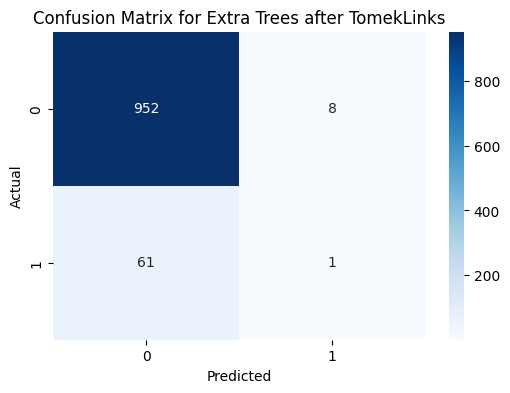


Applying EditedNearestNeighbours

Model: Logistic Regression after EditedNearestNeighbours
Accuracy: 0.9373776908023483
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.25      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.60      0.51      0.50      1022
weighted avg       0.90      0.94      0.91      1022

ROC AUC Score: 0.8516297043010752


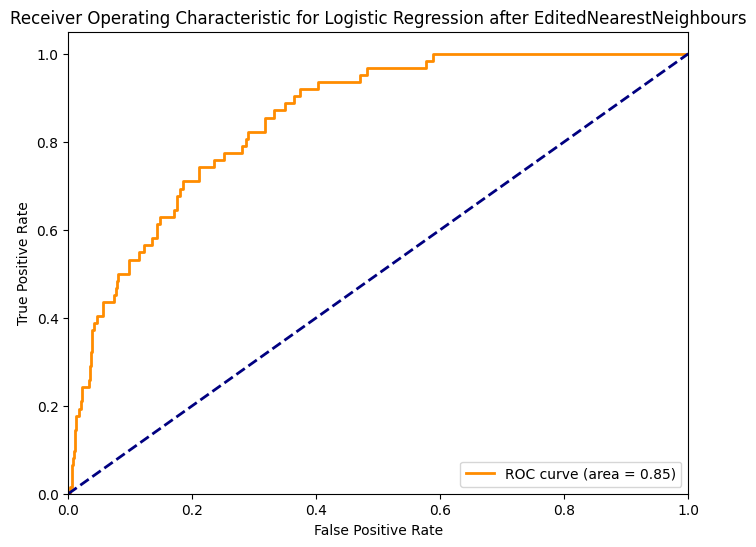

Confusion Matrix:
 [[957   3]
 [ 61   1]]


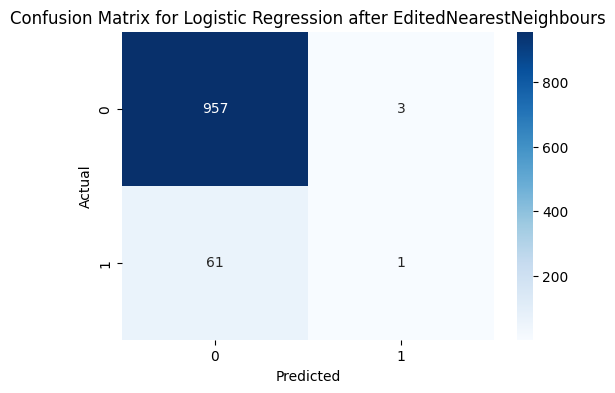


Model: Random Forest after EditedNearestNeighbours
Accuracy: 0.9383561643835616
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.45      0.08      0.14        62

    accuracy                           0.94      1022
   macro avg       0.70      0.54      0.55      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.8134996639784946


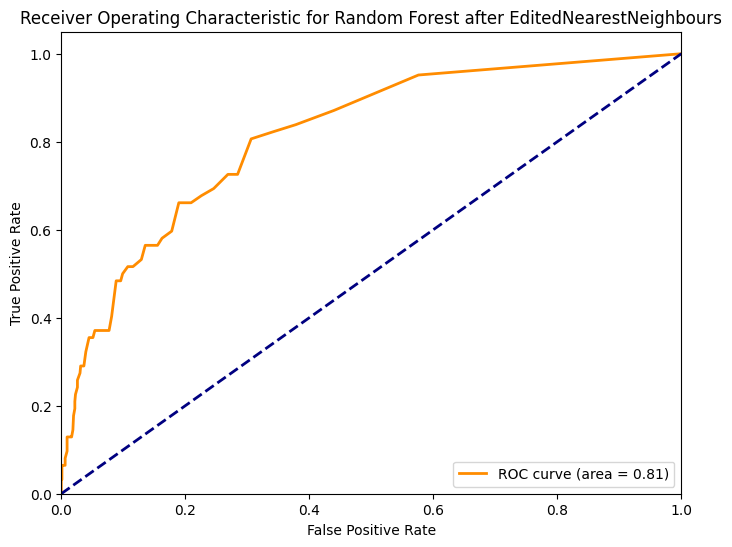

Confusion Matrix:
 [[954   6]
 [ 57   5]]


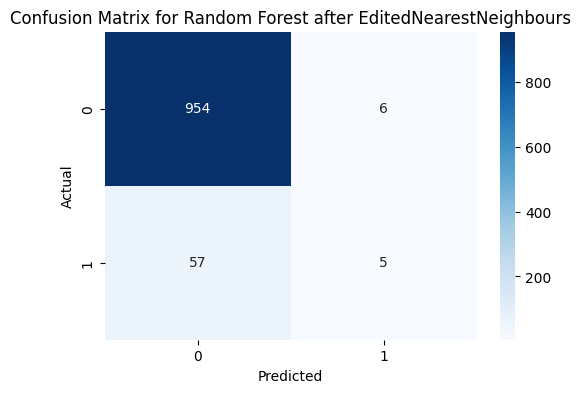


Model: SVM after EditedNearestNeighbours
Accuracy: 0.9373776908023483
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.25      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.60      0.51      0.50      1022
weighted avg       0.90      0.94      0.91      1022

ROC AUC Score: 0.7094590053763441


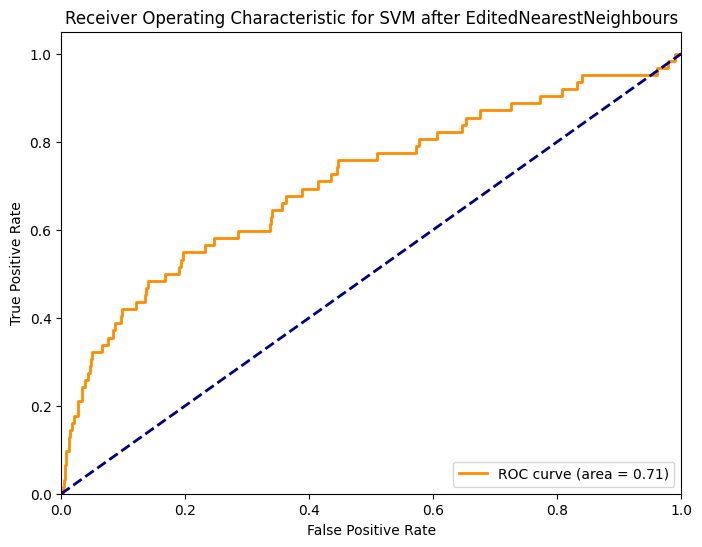

Confusion Matrix:
 [[957   3]
 [ 61   1]]


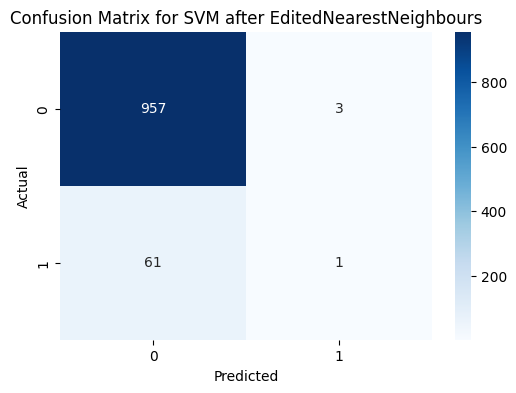


Model: Gradient Boosting after EditedNearestNeighbours
Accuracy: 0.9373776908023483
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97       960
           1       0.44      0.11      0.18        62

    accuracy                           0.94      1022
   macro avg       0.69      0.55      0.57      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.850638440860215


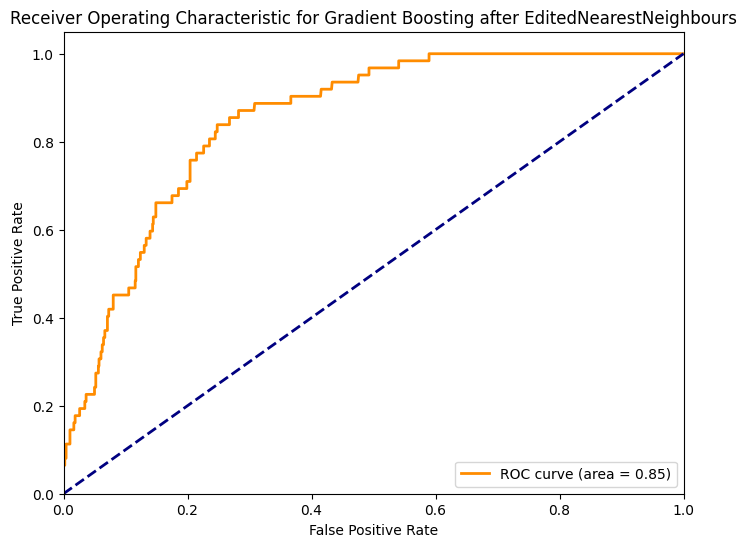

Confusion Matrix:
 [[951   9]
 [ 55   7]]


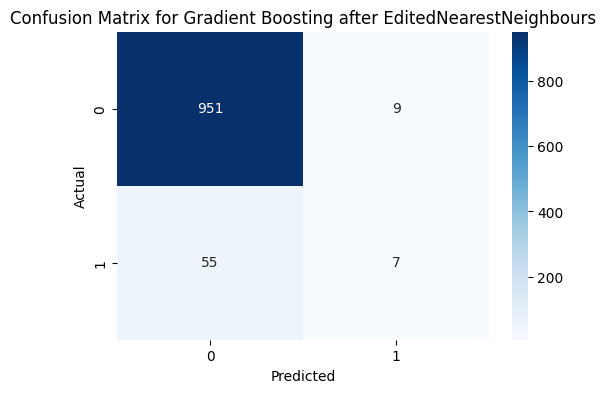


Model: AdaBoost after EditedNearestNeighbours
Accuracy: 0.9373776908023483
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.40      0.06      0.11        62

    accuracy                           0.94      1022
   macro avg       0.67      0.53      0.54      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.8386172715053763


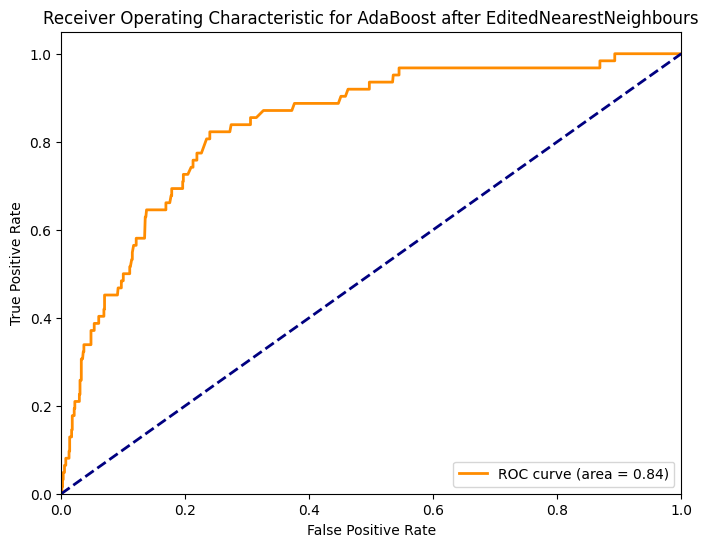

Confusion Matrix:
 [[954   6]
 [ 58   4]]


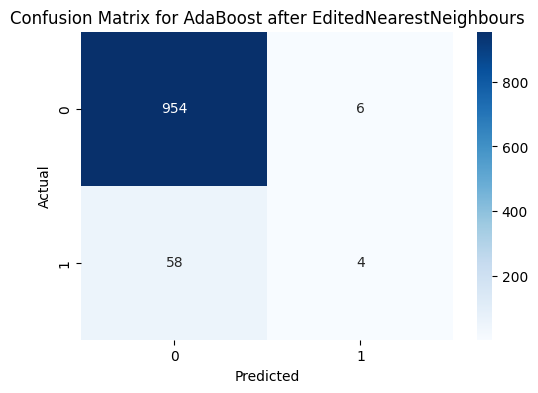


Model: XGBoost after EditedNearestNeighbours
Accuracy: 0.9275929549902152
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.32      0.18      0.23        62

    accuracy                           0.93      1022
   macro avg       0.64      0.58      0.60      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8078461021505376


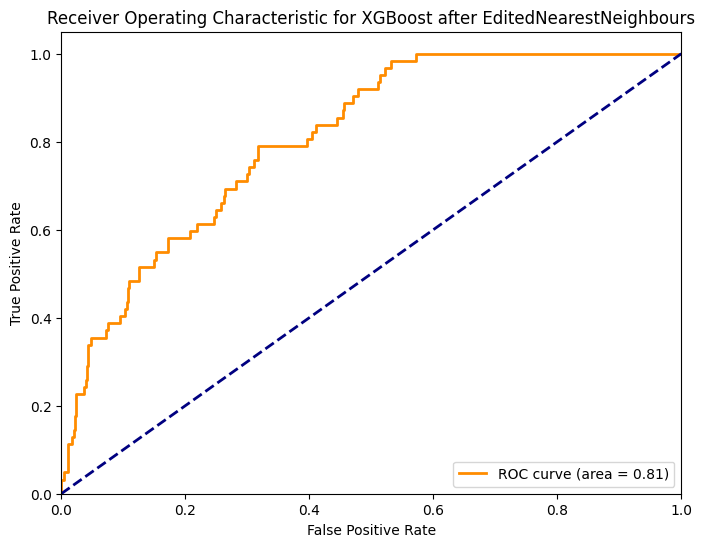

Confusion Matrix:
 [[937  23]
 [ 51  11]]


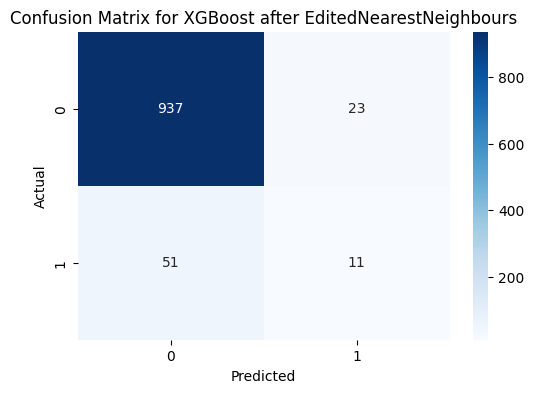

[LightGBM] [Info] Number of positive: 187, number of negative: 3460
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000387 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3647, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.051275 -> initscore=-2.917915
[LightGBM] [Info] Start training from score -2.917915

Model: LightGBM after EditedNearestNeighbours
Accuracy: 0.9305283757338552
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.30      0.11      0.16        62

    accuracy                           0.93      1022
   macro avg       0.62      0.55      0.56      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.840

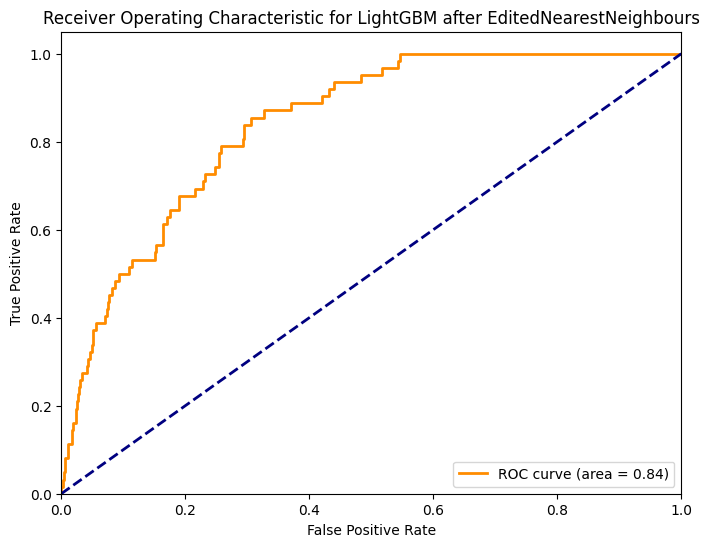

Confusion Matrix:
 [[944  16]
 [ 55   7]]


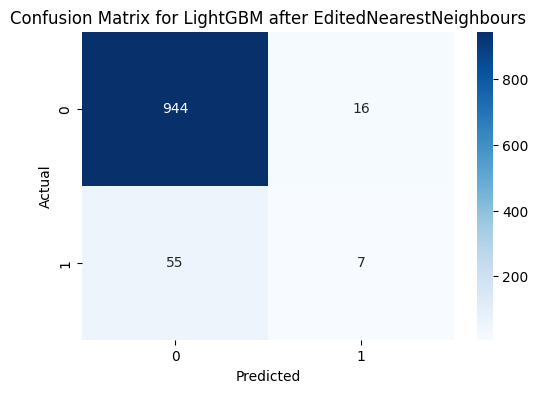


Model: CatBoost after EditedNearestNeighbours
Accuracy: 0.9324853228962818
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.35      0.13      0.19        62

    accuracy                           0.93      1022
   macro avg       0.65      0.56      0.58      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8356350806451612


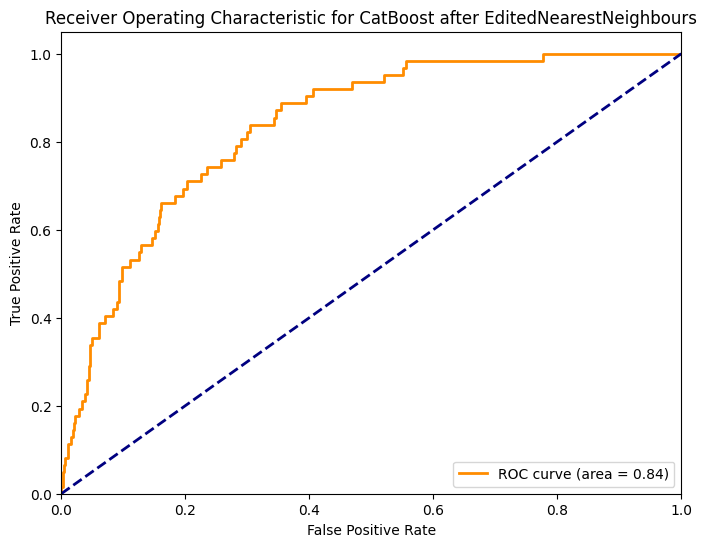

Confusion Matrix:
 [[945  15]
 [ 54   8]]


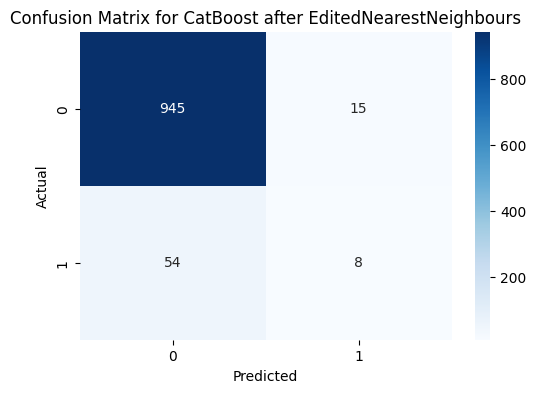


Model: k-Nearest Neighbors after EditedNearestNeighbours
Accuracy: 0.9354207436399217
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97       960
           1       0.40      0.13      0.20        62

    accuracy                           0.94      1022
   macro avg       0.67      0.56      0.58      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.6744035618279569


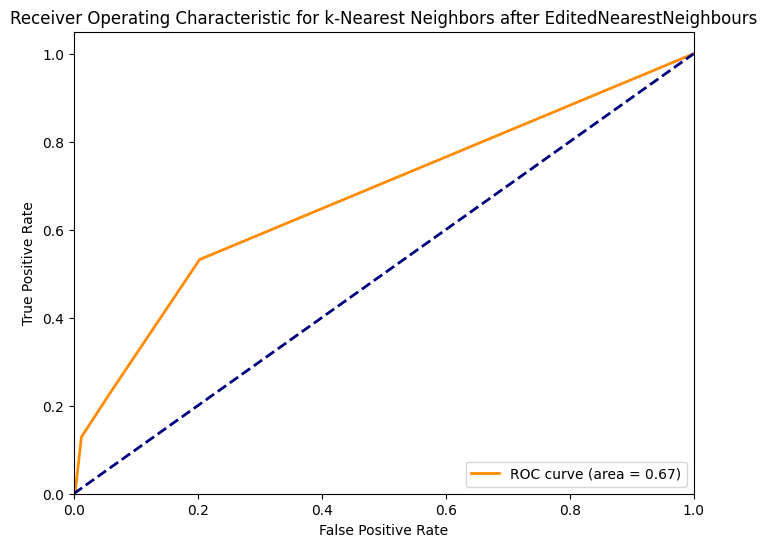

Confusion Matrix:
 [[948  12]
 [ 54   8]]


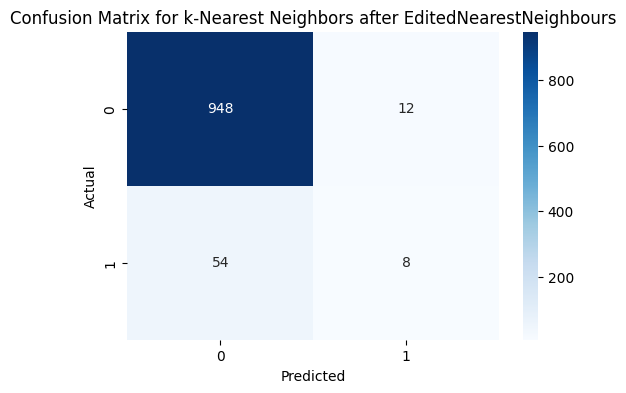


Model: Decision Tree after EditedNearestNeighbours
Accuracy: 0.8864970645792564
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94       960
           1       0.19      0.26      0.22        62

    accuracy                           0.89      1022
   macro avg       0.57      0.59      0.58      1022
weighted avg       0.90      0.89      0.89      1022

ROC AUC Score: 0.5925739247311828


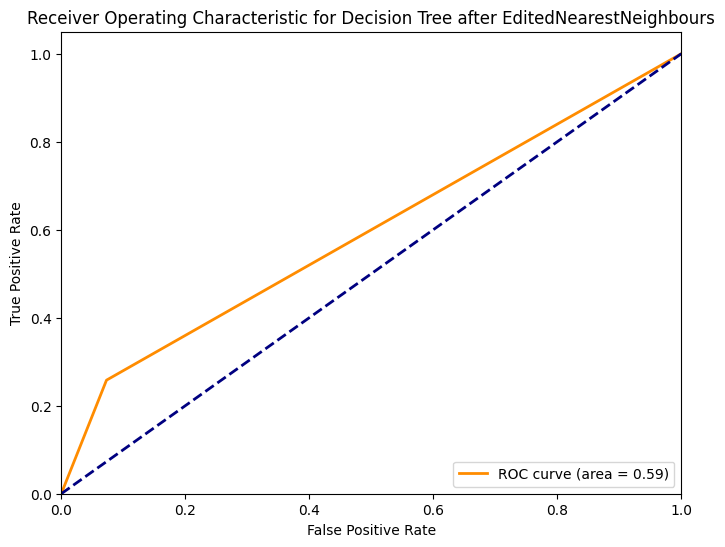

Confusion Matrix:
 [[890  70]
 [ 46  16]]


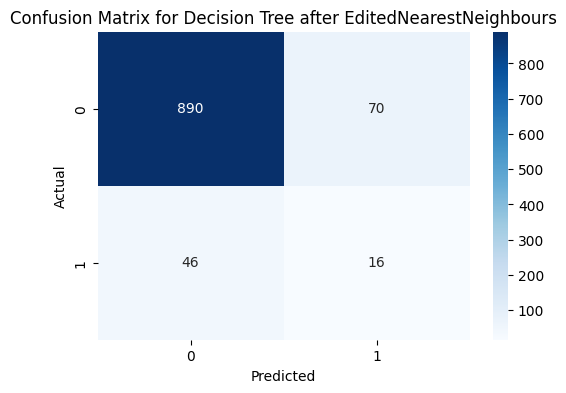


Model: Naive Bayes after EditedNearestNeighbours
Accuracy: 0.8454011741682974
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.87      0.91       960
           1       0.20      0.53      0.29        62

    accuracy                           0.85      1022
   macro avg       0.58      0.70      0.60      1022
weighted avg       0.92      0.85      0.88      1022

ROC AUC Score: 0.8254200268817204


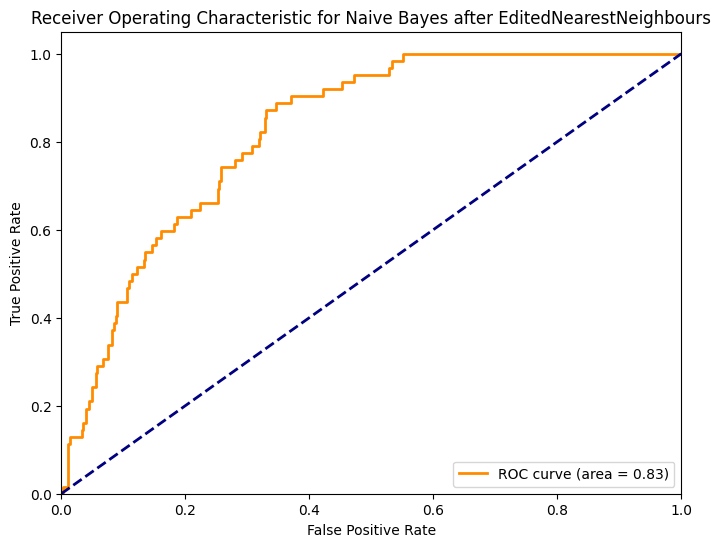

Confusion Matrix:
 [[831 129]
 [ 29  33]]


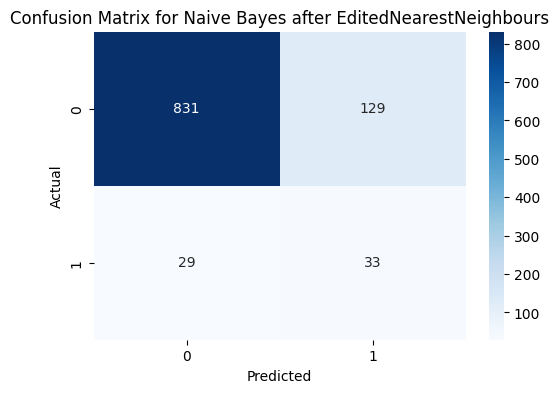


Model: Linear Discriminant Analysis after EditedNearestNeighbours
Accuracy: 0.9246575342465754
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.35      0.27      0.31        62

    accuracy                           0.92      1022
   macro avg       0.65      0.62      0.63      1022
weighted avg       0.92      0.92      0.92      1022

ROC AUC Score: 0.836861559139785


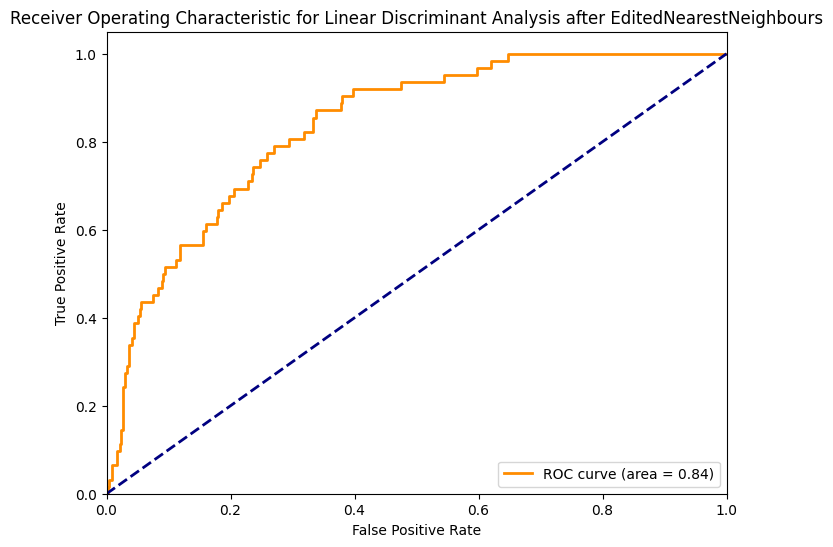

Confusion Matrix:
 [[928  32]
 [ 45  17]]


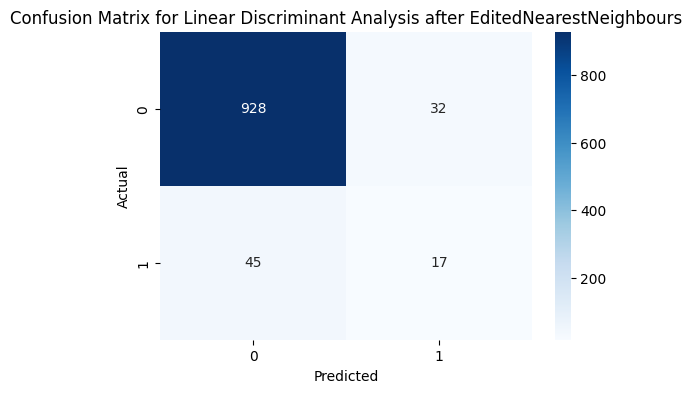


Model: Quadratic Discriminant Analysis after EditedNearestNeighbours
Accuracy: 0.850293542074364
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.87      0.92       960
           1       0.21      0.53      0.30        62

    accuracy                           0.85      1022
   macro avg       0.59      0.70      0.61      1022
weighted avg       0.92      0.85      0.88      1022

ROC AUC Score: 0.8257728494623655


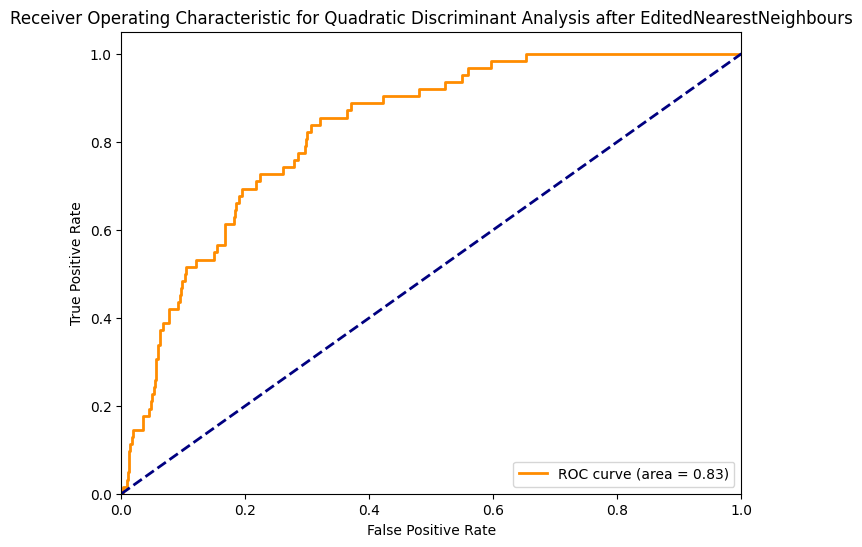

Confusion Matrix:
 [[836 124]
 [ 29  33]]


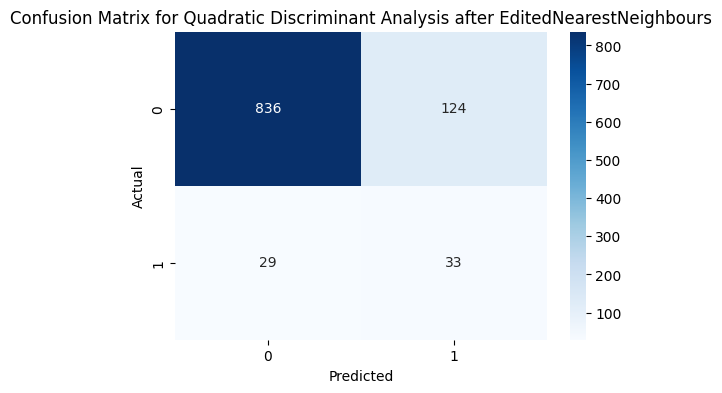


Model: Extra Trees after EditedNearestNeighbours
Accuracy: 0.9266144814090019
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.29      0.15      0.19        62

    accuracy                           0.93      1022
   macro avg       0.62      0.56      0.58      1022
weighted avg       0.91      0.93      0.91      1022

ROC AUC Score: 0.7871975806451613


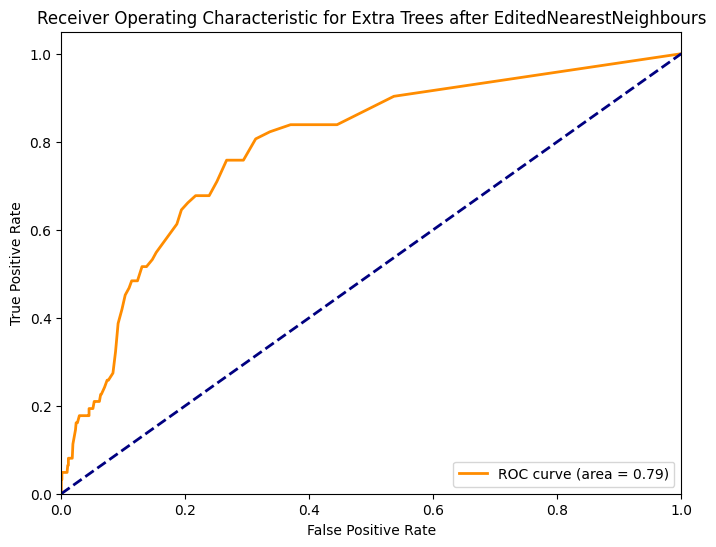

Confusion Matrix:
 [[938  22]
 [ 53   9]]


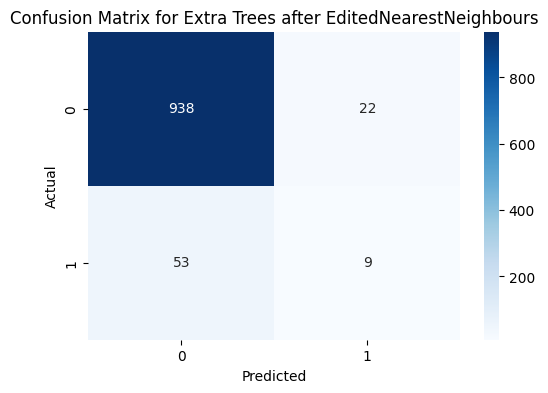


Applying RepeatedEditedNearestNeighbours

Model: Logistic Regression after RepeatedEditedNearestNeighbours
Accuracy: 0.9344422700587084
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.97       960
           1       0.41      0.18      0.25        62

    accuracy                           0.93      1022
   macro avg       0.68      0.58      0.61      1022
weighted avg       0.92      0.93      0.92      1022

ROC AUC Score: 0.8488575268817204


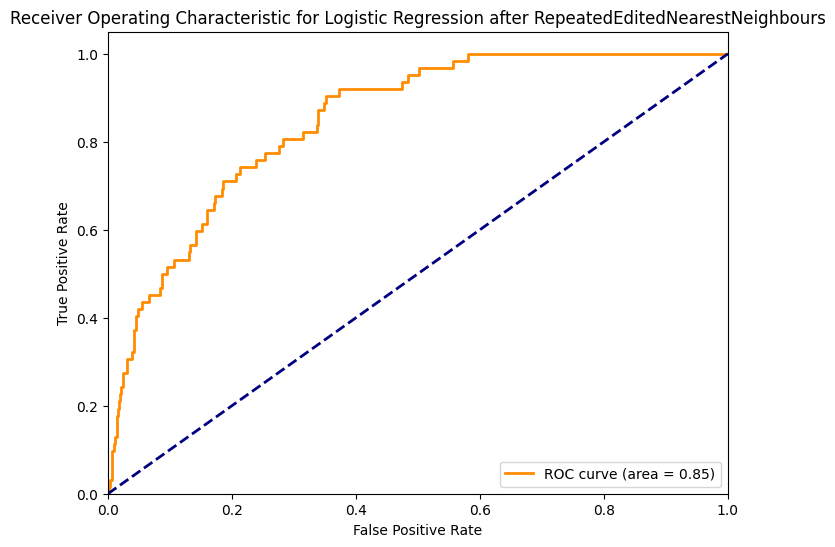

Confusion Matrix:
 [[944  16]
 [ 51  11]]


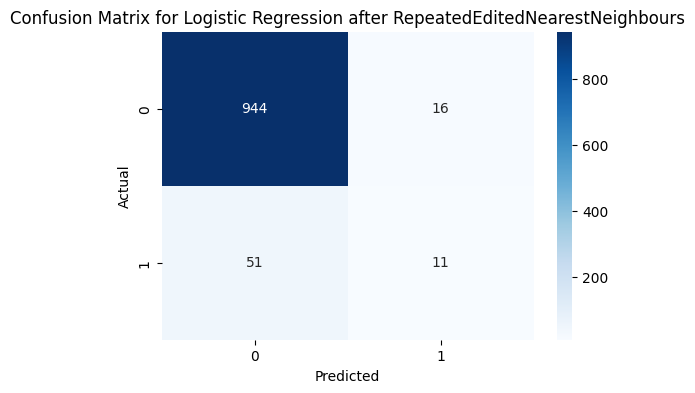


Model: Random Forest after RepeatedEditedNearestNeighbours
Accuracy: 0.923679060665362
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.33      0.24      0.28        62

    accuracy                           0.92      1022
   macro avg       0.64      0.60      0.62      1022
weighted avg       0.91      0.92      0.92      1022

ROC AUC Score: 0.8086105510752688


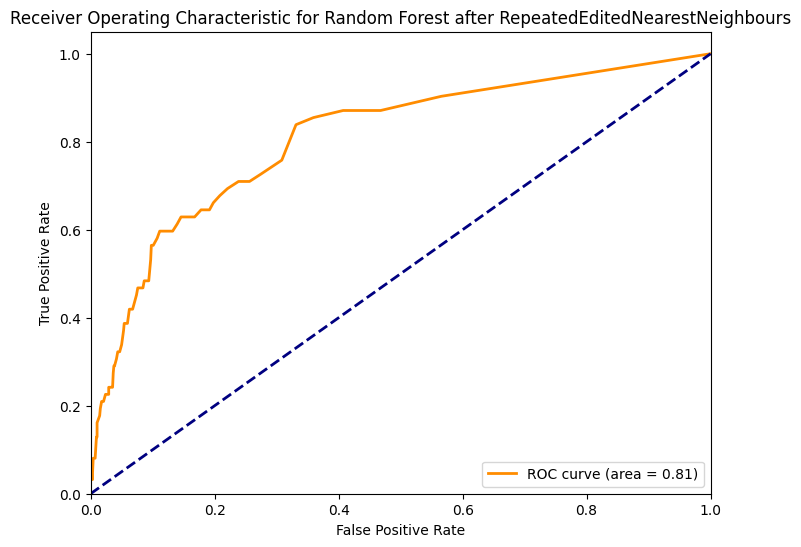

Confusion Matrix:
 [[929  31]
 [ 47  15]]


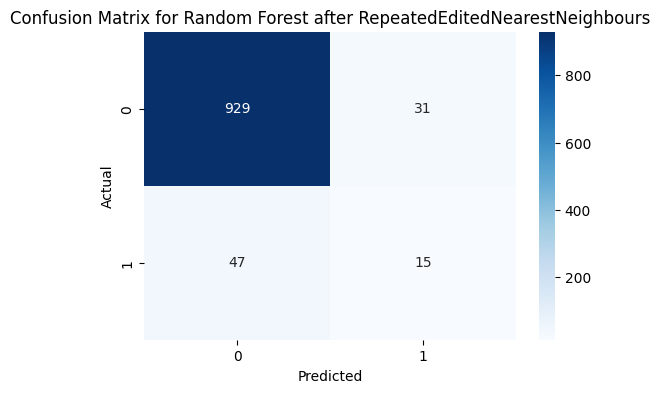


Model: SVM after RepeatedEditedNearestNeighbours
Accuracy: 0.9305283757338552
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.34      0.16      0.22        62

    accuracy                           0.93      1022
   macro avg       0.65      0.57      0.59      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.7327620967741936


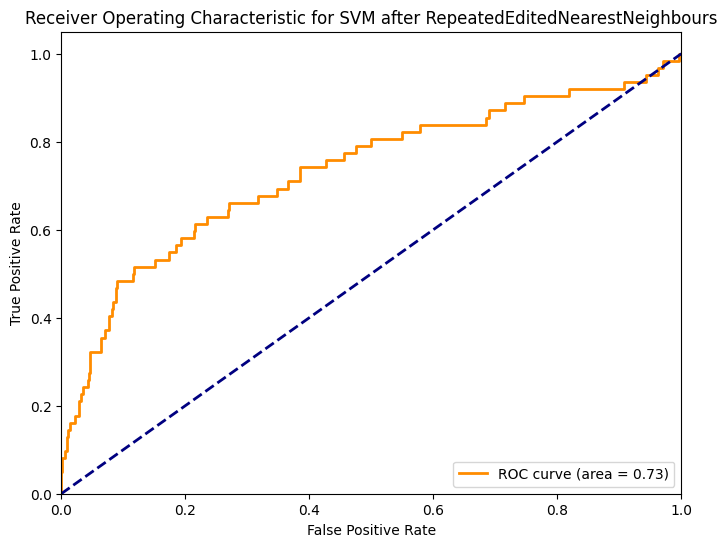

Confusion Matrix:
 [[941  19]
 [ 52  10]]


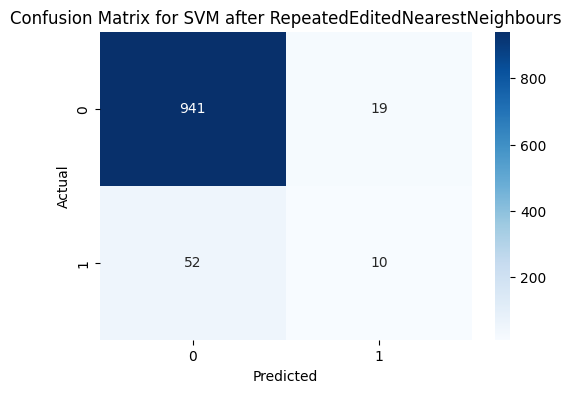


Model: Gradient Boosting after RepeatedEditedNearestNeighbours
Accuracy: 0.9168297455968689
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.27      0.21      0.23        62

    accuracy                           0.92      1022
   macro avg       0.61      0.59      0.60      1022
weighted avg       0.91      0.92      0.91      1022

ROC AUC Score: 0.8529569892473118


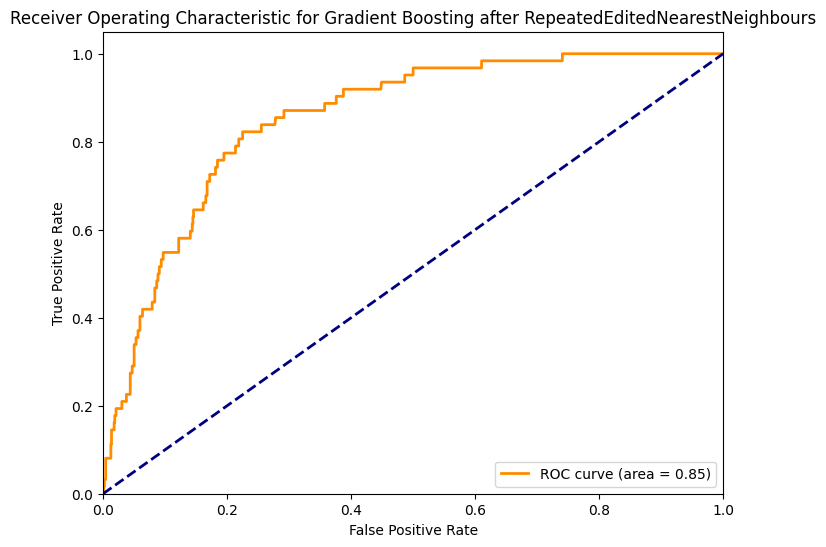

Confusion Matrix:
 [[924  36]
 [ 49  13]]


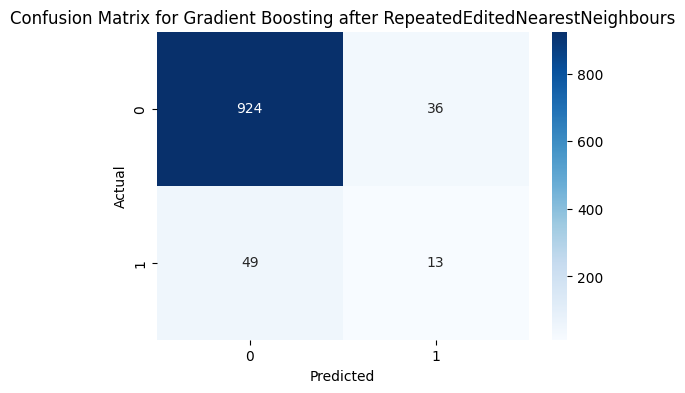


Model: AdaBoost after RepeatedEditedNearestNeighbours
Accuracy: 0.9275929549902152
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.37      0.27      0.31        62

    accuracy                           0.93      1022
   macro avg       0.66      0.62      0.64      1022
weighted avg       0.92      0.93      0.92      1022

ROC AUC Score: 0.831149193548387


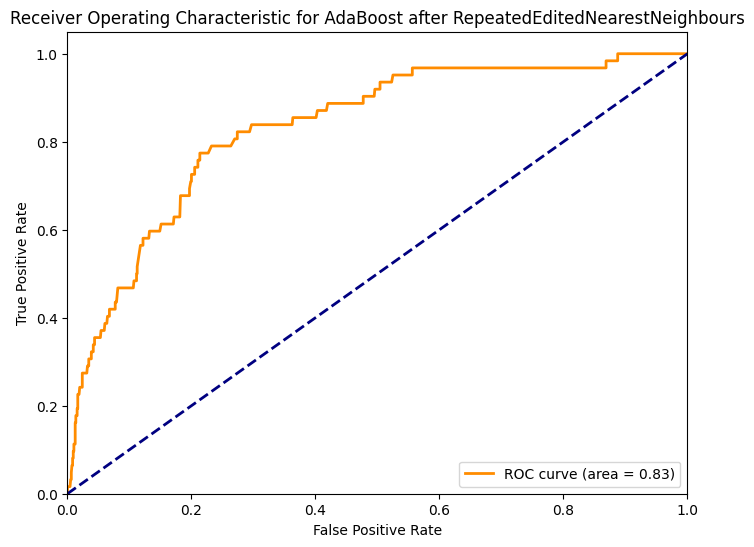

Confusion Matrix:
 [[931  29]
 [ 45  17]]


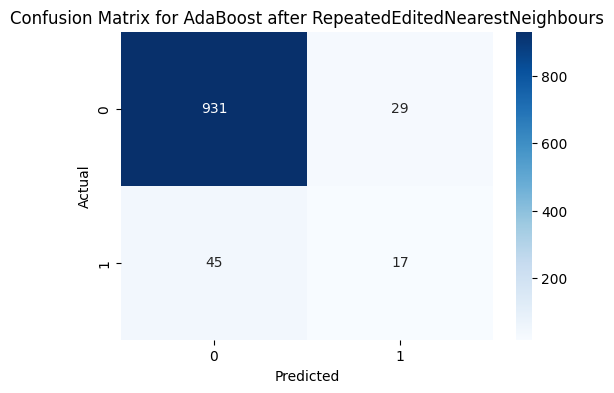


Model: XGBoost after RepeatedEditedNearestNeighbours
Accuracy: 0.9090019569471625
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95       960
           1       0.24      0.23      0.23        62

    accuracy                           0.91      1022
   macro avg       0.59      0.59      0.59      1022
weighted avg       0.91      0.91      0.91      1022

ROC AUC Score: 0.8344758064516129


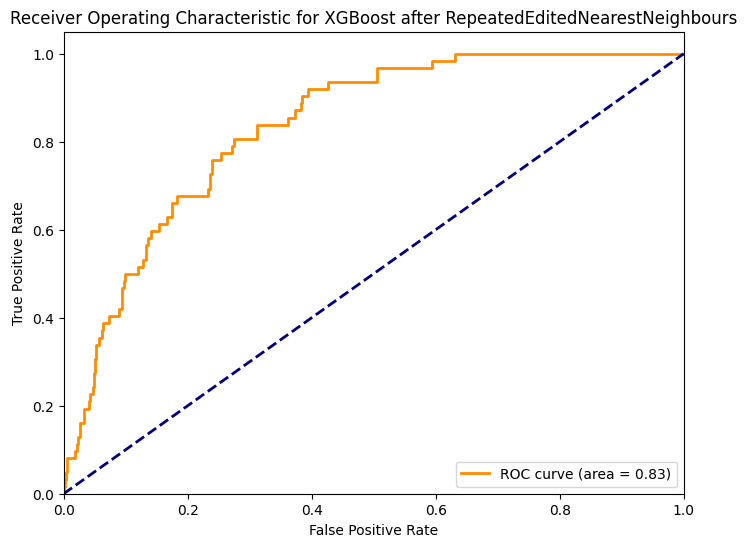

Confusion Matrix:
 [[915  45]
 [ 48  14]]


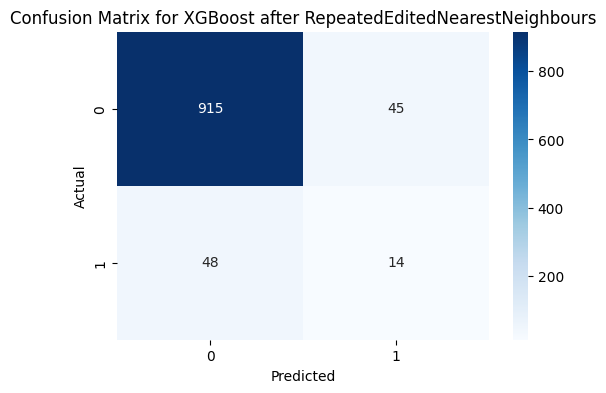

[LightGBM] [Info] Number of positive: 187, number of negative: 3250
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3437, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.054408 -> initscore=-2.855302
[LightGBM] [Info] Start training from score -2.855302

Model: LightGBM after RepeatedEditedNearestNeighbours
Accuracy: 0.9187866927592955
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.29      0.23      0.25        62

    accuracy                           0.92      1022
   macro avg       0.62      0.59      0.60      1022
weighted avg       0.91      0.92      0.91      1022

ROC AUC Scor

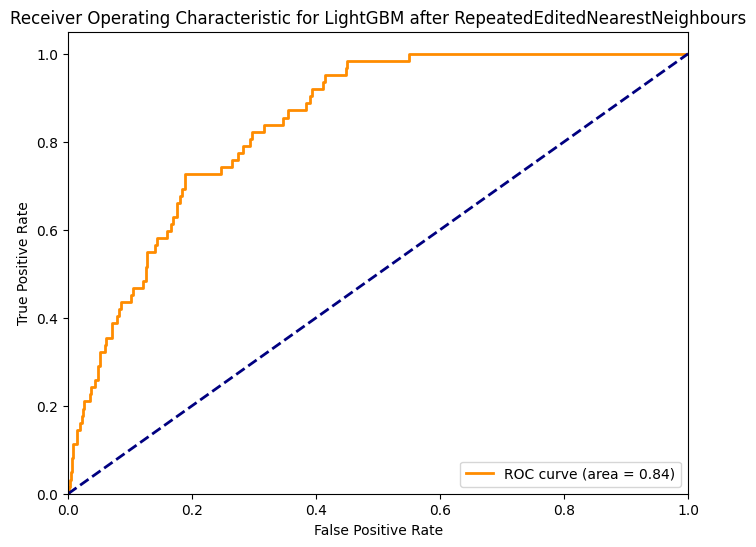

Confusion Matrix:
 [[925  35]
 [ 48  14]]


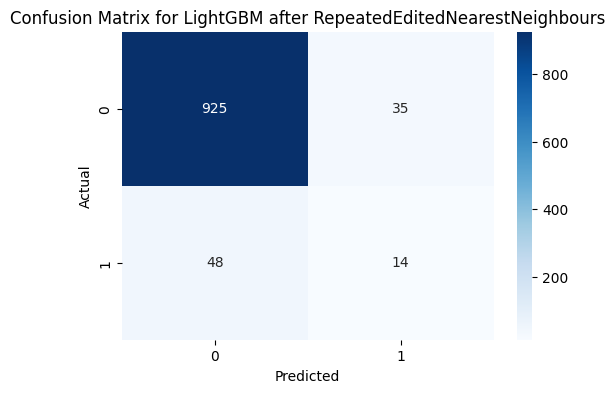


Model: CatBoost after RepeatedEditedNearestNeighbours
Accuracy: 0.9197651663405088
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96       960
           1       0.33      0.32      0.33        62

    accuracy                           0.92      1022
   macro avg       0.64      0.64      0.64      1022
weighted avg       0.92      0.92      0.92      1022

ROC AUC Score: 0.8387096774193549


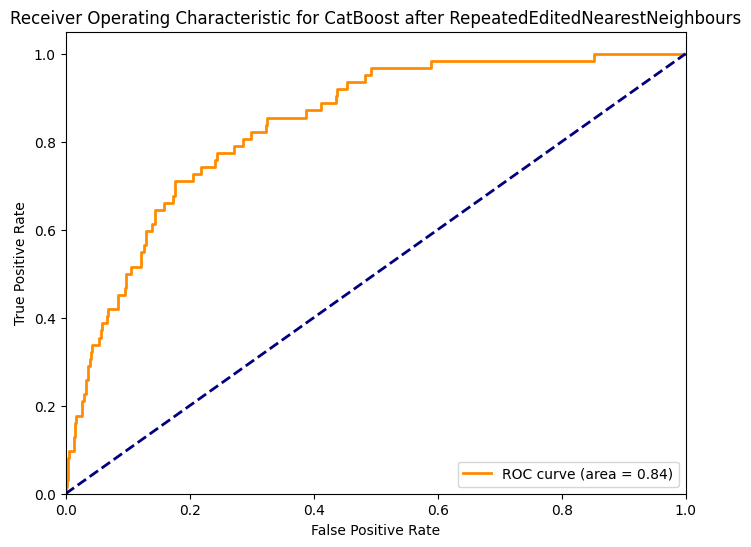

Confusion Matrix:
 [[920  40]
 [ 42  20]]


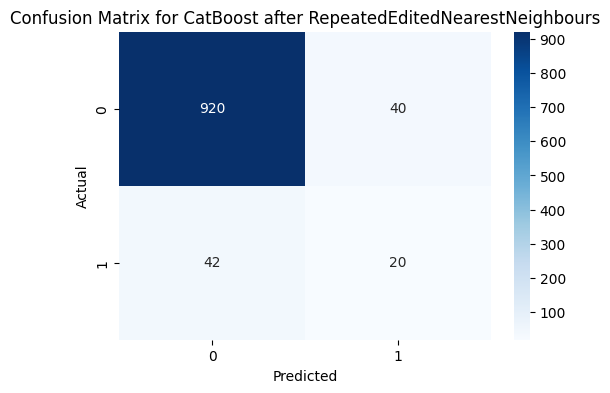


Model: k-Nearest Neighbors after RepeatedEditedNearestNeighbours
Accuracy: 0.9197651663405088
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.31      0.26      0.28        62

    accuracy                           0.92      1022
   macro avg       0.63      0.61      0.62      1022
weighted avg       0.91      0.92      0.92      1022

ROC AUC Score: 0.6939600134408602


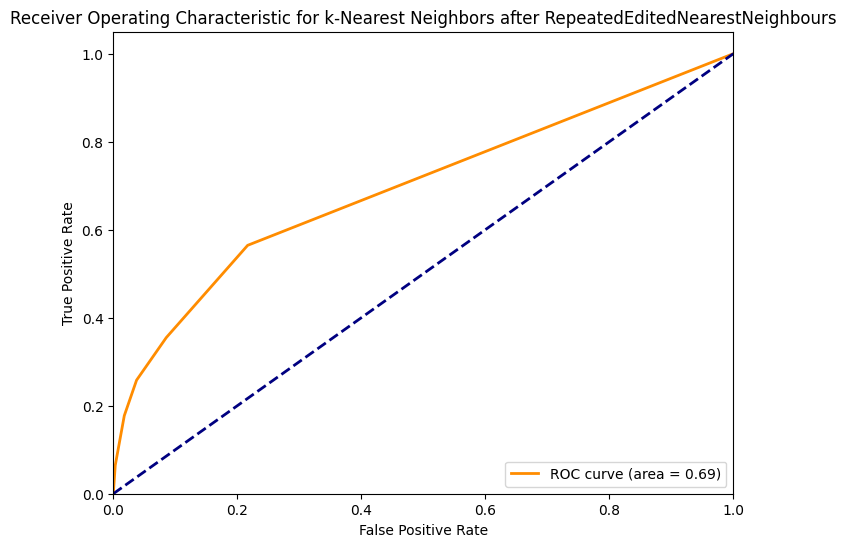

Confusion Matrix:
 [[924  36]
 [ 46  16]]


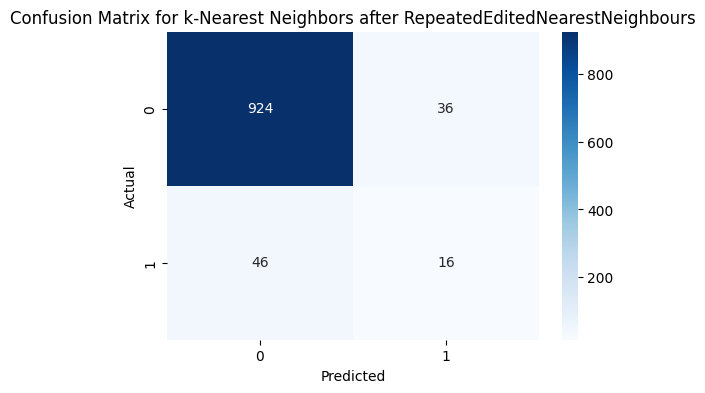


Model: Decision Tree after RepeatedEditedNearestNeighbours
Accuracy: 0.8669275929549902
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.91      0.93       960
           1       0.15      0.26      0.19        62

    accuracy                           0.87      1022
   macro avg       0.55      0.58      0.56      1022
weighted avg       0.90      0.87      0.88      1022

ROC AUC Score: 0.5821572580645161


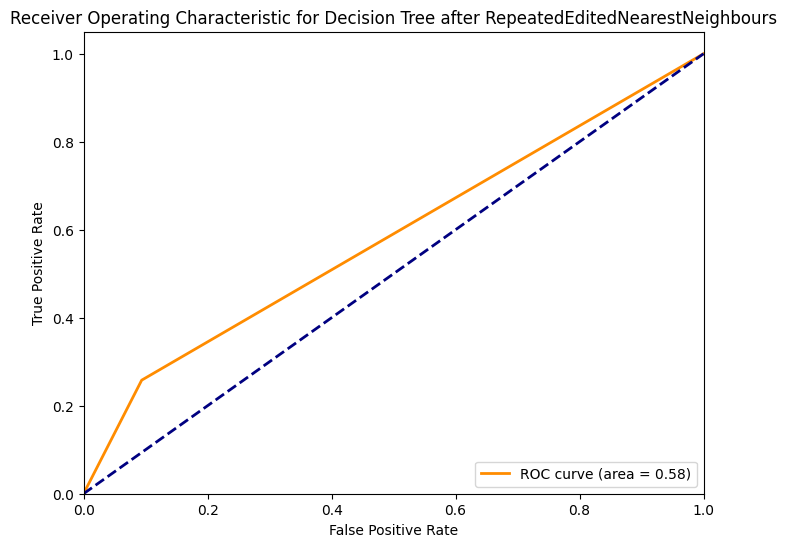

Confusion Matrix:
 [[870  90]
 [ 46  16]]


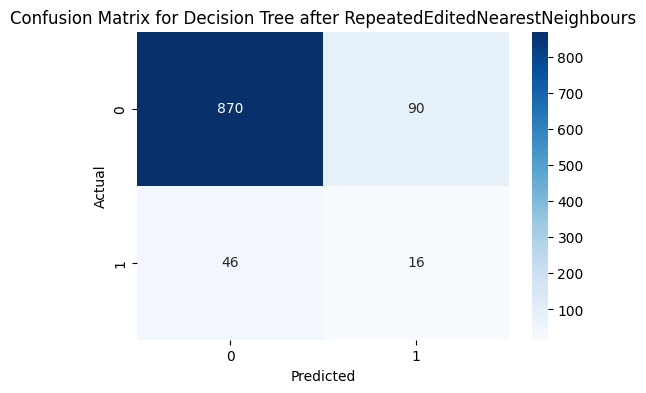


Model: Naive Bayes after RepeatedEditedNearestNeighbours
Accuracy: 0.8277886497064579
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.84      0.90       960
           1       0.19      0.56      0.28        62

    accuracy                           0.83      1022
   macro avg       0.58      0.70      0.59      1022
weighted avg       0.92      0.83      0.86      1022

ROC AUC Score: 0.8234122983870968


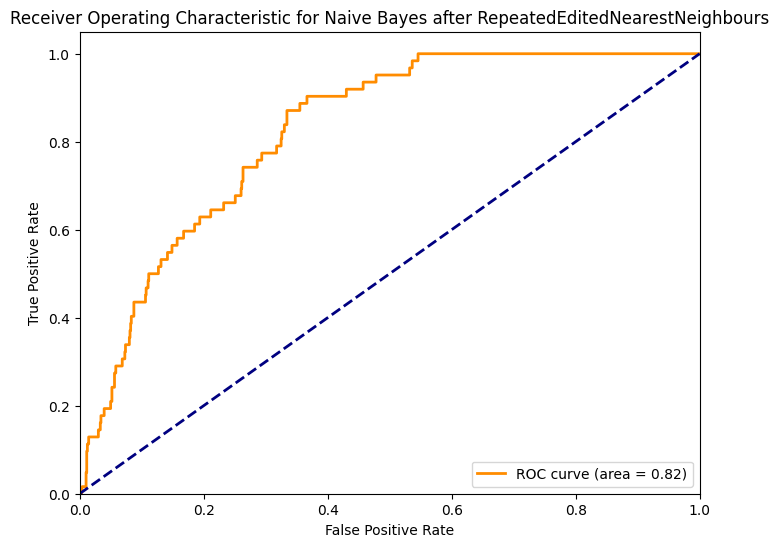

Confusion Matrix:
 [[811 149]
 [ 27  35]]


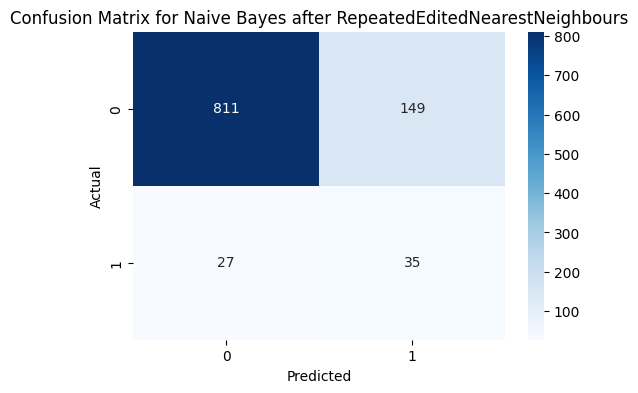


Model: Linear Discriminant Analysis after RepeatedEditedNearestNeighbours
Accuracy: 0.9041095890410958
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.93      0.95       960
           1       0.30      0.44      0.36        62

    accuracy                           0.90      1022
   macro avg       0.63      0.68      0.65      1022
weighted avg       0.92      0.90      0.91      1022

ROC AUC Score: 0.8299563172043011


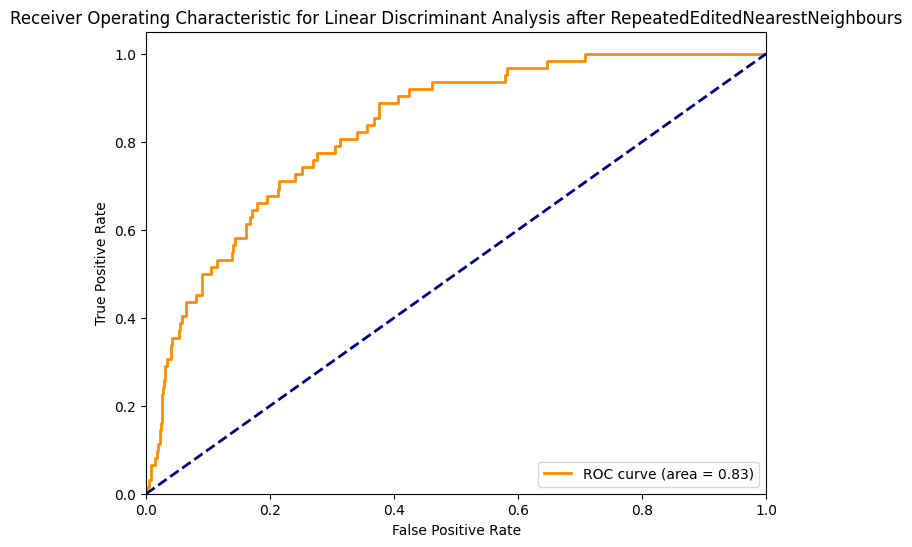

Confusion Matrix:
 [[897  63]
 [ 35  27]]


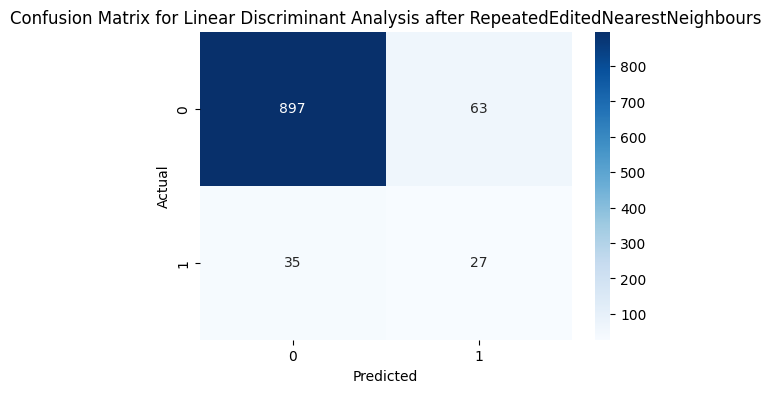


Model: Quadratic Discriminant Analysis after RepeatedEditedNearestNeighbours
Accuracy: 0.8317025440313112
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.85      0.90       960
           1       0.19      0.53      0.28        62

    accuracy                           0.83      1022
   macro avg       0.58      0.69      0.59      1022
weighted avg       0.92      0.83      0.87      1022

ROC AUC Score: 0.8230510752688172


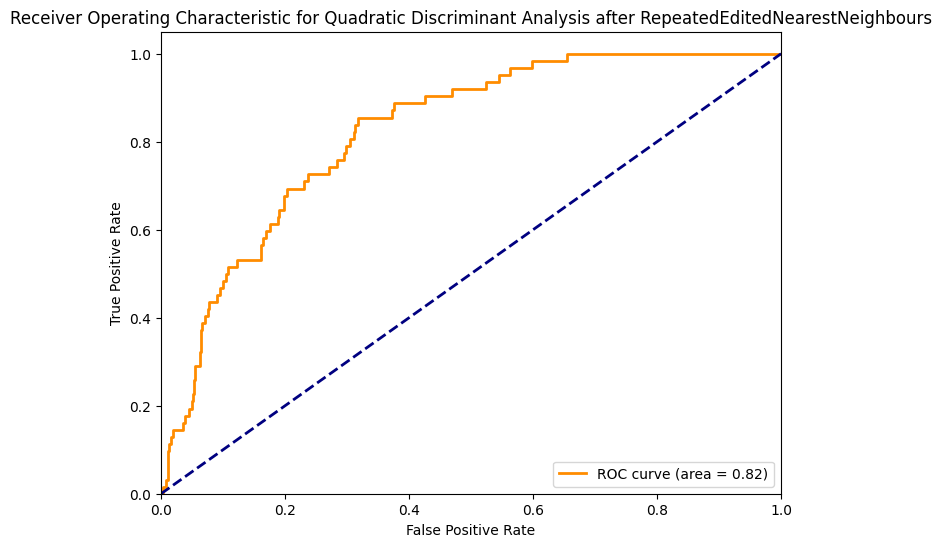

Confusion Matrix:
 [[817 143]
 [ 29  33]]


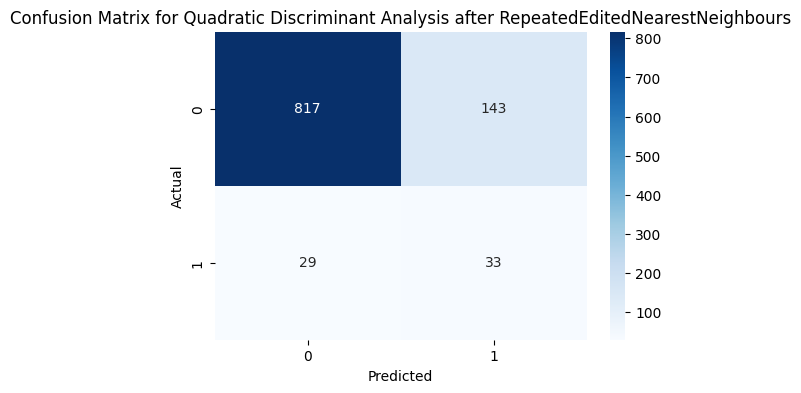


Model: Extra Trees after RepeatedEditedNearestNeighbours
Accuracy: 0.898238747553816
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95       960
           1       0.24      0.32      0.28        62

    accuracy                           0.90      1022
   macro avg       0.60      0.63      0.61      1022
weighted avg       0.91      0.90      0.90      1022

ROC AUC Score: 0.7765288978494623


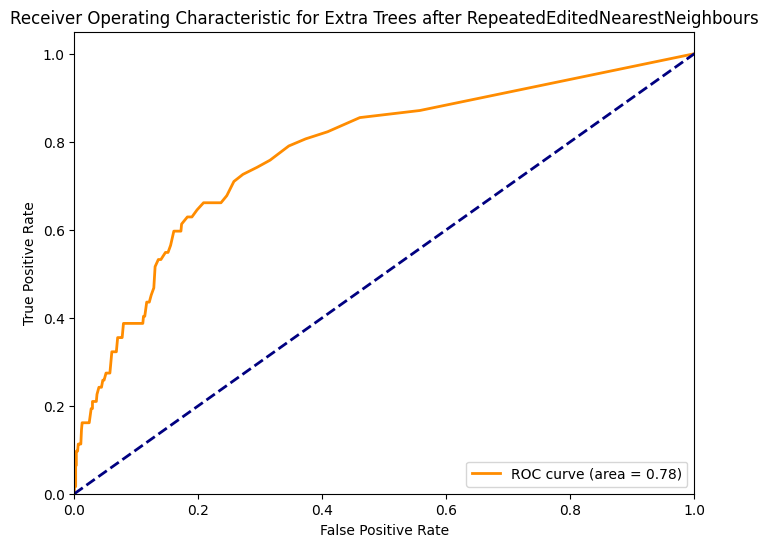

Confusion Matrix:
 [[898  62]
 [ 42  20]]


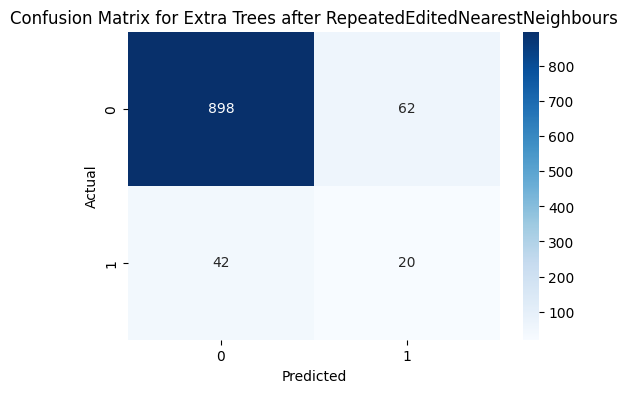


Applying AllKNN

Model: Logistic Regression after AllKNN
Accuracy: 0.9344422700587084
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.31      0.06      0.11        62

    accuracy                           0.93      1022
   macro avg       0.63      0.53      0.54      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.8506552419354838


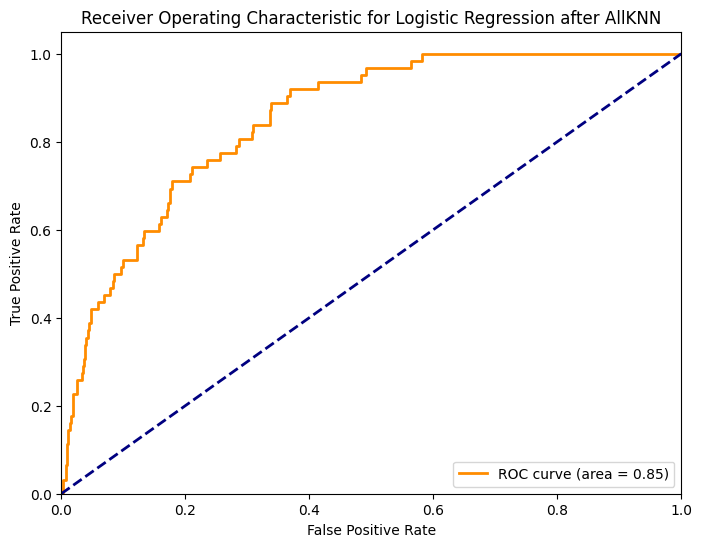

Confusion Matrix:
 [[951   9]
 [ 58   4]]


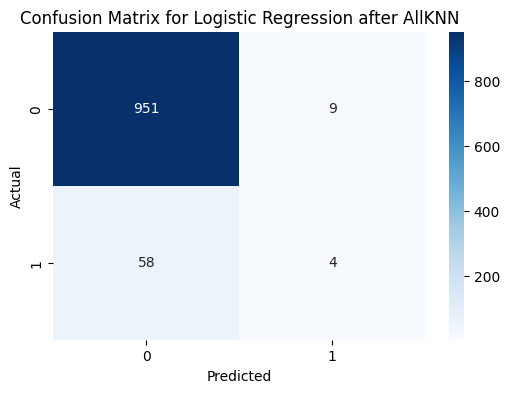


Model: Random Forest after AllKNN
Accuracy: 0.9295499021526419
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.31      0.13      0.18        62

    accuracy                           0.93      1022
   macro avg       0.63      0.56      0.57      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8158014112903227


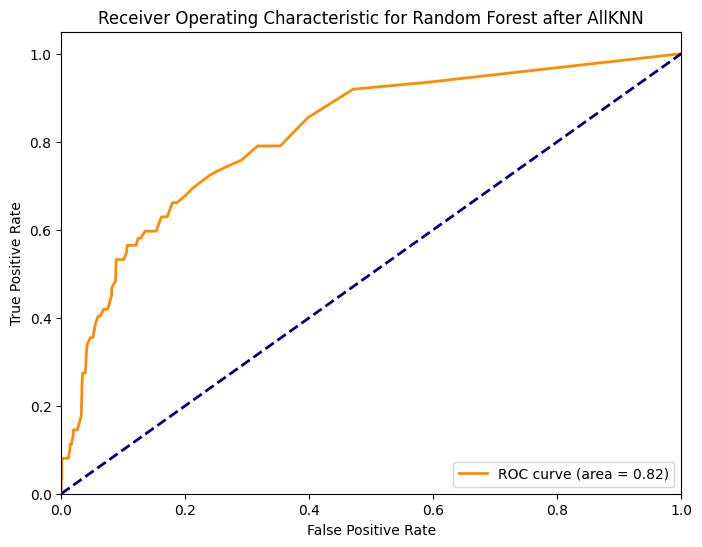

Confusion Matrix:
 [[942  18]
 [ 54   8]]


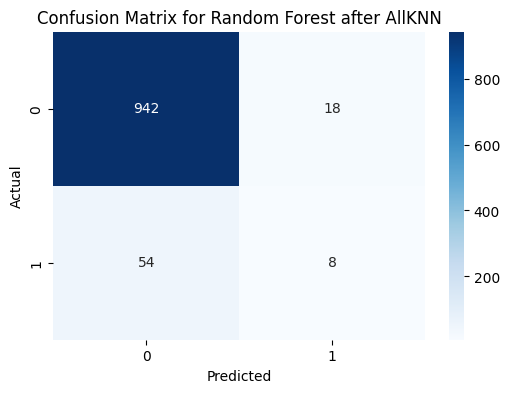


Model: SVM after AllKNN
Accuracy: 0.9363992172211351
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.38      0.08      0.13        62

    accuracy                           0.94      1022
   macro avg       0.66      0.54      0.55      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.732711693548387


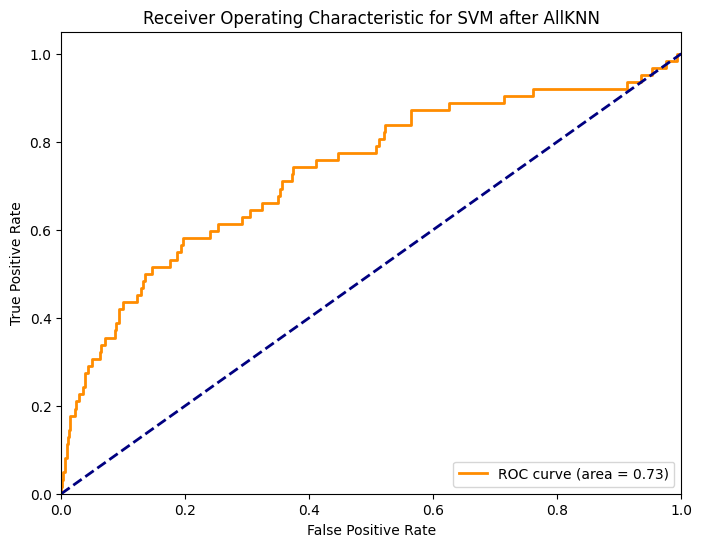

Confusion Matrix:
 [[952   8]
 [ 57   5]]


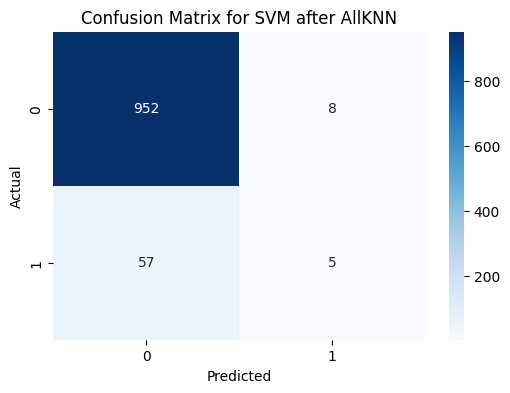


Model: Gradient Boosting after AllKNN
Accuracy: 0.9305283757338552
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.35      0.18      0.24        62

    accuracy                           0.93      1022
   macro avg       0.65      0.58      0.60      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8472446236559139


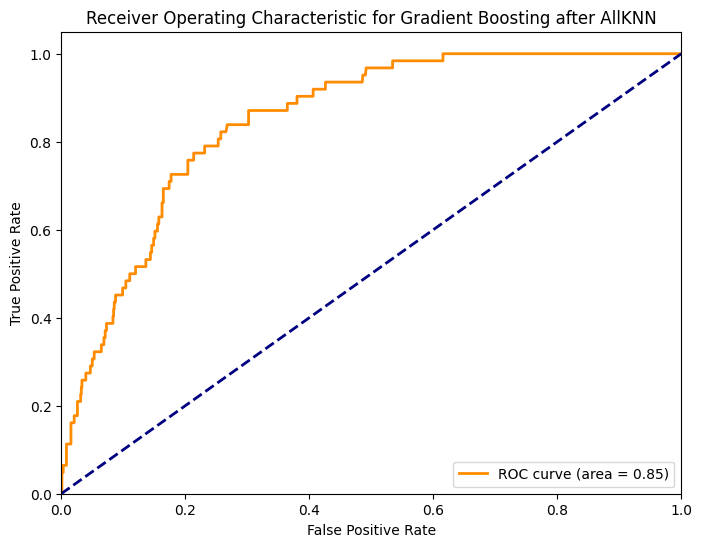

Confusion Matrix:
 [[940  20]
 [ 51  11]]


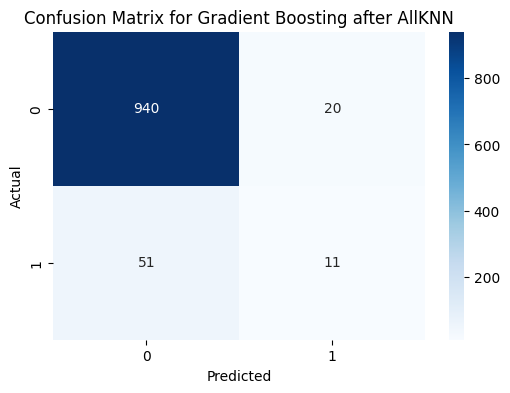


Model: AdaBoost after AllKNN
Accuracy: 0.9324853228962818
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.96       960
           1       0.33      0.11      0.17        62

    accuracy                           0.93      1022
   macro avg       0.64      0.55      0.57      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8305443548387097


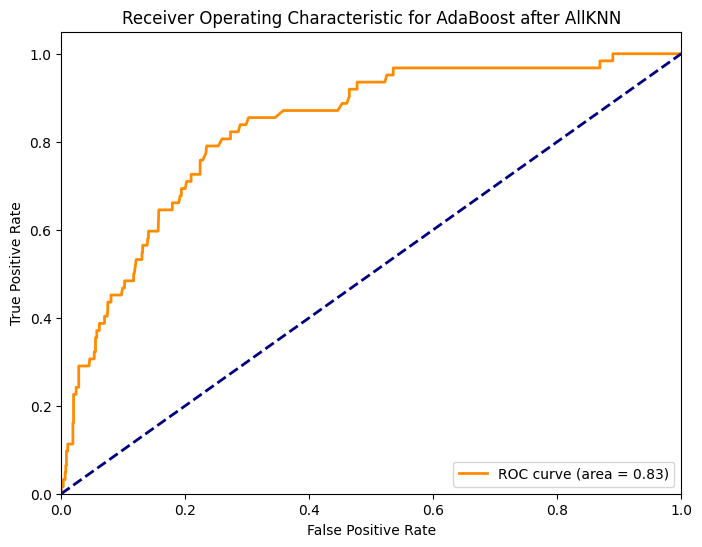

Confusion Matrix:
 [[946  14]
 [ 55   7]]


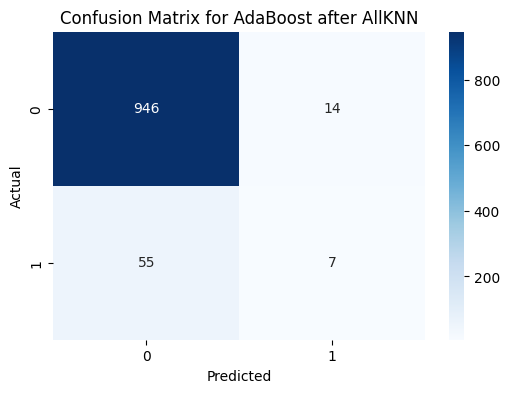


Model: XGBoost after AllKNN
Accuracy: 0.9275929549902152
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.35      0.23      0.27        62

    accuracy                           0.93      1022
   macro avg       0.65      0.60      0.62      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8227654569892473


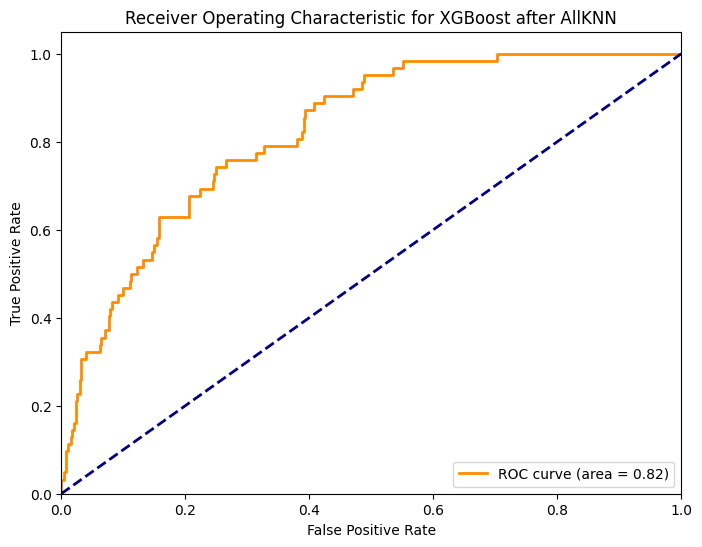

Confusion Matrix:
 [[934  26]
 [ 48  14]]


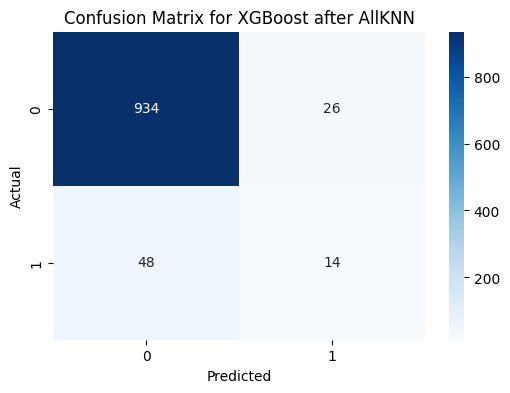

[LightGBM] [Info] Number of positive: 187, number of negative: 3358
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3545, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.052750 -> initscore=-2.887992
[LightGBM] [Info] Start training from score -2.887992

Model: LightGBM after AllKNN
Accuracy: 0.923679060665362
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.29      0.18      0.22        62

    accuracy                           0.92      1022
   macro avg       0.62      0.57      0.59      1022
weighted avg       0.91      0.92      0.91      1022

ROC AUC Score: 0.8421538978494624


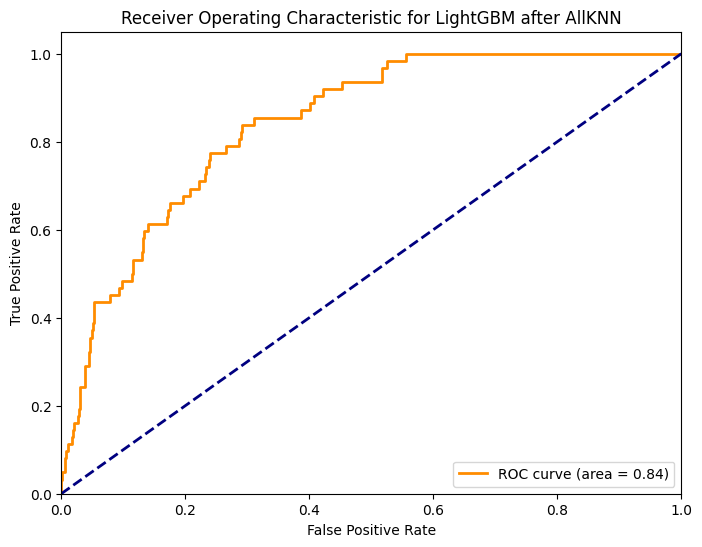

Confusion Matrix:
 [[933  27]
 [ 51  11]]


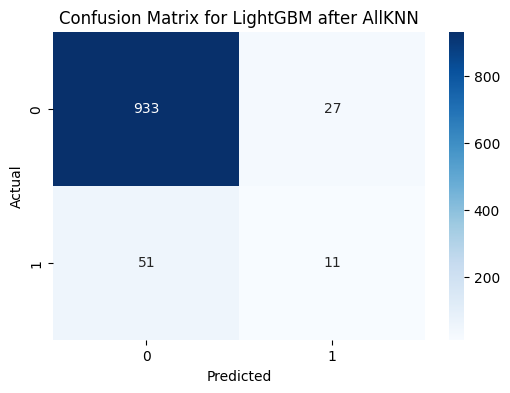


Model: CatBoost after AllKNN
Accuracy: 0.9275929549902152
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.31      0.16      0.21        62

    accuracy                           0.93      1022
   macro avg       0.63      0.57      0.59      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.835013440860215


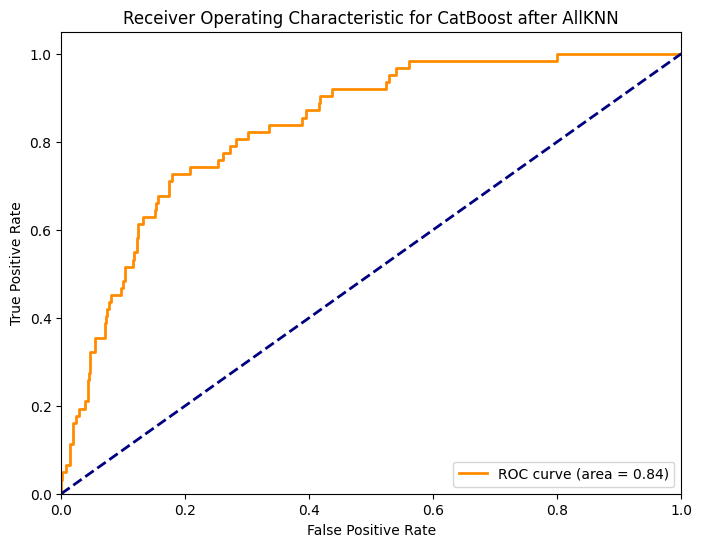

Confusion Matrix:
 [[938  22]
 [ 52  10]]


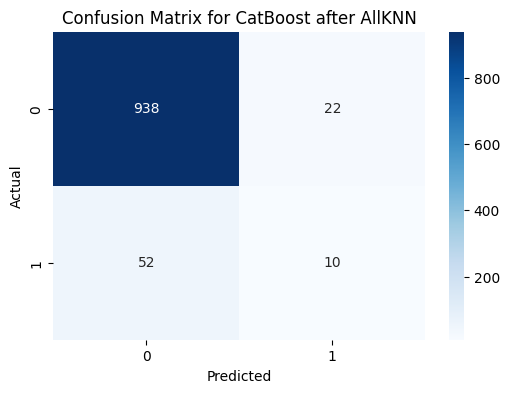


Model: k-Nearest Neighbors after AllKNN
Accuracy: 0.9334637964774951
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.97       960
           1       0.40      0.19      0.26        62

    accuracy                           0.93      1022
   macro avg       0.67      0.59      0.61      1022
weighted avg       0.92      0.93      0.92      1022

ROC AUC Score: 0.6763272849462365


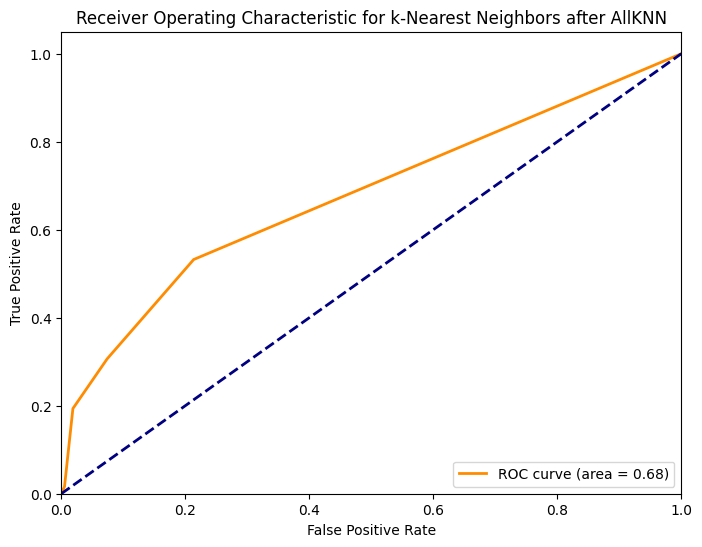

Confusion Matrix:
 [[942  18]
 [ 50  12]]


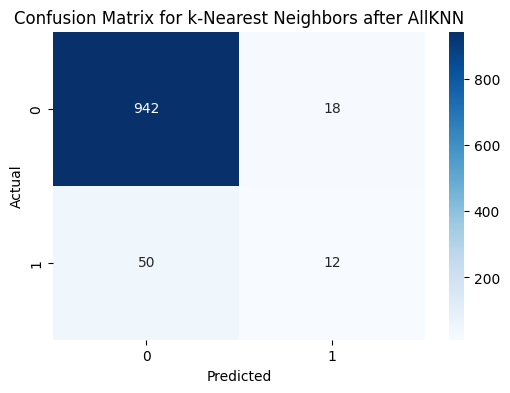


Model: Decision Tree after AllKNN
Accuracy: 0.8816046966731899
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.92      0.94       960
           1       0.18      0.26      0.21        62

    accuracy                           0.88      1022
   macro avg       0.56      0.59      0.57      1022
weighted avg       0.90      0.88      0.89      1022

ROC AUC Score: 0.5899697580645161


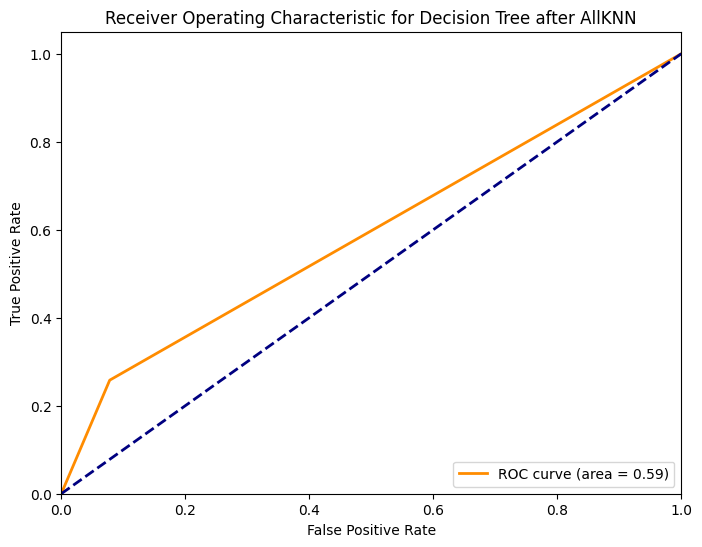

Confusion Matrix:
 [[885  75]
 [ 46  16]]


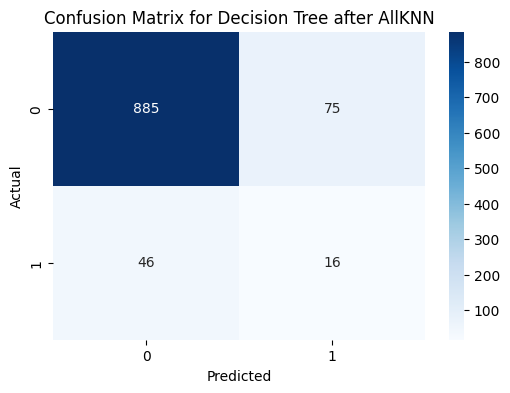


Model: Naive Bayes after AllKNN
Accuracy: 0.8385518590998043
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.86      0.91       960
           1       0.20      0.55      0.29        62

    accuracy                           0.84      1022
   macro avg       0.58      0.70      0.60      1022
weighted avg       0.92      0.84      0.87      1022

ROC AUC Score: 0.8248991935483871


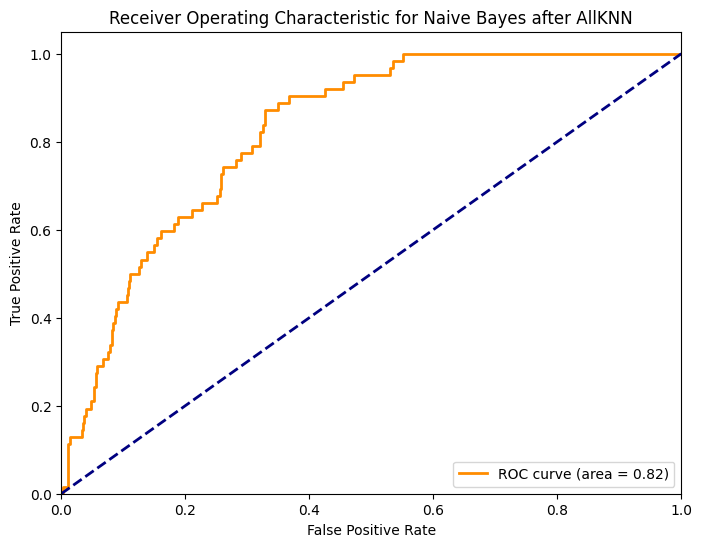

Confusion Matrix:
 [[823 137]
 [ 28  34]]


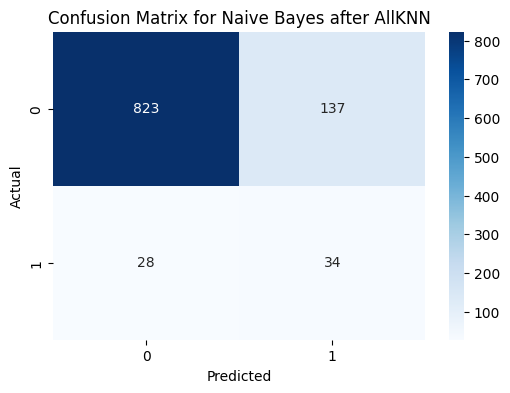


Model: Linear Discriminant Analysis after AllKNN
Accuracy: 0.9227005870841487
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96       960
           1       0.36      0.34      0.35        62

    accuracy                           0.92      1022
   macro avg       0.66      0.65      0.65      1022
weighted avg       0.92      0.92      0.92      1022

ROC AUC Score: 0.8355342741935483


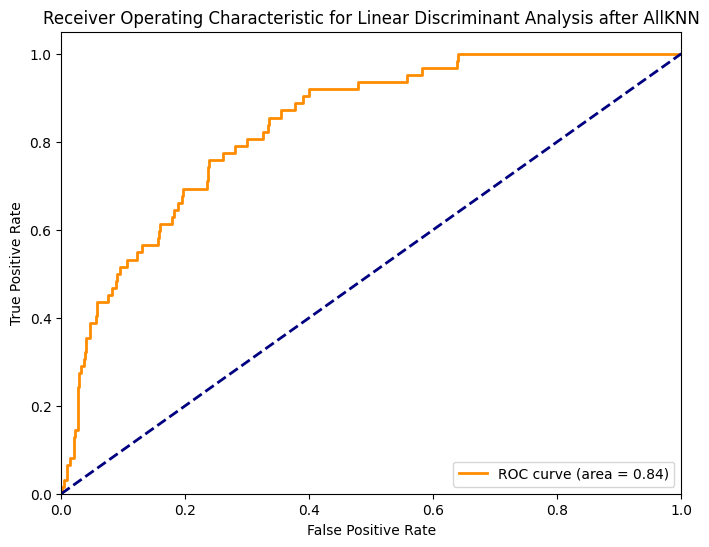

Confusion Matrix:
 [[922  38]
 [ 41  21]]


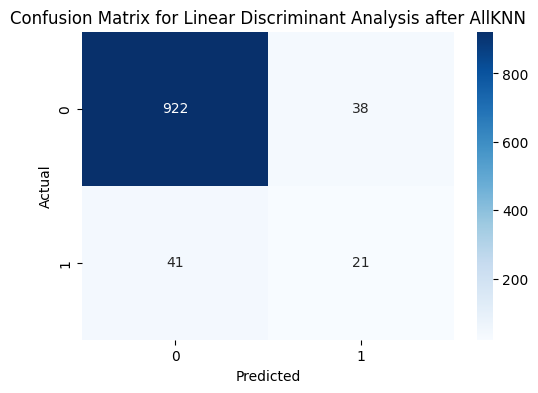


Model: Quadratic Discriminant Analysis after AllKNN
Accuracy: 0.8444227005870841
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.86      0.91       960
           1       0.20      0.53      0.29        62

    accuracy                           0.84      1022
   macro avg       0.58      0.70      0.60      1022
weighted avg       0.92      0.84      0.88      1022

ROC AUC Score: 0.8246975806451613


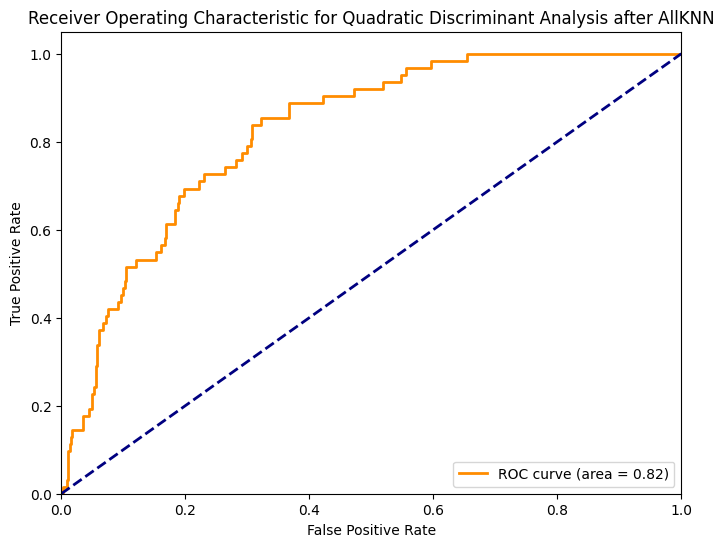

Confusion Matrix:
 [[830 130]
 [ 29  33]]


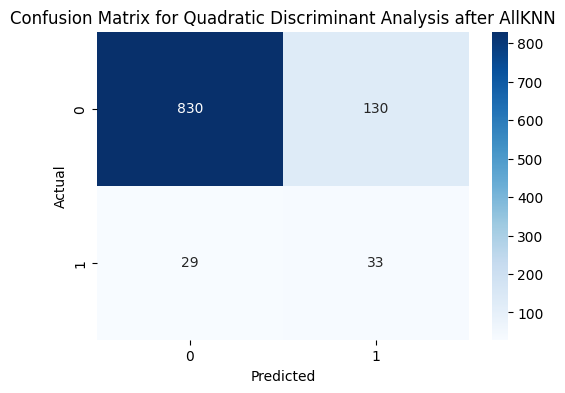


Model: Extra Trees after AllKNN
Accuracy: 0.9148727984344422
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.96       960
           1       0.21      0.15      0.17        62

    accuracy                           0.91      1022
   macro avg       0.58      0.55      0.56      1022
weighted avg       0.90      0.91      0.91      1022

ROC AUC Score: 0.7725638440860215


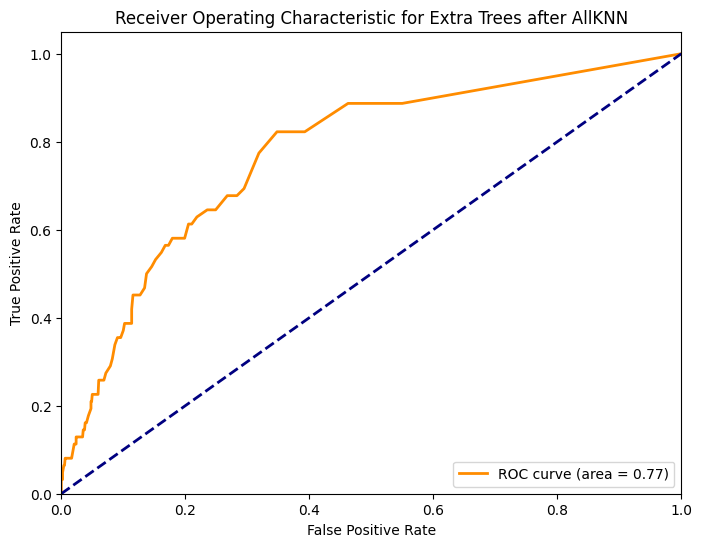

Confusion Matrix:
 [[926  34]
 [ 53   9]]


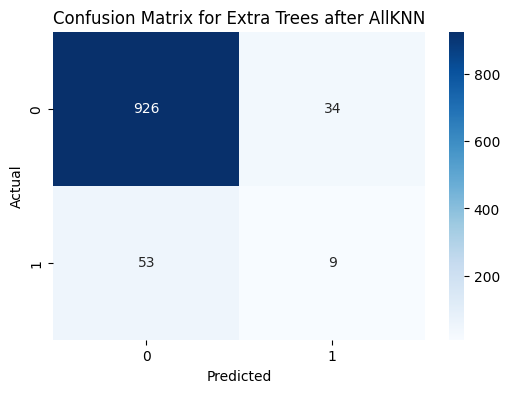


Applying CondensedNearestNeighbour

Model: Logistic Regression after CondensedNearestNeighbour
Accuracy: 0.9393346379647749
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.8464381720430108


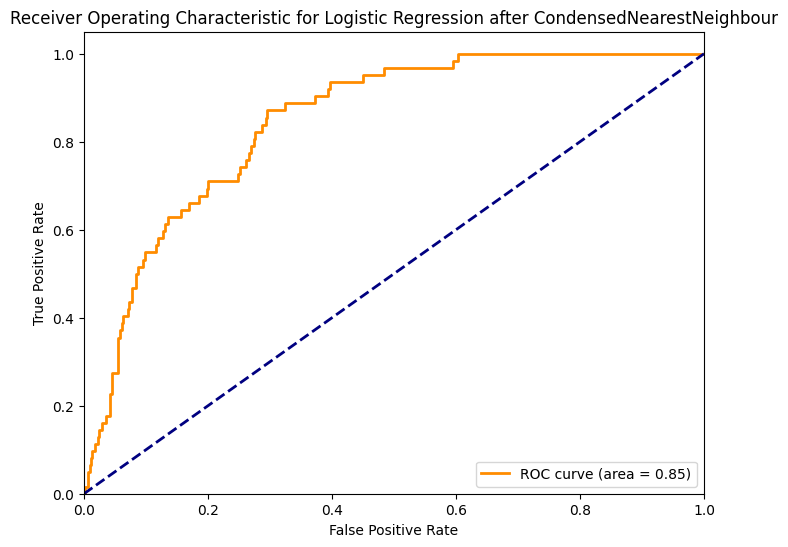

Confusion Matrix:
 [[960   0]
 [ 62   0]]


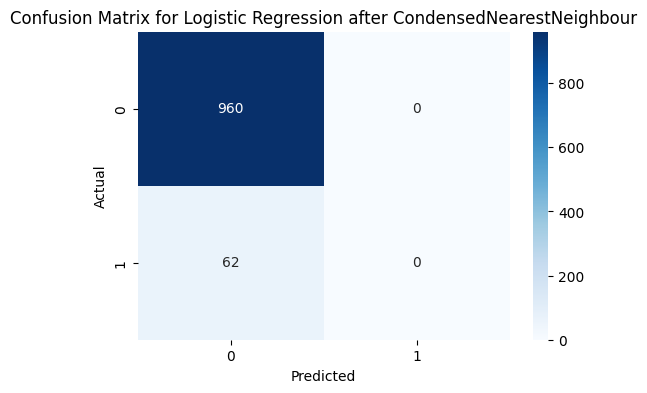


Model: Random Forest after CondensedNearestNeighbour
Accuracy: 0.9373776908023483
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.40      0.06      0.11        62

    accuracy                           0.94      1022
   macro avg       0.67      0.53      0.54      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.7669858870967742


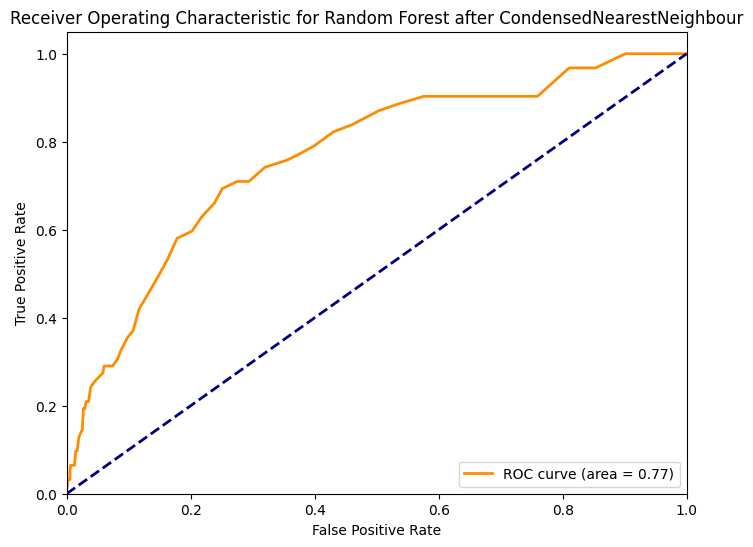

Confusion Matrix:
 [[954   6]
 [ 58   4]]


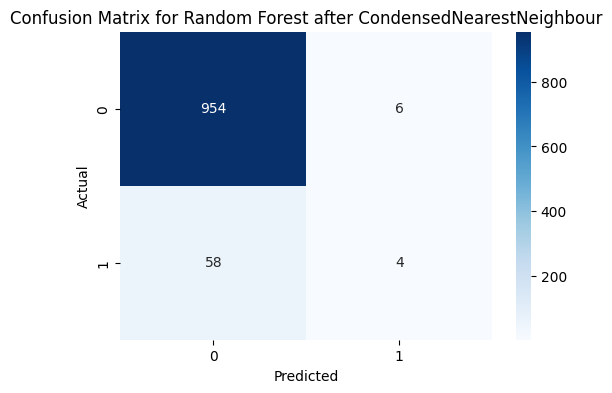


Model: SVM after CondensedNearestNeighbour
Accuracy: 0.9393346379647749
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.3644489247311828


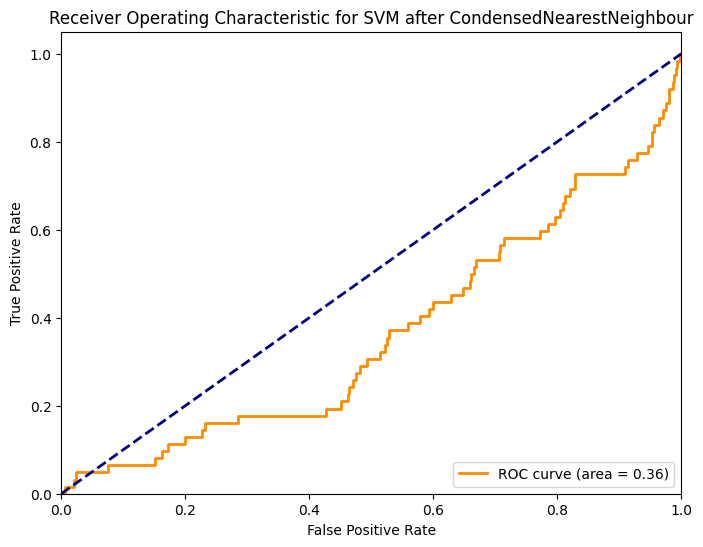

Confusion Matrix:
 [[960   0]
 [ 62   0]]


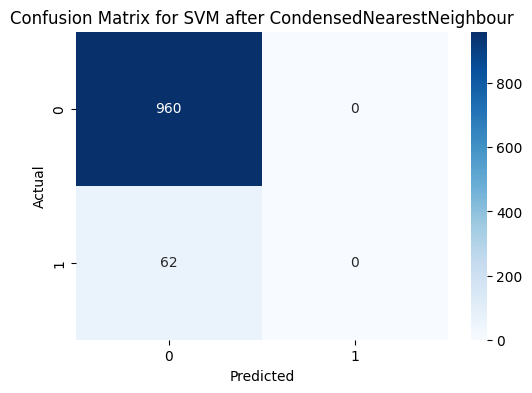


Model: Gradient Boosting after CondensedNearestNeighbour
Accuracy: 0.9060665362035225
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95       960
           1       0.10      0.06      0.08        62

    accuracy                           0.91      1022
   macro avg       0.52      0.51      0.51      1022
weighted avg       0.89      0.91      0.90      1022

ROC AUC Score: 0.7646841397849462


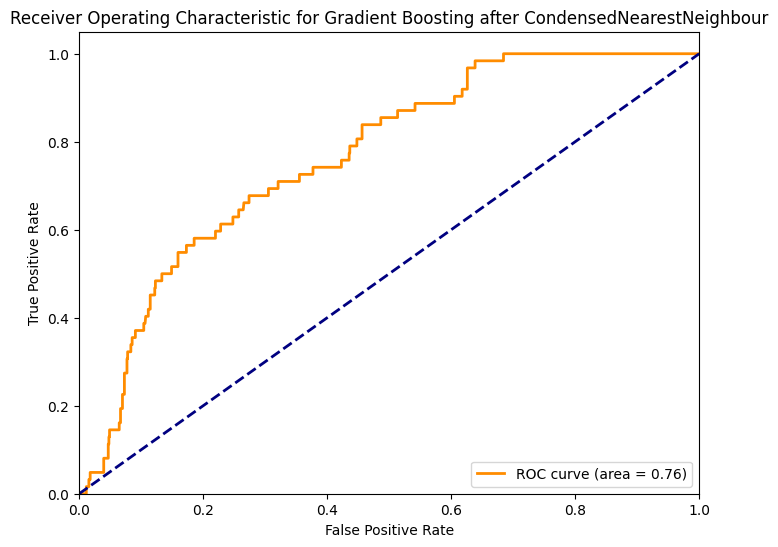

Confusion Matrix:
 [[922  38]
 [ 58   4]]


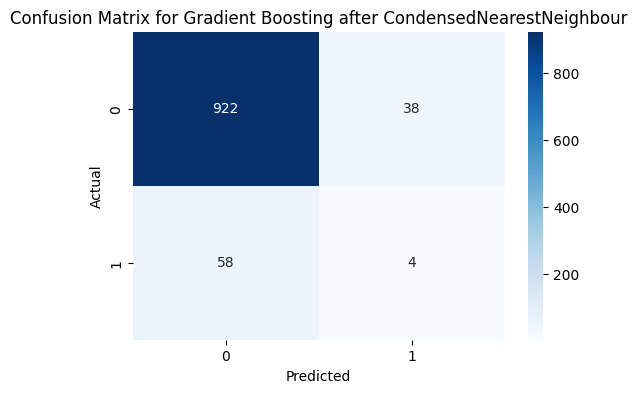


Model: AdaBoost after CondensedNearestNeighbour
Accuracy: 0.9207436399217221
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.97      0.96       960
           1       0.17      0.08      0.11        62

    accuracy                           0.92      1022
   macro avg       0.56      0.53      0.53      1022
weighted avg       0.90      0.92      0.91      1022

ROC AUC Score: 0.7404149865591398


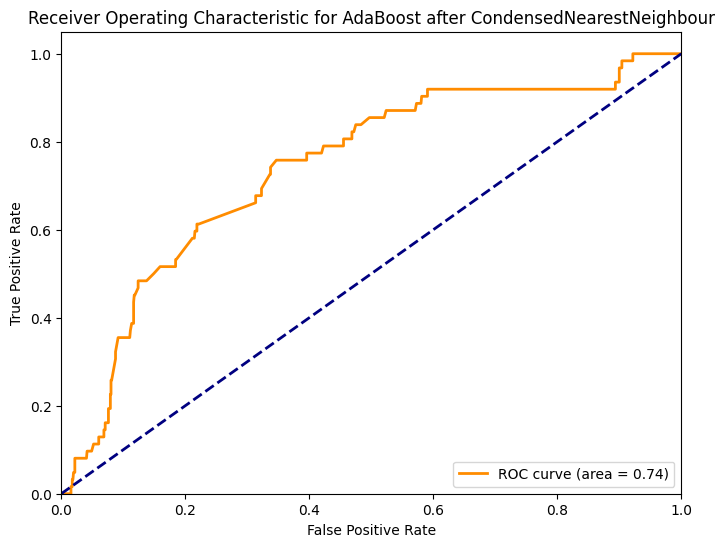

Confusion Matrix:
 [[936  24]
 [ 57   5]]


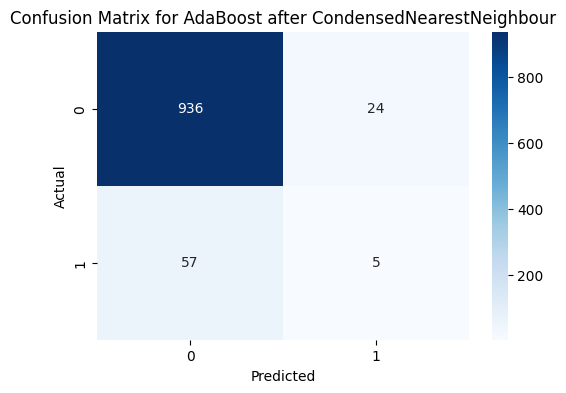


Model: XGBoost after CondensedNearestNeighbour
Accuracy: 0.8992172211350293
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.94      0.95       960
           1       0.22      0.26      0.24        62

    accuracy                           0.90      1022
   macro avg       0.59      0.60      0.59      1022
weighted avg       0.91      0.90      0.90      1022

ROC AUC Score: 0.7164818548387096


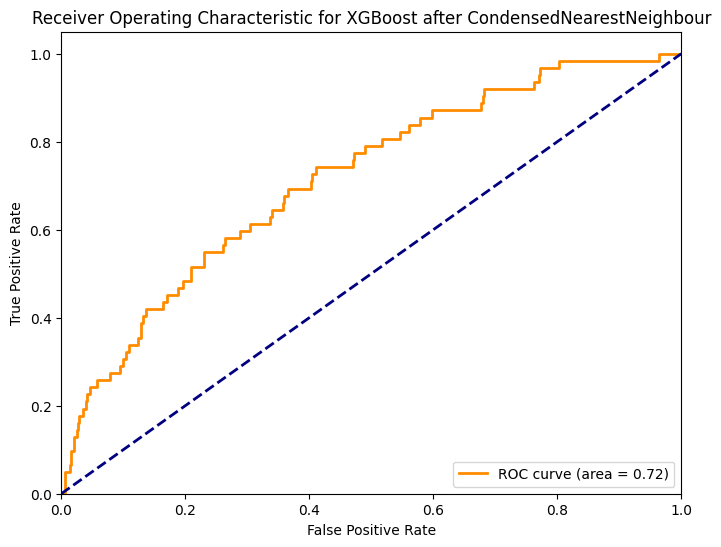

Confusion Matrix:
 [[903  57]
 [ 46  16]]


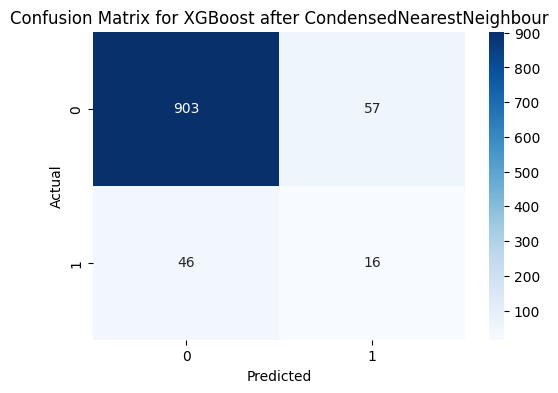

[LightGBM] [Info] Number of positive: 187, number of negative: 580
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 493
[LightGBM] [Info] Number of data points in the train set: 767, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.243807 -> initscore=-1.131919
[LightGBM] [Info] Start training from score -1.131919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

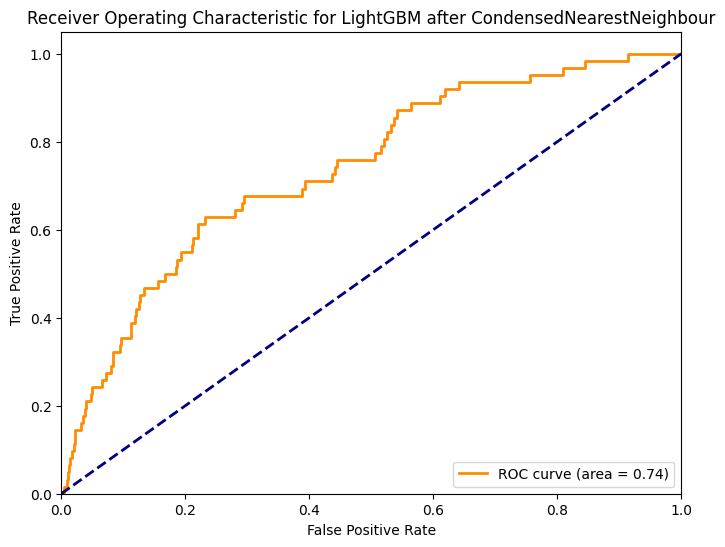

Confusion Matrix:
 [[920  40]
 [ 49  13]]


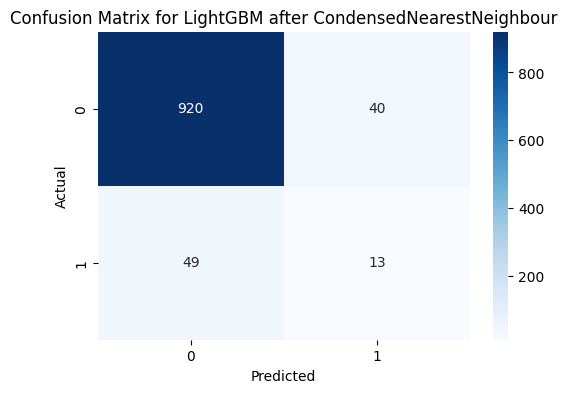


Model: CatBoost after CondensedNearestNeighbour
Accuracy: 0.9315068493150684
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.25      0.06      0.10        62

    accuracy                           0.93      1022
   macro avg       0.60      0.53      0.53      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.7991095430107527


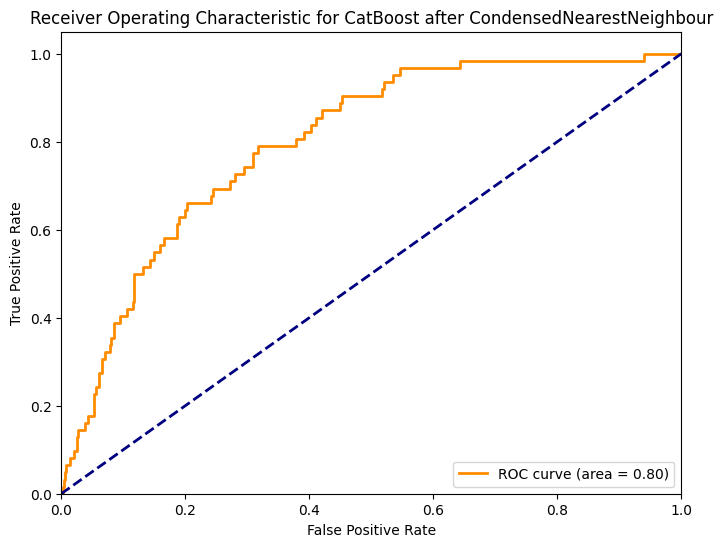

Confusion Matrix:
 [[948  12]
 [ 58   4]]


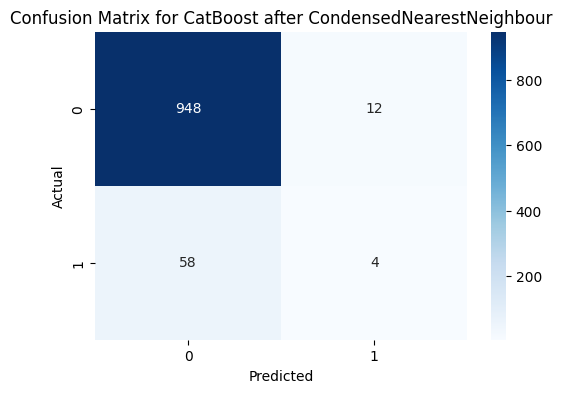


Model: k-Nearest Neighbors after CondensedNearestNeighbour
Accuracy: 0.9305283757338552
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.20      0.05      0.08        62

    accuracy                           0.93      1022
   macro avg       0.57      0.52      0.52      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.6411458333333334


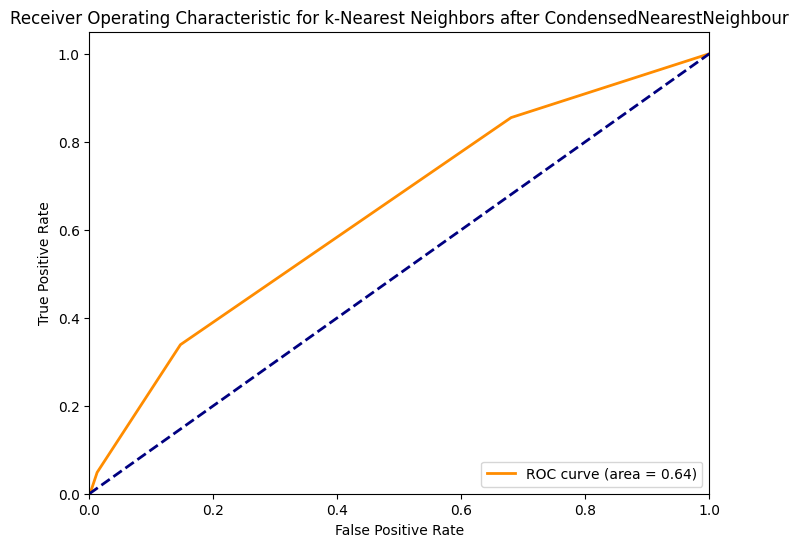

Confusion Matrix:
 [[948  12]
 [ 59   3]]


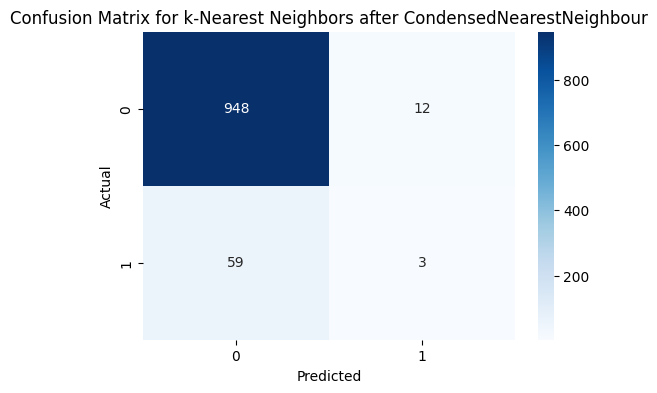


Model: Decision Tree after CondensedNearestNeighbour
Accuracy: 0.8082191780821918
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.85      0.89       960
           1       0.09      0.23      0.12        62

    accuracy                           0.81      1022
   macro avg       0.52      0.54      0.51      1022
weighted avg       0.89      0.81      0.85      1022

ROC AUC Score: 0.5358198924731183


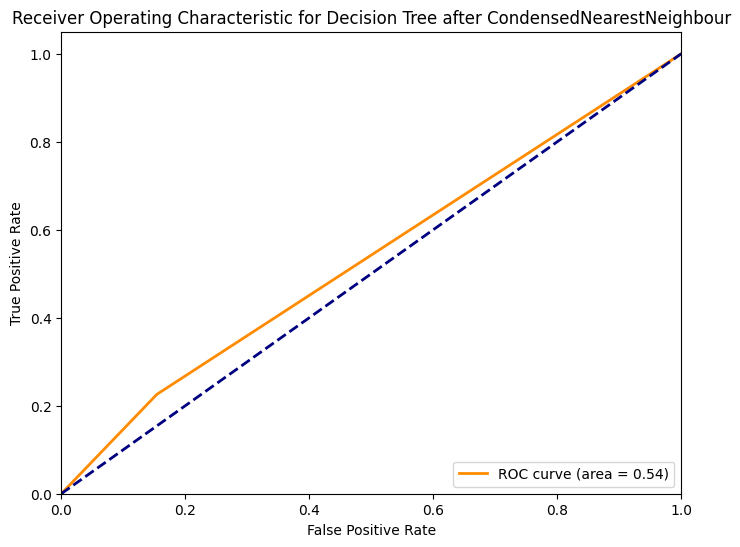

Confusion Matrix:
 [[812 148]
 [ 48  14]]


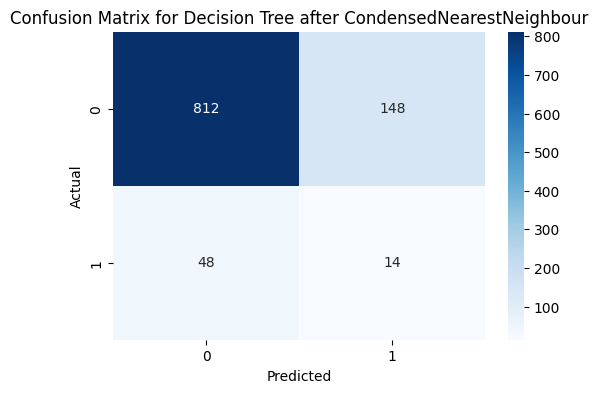


Model: Naive Bayes after CondensedNearestNeighbour
Accuracy: 0.9129158512720157
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.95       960
           1       0.24      0.19      0.21        62

    accuracy                           0.91      1022
   macro avg       0.59      0.58      0.58      1022
weighted avg       0.91      0.91      0.91      1022

ROC AUC Score: 0.8441028225806451


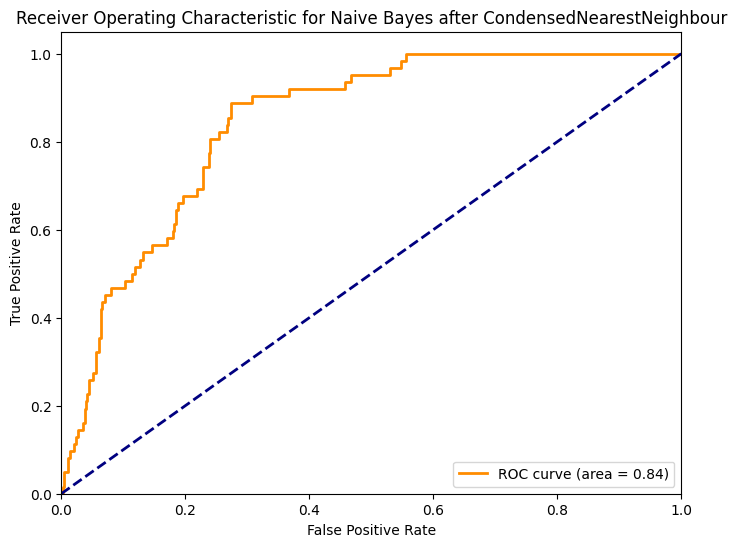

Confusion Matrix:
 [[921  39]
 [ 50  12]]


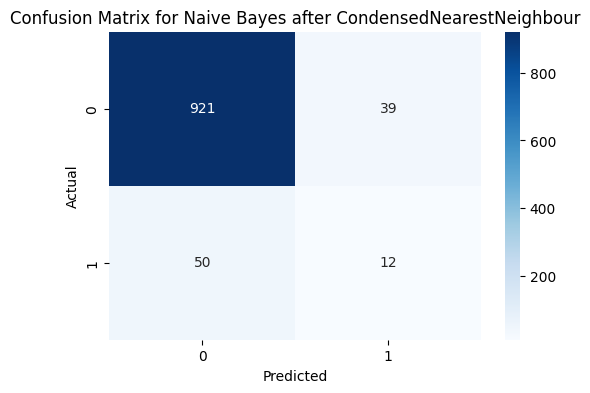


Model: Linear Discriminant Analysis after CondensedNearestNeighbour
Accuracy: 0.9383561643835616
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.8441532258064516


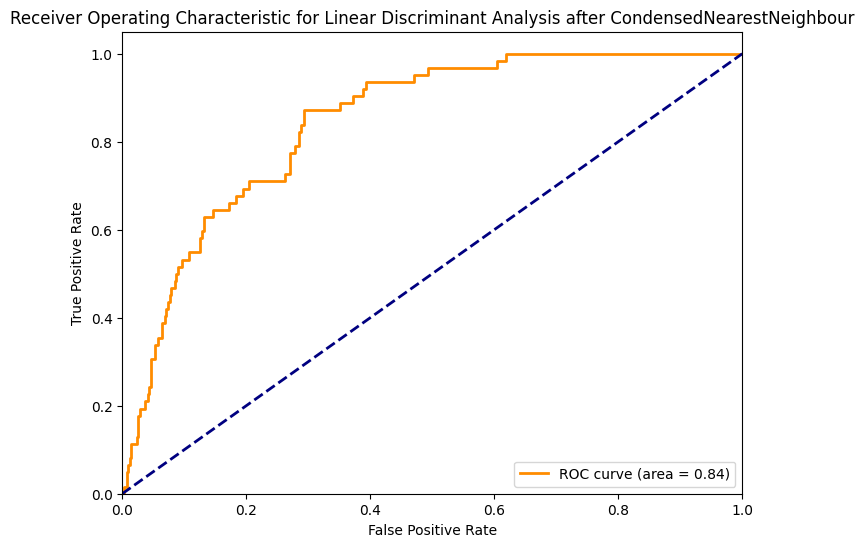

Confusion Matrix:
 [[959   1]
 [ 62   0]]


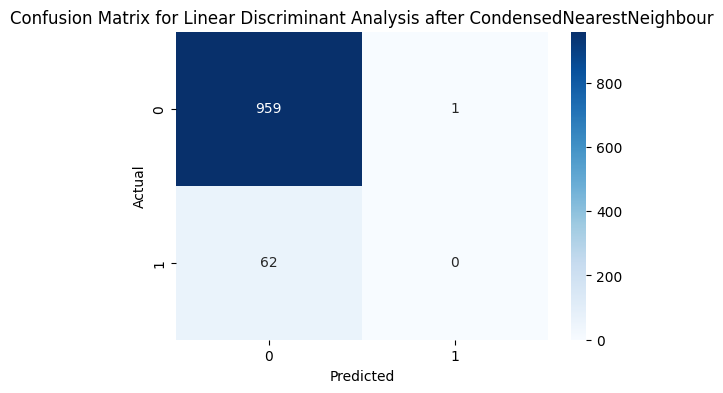


Model: Quadratic Discriminant Analysis after CondensedNearestNeighbour
Accuracy: 0.9207436399217221
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.27      0.18      0.21        62

    accuracy                           0.92      1022
   macro avg       0.61      0.57      0.59      1022
weighted avg       0.91      0.92      0.91      1022

ROC AUC Score: 0.837869623655914


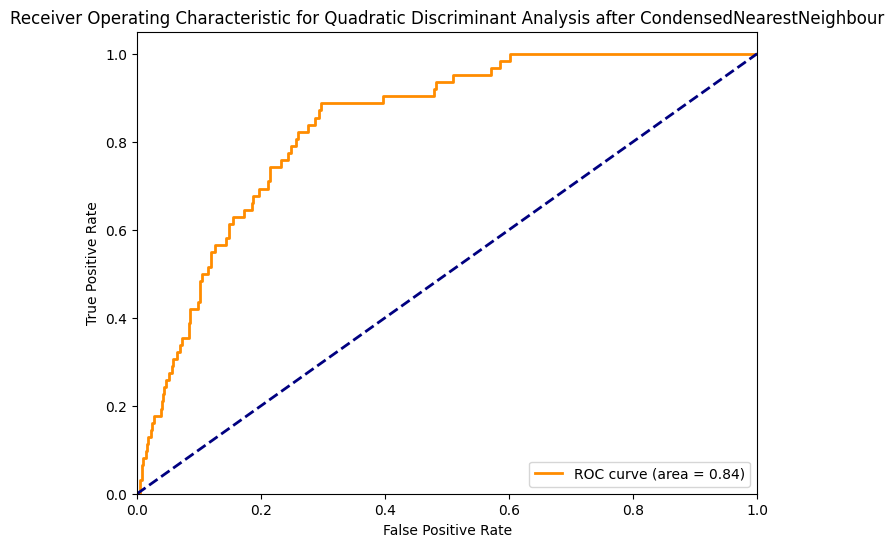

Confusion Matrix:
 [[930  30]
 [ 51  11]]


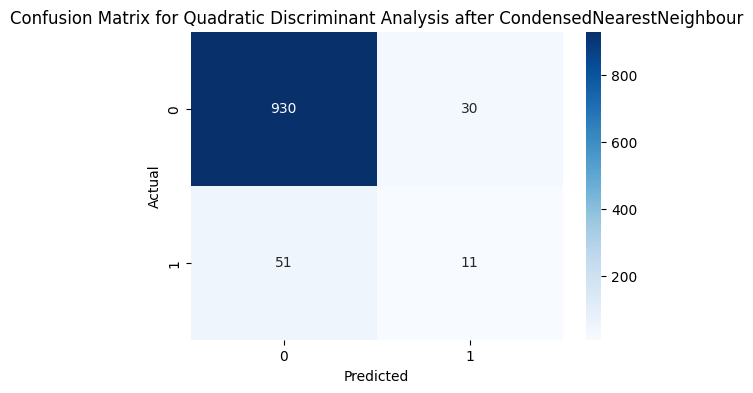


Model: Extra Trees after CondensedNearestNeighbour
Accuracy: 0.9295499021526419
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.25      0.08      0.12        62

    accuracy                           0.93      1022
   macro avg       0.60      0.53      0.54      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.7503612231182796


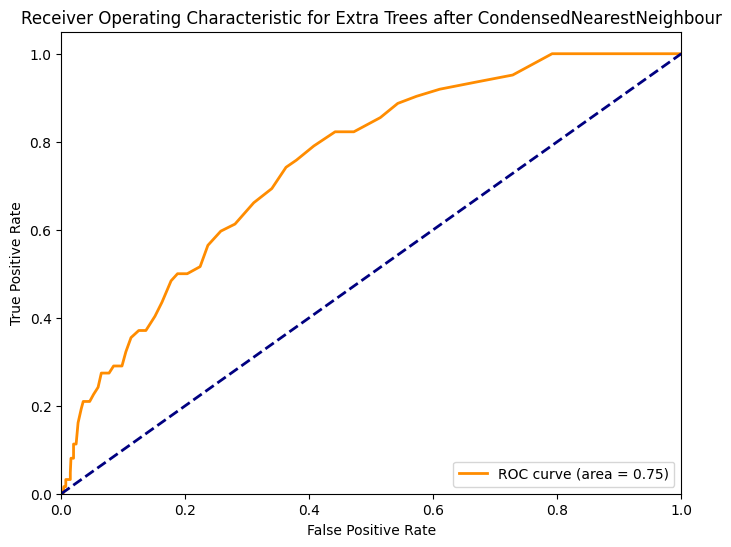

Confusion Matrix:
 [[945  15]
 [ 57   5]]


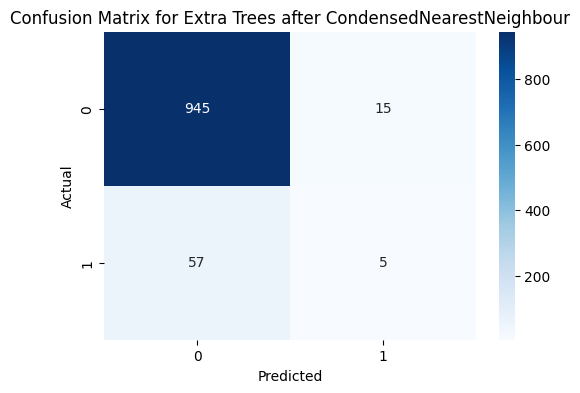


Applying OneSidedSelection

Model: Logistic Regression after OneSidedSelection
Accuracy: 0.9393346379647749
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.8512264784946236


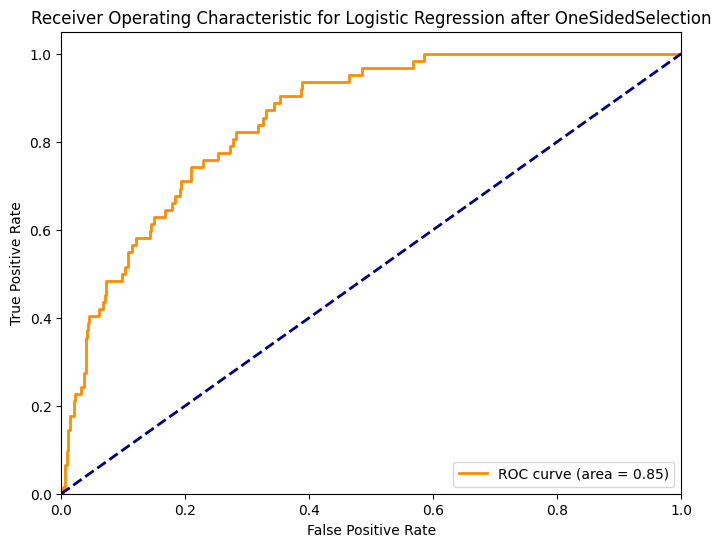

Confusion Matrix:
 [[960   0]
 [ 62   0]]


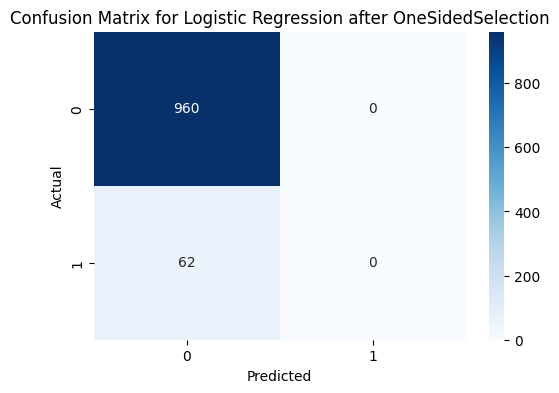


Model: Random Forest after OneSidedSelection
Accuracy: 0.9383561643835616
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.824546370967742


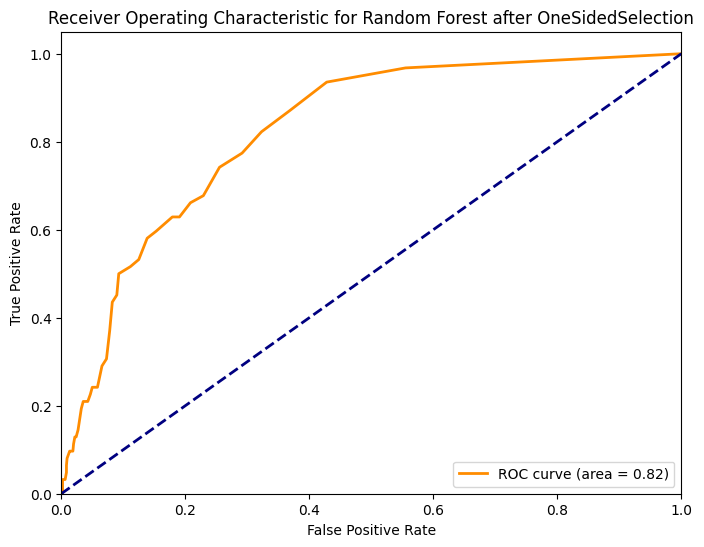

Confusion Matrix:
 [[959   1]
 [ 62   0]]


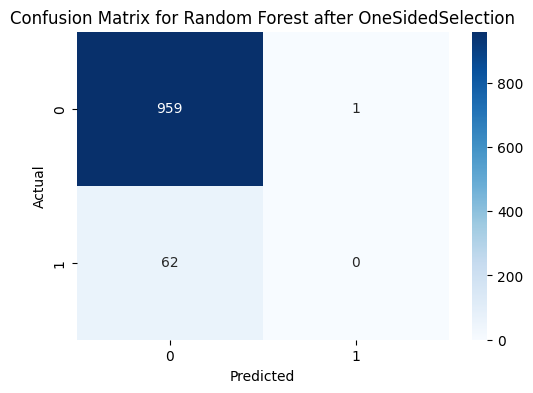


Model: SVM after OneSidedSelection
Accuracy: 0.9393346379647749
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.6302083333333334


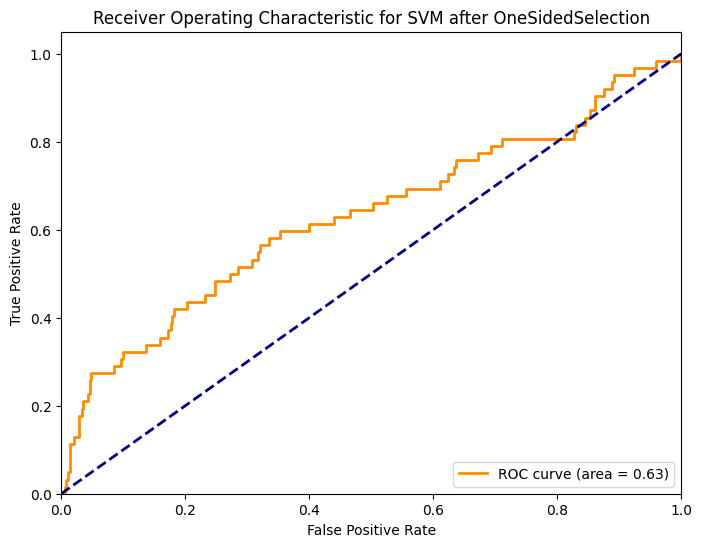

Confusion Matrix:
 [[960   0]
 [ 62   0]]


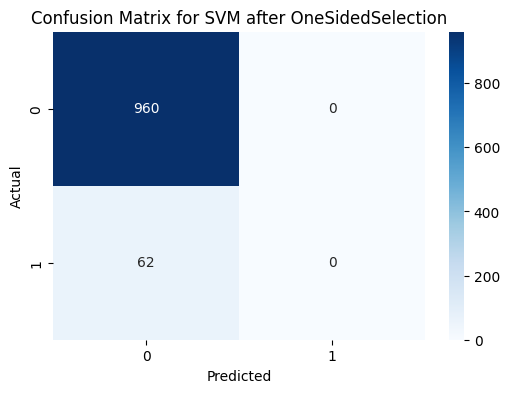


Model: Gradient Boosting after OneSidedSelection
Accuracy: 0.9393346379647749
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.50      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.72      0.51      0.50      1022
weighted avg       0.91      0.94      0.91      1022

ROC AUC Score: 0.8397849462365592


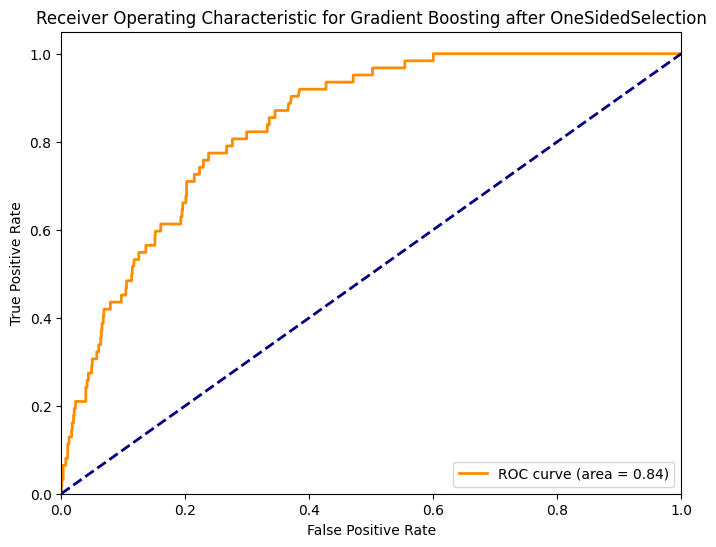

Confusion Matrix:
 [[959   1]
 [ 61   1]]


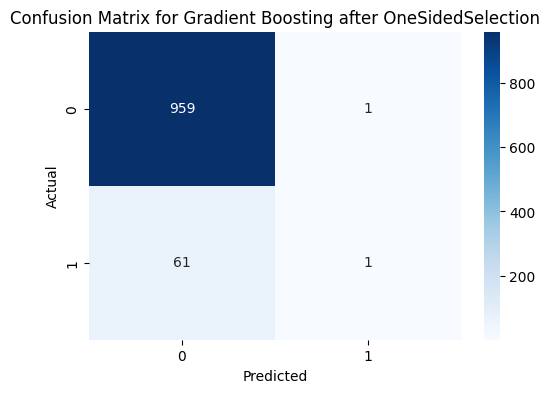


Model: AdaBoost after OneSidedSelection
Accuracy: 0.9383561643835616
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.40      0.03      0.06        62

    accuracy                           0.94      1022
   macro avg       0.67      0.51      0.51      1022
weighted avg       0.91      0.94      0.91      1022

ROC AUC Score: 0.7962029569892473


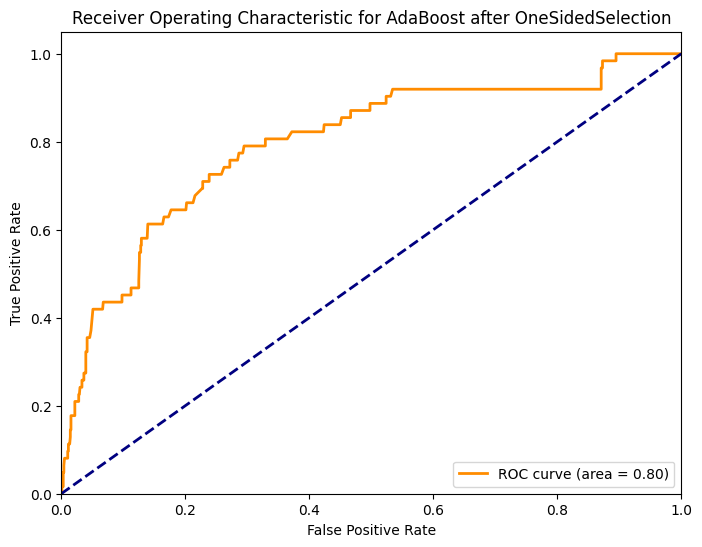

Confusion Matrix:
 [[957   3]
 [ 60   2]]


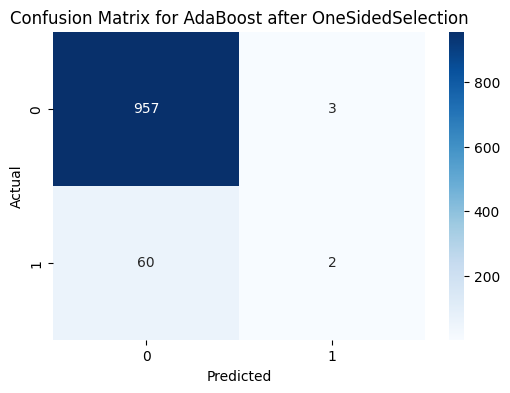


Model: XGBoost after OneSidedSelection
Accuracy: 0.9344422700587084
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.35      0.10      0.15        62

    accuracy                           0.93      1022
   macro avg       0.65      0.54      0.56      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8120631720430108


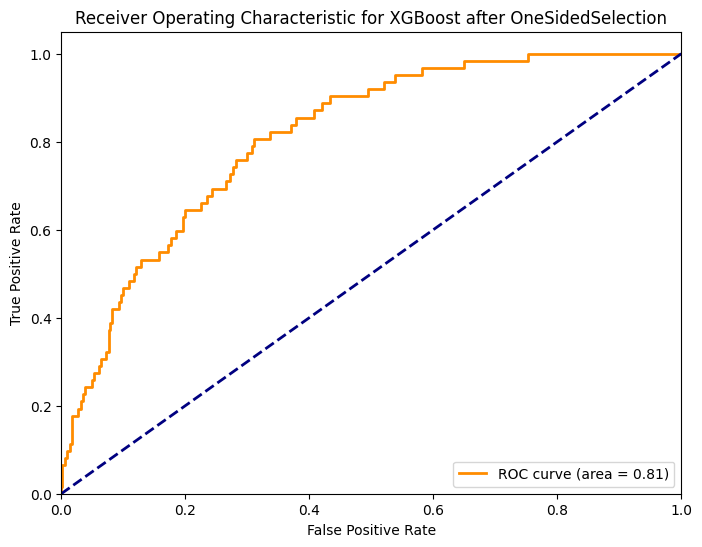

Confusion Matrix:
 [[949  11]
 [ 56   6]]


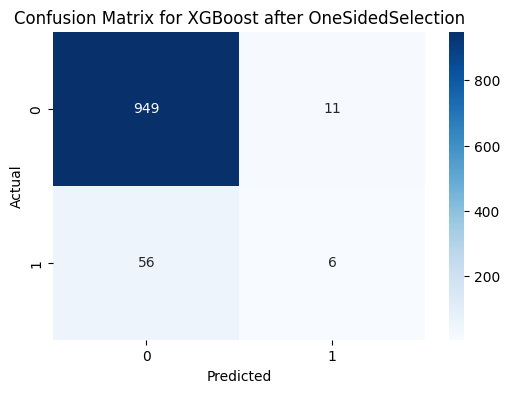

[LightGBM] [Info] Number of positive: 187, number of negative: 3793
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3980, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.046985 -> initscore=-3.009804
[LightGBM] [Info] Start training from score -3.009804

Model: LightGBM after OneSidedSelection
Accuracy: 0.9363992172211351
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.38      0.08      0.13        62

    accuracy                           0.94      1022
   macro avg       0.66      0.54      0.55      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.819237231

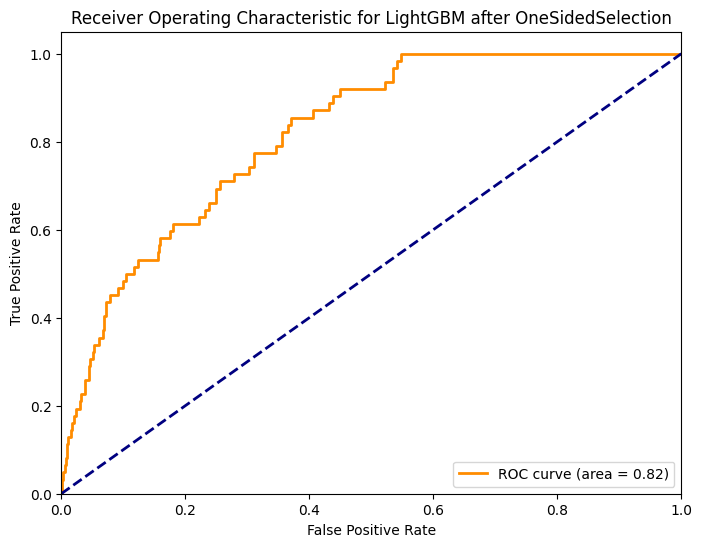

Confusion Matrix:
 [[952   8]
 [ 57   5]]


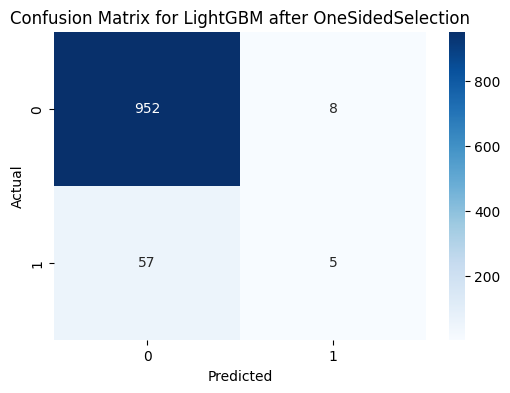


Model: CatBoost after OneSidedSelection
Accuracy: 0.9393346379647749
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.50      0.05      0.09        62

    accuracy                           0.94      1022
   macro avg       0.72      0.52      0.53      1022
weighted avg       0.92      0.94      0.92      1022

ROC AUC Score: 0.8196236559139785


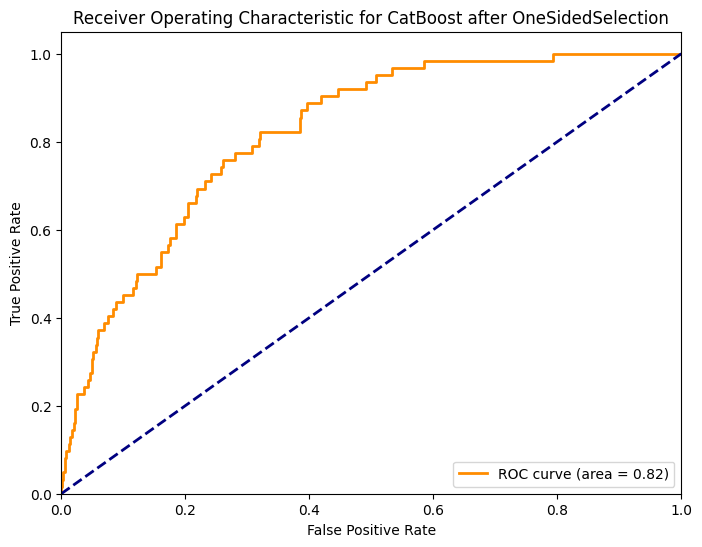

Confusion Matrix:
 [[957   3]
 [ 59   3]]


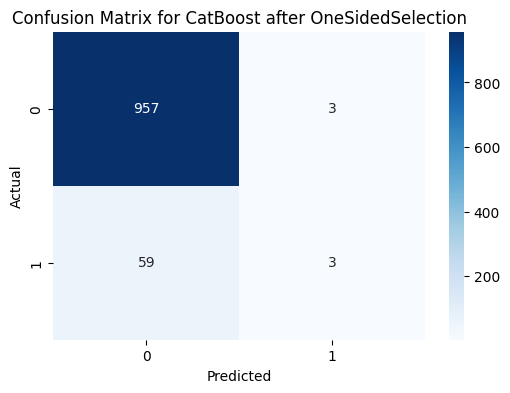


Model: k-Nearest Neighbors after OneSidedSelection
Accuracy: 0.9403131115459883
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       1.00      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.97      0.51      0.50      1022
weighted avg       0.94      0.94      0.91      1022

ROC AUC Score: 0.6585181451612904


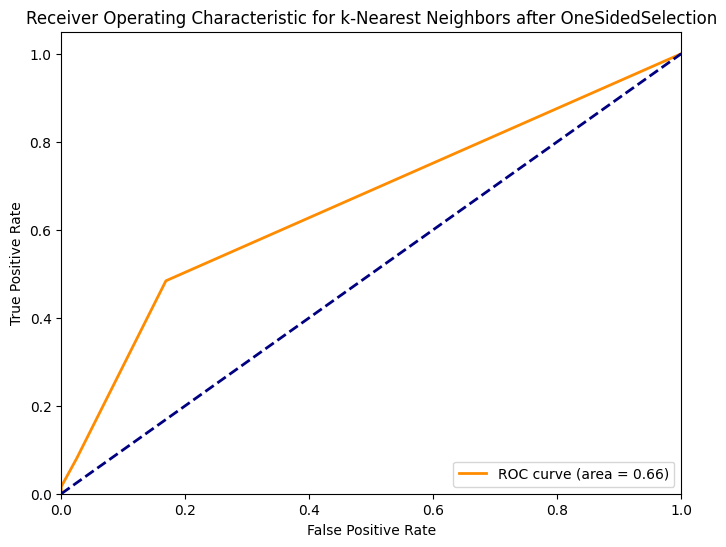

Confusion Matrix:
 [[960   0]
 [ 61   1]]


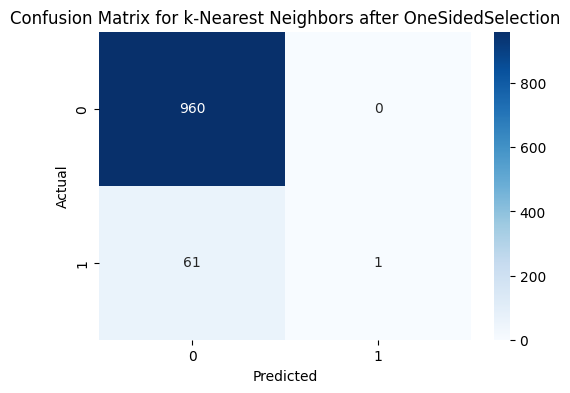


Model: Decision Tree after OneSidedSelection
Accuracy: 0.9021526418786693
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.95      0.95       960
           1       0.15      0.13      0.14        62

    accuracy                           0.90      1022
   macro avg       0.55      0.54      0.54      1022
weighted avg       0.90      0.90      0.90      1022

ROC AUC Score: 0.5405577956989246


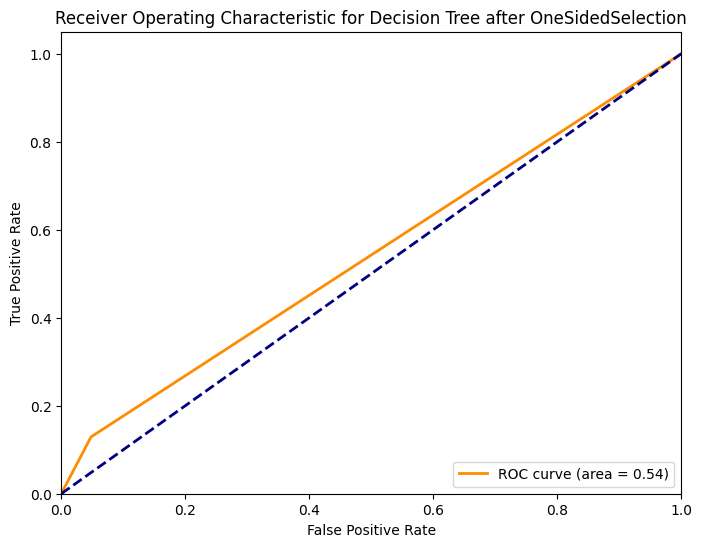

Confusion Matrix:
 [[914  46]
 [ 54   8]]


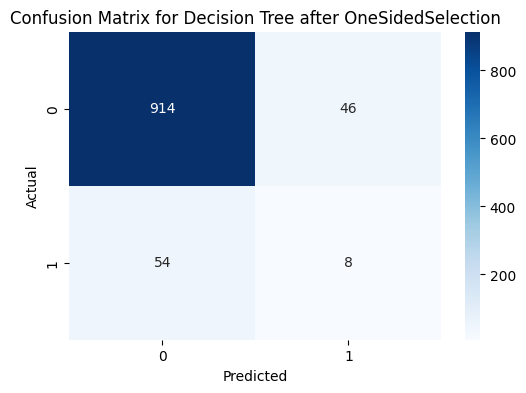


Model: Naive Bayes after OneSidedSelection
Accuracy: 0.8639921722113503
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.89      0.92       960
           1       0.21      0.47      0.29        62

    accuracy                           0.86      1022
   macro avg       0.59      0.68      0.61      1022
weighted avg       0.92      0.86      0.89      1022

ROC AUC Score: 0.8284442204301076


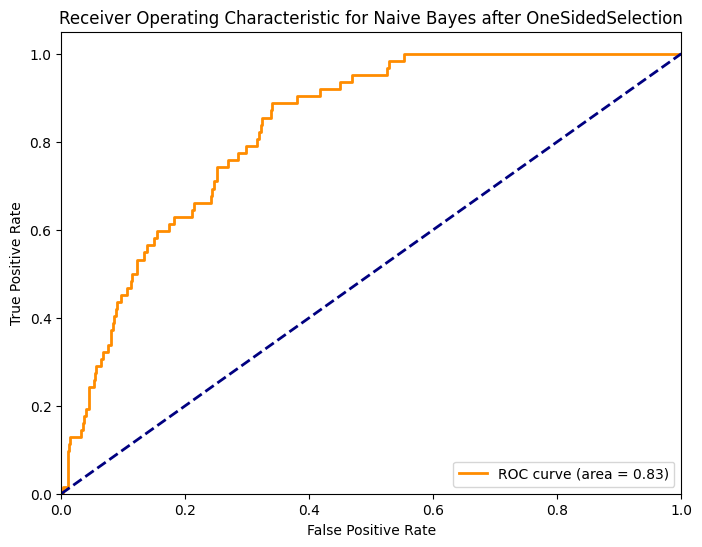

Confusion Matrix:
 [[854 106]
 [ 33  29]]


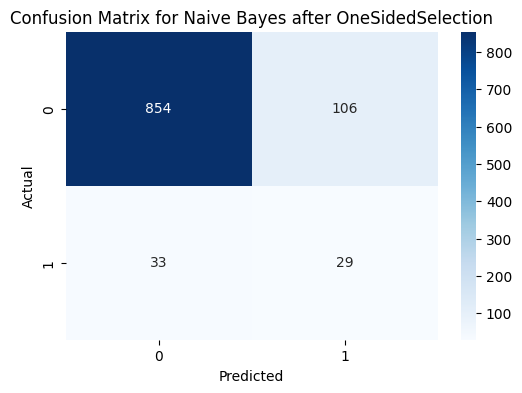


Model: Linear Discriminant Analysis after OneSidedSelection
Accuracy: 0.9315068493150684
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96       960
           1       0.25      0.06      0.10        62

    accuracy                           0.93      1022
   macro avg       0.60      0.53      0.53      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.8410618279569892


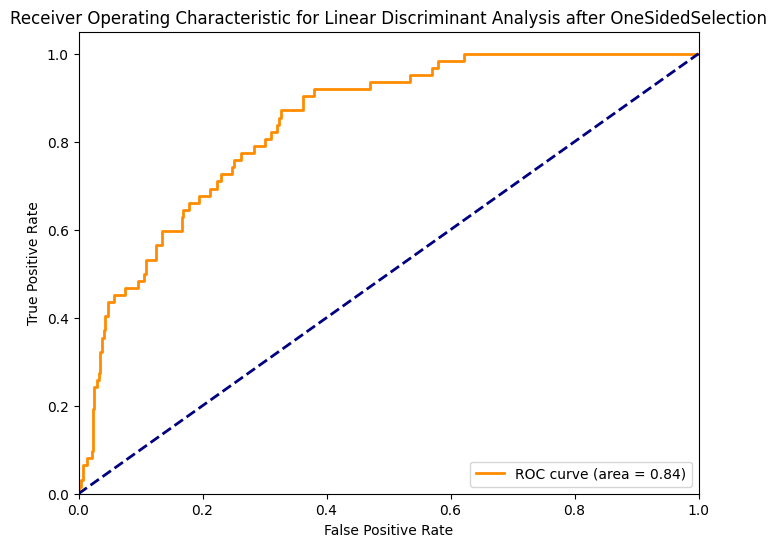

Confusion Matrix:
 [[948  12]
 [ 58   4]]


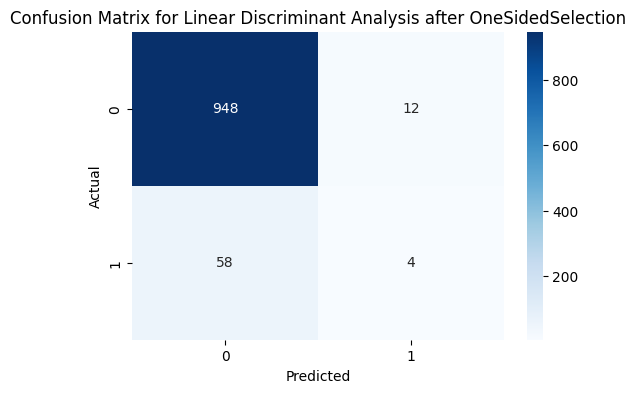


Model: Quadratic Discriminant Analysis after OneSidedSelection
Accuracy: 0.87573385518591
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93       960
           1       0.24      0.48      0.32        62

    accuracy                           0.88      1022
   macro avg       0.60      0.69      0.63      1022
weighted avg       0.92      0.88      0.89      1022

ROC AUC Score: 0.8301411290322581


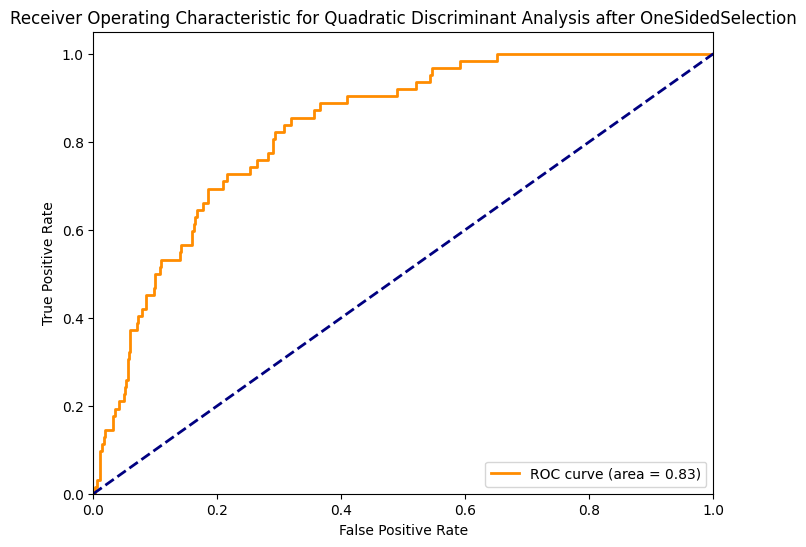

Confusion Matrix:
 [[865  95]
 [ 32  30]]


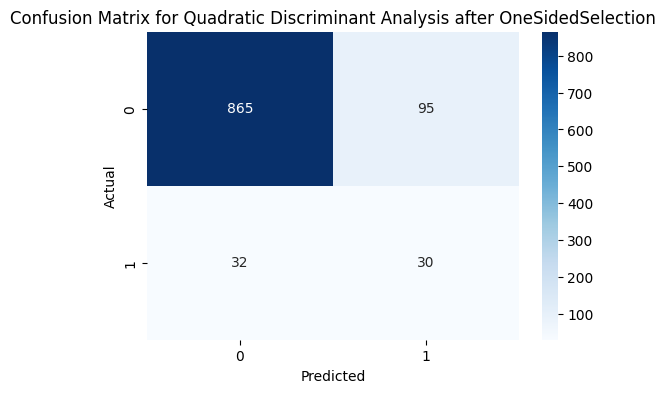


Model: Extra Trees after OneSidedSelection
Accuracy: 0.9344422700587084
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.22      0.03      0.06        62

    accuracy                           0.93      1022
   macro avg       0.58      0.51      0.51      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.7595010080645161


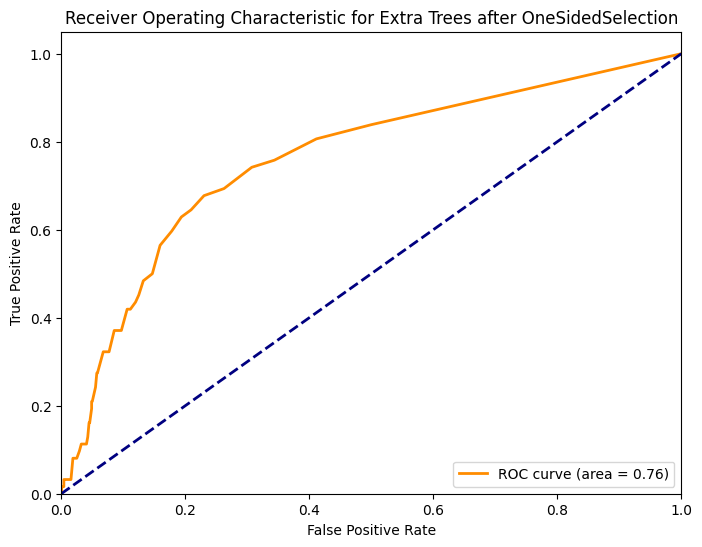

Confusion Matrix:
 [[953   7]
 [ 60   2]]


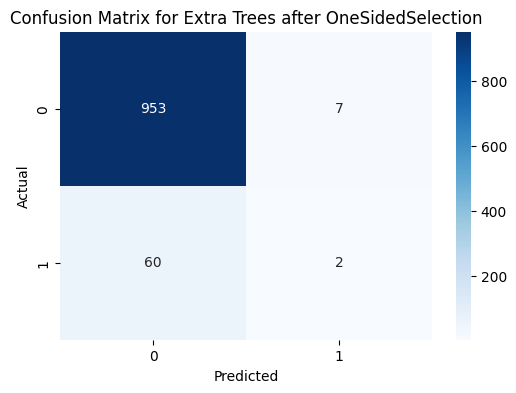


Applying NeighbourhoodCleaningRule

Model: Logistic Regression after NeighbourhoodCleaningRule
Accuracy: 0.9383561643835616
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.33      0.02      0.03        62

    accuracy                           0.94      1022
   macro avg       0.64      0.51      0.50      1022
weighted avg       0.90      0.94      0.91      1022

ROC AUC Score: 0.8525873655913978


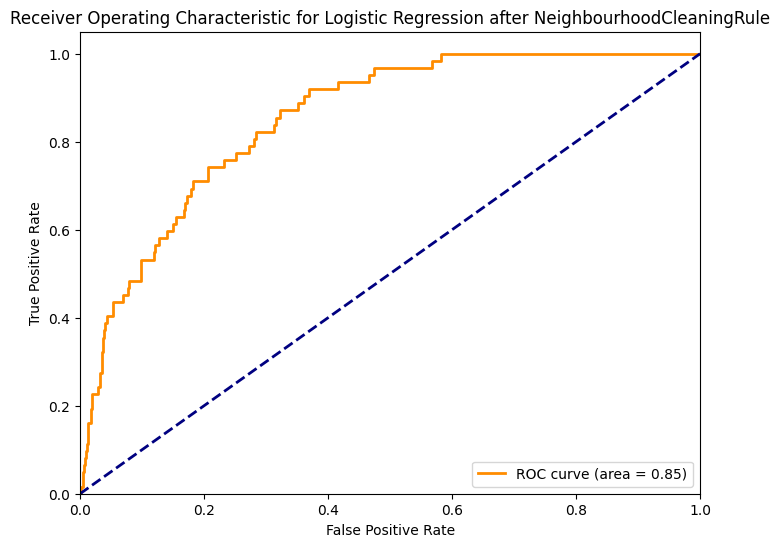

Confusion Matrix:
 [[958   2]
 [ 61   1]]


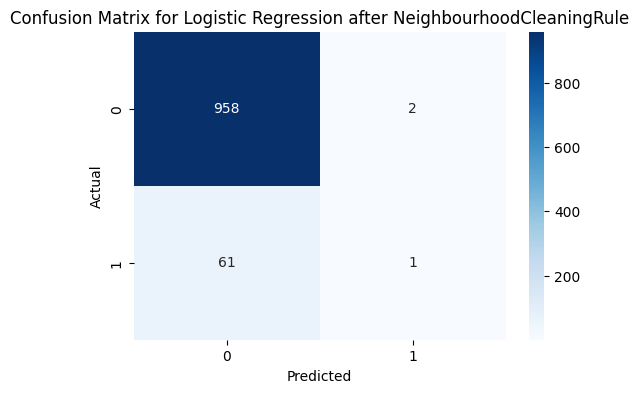


Model: Random Forest after NeighbourhoodCleaningRule
Accuracy: 0.9383561643835616
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.44      0.06      0.11        62

    accuracy                           0.94      1022
   macro avg       0.69      0.53      0.54      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.8086945564516129


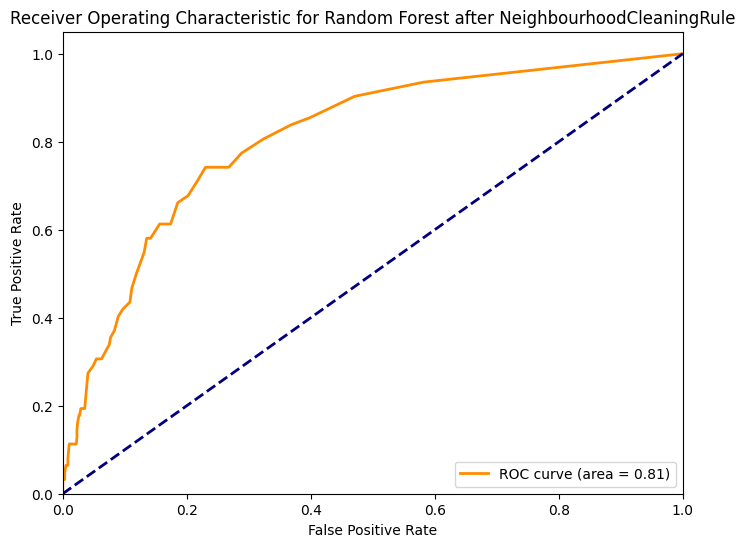

Confusion Matrix:
 [[955   5]
 [ 58   4]]


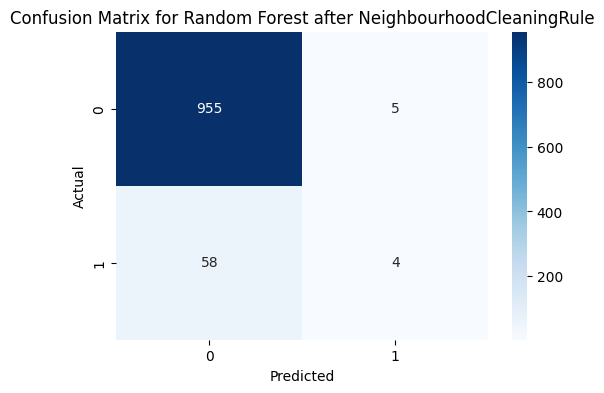


Model: SVM after NeighbourhoodCleaningRule
Accuracy: 0.9373776908023483
Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       960
           1       0.00      0.00      0.00        62

    accuracy                           0.94      1022
   macro avg       0.47      0.50      0.48      1022
weighted avg       0.88      0.94      0.91      1022

ROC AUC Score: 0.703209005376344


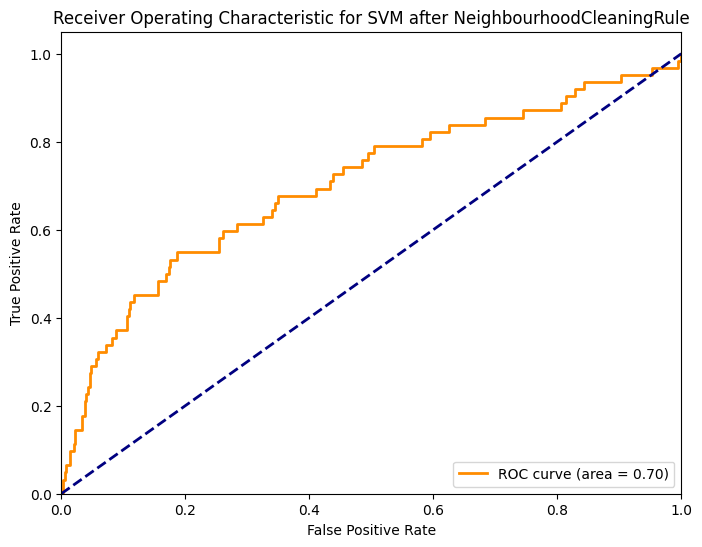

Confusion Matrix:
 [[958   2]
 [ 62   0]]


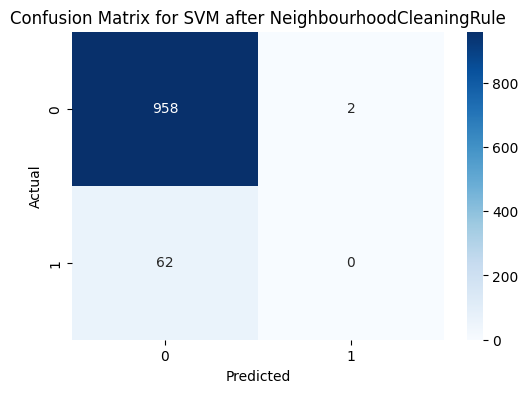


Model: Gradient Boosting after NeighbourhoodCleaningRule
Accuracy: 0.9344422700587084
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.22      0.03      0.06        62

    accuracy                           0.93      1022
   macro avg       0.58      0.51      0.51      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.8460685483870967


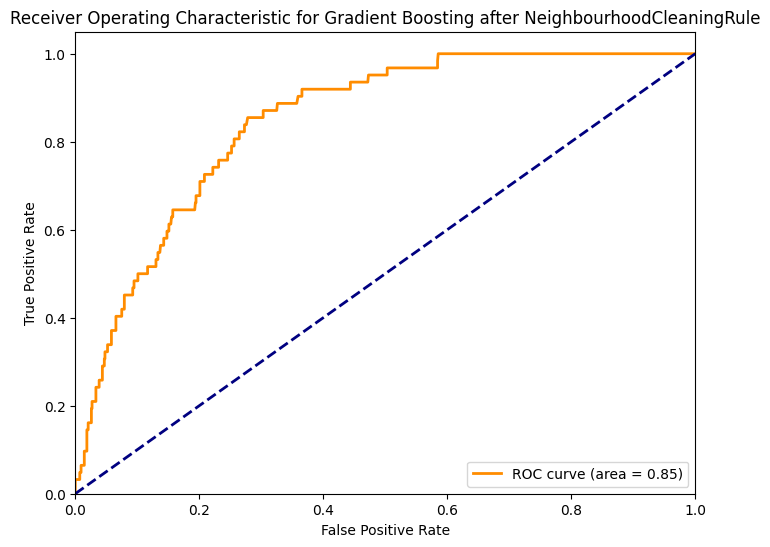

Confusion Matrix:
 [[953   7]
 [ 60   2]]


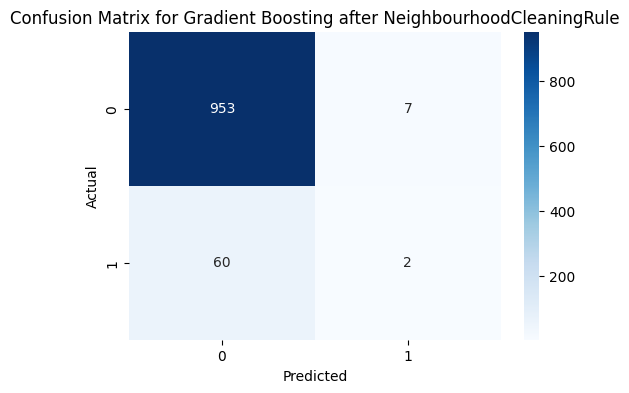


Model: AdaBoost after NeighbourhoodCleaningRule
Accuracy: 0.9363992172211351
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.36      0.06      0.11        62

    accuracy                           0.94      1022
   macro avg       0.65      0.53      0.54      1022
weighted avg       0.91      0.94      0.92      1022

ROC AUC Score: 0.83125


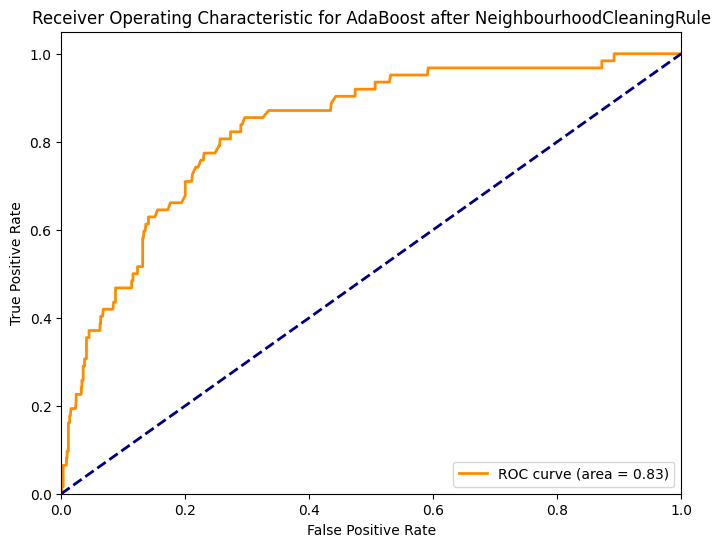

Confusion Matrix:
 [[953   7]
 [ 58   4]]


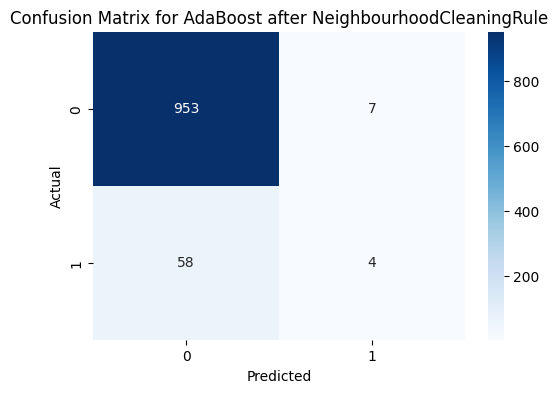


Model: XGBoost after NeighbourhoodCleaningRule
Accuracy: 0.9315068493150684
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.96       960
           1       0.36      0.16      0.22        62

    accuracy                           0.93      1022
   macro avg       0.65      0.57      0.59      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8221102150537635


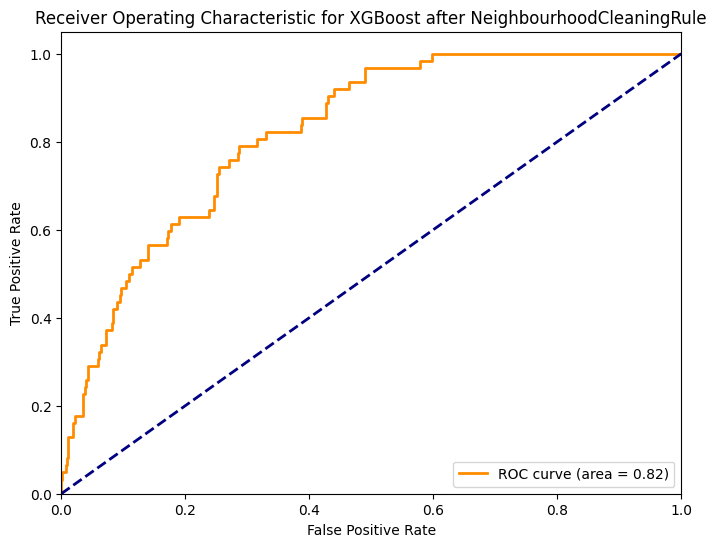

Confusion Matrix:
 [[942  18]
 [ 52  10]]


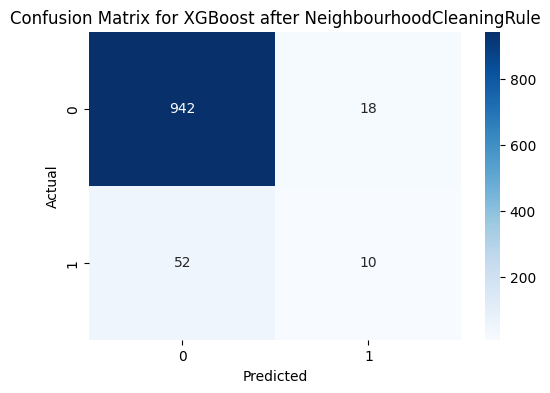

[LightGBM] [Info] Number of positive: 187, number of negative: 3478
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 637
[LightGBM] [Info] Number of data points in the train set: 3665, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.051023 -> initscore=-2.923104
[LightGBM] [Info] Start training from score -2.923104

Model: LightGBM after NeighbourhoodCleaningRule
Accuracy: 0.9305283757338552
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.30      0.11      0.16        62

    accuracy                           0.93      1022
   macro avg       0.62      0.55      0.56      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.8

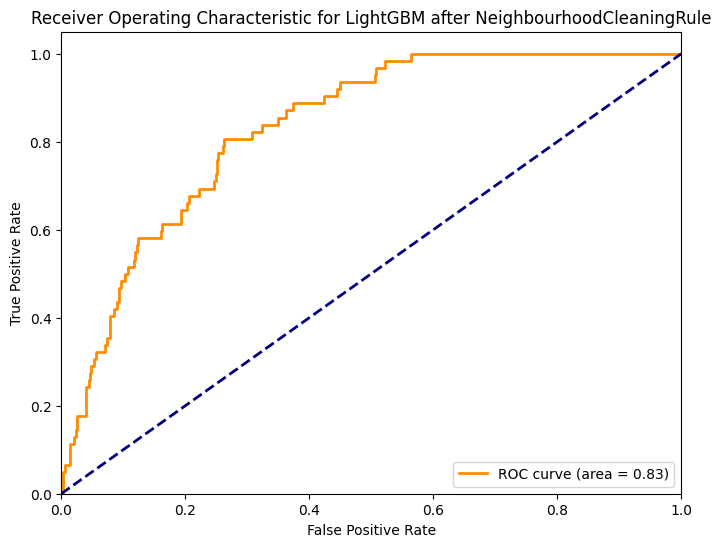

Confusion Matrix:
 [[944  16]
 [ 55   7]]


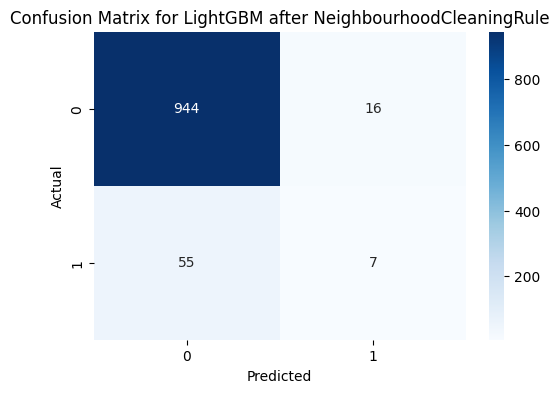


Model: CatBoost after NeighbourhoodCleaningRule
Accuracy: 0.9334637964774951
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       960
           1       0.29      0.06      0.11        62

    accuracy                           0.93      1022
   macro avg       0.61      0.53      0.54      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.8292506720430108


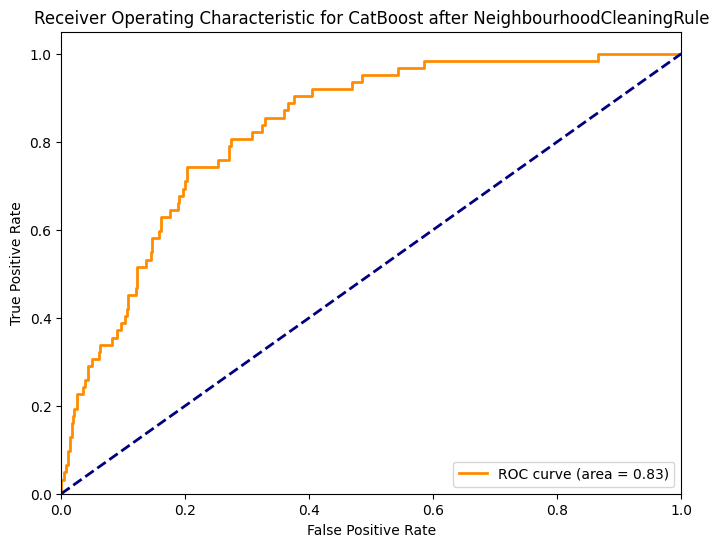

Confusion Matrix:
 [[950  10]
 [ 58   4]]


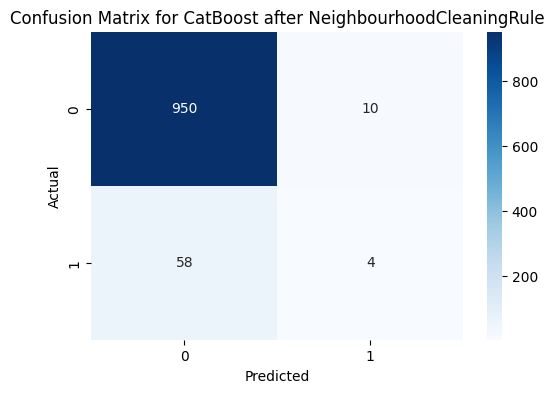


Model: k-Nearest Neighbors after NeighbourhoodCleaningRule
Accuracy: 0.9344422700587084
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97       960
           1       0.37      0.11      0.17        62

    accuracy                           0.93      1022
   macro avg       0.66      0.55      0.57      1022
weighted avg       0.91      0.93      0.92      1022

ROC AUC Score: 0.6801159274193548


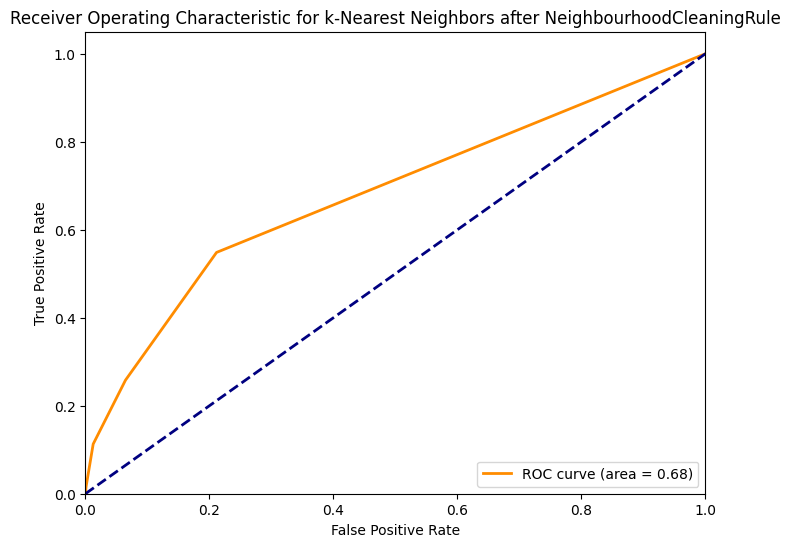

Confusion Matrix:
 [[948  12]
 [ 55   7]]


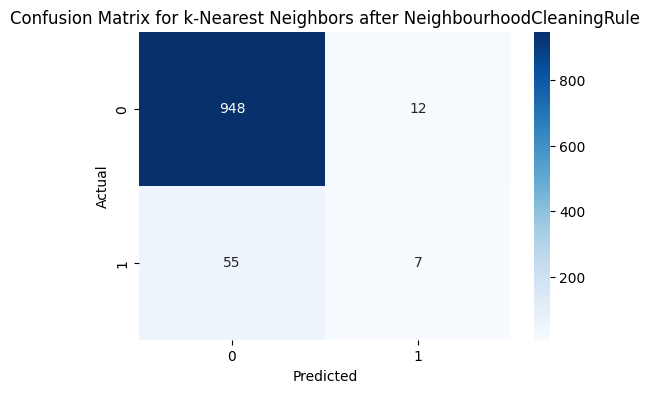


Model: Decision Tree after NeighbourhoodCleaningRule
Accuracy: 0.8943248532289628
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.94      0.94       960
           1       0.18      0.21      0.19        62

    accuracy                           0.89      1022
   macro avg       0.56      0.57      0.57      1022
weighted avg       0.90      0.89      0.90      1022

ROC AUC Score: 0.5741095430107528


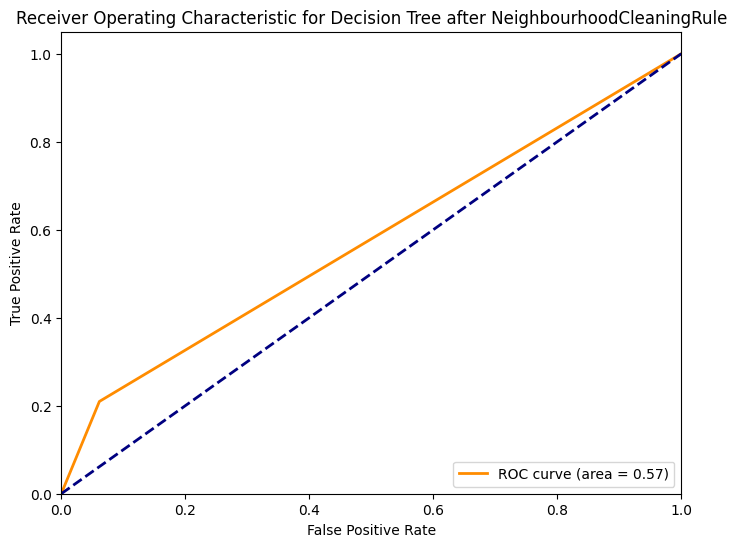

Confusion Matrix:
 [[901  59]
 [ 49  13]]


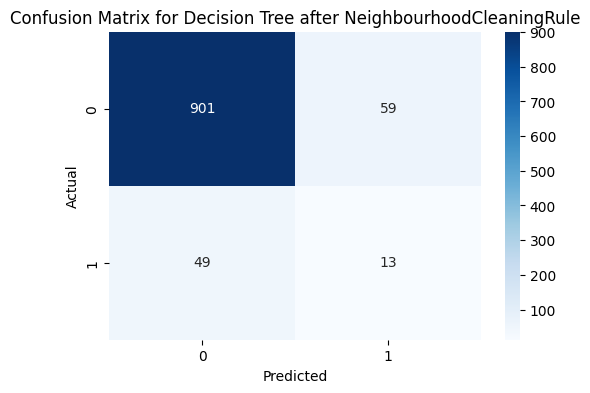


Model: Naive Bayes after NeighbourhoodCleaningRule
Accuracy: 0.850293542074364
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.87      0.92       960
           1       0.21      0.52      0.29        62

    accuracy                           0.85      1022
   macro avg       0.59      0.69      0.61      1022
weighted avg       0.92      0.85      0.88      1022

ROC AUC Score: 0.8262600806451613


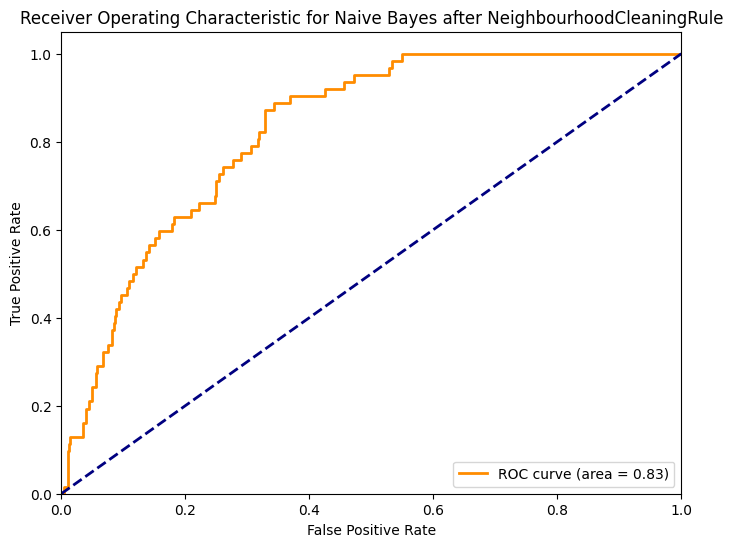

Confusion Matrix:
 [[837 123]
 [ 30  32]]


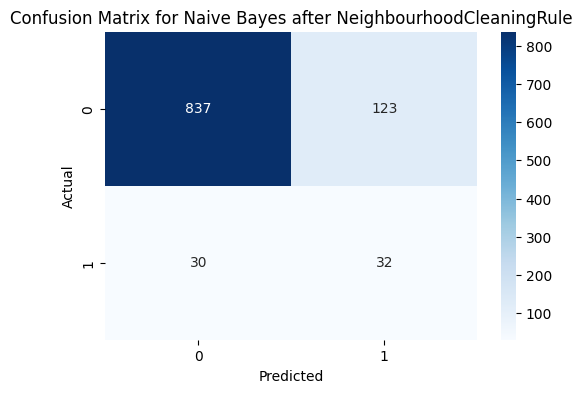


Model: Linear Discriminant Analysis after NeighbourhoodCleaningRule
Accuracy: 0.9275929549902152
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       960
           1       0.37      0.27      0.31        62

    accuracy                           0.93      1022
   macro avg       0.66      0.62      0.64      1022
weighted avg       0.92      0.93      0.92      1022

ROC AUC Score: 0.8382056451612903


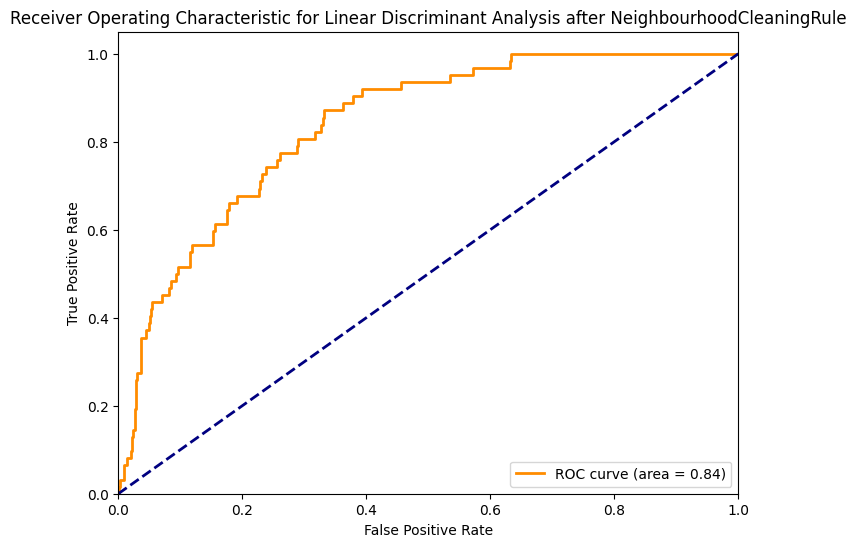

Confusion Matrix:
 [[931  29]
 [ 45  17]]


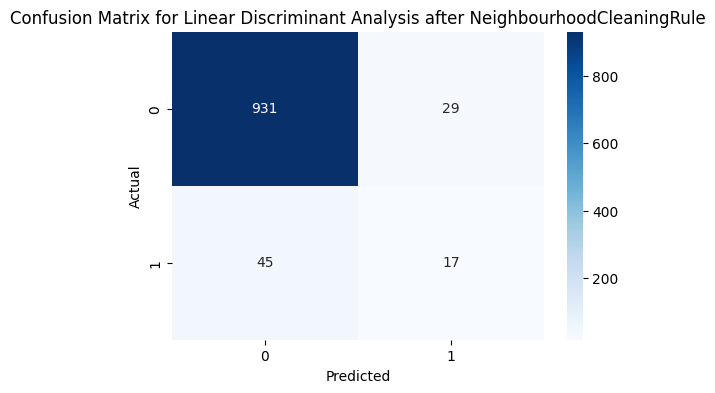


Model: Quadratic Discriminant Analysis after NeighbourhoodCleaningRule
Accuracy: 0.8581213307240705
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.88      0.92       960
           1       0.22      0.53      0.31        62

    accuracy                           0.86      1022
   macro avg       0.59      0.71      0.62      1022
weighted avg       0.92      0.86      0.88      1022

ROC AUC Score: 0.8267305107526881


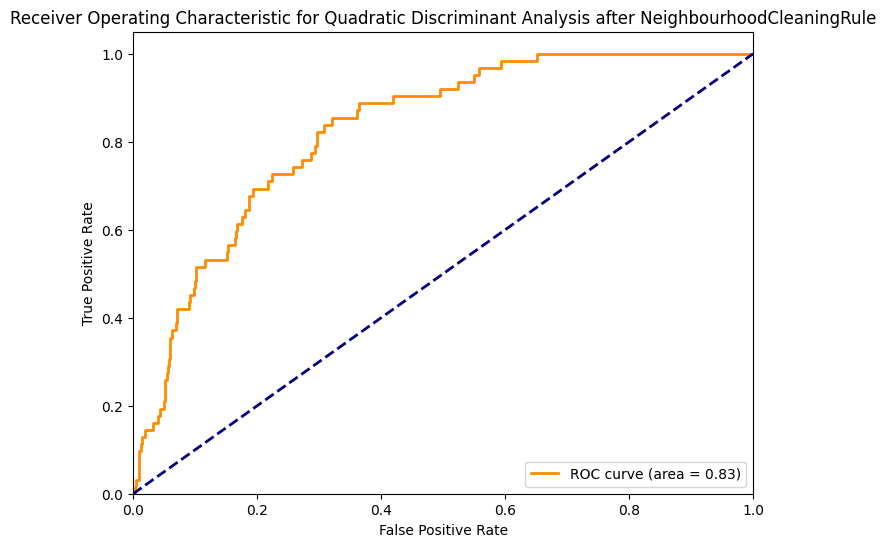

Confusion Matrix:
 [[844 116]
 [ 29  33]]


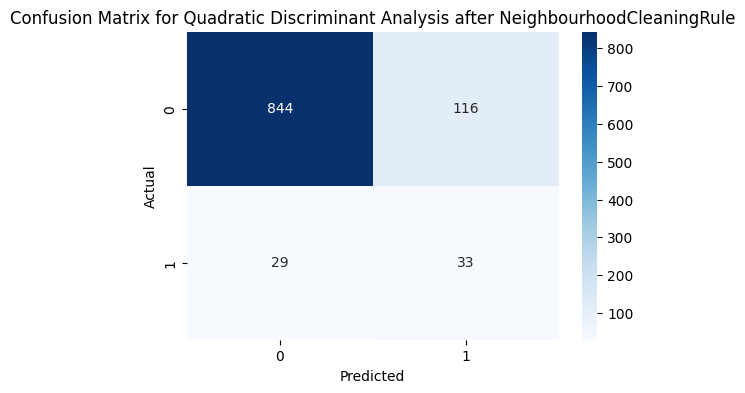


Model: Extra Trees after NeighbourhoodCleaningRule
Accuracy: 0.9275929549902152
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.98      0.96       960
           1       0.25      0.10      0.14        62

    accuracy                           0.93      1022
   macro avg       0.60      0.54      0.55      1022
weighted avg       0.90      0.93      0.91      1022

ROC AUC Score: 0.7969926075268817


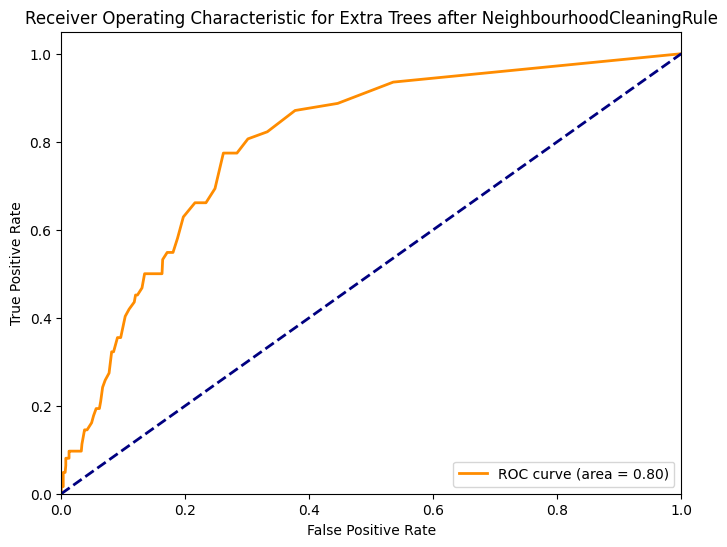

Confusion Matrix:
 [[942  18]
 [ 56   6]]


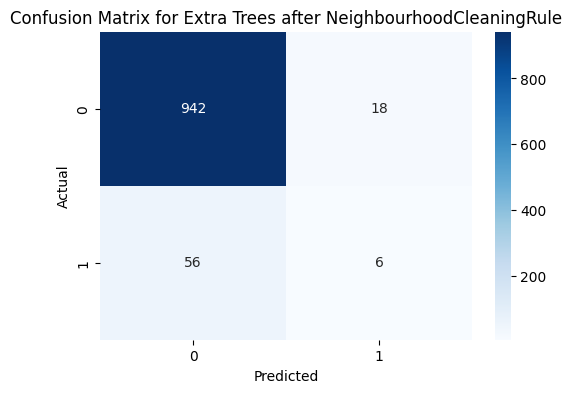


Applying InstanceHardnessThreshold

Model: Logistic Regression after InstanceHardnessThreshold
Accuracy: 0.2465753424657534
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.20      0.33       960
           1       0.07      1.00      0.14        62

    accuracy                           0.25      1022
   macro avg       0.54      0.60      0.23      1022
weighted avg       0.94      0.25      0.32      1022

ROC AUC Score: 0.730426747311828


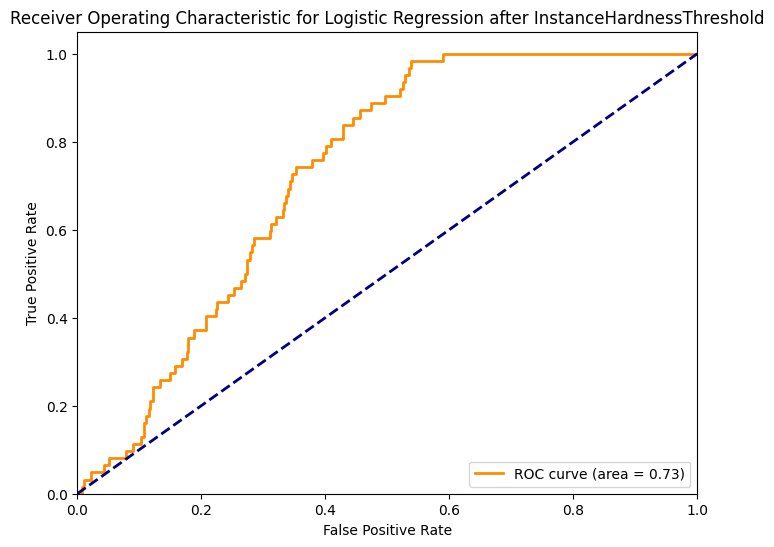

Confusion Matrix:
 [[190 770]
 [  0  62]]


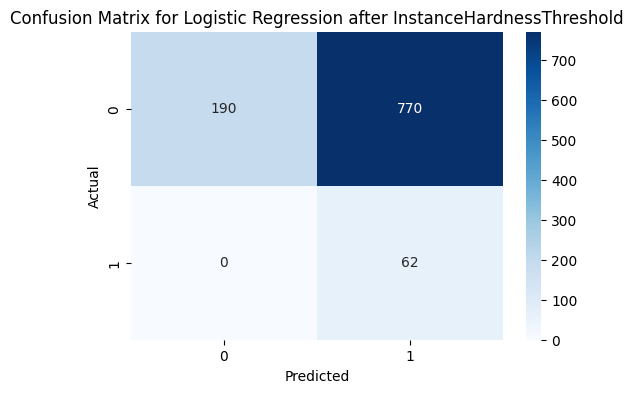


Model: Random Forest after InstanceHardnessThreshold
Accuracy: 0.22896281800391388
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.18      0.30       960
           1       0.07      1.00      0.14        62

    accuracy                           0.23      1022
   macro avg       0.54      0.59      0.22      1022
weighted avg       0.94      0.23      0.29      1022

ROC AUC Score: 0.6823084677419355


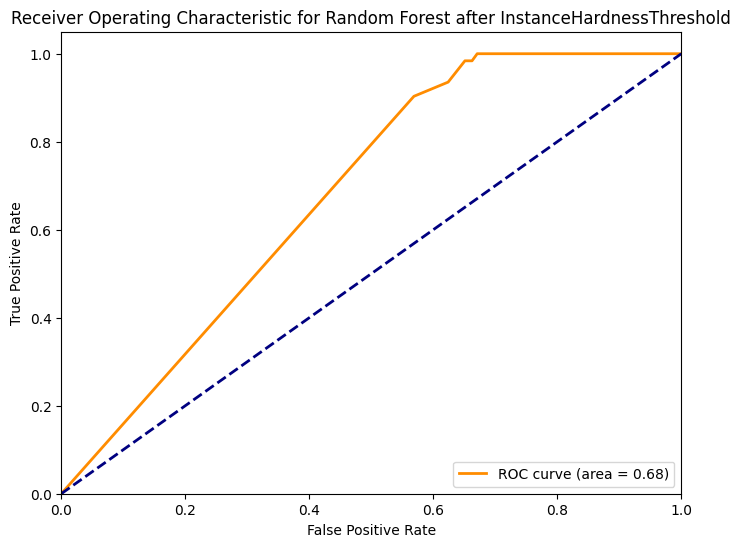

Confusion Matrix:
 [[172 788]
 [  0  62]]


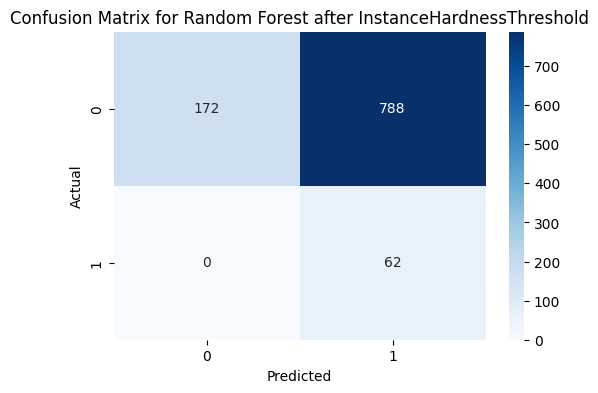


Model: SVM after InstanceHardnessThreshold
Accuracy: 0.24168297455968688
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.19      0.32       960
           1       0.07      1.00      0.14        62

    accuracy                           0.24      1022
   macro avg       0.54      0.60      0.23      1022
weighted avg       0.94      0.24      0.31      1022

ROC AUC Score: 0.6722110215053764


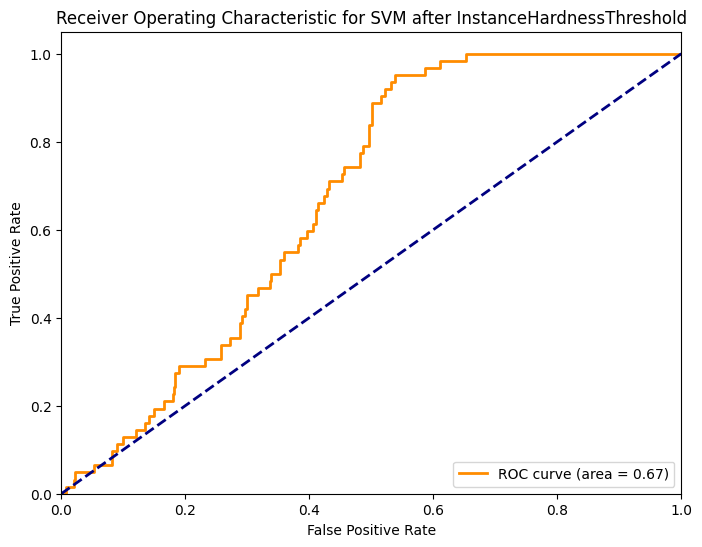

Confusion Matrix:
 [[185 775]
 [  0  62]]


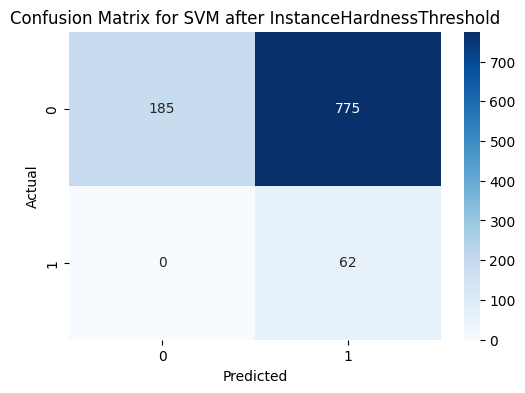


Model: Gradient Boosting after InstanceHardnessThreshold
Accuracy: 0.20939334637964774
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.16      0.27       960
           1       0.07      1.00      0.13        62

    accuracy                           0.21      1022
   macro avg       0.54      0.58      0.20      1022
weighted avg       0.94      0.21      0.26      1022

ROC AUC Score: 0.6273185483870968


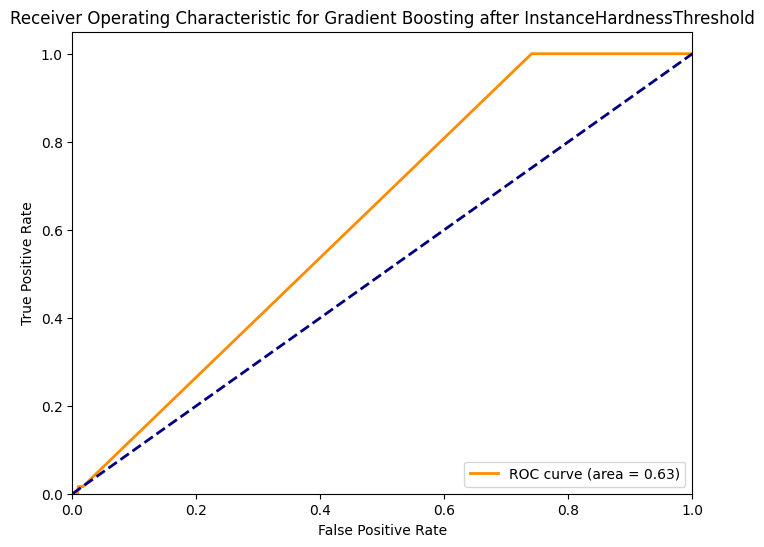

Confusion Matrix:
 [[152 808]
 [  0  62]]


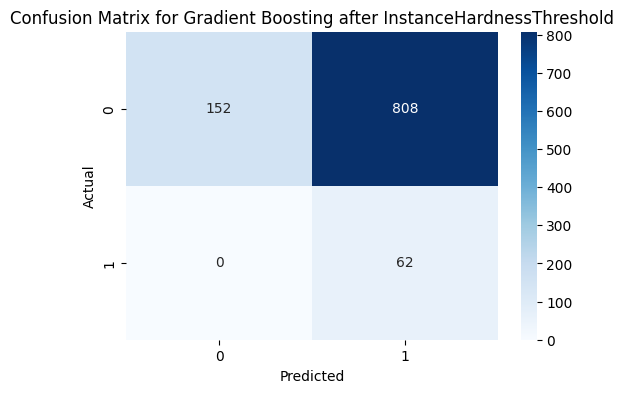


Model: AdaBoost after InstanceHardnessThreshold
Accuracy: 0.19471624266144813
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.14      0.25       960
           1       0.07      1.00      0.13        62

    accuracy                           0.19      1022
   macro avg       0.54      0.57      0.19      1022
weighted avg       0.94      0.19      0.24      1022

ROC AUC Score: 0.5945648521505377


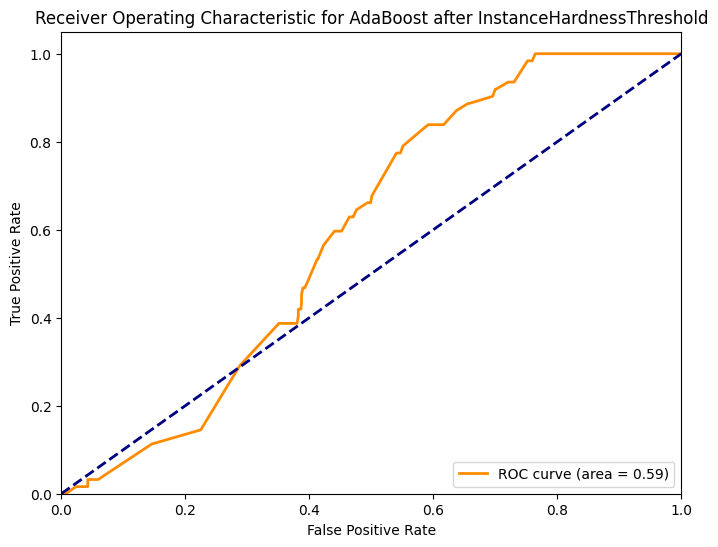

Confusion Matrix:
 [[137 823]
 [  0  62]]


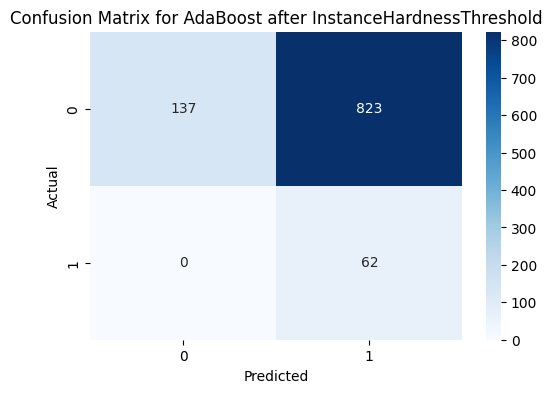


Model: XGBoost after InstanceHardnessThreshold
Accuracy: 0.32093933463796476
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.28      0.43       960
           1       0.08      1.00      0.15        62

    accuracy                           0.32      1022
   macro avg       0.54      0.64      0.29      1022
weighted avg       0.94      0.32      0.42      1022

ROC AUC Score: 0.6774193548387096


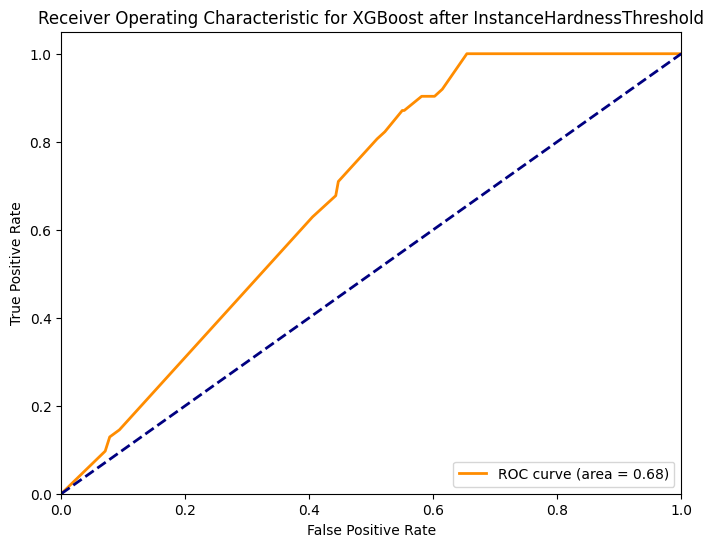

Confusion Matrix:
 [[266 694]
 [  0  62]]


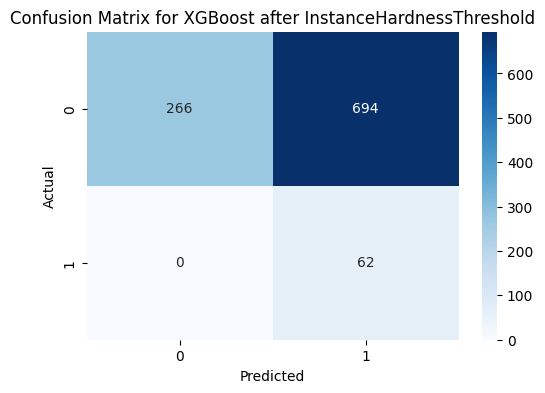

[LightGBM] [Info] Number of positive: 187, number of negative: 187
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 299
[LightGBM] [Info] Number of data points in the train set: 374, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

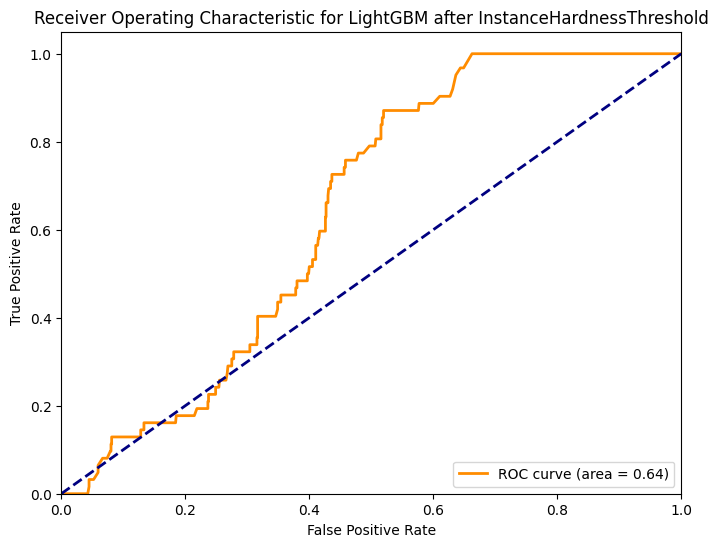

Confusion Matrix:
 [[146 814]
 [  0  62]]


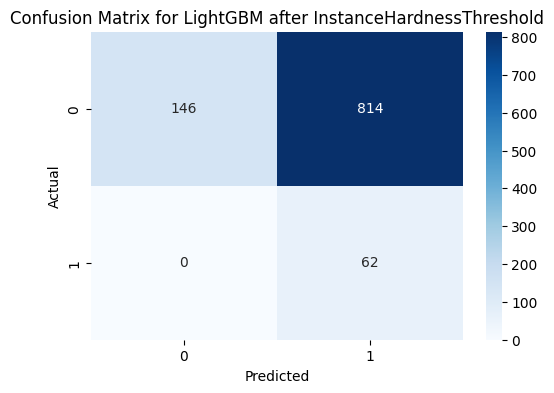


Model: CatBoost after InstanceHardnessThreshold
Accuracy: 0.2054794520547945
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.15      0.27       960
           1       0.07      1.00      0.13        62

    accuracy                           0.21      1022
   macro avg       0.54      0.58      0.20      1022
weighted avg       0.94      0.21      0.26      1022

ROC AUC Score: 0.7304771505376344


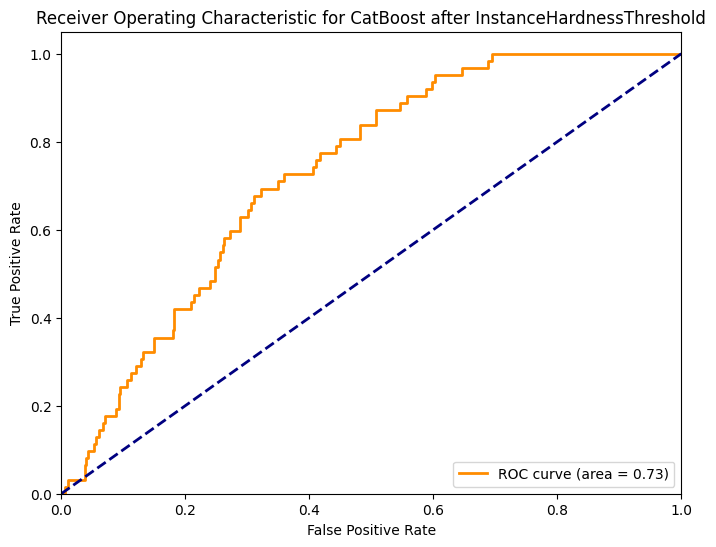

Confusion Matrix:
 [[148 812]
 [  0  62]]


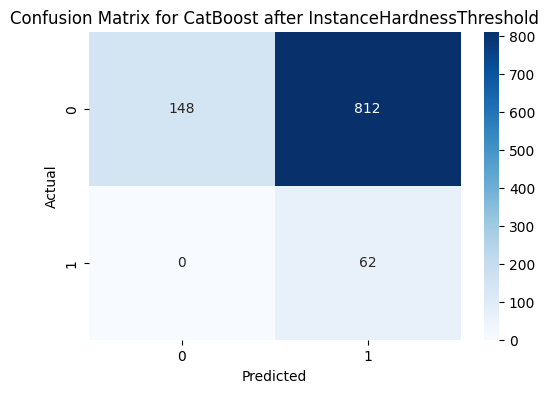


Model: k-Nearest Neighbors after InstanceHardnessThreshold
Accuracy: 0.2759295499021526
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.23      0.37       960
           1       0.08      1.00      0.14        62

    accuracy                           0.28      1022
   macro avg       0.54      0.61      0.26      1022
weighted avg       0.94      0.28      0.36      1022

ROC AUC Score: 0.640625


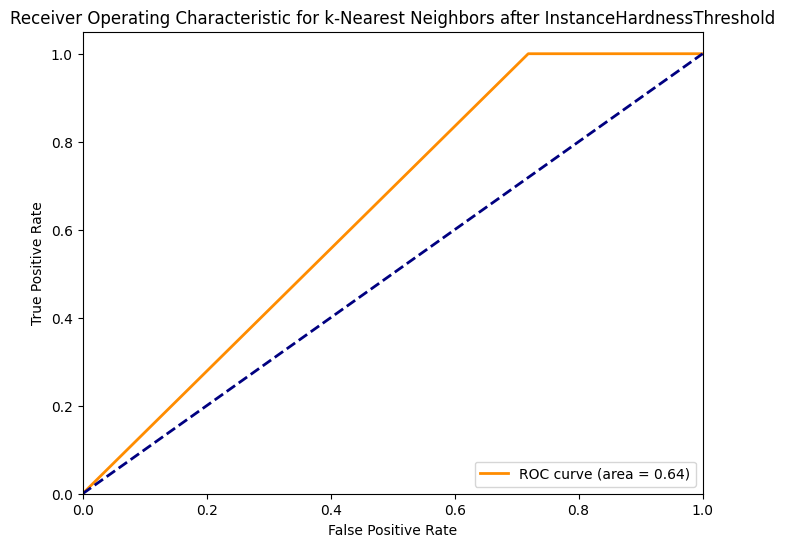

Confusion Matrix:
 [[220 740]
 [  0  62]]


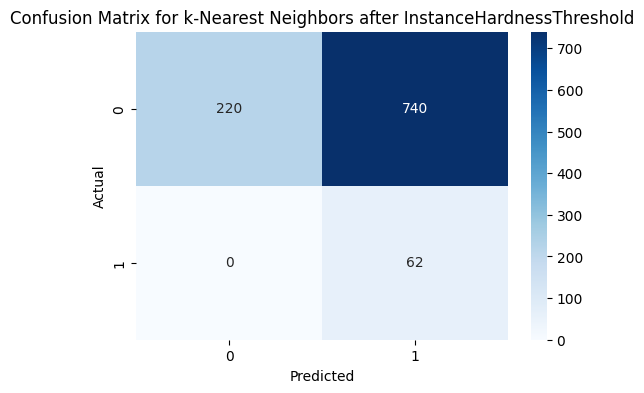


Model: Decision Tree after InstanceHardnessThreshold
Accuracy: 0.19569471624266144
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.14      0.25       960
           1       0.07      1.00      0.13        62

    accuracy                           0.20      1022
   macro avg       0.54      0.57      0.19      1022
weighted avg       0.94      0.20      0.24      1022

ROC AUC Score: 0.571875


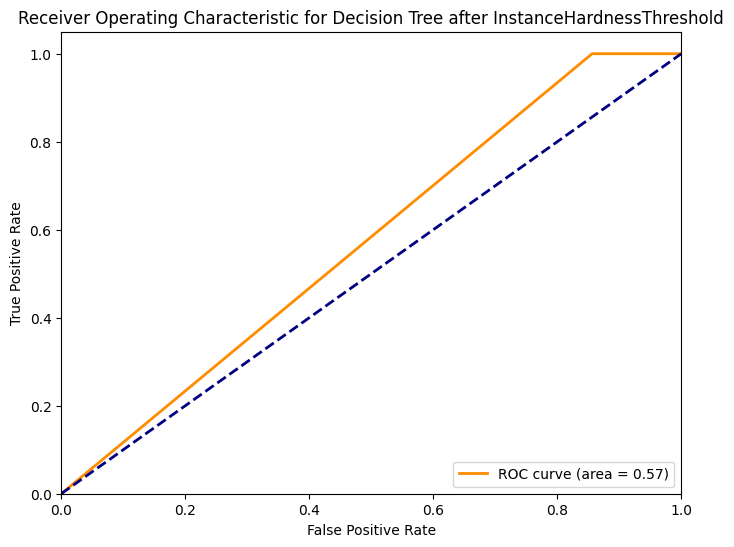

Confusion Matrix:
 [[138 822]
 [  0  62]]


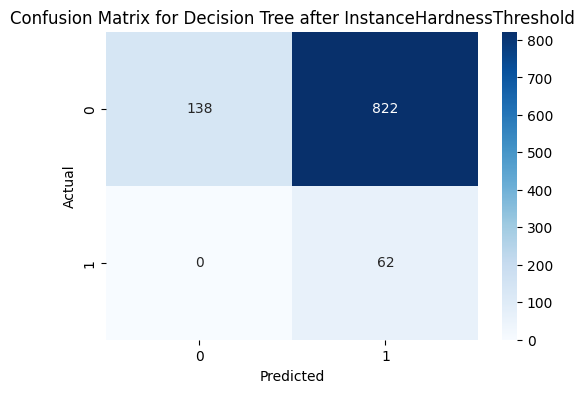


Model: Naive Bayes after InstanceHardnessThreshold
Accuracy: 0.2054794520547945
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.15      0.27       960
           1       0.07      1.00      0.13        62

    accuracy                           0.21      1022
   macro avg       0.54      0.58      0.20      1022
weighted avg       0.94      0.21      0.26      1022

ROC AUC Score: 0.5770833333333334


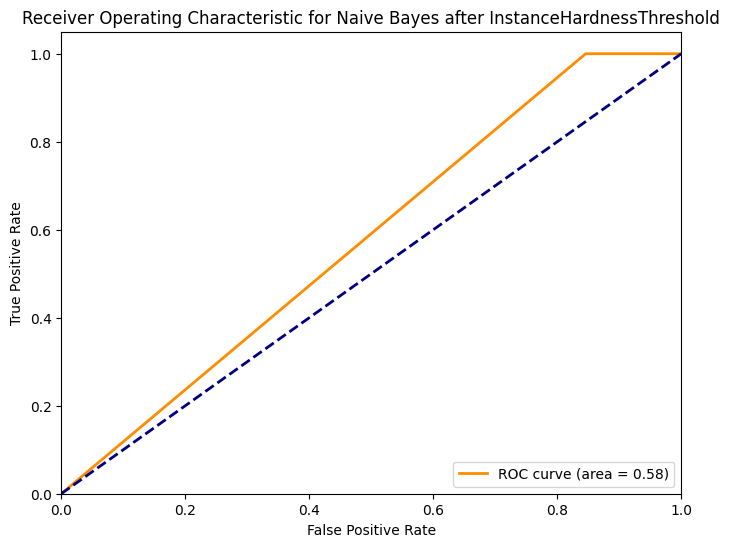

Confusion Matrix:
 [[148 812]
 [  0  62]]


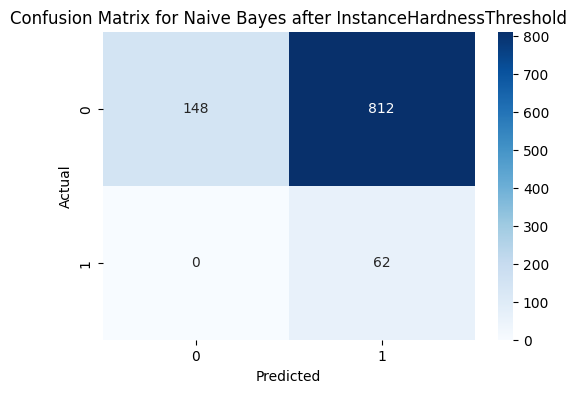


Model: Linear Discriminant Analysis after InstanceHardnessThreshold
Accuracy: 0.3199608610567515
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.28      0.43       960
           1       0.08      1.00      0.15        62

    accuracy                           0.32      1022
   macro avg       0.54      0.64      0.29      1022
weighted avg       0.94      0.32      0.42      1022

ROC AUC Score: 0.7916918682795699


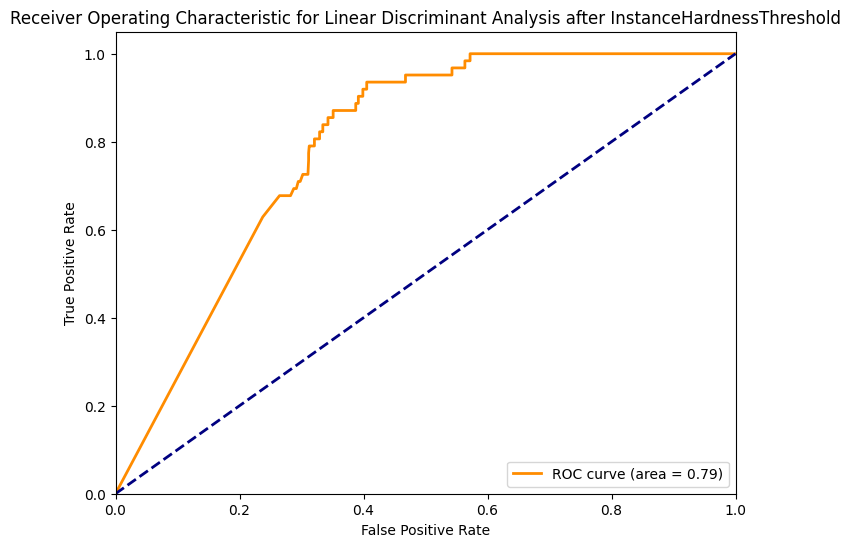

Confusion Matrix:
 [[265 695]
 [  0  62]]


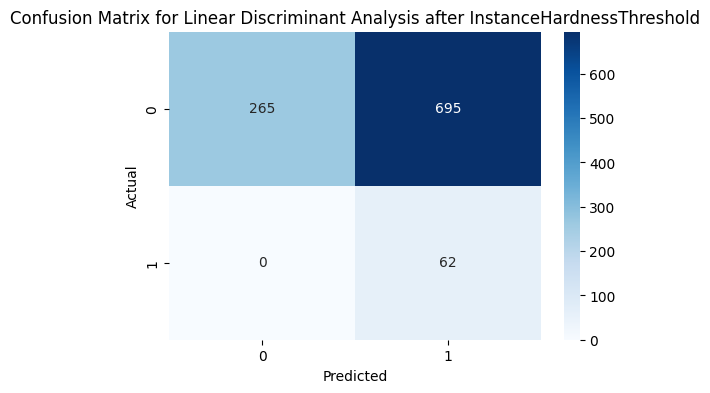


Model: Quadratic Discriminant Analysis after InstanceHardnessThreshold
Accuracy: 0.10078277886497064
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.04      0.08       960
           1       0.06      1.00      0.12        62

    accuracy                           0.10      1022
   macro avg       0.53      0.52      0.10      1022
weighted avg       0.94      0.10      0.08      1022

ROC AUC Score: 0.5244791666666666


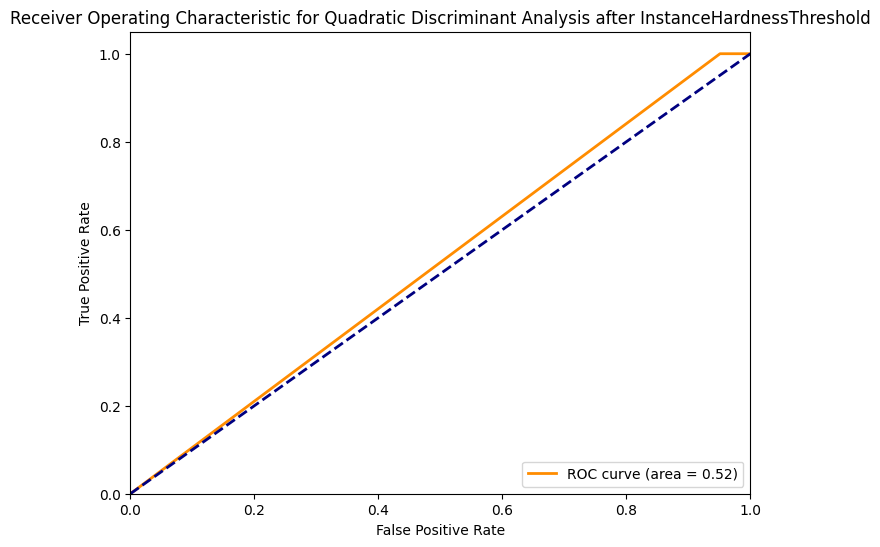

Confusion Matrix:
 [[ 41 919]
 [  0  62]]


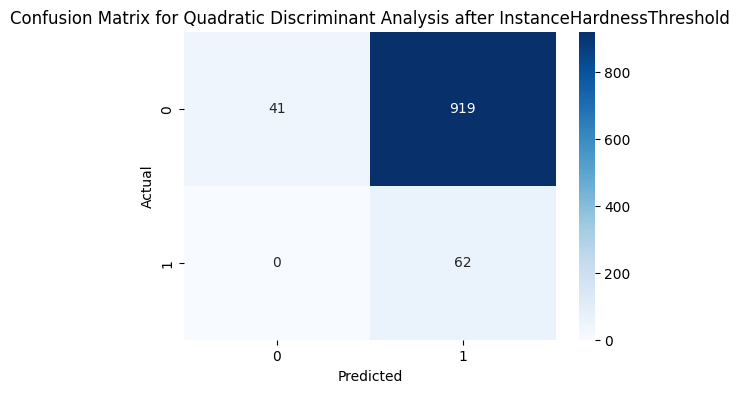


Model: Extra Trees after InstanceHardnessThreshold
Accuracy: 0.21135029354207435
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.16      0.28       960
           1       0.07      1.00      0.13        62

    accuracy                           0.21      1022
   macro avg       0.54      0.58      0.20      1022
weighted avg       0.94      0.21      0.27      1022

ROC AUC Score: 0.722328629032258


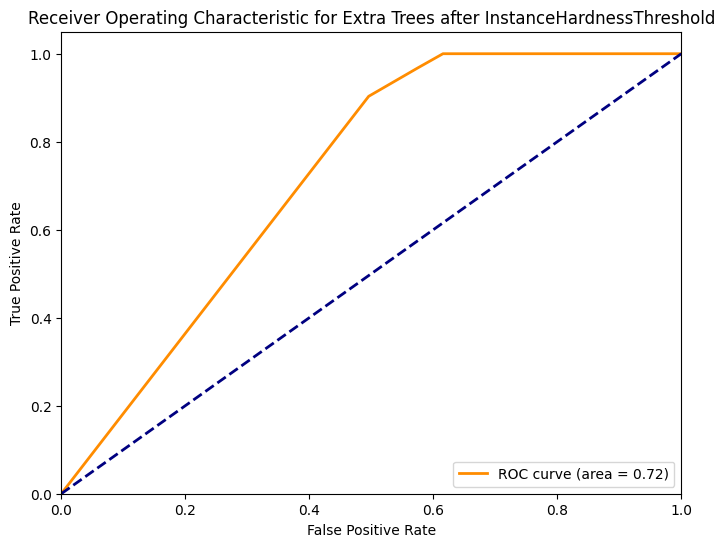

Confusion Matrix:
 [[154 806]
 [  0  62]]


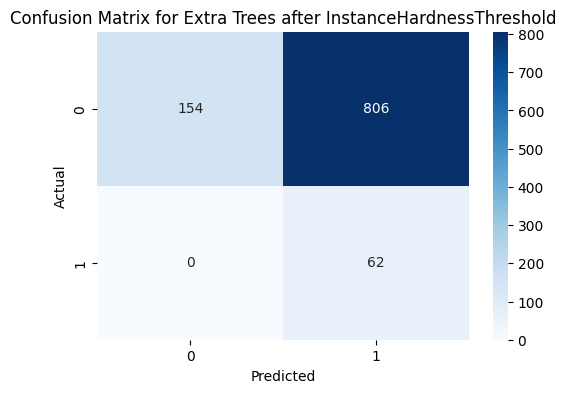

In [38]:

# Apply undersampling techniques, evaluate models, and plot ROC curves
for method_name, method in undersampling_techniques.items():
    print(f"\nApplying {method_name}")
    try:
        X_resampled, y_resampled = method.fit_resample(X_train, y_train)
    except RuntimeError as e:
        print(f"Skipping {method_name} due to error: {e}")
        continue

    for model_name, model in models.items():
        model.fit(X_resampled, y_resampled)
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

        print(f"\nModel: {model_name} after {method_name}")
        print("Accuracy:", accuracy_score(y_test, y_pred))
        print("Classification Report:\n", classification_report(y_test, y_pred))
        if y_pred_proba is not None:
            print("ROC AUC Score:", roc_auc_score(y_test, y_pred_proba))
            fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
            roc_auc = auc(fpr, tpr)
            plt.figure(figsize=(8, 6))
            plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic for {model_name} after {method_name}')
            plt.legend(loc="lower right")
            plt.show()

        print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
        plt.figure(figsize=(6, 4))
        sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
        plt.title(f'Confusion Matrix for {model_name} after {method_name}')
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()